# Density Profile Fitting

Important thing to do: Once we have finished up the paper, delete all irrelevant cells and make it so that you can run the entire notebook and reproduce all of the relevant figures.

## Data load-in and preprocessing

Goal: once we fit a model, we will go back to our C++ code and do our orbit integrations using the trained model to describe the profile evolution.

In [1]:
import numpy as np
%matplotlib inline
%xmode Verbose
#Context
import sys
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import seaborn as sns
import pandas as pd
from pathlib import Path
from useful_functions.plotter import plot, loglogplot
from scipy.optimize import ridder, fsolve, leastsq, root, minimize, curve_fit, basinhopping
import scipy.integrate as integrate
from numba import jit, njit, prange
from matplotlib.ticker import MultipleLocator
import emcee
from scipy.optimize import root_scalar
from scipy.interpolate import interp1d, InterpolatedUnivariateSpline
from scipy.integrate import quad
from multiprocessing import Pool
#from matplotlib2tikz import save as save_tikz
from matplotlib import animation, rc
from IPython.display import HTML
from os.path import expanduser

Exception reporting mode: Verbose


In [2]:
home_dir = Path(expanduser('~'))

In [3]:
fig_dir = home_dir / 'Drive/Research/substructure/tidal_evolution/'

In [4]:
#write a function that will generate a plot of the bound fraction and density profile evolution given the param sets
def plot_fb_rho(ch_num, cs_num, xc_num, eta_num, normalize=False,by_iso=False):
    direct = dash_root / ch_dirs[ch_num] / cs_dirs[cs_num] / xc_dirs[xc_num] / eta_dirs[eta_num]
    pf_fn = direct / 'radprof_rho.txt'
    sh_evo_fn = direct / 'subhalo_evo.txt'
    if(Path(pf_fn).is_file()):
        sim_dat = load_sim(direct,cs_num,False,normalize,by_iso) #keep all timesteps
        fig, ax = plot()
        plt.plot(times[0:sim_dat.shape[0]],sim_dat[:,0])
        plt.xlabel('$t$ (Gyr)')
        plt.ylabel('$f_b$')
        fig, ax = loglogplot()
        plt.xlabel(r'$r/r_\textrm{s,0}$')
        plt.ylabel(r'$\rho(r) / \rho(r,t=0)$')
        plt.title('Subhalo with $c_h$=%.2f, $c_s$=%.2f, $x_c$=%.2f, $\eta$=%.2f' %(ch_vals[ch_num], cs_vals[cs_num], xc_vals[xc_num], eta_vals[eta_num]))
        plt.xlim(np.min(radii*cs_vals[cs_num]),cs_vals[cs_num])
        plt.ylim(10**-1,2.)
        for i in range(0,sim_dat.shape[0]):
            plt.plot(radii*cs_vals[cs_num],sim_dat[i,1:] / sim_dat[0,1:],color=cols[i])
        
    else:
        print("No simulation run here yet!")
    
    return fig, ax
        
def plot_fb_rho_iso(cs_num):
    direct = iso_root / cs_dirs[cs_num]
    pf_fn = direct / 'radprof_rho.txt'
    sh_evo_fn = direct / 'subhalo_evo.txt'
    if(Path(pf_fn).is_file()):
        sim_dat = load_sim(direct,cs_num,False,normalize=False) #keep all timesteps, don't throw out near pericenter
        fig, ax = plot()
        plt.plot(times[0:sim_dat.shape[0]],sim_dat[:,0])
        plt.xlabel('$t$ (Gyr)')
        plt.ylabel('$f_b$')
        fig, ax = loglogplot()
        plt.xlabel(r'$r/r_\textrm{s,0}$')
        plt.ylabel(r'$\rho(r) / \rho(r,t=0)$')
        #plt.xlim(0.8*1.122E-3*cs_vals[cs_num],1.2*cs_vals[cs_num])
        plt.xlim(np.min(radii*cs_vals[cs_num]),cs_vals[cs_num])
        plt.axhline(1., zorder=30)
        plt.ylim(10**-1,2.)
        plt.title('Isolated Subhalo with $c_s=$%.2f \nBright to Dark represents Time Evolution' % cs_vals[cs_num])
        for i in range(0,sim_dat.shape[0]):
            plt.plot(radii*cs_vals[cs_num],sim_dat[i,1:] / sim_dat[0,1:],color=cols[i])
        plt.savefig('isolated_subhalo_cs%.2f.pdf' % cs_vals[cs_num],bbox_inches='tight')
        
    else:
        print("No simulation run here yet!")

### Looking at isolated subhalos

In [5]:
# plot for Frank

frank_enc_mass = np.loadtxt('/home/sbg/Downloads/enclosed_mass_5.dat')
frank_dens1 = np.loadtxt('/home/sbg/Downloads/res_1.00000')
frank_dens2 = np.loadtxt('/home/sbg/Downloads/res_1.50000')
nfw_analytical = np.loadtxt('/home/sbg/Downloads/NFWanalytical.dat')
prof_count = frank_enc_mass.shape[1]-1
fig,ax = plot()
for i in range(0,prof_count):
    plt.plot(frank_enc_mass[:,0],frank_enc_mass[:,i+1])
    
fig,ax = plot()
plt.plot(np.log10(frank_dens1[:,3]),np.log10(frank_dens1[:,8]),label='0')
plt.plot(np.log10(frank_dens2[:,3]),np.log10(frank_dens2[:,8]),label='30')
plt.plot(nfw_analytical[:,1],np.log10(nfw_analytical[:,2]),label='NFW')
plt.legend()

#logr in second colun, rho in third column

OSError: /home/sbg/Downloads/enclosed_mass_5.dat not found.

In [ ]:
plot_fb_rho_iso(5)

In [ ]:
plot_fb_rho(2, 5, 5, 10, normalize=False,by_iso=False)

In [ ]:
def load_enc_mass(directory,cs_num):
    prof_dat = np.loadtxt(directory+'radprof_m.txt')[1:,1:] #radii are in 0th and same for all
    sh_dat = np.loadtxt(directory+'subhalo_evo.txt')
    return(np.column_stack((sh_dat[:,7],prof_dat)))

def load_sigmar_prof(directory,cs_num):
    prof_dat = np.loadtxt(directory+'radprof_sigmar.txt')[1:,1:] #radii are in 0th and same for all
    sh_dat = np.loadtxt(directory+'subhalo_evo.txt')
    return(np.column_stack((sh_dat[:,7],prof_dat)))

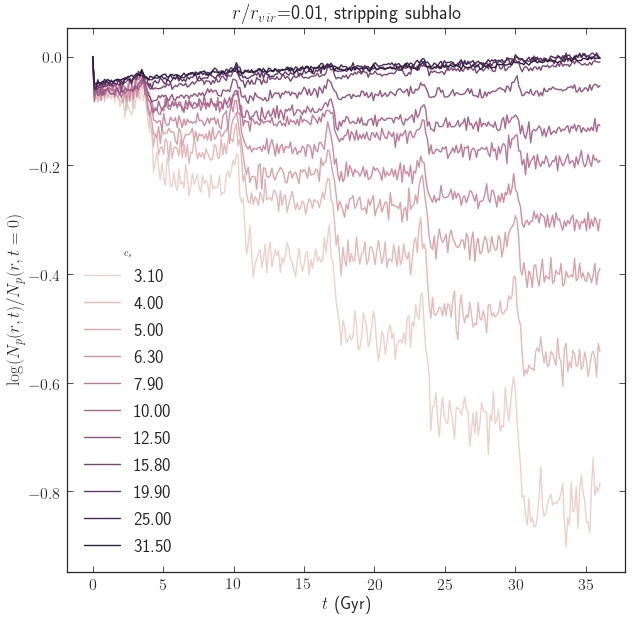

In [1240]:
fig,ax = plot(figsize=(10,10))
rn=10
for cn in range(0,11):
    testdat = load_enc_mass(dash_root + ch_dirs[2] + cs_dirs[cn] + xc_dirs[5] + eta_dirs[5],cn)
    colorss = sns.cubehelix_palette(11)
    plt.plot(times,np.log10(testdat[:,1+rn] / testdat[0,1+rn]), color=colorss[cn], label='%.2f' % cs_vals[cn])
plt.ylabel(r'$\log(N_p (r,t) / N_p(r,t=0)$')
plt.xlabel(r'$t$ (Gyr)')
plt.title(r'$r/r_{vir}$=%.2f, stripping subhalo' % mass_prof_radii[rn])
plt.legend(title='$c_s$',fontsize=18)

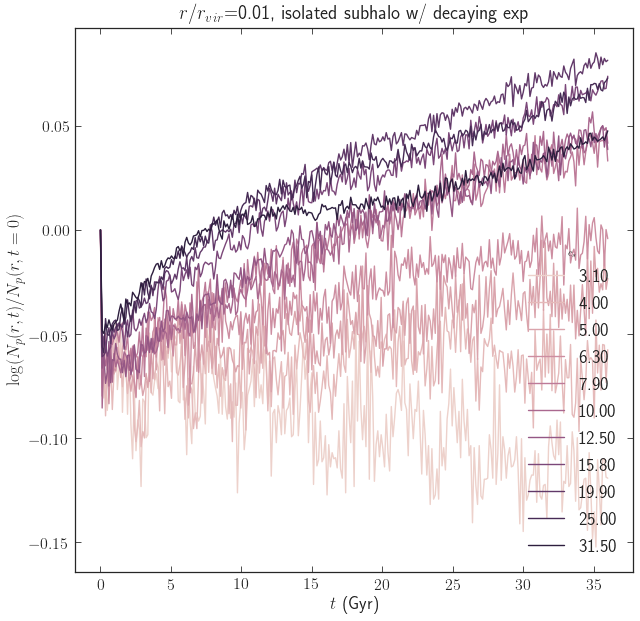

In [1237]:
fig,ax = plot(figsize=(10,10))
rn=10
for cn in range(0,11):
    testdat = load_enc_mass(iso_root+cs_dirs[cn],cn)
    colorss = sns.cubehelix_palette(11)
    plt.plot(times,np.log10(testdat[:,1+rn] / testdat[0,1+rn]), color=colorss[cn], label='%.2f' % cs_vals[cn])
plt.ylabel(r'$\log(N_p (r,t) / N_p(r,t=0)$')
plt.xlabel(r'$t$ (Gyr)')
plt.title(r'$r/r_{vir}$=%.2f, isolated subhalo w/ decaying exp' % mass_prof_radii[rn])
plt.legend(title='$c_s$',fontsize=18)

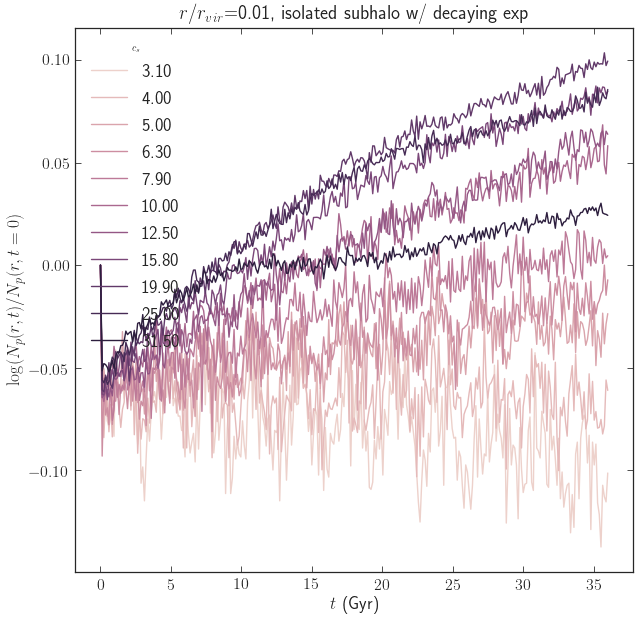

In [1236]:
fig,ax = plot(figsize=(10,10))
rn=10
for cn in range(0,11):
    testdat = load_enc_mass(iso_dec_root+cs_dirs[cn],cn)
    colorss = sns.cubehelix_palette(11)
    plt.plot(times,np.log10(testdat[:,1+rn] / testdat[0,1+rn]), color=colorss[cn], label='%.2f' % cs_vals[cn])
plt.ylabel(r'$\log(N_p (r,t) / N_p(r,t=0)$')
plt.xlabel(r'$t$ (Gyr)')
plt.title(r'$r/r_{vir}$=%.2f, isolated subhalo w/ decaying exp' % mass_prof_radii[rn])
plt.legend(title='$c_s$',fontsize=18)

Text(20, -2.61, '$r/r_\\textrm{vir,s}=0.010$')

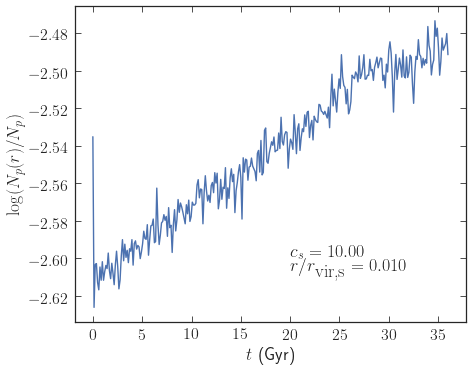

In [1057]:
fig,ax = plot()
rn=9
cn=5
testdat = load_enc_mass(iso_root+cs_dirs[cn],5)
plt.plot(times,np.log10(testdat[:,1+rn]))
plt.ylabel(r'$\log(N_p (r) / N_p)$')
plt.xlabel(r'$t$ (Gyr)')
ax.text(20,-2.60, r'$c_s=%.2f$' %cs_vals[cn],fontsize=18)
ax.text(20,-2.61, r'$r/r_\textrm{vir,s}=%.3f$' %mass_prof_radii[rn],fontsize=18)

Text(20, -2.61, '$r/r_\\textrm{vir,s}=0.010$')

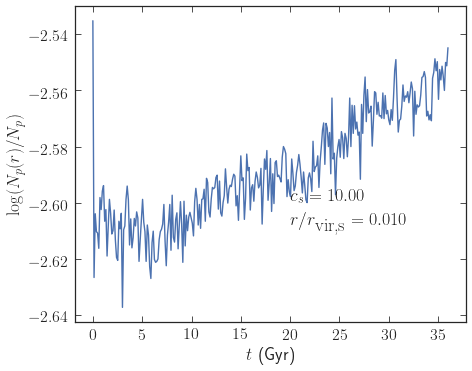

In [1058]:
#is this same behavior present in the non-isolated subhalos?
fig,ax = plot()
rn=9
cn=5
testdat = load_enc_mass(dash_root + ch_dirs[2] + cs_dirs[cn] + xc_dirs[5] + eta_dirs[10],cn)
plt.plot(times,np.log10(testdat[:,1+rn]))
plt.ylabel(r'$\log(N_p (r) / N_p)$')
plt.xlabel(r'$t$ (Gyr)')
ax.text(20,-2.60, r'$c_s=%.2f$' %cs_vals[cn],fontsize=18)
ax.text(20,-2.61, r'$r/r_\textrm{vir,s}=%.3f$' %mass_prof_radii[rn],fontsize=18)

#same thing happens for a circular orbit in a host halo...

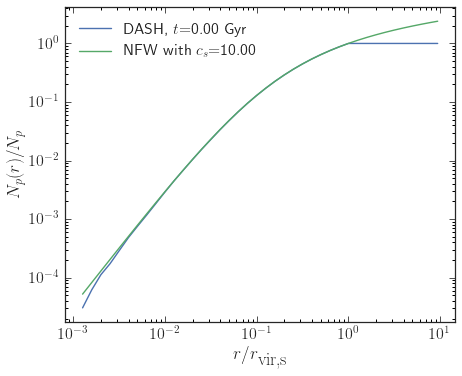

In [1059]:
fig,ax = loglogplot()
rn=9
cn=5
tn=0
testdat = load_enc_mass(iso_root + cs_dirs[cn],cn)

nfw_masses = np.zeros(len(mass_prof_radii))

for i in range(0,len(nfw_masses)):
    nfw_masses[i] = NFWmass(mass_prof_radii[i],cs_vals[cn])
plt.plot(mass_prof_radii,testdat[tn,1:], label=r'DASH, $t$=%.2f Gyr'% times[tn])
plt.plot(mass_prof_radii,nfw_masses, label = 'NFW with $c_s$=%.2f' % cs_vals[cn])
plt.ylabel(r'$N_p (r) / N_p$')
plt.xlabel(r'$r/r_\textrm{vir,s}$')
plt.legend()

[6.55071747e+00 4.30732182e+00 4.39638731e+00 3.38003181e+00
 4.11160539e+00 4.35658237e+00 3.98895774e+00 3.93081875e+00
 4.08424251e+00 4.23151227e+00 4.22737242e+00 4.08458147e+00
 4.10920618e+00 4.11018978e+00 4.03021932e+00 4.13917132e+00
 4.09980986e+00 4.13010636e+00 4.12933323e+00 4.08958429e+00
 4.10277220e+00 4.11860456e+00 4.08542088e+00 4.11235699e+00
 4.10644237e+00 4.11814908e+00 4.10417009e+00 4.11171356e+00
 4.11240263e+00 4.09730358e+00 1.44180410e-03 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]


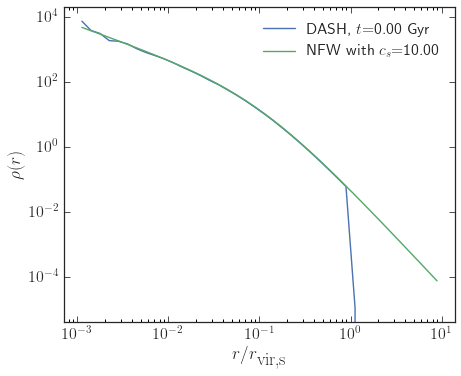

In [1060]:
fig,ax = loglogplot()
rn=9
cn=5
tn=0
testdat = load_sim(iso_root + cs_dirs[cn],cn, False, False)

nfw_densities = np.zeros(len(radii))

for i in range(0,len(nfw_masses)):
    nfw_densities[i] = NFWrho(radii[i],cs_vals[cn])
plt.plot(radii,testdat[tn,1:]*rho200_0, label=r'DASH, $t$=%.2f Gyr'% times[tn])
plt.plot(radii,nfw_densities, label = 'NFW with $c_s$=%.2f' % cs_vals[cn]) #how are the radii calculated?
plt.ylabel(r'$\rho(r)$')
plt.xlabel(r'$r/r_\textrm{vir,s}$')
plt.legend()
print(testdat[tn,1:]/nfw_densities)

In [1061]:
#make sure that we can integrate the density out to the virial radius and get 1...

#compute volumes
#rds = np.append(radii,10.)
#test_shell_vols = 4.0*np.pi / 3.0 * (rds[1:]**3 - rds[:-1]**3)
np.sum(testdat[tn,1:]*shell_vols) * rho200_0 #spot on! within 1%

0.9927315224466738

[-2.18284970e-05 -2.06189476e-05 -1.76879396e-05 -3.14303571e-05
 -3.22500323e-05 -2.26716608e-05 -3.30184498e-05 -5.51699052e-05
 -6.38937165e-05 -3.97858066e-05 -4.14271784e-06 -3.18335481e-05
 -5.01102609e-05 -7.27822279e-05 -2.46485418e-04 -2.04477188e-04
 -2.77363017e-04 -2.15015269e-04 -1.20210726e-04 -3.09945730e-04
 -3.87983745e-04 -2.57322237e-04 -5.92921925e-04 -4.82857999e-04
 -4.66362408e-04 -1.71811251e-04 -1.96567741e-04 -1.84851751e-05
  1.88581319e-04 -5.70757437e-05 -1.30359284e-01 -2.65213395e-01
 -4.03816015e-01 -5.45509497e-01 -6.89732515e-01 -8.36013615e-01
 -9.83961205e-01 -1.13325304e+00 -1.28362579e+00 -1.39698441e+00]


Text(0.5, 1.0, '$t$=0.00 Gyr, $c_s$=10.00')

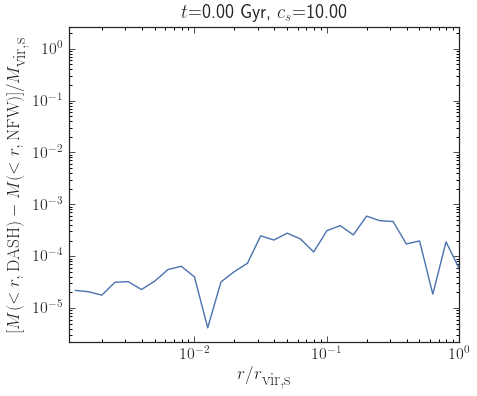

In [1062]:
fig,ax = loglogplot()
#fig,ax=loglogplot()
rn=9
cn=5
tn=0
#testdat = load_enc_mass(dash_root + ch_dirs[2] + cs_dirs[cn] + xc_dirs[5] + eta_dirs[10],cn)
testdat = load_enc_mass(iso_root + cs_dirs[cn],cn)
nfw_masses = np.zeros(len(mass_prof_radii))
for i in range(0,len(nfw_masses)):
    nfw_masses[i] = NFWmass(mass_prof_radii[i],cs_vals[cn])
plt.plot(mass_prof_radii,np.abs(testdat[tn,1:]-nfw_masses))
print(testdat[tn,1:]-nfw_masses)
#plt.plot(radii,nfw_masses, label = 'NFW with $c_s$=%.2f' % cs_vals[cn])
plt.ylabel(r'$[M(<r, \textrm{DASH}) - M(<r, \textrm{NFW})] / M_\textrm{vir,s}$')
plt.xlabel(r'$r/r_\textrm{vir,s}$')
plt.xlim(np.min(radii),1)
#plt.ylim(-.2,.2)
plt.title(r'$t$=%.2f Gyr, $c_s$=%.2f'% (times[tn], cs_vals[cn]))

Text(0.5, 1.0, '$c_s$=31.50, radial bins increase light to dark \\\\ isolated with decaying exp')

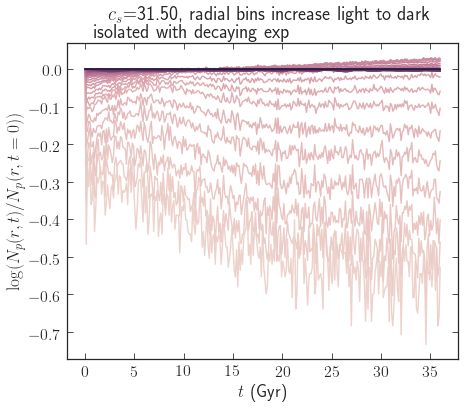

In [1210]:
fig,ax = plot()
cn=10
testdat = load_enc_mass(iso_dec_root + cs_dirs[cn],cn)
colorss = sns.cubehelix_palette(testdat.shape[1] - 1)
for i in range(0,len(mass_prof_radii)):
    plt.plot(times,np.log10(testdat[:,1+i] / testdat[0,1+i]), color = colorss[i])
plt.ylabel(r'$\log(N_p(r,t)/N_p(r,t=0))$')
plt.xlabel(r'$t$ (Gyr)')
plt.title(r'$c_s$=%.2f, radial bins increase light to dark \\ isolated with decaying exp'% (cs_vals[cn]))

Text(0.5, 1.0, '$c_s$=31.50, radial bins increase light to dark \\\\ isolated with hard truncation')

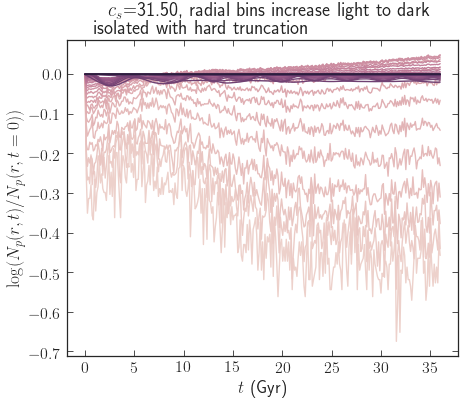

In [1211]:
fig,ax = plot()
cn=10
testdat = load_enc_mass(iso_root + cs_dirs[cn],cn)
colorss = sns.cubehelix_palette(testdat.shape[1] - 1)
for i in range(0,len(mass_prof_radii)):
    plt.plot(times,np.log10(testdat[:,1+i] / testdat[0,1+i]), color = colorss[i])
plt.ylabel(r'$\log(N_p(r,t)/N_p(r,t=0))$')
plt.xlabel(r'$t$ (Gyr)')
plt.title(r'$c_s$=%.2f, radial bins increase light to dark \\ isolated with hard truncation'% (cs_vals[cn]))

In [48]:
def NFWrho(r, cs):  # in units where Rvir=1, so r_s = 1/c_s
    rhos = (4*np.pi * cs**-3 * NFWf(cs))**-1  # this factor drops out...
    return rhos / ((r*cs)*(1. + r*cs)**2)


def NFWmass(r, cs):
    return 4*np.pi*quad(lambda x: x**2 * NFWrho(x, cs), 0, r)[0]

#beta=0 in these isolated halos
def NFWsigmar(r,beta,cs):
    val = (r**(-2*beta) / NFWrho(r,cs)) * quad(lambda x: NFWrho(x,cs)*NFWmass(x,cs) * x**(2*beta - 2),r,np.inf)[0]
    return np.sqrt(val)

def plot_iso_evolution():
    cs_num = [0,2,5,8,10]
    rad_num = [10, 14, 17, 29] #.011, .028, .056, 0.89 x rvir
    print(radii[rad_num])
    fig, ax = plt.subplots(nrows=3,ncols=5,figsize=(20,16))
    for i,csn in enumerate(cs_num):
        direct = iso_root + cs_dirs[csn]
        pf_fn = direct + 'radprof_rho.txt'
        sh_evo_fn = direct + 'subhalo_evo.txt'
        if(Path(pf_fn).is_file()):
            sim_dat = load_sim(direct,csn,False,normalize=False) #keep all timesteps, don't throw out near pericenter
            ax[0,i].set_title(r'$c_s=%.2f$' %cs_vals[csn])
            ax[1,i].set_xlim(-2.5,1.5)
            for k in range(0,3):
                ax[k,i].yaxis.set_ticks_position('both')
                ax[k,i].xaxis.set_ticks_position('both')
                ax[k,i].tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)
            ax[1,i].axvline(np.log10(sim_eps*cs_vals[csn]),color='k',linestyle='dotted')
            
            #for transfer functions
            #ax[1,i].plot(np.log10(radii[:30]*cs_vals[csn]),np.log10(sim_dat[300,1:31] / sim_dat[0,1:31]))
            #ax[1,i].axhline(0.,color='k')
            #ax[1,i].set_ylim(-0.8,0.15)
            
            #for density profiles
            ax[1,i].plot(np.log10(radii[:30]*cs_vals[csn]),np.log10(sim_dat[300,1:31] * rho200_0))
            analytic_dens = np.zeros(len(radii[:30]))
            for j in range(0,len(analytic_dens)):
                analytic_dens[j] = NFWrho(radii[j], cs_vals[csn])
            ax[1,i].plot(np.log10(radii[:30]*cs_vals[csn]),np.log10(analytic_dens))
            ax[1,i].set_ylim(-1.9,4.5)
            
            ax[0,i].set_ylim(-3.3,0.2)
            mass_dat = load_enc_mass(direct,csn)
            for j in range(0,len(rad_num)):
                ax[0,i].plot(times, np.log10(mass_dat[:,1+rad_num[j]]), label='%.3f' % mass_prof_radii[rad_num[j]])
                ax[0,i].axhline(np.log10(NFWmass(mass_prof_radii[rad_num[j]], cs_vals[csn])),color='k')
                
            sigmar_dat = load_sigmar_prof(direct,csn)
            #ax[2,i].plot(np.log10(radii[:30]*cs_vals[csn]),sigmar_dat[300,1:31])
            ax[2,i].plot(np.log10(radii[:30]*cs_vals[csn]),sigmar_dat[0,1:31])
            ax[2,i].set_xlim(-2.5,1.5)
            ax[2,i].set_ylim(0.1,1.1)
            ax[2,i].axvline(np.log10(sim_eps*cs_vals[csn]),color='k',linestyle='dotted')
            #ax[2,i].plot(np.log10(radii[:30]*cs_vals[csn]),np.log10(sigmar_dat[0,1:31]))
            analytic_sigmar = np.zeros(len(radii[:30]))
            for j in range(0, len(analytic_sigmar)):
                analytic_sigmar[j] = NFWsigmar(radii[j], 0., cs_vals[csn])
            ax[2,i].plot(np.log10(radii[:30]*cs_vals[csn]),analytic_sigmar)
            #ax[0,i].axhline(np.log10(NFWmass(radii[rad_num[j]], cs_vals[csn])),color='k')
            
    ax[1,2].set_xlabel(r'$\log(r / r_\textrm{s,0})$')
    ax[1,4].text(-0.5,-0.7,'$t=36$ Gyr',fontsize=18)
    ax[0,2].set_xlabel(r'$t$ (Gyr)')
    #ax[1,0].set_ylabel(r'$\log(\rho(r,t=36\,\textrm{Gyr}) / \rho(r,t=0))$')
    ax[1,0].set_ylabel(r'$\log(\rho(r,t=36\,\textrm{Gyr}))$')
    ax[0,0].set_ylabel(r'$\log(N_p (r) / N_p)$')
    ax[2,0].set_ylabel(r'$\sigma_r(r) / V_{vir,s}$')
    ax[2,2].set_xlabel(r'$\log(r / r_\textrm{s,0})$')
    #ax[2,4].text(-0.2,0.2,'$t=36$ Gyr',fontsize=18)
    ax[2,4].text(-0.2,0.2,'$t=0$ Gyr',fontsize=18)
    ax[0,4].legend(title=r'$r/r_\textrm{vir,s}$', ncol=2,fontsize=14)

[0.01122018 0.02818383 0.05623413 0.8912509 ]


/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:39: RuntimeWarning: divide by zero encountered in log10


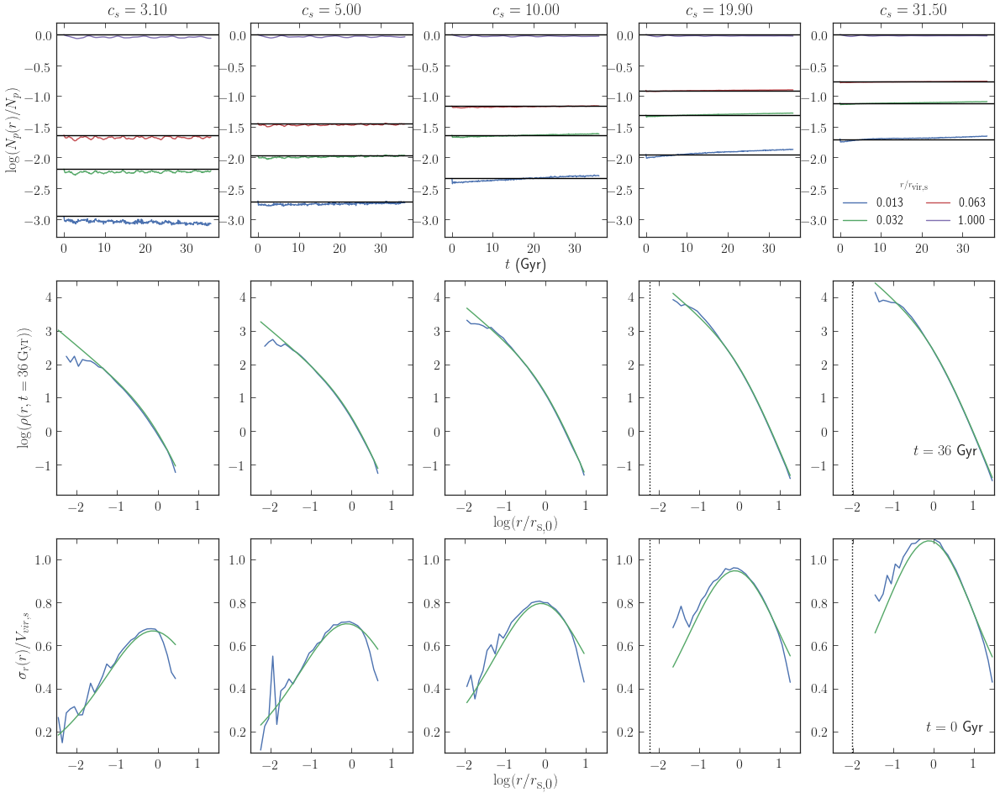

In [1244]:
plot_iso_evolution()

### Back to loading in

In [5]:
dash_root = home_dir / 'new_DASH/'
iso_root = dash_root / 'iso/'
iso_dec_root = dash_root / 'iso_exp_dec/'
ic_dir = dash_root / 'ic/'
eta_vals = np.linspace(0,1,11)
xc_vals = np.logspace(np.log10(0.5),np.log10(2.0),11)
cs_vals = np.around(np.logspace(np.log10(3.149),np.log10(31.5),11),1)
ch_vals = np.around(np.logspace(np.log10(3.149),np.log10(31.5),11),1)
#3.1,4.0,5.0,6.3,7.9,10.0,12.5,15.8,19.9,25.0,31.5
eta_dirs = []
ch_dirs = []
cs_dirs = []
xc_dirs = []
for i in range(0,11):
    eta_dirs.extend(['eta%d/' %i])
    xc_dirs.extend(['xc%d/' %i])
    ch_dirs.extend(['ch%d/' %i])
    cs_dirs.extend(['cs%d/' %i])

In [6]:
#make directories
#loop over them and store the relevant values
dr = []
for i in range(0,11):
    for j in range(0,11):
        for k in range(0,11):
            for l in range(0,11):
                dr.extend([dash_root / ch_dirs[i] / cs_dirs[j] / xc_dirs[k] / eta_dirs[l]])

In [7]:
#relevant constants for the sim
Npart = 1048576.
rho200_0 = 1.0 / (4.0 * np.pi / 3.0) #0.237 #in model units (its 0.2387.. so we get H=0.1) (it's really 1.0 / (4.0 * pi / 3.0))
#this value normalizes things such that rho200_0 * (rho/rho_200) * V_shell = 1, and m_p = 1./Npart
mp = 1. / Npart #particle mass
Ncrit = 1280. #from Ncrit = 80*Nb**0.2 (t=0)
sim_eps = 0.0003 #in units of r_vir,s
G=1

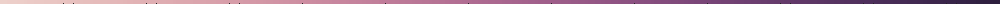

In [8]:
timesteps = 301
nsims = 11**4
times = np.linspace(0,36,timesteps) * 1. / 1.44 #converted from Gyr to model units
delta_t = times[1] - times[0]
outermost_radius = 10. #in units of Rvir
innermost_radius = 10**-3
#the following radii are those used for the density profile (and velocity dispersion)
radii = np.loadtxt(dash_root / ch_dirs[0] / cs_dirs[10] / xc_dirs[5] / eta_dirs[5] / 'radprof_rho.txt')[0,1:]
mass_prof_radii = 10**((np.log10(radii[1:]) + np.log10(radii[:-1])) / 2.)
mass_prof_radii = np.append(mass_prof_radii, outermost_radius)
shell_vols = 4.0*np.pi / 3.0 * (mass_prof_radii[1:]**3 - mass_prof_radii[:-1]**3)
shell_vols = np.insert(shell_vols, 0, 4.0*np.pi / 3.0 * (mass_prof_radii[0]**3 - innermost_radius**3))
n_profile_pts = len(radii)
sns.palplot(sns.cubehelix_palette(timesteps))
cols = sns.cubehelix_palette(timesteps)

### Comparing Frank's Analysis Code to Go's

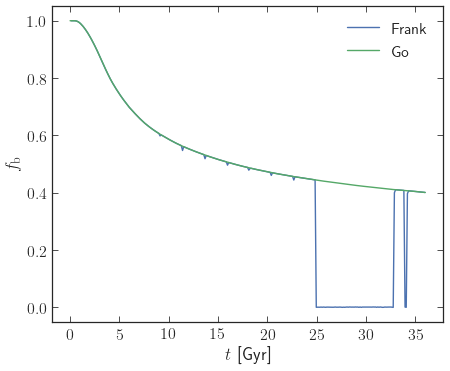

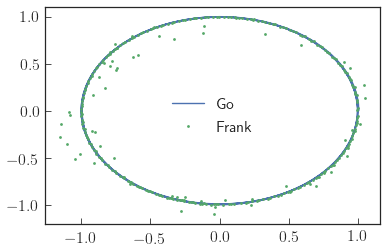

In [20]:
frank = np.loadtxt(home_dir / 'phasespace_aver_5.dat')
go = np.loadtxt(dash_root / ch_dirs[2] / cs_dirs[5] / xc_dirs[5] / eta_dirs[10] / 'subhalo_evo.txt')
plot()
plt.plot(times[1:], frank[:,10], label='Frank')
plt.plot(times, go[:,7], label='Go')
plt.xlabel(r'$t$ [Gyr]')
plt.ylabel(r'$f_\mathrm{b}$')
plt.legend()

plt.show()
plt.plot(go[:,1],go[:,2], label='Go')
plt.plot(frank[1:,1]/2.106e5, frank[1:,2]/2.106e5, '.', label='Frank')
plt.legend()

### Back to work

In [9]:
rmin = 10**-3
rmax = 10**1
nbn = 40
trads_cent = np.zeros(nbn+1)
trads_tru = np.zeros(nbn+1)
svs = np.zeros(nbn+1)
for i in range(0,nbn+1):
    trads_cent[i] = (i+0.5)*(np.log10(rmax) - np.log10(rmin))/nbn + np.log10(rmin)
    trads_cent[i] = 10**trads_cent[i]
    #print(trads_cent[i] - radii[i])
    trads_tru[i] = (i)*(np.log10(rmax) - np.log10(rmin))/nbn + np.log10(rmin)
    trads_tru[i] = 10**trads_tru[i]
    #print(trads_tru[i] - mass_prof_radii[i-1]) # we actually have them correct already apparently
for i in range(0,nbn):
    dV = (4.0*np.pi / 3.0) * trads_tru[i]**3
    if(i>0):
        dV = (4.0*np.pi / 3.0) * trads_tru[i+1]**3 - dV
    print(dV - shell_vols[i])
    
# my shell vols agree with Go's, and my mass_prof_radii are offset by one w.r.t. his radii (i.e. i only have the top edges of the bins)
# need to verify that that is not what he is doing
# however, when I'm integrating mass, we need to make sure we are using correct values
# then, we
    
# so the radii in the text files are indeed the bin centers... which is fine
# however, the radii used to compute the density are the mass_prof_radii, right?
# still need to figure out what the hell is going on with our rho200_0, which is now likely the final problem here

# that, or the values of the radii used for when the NFW profile is computed, or if there is a shift somewhere..

1.9846203106742437e-11
-3.3307353211163678e-15
1.689359841657638e-14
-1.0862213547714599e-14
-1.460994217629519e-14
-8.120972903969895e-15
4.0529904803934987e-14
1.435168336592457e-14
2.939021770196465e-14
2.7476039598085897e-12
-1.7784249440328383e-12
-3.330735344039197e-12
1.689359838745962e-11
-1.0862213506315863e-11
-1.460994213521409e-11
-8.120972400408807e-12
4.0529905007222894e-11
1.4351683686950056e-11
2.939021660590402e-11
2.74760396249199e-09
-1.7784249455032874e-09
-3.3307353281691876e-09
1.6893598343142857e-08
-1.0862213510598462e-08
-1.4609942131094122e-08
-8.12097261659872e-09
4.052990526526301e-08
1.4351681065782884e-08
2.9390220701586145e-08
2.747603963459966e-06
-1.7784249441987754e-06
-3.3307353266565087e-06
1.6893598356659822e-05
-1.086221349311245e-05
-1.4609942155630051e-05
-8.120972466940657e-06
4.0529904993036325e-05
1.4351681443258713e-05
2.939022033388028e-05
-6.5275996348646e-05


In [10]:
#generate final isolated profiles... talk with Frank about what time point we should use for the isolated profiles
#do we want to use the 36 Gyr one? Or do we want to use an earlier timestep
#do we only want to use it in the outer radii?
isolated_final_profs = np.zeros((len(cs_vals), timesteps, len(radii)))

for i in range(0,len(cs_vals)):
    iso_prof_dat = np.loadtxt(iso_root / cs_dirs[i] / 'radprof_rho.txt')[1:,1:]
    isolated_final_profs[i,:,:] = iso_prof_dat #may change which timestep we choose here...
    #do these all satisfy the numerical convergence criteria?

In [11]:
#let's figure out how to properly parse one file and then go from there
#would like to look at rho(r) vs. fbound and see how it evolves
#might want to make a class that represents a profile?
#or we can literally just have a huge matrix that contains f_b values and then all of the r values for all
#of the different sims...
#will only want to consider profiles that meet the criteria though, so will need to code that up

In [12]:
#to-do: code up the criteria to verify whether or not a given simulation passes the requirements
#will need to use this to filter out the bad ones that we don't want to use

def NFWf(c):
    return np.log(1. + c) - c/(1. + c)

def NFWrho(r, cs, mvir=1.):  # in units where Rvir=1, so r_s = 1/c_s
    rhos = mvir / (4*np.pi * cs**-3 * NFWf(cs))  # this factor drops out...
    return rhos / ((r*cs)*(1. + r*cs)**2)

nfw_profs = np.zeros((len(cs_vals), len(radii)))

for i in range(0, len(cs_vals)):
    for j in range(0, len(radii)):
        nfw_profs[i,j] = NFWrho(radii[j], cs_vals[i]) / rho200_0

chi_crit = 1.79

def convergence_criteria(sh_evo, conc):
    #takes in sh_evo matrix and returns an integer which corresponds to which snapshot the simulation breaks down
    #col 7 of sh_evo is f_b, so just need to check f_b * Npart > Ncrit
    mask1 = sh_evo[:,7] * Npart  > Ncrit
    mask2 = sh_evo[:,7] * NFWf(conc) / (chi_crit * sh_evo[:,8] * sim_eps * conc**2) > 1 #disrupts when ratio below 1
    #print(sh_evo[:,7] / (1.2* sh_evo[:,8] * sim_eps * conc**2))
    #for mask2, see eqns 7,8 from DASH paper
    combined_mask = mask1*mask2
    if(np.all(combined_mask == True)):
        return timesteps #the whole thing is converged, might chance this to 301
    else:
        return(np.min(np.where(combined_mask == False))) #returns first index where not satisfied


#todo: verify that the mask2 calculation is correct, try with more strenuous edge cases to verify
#pretty sure that it is correct, but can go over with Frank my calculation to make sure

In [13]:
# let's compute what the average densities should be within each NFW cell...
full_mass_prof_radii = np.insert(mass_prof_radii, 0, innermost_radius)
print(full_mass_prof_radii.shape)

# now, we can compute the average density within each NFW cell
avg_nfw_profs = np.zeros((len(cs_vals), len(radii)))

for i in range(0, len(cs_vals)):
    for j in range(0, len(radii)):
        avg_nfw_profs[i,j] = (1.0 / shell_vols[j]) * quad(lambda x: 4*np.pi * x**2 * NFWrho(x, cs=cs_vals[i]), full_mass_prof_radii[j], full_mass_prof_radii[j+1])[0] / rho200_0

(41,)


In [14]:
isolated_final_tfs = np.zeros((len(cs_vals), timesteps, len(radii)))

for i in range(0,len(cs_vals)):
    isolated_final_tfs[i,:,:] = isolated_final_profs[i,:,:] / avg_nfw_profs[i,:] #may change which timestep we choose here...
    #do these all satisfy the numerical convergence criteria?

In [14]:
plot_fb_rho_iso(5)

NameError: name 'load_sim' is not defined

NameError: name 'radii' is not defined

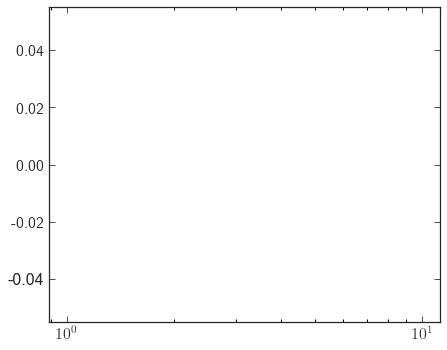

In [15]:
plot(semilogx=True)
for i in range(0,len(cs_vals)):
    plt.plot(radii,isolated_final_tfs[i,0,:])

plt.xlabel(r'$r/r_\mathrm{vir,s}$')
plt.ylabel(r'$\rho(r,t=0) / \rho(r,\mathrm{NFW})$')
plt.title('Snapshot 0 for all 11 isolated haloes, normalized by NFW')
    
plt.xlim(10**-2,1.)
plt.axhline(1.,color='k')
plt.ylim(0.97, 1.02)

#sitting at that 98%
# now let's verify by checking on our ICs in order to isolate what is going on between IC and first timestep

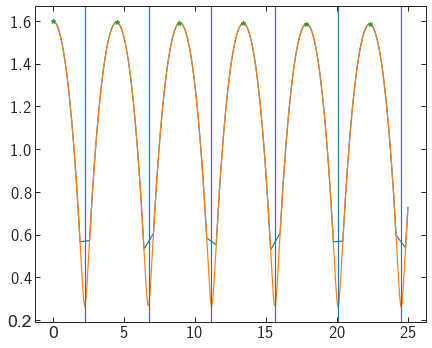

In [15]:
#we're trying to remove the inner 10% of the orbit close to pericenter to avoid potential periods where the
#subhalo is going through extreme revirialization that may add a lot of variance to the density profile

#the periods will decrease, so if we want to conservative, we should use the first N-1 periods on the first N-1
#pericenters, and then use the N-1th period to determine how much to remove from the Nth pericenter

def sim_rads(xyz):
    #takes the xyz coords and returns radii
    return np.sqrt(xyz[:,0]**2 + xyz[:,1]**2 + xyz[:,2]**2)

'''
def mask_pericenters(sh_evo_dat):
    #TODO: remove 10% of the orbit length based on EACH ORBIT instead of an average, because self-friction
    #reduces the period length rapidly
    #takes the subhalo_evo and returns the snapshot numbers to remove that are near pericenter
    orbital_rads = sim_rads(sh_evo_dat[:,1:4])
    drdt = orbital_rads[1:] - orbital_rads[:-1]
    pericenters = np.where(np.logical_and(drdt[1:] > 0, drdt[:-1] < 0))[0] + 1 #to line up correctly, add one
    orbit_lengths = np.mean(pericenters[1:] - pericenters[:-1]) #or could do sign_flips[1]-sign_flips[0]
    num_snaps_to_remove = int(np.round(orbit_lengths*0.05)) #so that we remove 10% of orbit total
    #remove this many from both sides of the orbit length, see how it varies
    mask = np.ones(len(sh_evo_dat),dtype=bool)
    for pcs in pericenters:
        mask[pcs-num_snaps_to_remove:pcs+num_snaps_to_remove+1] = 0 #mask this one
    return mask
'''

def mask_pericenters(sh_evo_dat):
    #TODO: remove 10% of the orbit length based on EACH ORBIT instead of an average, because self-friction
    #reduces the period length rapidly
    #takes the subhalo_evo and returns the snapshot numbers to remove that are near pericenter
    orbital_rads = sim_rads(sh_evo_dat[:,1:4])
    drdt = orbital_rads[1:] - orbital_rads[:-1]
    pericenters = np.where(np.logical_and(drdt[1:] > 0, drdt[:-1] < 0))[0] + 1 #to line up correctly, add one
    orbit_lengths = pericenters[1:] - pericenters[:-1] #or could do sign_flips[1]-sign_flips[0]
    num_snaps_to_remove = np.round(orbit_lengths*0.05) #so that we remove 10% of orbit total
    num_snaps_to_remove = np.append(num_snaps_to_remove,num_snaps_to_remove[-1]).astype(int)
    #remove this many from both sides of the orbit length, see how it varies
    mask = np.ones(len(sh_evo_dat),dtype=bool)
    for k,pcs in enumerate(pericenters):
        mask[pcs-num_snaps_to_remove[k]:pcs+num_snaps_to_remove[k]+1] = 0 #mask this one
    return mask

def mask_apocenters(sh_evo_dat):
    #finds only the time points at apocenter and returns a mask of those times
    orbital_rads = sim_rads(sh_evo_dat[:,1:4])
    drdt = orbital_rads[1:] - orbital_rads[:-1]
    apocenters = np.where(np.logical_and(drdt[1:] < 0, drdt[:-1] > 0))[0] + 1 #to line up correctly, add one
    mask = np.zeros(len(sh_evo_dat),dtype=bool)
    mask[0] = 1 #count first point
    for k,pcs in enumerate(apocenters):
        mask[apocenters] = 1 # this one is good
    return mask
    
#finding pericentric passage and removing it
test_data = np.loadtxt(dash_root / ch_dirs[0] / cs_dirs[10] / xc_dirs[5] / eta_dirs[5] / 'subhalo_evo.txt')
#test_data = np.loadtxt(dash_root + ch_dirs[2] + cs_dirs[5] + xc_dirs[2] + eta_dirs[0]+'subhalo_evo.txt')[0:80]
#test_data = load_sim(dash_root + ch_dirs[2] + cs_dirs[5] + xc_dirs[2] + eta_dirs[0], 5)
orbital_rads = sim_rads(test_data[:,1:4])
drdt = orbital_rads[1:] - orbital_rads[:-1] #this is dr/dt
pericenters = np.where(np.logical_and(drdt[1:] > 0, drdt[:-1] < 0))[0] + 1
#we verified that adding one to the loc does indeed line up correctly with pericenter
msk = mask_pericenters(test_data)
apo_msk = mask_apocenters(test_data)
fig, ax = plot()
plt.plot(times[msk],orbital_rads[msk])
plt.plot(times,orbital_rads)
plt.plot(times[apo_msk], orbital_rads[apo_msk], '*')
#plt.plot(times,orbital_rads)
for pc in pericenters:
    plt.axvline(times[pc])
#plt.ylim(0,1.2)
#plt.xlim(0,10)

#so now we know the locations of pericenter
#after this, we just need an estimate for the length of the orbital period, so we are removing ~5-10%
#estimate of orbital period is just finding the mean difference between the sign_flips and multiplying it by delta_t

In [16]:
def load_sim(directory,cs_num,mask_snaps=True,normalize=True,by_nfw=True, mask_type='peris'):
    prof_dat = np.loadtxt(directory / 'radprof_rho.txt')[1:,1:] #radii are in 0th and same for all
    sh_dat = np.loadtxt(directory / 'subhalo_evo.txt')
    num_conv_ind = convergence_criteria(sh_dat,cs_vals[cs_num])
    #if(num_conv_ind >= 0):
    #    prof_dat = prof_dat[:num_conv_ind,:]
    #    sh_dat = sh_dat[:num_conv_ind,:]
    #else:
    #    num_conv_ind = timesteps
    #now, we run the pericenter masking first, then check for convergence
    #this fixes issues such as sim number 2,5,2,0 where the convergence cutoff is near, but before, a pericenter
    #and then a region near the last pericenter doesn't get masked
    
    # by_nfw decides if we normalize by NFW or by the first snapshot, both of which are very similar
    # different than normalizing by isolated halo though, which I don't think we any longer need to do
    
    if(mask_snaps):
        if(mask_type=='peris'):
            mask = mask_pericenters(sh_dat)[0:num_conv_ind]
        elif(mask_type=='apos'):
            mask = mask_apocenters(sh_dat)[0:num_conv_ind]
        else:
            print("Invalid type of mask!")
            return None
        prof_dat = prof_dat[:num_conv_ind,:][mask]
        sh_dat = sh_dat[:num_conv_ind,:][mask]
        if(normalize):
            if(by_nfw):
                return(np.column_stack((sh_dat[:,7],prof_dat/avg_nfw_profs[cs_num,:])))
            else:
                return(np.column_stack((sh_dat[:,7],prof_dat / prof_dat[0,:])))
        else:
            return(np.column_stack((sh_dat[:,7],prof_dat)))
    else:
        prof_dat = prof_dat[:num_conv_ind,:]
        sh_dat = sh_dat[:num_conv_ind,:]
        if(normalize):
            if(by_nfw):
                return(np.column_stack((sh_dat[:,7],prof_dat/avg_nfw_profs[cs_num,:])))
            else:
                return(np.column_stack((sh_dat[:,7],prof_dat / prof_dat[0,:])))
        else:
            return(np.column_stack((sh_dat[:,7],prof_dat)))

In [29]:
#to-do: make sure that the simulation radii are the same for all sims
#will want to store the relevant simulation parameters for re-scaling? or not necessary
#probably will be necessary for when we want to see where most of the variance comes from
def load_sim_old(directory,cs_num,mask_snaps=True,normalize=True,by_iso=True, mask_type='peris'):
    prof_dat = np.loadtxt(directory / 'radprof_rho.txt')[1:,1:] #radii are in 0th and same for all
    sh_dat = np.loadtxt(directory / 'subhalo_evo.txt')
    num_conv_ind = convergence_criteria(sh_dat,cs_vals[cs_num])
    #if(num_conv_ind >= 0):
    #    prof_dat = prof_dat[:num_conv_ind,:]
    #    sh_dat = sh_dat[:num_conv_ind,:]
    #else:
    #    num_conv_ind = timesteps
    #now, we run the pericenter masking first, then check for convergence
    #this fixes issues such as sim number 2,5,2,0 where the convergence cutoff is near, but before, a pericenter
    #and then a region near the last pericenter doesn't get masked
    
    if(mask_snaps):
        if(mask_type=='peris'):
            mask = mask_pericenters(sh_dat)[0:num_conv_ind]
        elif(mask_type=='apos'):
            mask = mask_apocenters(sh_dat)[0:num_conv_ind]
        else:
            print("Invalid type of mask!")
            return None
        prof_dat = prof_dat[:num_conv_ind,:][mask]
        sh_dat = sh_dat[:num_conv_ind,:][mask]
        if(normalize):
            if(by_iso):
                return(np.column_stack((sh_dat[:,7],prof_dat/isolated_final_profs[cs_num,:num_conv_ind,:][mask])))
            else:
                return(np.column_stack((sh_dat[:,7],prof_dat / prof_dat[0,:])))
        else:
            return(np.column_stack((sh_dat[:,7],prof_dat)))
    else:
        prof_dat = prof_dat[:num_conv_ind,:]
        sh_dat = sh_dat[:num_conv_ind,:]
        if(normalize):
            if(by_iso):
                return(np.column_stack((sh_dat[:,7],prof_dat/isolated_final_profs[cs_num,:num_conv_ind,:])))
            else:
                return(np.column_stack((sh_dat[:,7],prof_dat / prof_dat[0,:])))
        else:
            return(np.column_stack((sh_dat[:,7],prof_dat)))
    #then, call a function that finds regions near pericentric passage and masks those points...
    #idea: find all places where dr/dt changes from negative to positive, estimate the period by how many time
    #steps in between as N_p and then remove 5-10% of points surrounding each of the pericentric passages
        
    #will do a check for numerical stability on the subhalo evolution at each timestep and then return
    #all timesteps that pass the check; will want to make the first column of the matrix the simulation ID
    #so that we can have a second array with the simulation IDs and the corresponding simulation parameters    

In [17]:
def rmax0(rs): # in units where Rvir=1, rs=1/cs
    return 2.163*rs

def Vmax0(c,Vvir): #in units where Rvir=1=Mvir, you have Vvir=sqrt(1*1/1) = 1.
    return 0.465*Vvir * np.sqrt(c / NFWf(c))

In [18]:
def load_vrmax(directory, cs_num, normed=True):
    prof_dat = np.loadtxt(directory / 'radprof_m.txt')[1:,1:] #radii are in 0th and same for all
    sh_dat = np.loadtxt(directory / 'subhalo_evo.txt')
    num_conv_ind = convergence_criteria(sh_dat,cs_vals[cs_num])
    
    #now, find the apocenters and remove other points
    mask = mask_apocenters(sh_dat)[0:num_conv_ind]
    prof_dat = prof_dat[:num_conv_ind,:][mask]
    sh_dat = sh_dat[:num_conv_ind,:][mask]

    #compute vmax, rmax for each point
    vels = np.sqrt(G * prof_dat / mass_prof_radii)
    rmax = []
    vmax = []
    for i in range(0,vels.shape[0]):
        interp_vel_prof = InterpolatedUnivariateSpline(mass_prof_radii,vels[i,:], k=4)
        rm = max(interp_vel_prof.derivative().roots())
        rmax.extend([rm])
        vmax.extend([interp_vel_prof(rm)])
        #plt.plot(np.log10(radii), np.log10(vels[2,:]))
        #plt.plot(np.log10(radii), np.log10(interp_vel_prof(radii)))
        #plt.axvline(np.log10(rm)) #for visualizing
             
    if(normed):
        init_vals = np.column_stack((np.repeat(vmax[0],len(vmax)-1),np.repeat(rmax[0],len(rmax)-1)))
        #rmax = np.array(rmax) / rmax[0] #normalized
        #vmax = np.array(vmax) / vmax[0]
        
        rmax = np.array(rmax) / rmax0(1. / cs_vals[cs_num]) # want to try the old version again to figure out issue...
        vmax = np.array(vmax) / Vmax0(cs_vals[cs_num], 1.)  # basically, should we be comparing to NFW or to t=0, why does the difference come about?
    else:
        rmax = np.array(rmax)
        vmax = np.array(vmax)
      
    
    return(np.column_stack((sh_dat[:,7], vmax, rmax, prof_dat))[1:,:],init_vals) #throw out the first one

In [19]:
print(np.loadtxt(dash_root / ch_dirs[0] / cs_dirs[10] / xc_dirs[5] / eta_dirs[5]/'radprof_rho.txt')[1:,1:].shape)
print(np.loadtxt(dash_root / ch_dirs[0] / cs_dirs[10] / xc_dirs[5] / eta_dirs[5]/'subhalo_evo.txt').shape)

#array will be (301 timesteps * 11**4 sims) by (4sim params + 1f_b + 40 profile values)
#after building matrix, remove all rows with just zeros

(301, 40)
(301, 9)


In [22]:
dat_matrix = np.zeros((timesteps*nsims, 45))#[] #preload this as numpy zeros of the proper size
unnormalized_dat_matrix = np.zeros((timesteps*nsims, 41))

sims_present = []

MT = 'peris'
mask_or_not = True

#loop over directories
#for each directory, check if subhalo evo and rho are present
#if they are, load them with load_sim, check which timesteps are valid, return number
#append only the relevant rows of the sim data in a matrix with cols: sim params, f_b, rho vals for each time step
for i in range(0,11):
    print("i",i)
    for j in range(0,11):
        print("j",j)
        for k in range(0,11):
            for l in range(0,11):
                direct = dash_root / ch_dirs[i] / cs_dirs[j] / xc_dirs[k] / eta_dirs[l]
                pf_fn = direct / 'radprof_rho.txt'
                sh_evo_fn = direct / 'subhalo_evo.txt'
                if(Path(pf_fn).is_file()):
                    sims_present.append([i,j,k,l])
                    sim_dat = load_sim(direct,j,mask_snaps=mask_or_not, normalize=True, by_nfw=True, mask_type=MT)#[0,:][np.newaxis,:]
                    snaps_used = sim_dat.shape[0]
                    row = ((i*11**3)+(j*11**2)+(k*11)+l)*timesteps
                    dat_matrix[row:row+snaps_used,0] = ch_vals[i]
                    dat_matrix[row:row+snaps_used,1] = cs_vals[j]
                    dat_matrix[row:row+snaps_used,2] = xc_vals[k]
                    dat_matrix[row:row+snaps_used,3] = eta_vals[l]
                    dat_matrix[row:row+snaps_used,4:] = sim_dat
                    unnormalized_dat_matrix[row:row+snaps_used,:] = load_sim(direct,j,mask_snaps=mask_or_not,normalize=False, mask_type=MT)#[0,:][np.newaxis,:]
                    
                    #dat_matrix.append(load_sim(direct,cs[j])) #going to need to be able to read off the cs value as well
dat_matrix = dat_matrix[~np.all(dat_matrix == 0, axis=1)]

unnormalized_dat_matrix = unnormalized_dat_matrix[~np.all(unnormalized_dat_matrix == 0, axis=1)]

i 0
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 1
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 2
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 3
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 4
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 5
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 6
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 7
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 8
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 9
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 10
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10


In [23]:
len(sims_present) #this says that there are 2177 simulations that have run

2253

In [24]:
sims_present = np.array(sims_present)

In [25]:
print(np.unique(sims_present[:,0], return_counts=True))
print(np.unique(sims_present[:,1], return_counts=True))
print(np.unique(sims_present[:,2], return_counts=True))
print(np.unique(sims_present[:,3], return_counts=True))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]), array([280, 280, 356, 280, 280, 237, 194, 151, 108,  65,  22], dtype=int64))
(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]), array([ 22,  65, 108, 151, 194, 313, 280, 280, 280, 280, 280], dtype=int64))
(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]), array([ 11,  11,  11,  11, 275, 439, 483, 363, 363, 275,  11], dtype=int64))
(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]), array([ 11,  11, 143, 231, 231, 351, 275, 275, 275, 307, 143], dtype=int64))


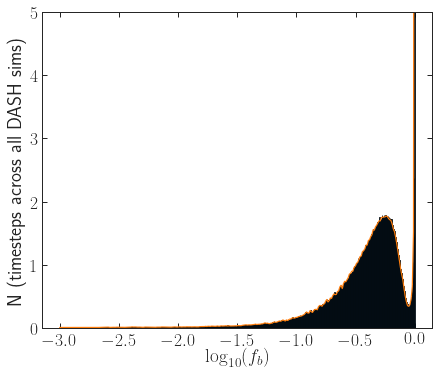

In [26]:
logfb_plot = np.linspace(-3,0,300)

fig, ax = plot()
n, bins, patches = plt.hist(np.log10(dat_matrix[:,4]),bins=int(np.sqrt(len(dat_matrix))),density='normed',histtype='bar', ec='black');
bin_centers = (bins[1:] + bins[:-1]) * 0.5
weight_func = InterpolatedUnivariateSpline(bin_centers[:], n[:], k=2,ext=3)
plt.plot(logfb_plot,weight_func(logfb_plot))
plt.xlabel('$\log_{10}(f_b)$')
plt.ylabel('N (timesteps across all DASH sims)')
plt.ylim(0,5)
#plt.ylim(-0.1, 0.1)

def fb_weight(fb): #proportional to 1/histogram here
    return 1. / weight_func(np.log10(fb))

#let's fit a kernel density estimation to this so that we can use the inverse of it as a weight to get equal
#value for all logarithmic bins of f_b

#there may be some motivation for logarithmically binning the f_b values? ask Frank...

#not exactly a flat pdf of things to play with, but we can at least look at binned regions


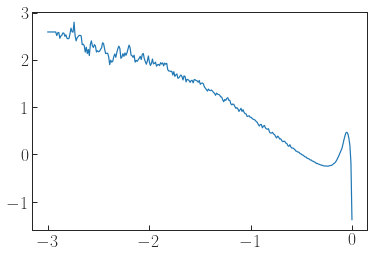

In [27]:
plt.plot(logfb_plot, np.log10(fb_weight(10**logfb_plot)))
#not as flat as I would like...

## Compare pericentric to apocentric density profiles

In [93]:
# mask pericenter and apocenter
def mask_pericenter_snap(sh_evo_dat):
    #TODO: remove 10% of the orbit length based on EACH ORBIT instead of an average, because self-friction
    #reduces the period length rapidly
    #takes the subhalo_evo and returns the snapshot numbers to remove that are near pericenter
    orbital_rads = sim_rads(sh_evo_dat[:,1:4])
    drdt = orbital_rads[1:] - orbital_rads[:-1]
    pericenters = np.where(np.logical_and(drdt[1:] > 0, drdt[:-1] < 0))[0] + 1 #to line up correctly, add one
    orbit_lengths = pericenters[1:] - pericenters[:-1] #or could do sign_flips[1]-sign_flips[0]
    num_snaps_to_remove = np.round(orbit_lengths*0.05) #so that we remove 10% of orbit total
    num_snaps_to_remove = np.append(num_snaps_to_remove,num_snaps_to_remove[-1]).astype(int)
    #remove this many from both sides of the orbit length, see how it varies
    mask = np.ones(len(sh_evo_dat),dtype=bool)
    for k,pcs in enumerate(pericenters):
        mask[pcs-num_snaps_to_remove[k]:pcs+num_snaps_to_remove[k]+1] = 0 #mask this one
    return mask

def mask_apocenters_multi(sh_evo_dat):
    #finds only the time points at apocenter and returns a mask of those times
    orbital_rads = sim_rads(sh_evo_dat[:,1:4])
    drdt = orbital_rads[1:] - orbital_rads[:-1]
    pericenters = np.where(np.logical_and(drdt[1:] < 0, drdt[:-1] > 0))[0] + 1 #to line up correctly, add one
    orbit_lengths = pericenters[1:] - pericenters[:-1] #or could do sign_flips[1]-sign_flips[0]
    num_snaps_to_remove = np.round(orbit_lengths*0.05) #so that we remove 10% of orbit total
    num_snaps_to_remove = np.append(num_snaps_to_remove,num_snaps_to_remove[-1]).astype(int)
    #remove this many from both sides of the orbit length, see how it varies
    mask = np.ones(len(sh_evo_dat),dtype=bool)
    for k,pcs in enumerate(pericenters):
        mask[pcs-num_snaps_to_remove[k]:pcs+num_snaps_to_remove[k]+1] = 0 #mask this one
    return mask

def load_sim_apo_peri(directory,cs_num,normalize=True,by_nfw=True):
    prof_dat = np.loadtxt(directory / 'radprof_rho.txt')[1:,1:] #radii are in 0th and same for all
    sh_dat = np.loadtxt(directory / 'subhalo_evo.txt')
    num_conv_ind = convergence_criteria(sh_dat,cs_vals[cs_num])
    
    mask_peri = mask_pericenters(sh_dat)[0:num_conv_ind] # returns true except at 10% peris
    #mask_apo = mask_apocenters_multi(sh_dat)[0:num_conv_ind] # returns true except at 10% apos..
    mask_apo = ~mask_pericenters(sh_dat)[0:num_conv_ind]
    
    prof_dat_peri = prof_dat[:num_conv_ind,:][~mask_peri]
    prof_dat_apo = prof_dat[:num_conv_ind,:][~mask_apo]
    sh_dat_peri = sh_dat[:num_conv_ind,:][~mask_peri]
    sh_dat_apo = sh_dat[:num_conv_ind,:][~mask_apo]
    if(normalize):
        if(by_nfw):
            return(np.column_stack((sh_dat_peri[:,7],prof_dat_peri/avg_nfw_profs[cs_num,:])),
                   np.column_stack((sh_dat_apo[:,7],prof_dat_apo/avg_nfw_profs[cs_num,:])))
        else:
            return(np.column_stack((sh_dat_peri[:,7],prof_dat_peri / prof_dat_peri[0,:])),
                   np.column_stack((sh_dat_apo[:,7],prof_dat_apo / prof_dat_apo[0,:])))
    else:
        return(np.column_stack((sh_dat_peri[:,7],prof_dat_peri)),
               np.column_stack((sh_dat_apo[:,7],prof_dat_apo)))

In [94]:
dat_matrix_peri = np.zeros((timesteps*nsims, 45))#[] #preload this as numpy zeros of the proper size
dat_matrix_apo = np.zeros((timesteps*nsims, 45))

sims_present = []

for i in range(0,11):
    print("i",i)
    for j in range(0,11):
        print("j",j)
        for k in range(0,11):
            for l in range(0,11):
                direct = dash_root / ch_dirs[i] / cs_dirs[j] / xc_dirs[k] / eta_dirs[l]
                pf_fn = direct / 'radprof_rho.txt'
                sh_evo_fn = direct / 'subhalo_evo.txt'
                if(Path(pf_fn).is_file()):
                    sims_present.append([i,j,k,l])
                    sim_dat_peri, sim_dat_apo = load_sim_apo_peri(direct,j, normalize=True, by_nfw=True)#[0,:][np.newaxis,:]
                    snaps_used_peri = sim_dat_peri.shape[0]
                    snaps_used_apo = sim_dat_apo.shape[0]
                    row = ((i*11**3)+(j*11**2)+(k*11)+l)*timesteps
                    dat_matrix_peri[row:row+snaps_used_peri,0] = ch_vals[i]
                    dat_matrix_peri[row:row+snaps_used_peri,1] = cs_vals[j]
                    dat_matrix_peri[row:row+snaps_used_peri,2] = xc_vals[k]
                    dat_matrix_peri[row:row+snaps_used_peri,3] = eta_vals[l]
                    dat_matrix_peri[row:row+snaps_used_peri,4:] = sim_dat_peri
                    dat_matrix_apo[row:row+snaps_used_apo,0] = ch_vals[i]
                    dat_matrix_apo[row:row+snaps_used_apo,1] = cs_vals[j]
                    dat_matrix_apo[row:row+snaps_used_apo,2] = xc_vals[k]
                    dat_matrix_apo[row:row+snaps_used_apo,3] = eta_vals[l]
                    dat_matrix_apo[row:row+snaps_used_apo,4:] = sim_dat_apo
                    
                    #dat_matrix.append(load_sim(direct,cs[j])) #going to need to be able to read off the cs value as well
dat_matrix_peri = dat_matrix_peri[~np.all(dat_matrix_peri == 0, axis=1)]
dat_matrix_apo = dat_matrix_apo[~np.all(dat_matrix_apo == 0, axis=1)]


i 0
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 1
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 2
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 3
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 4
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 5
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 6
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 7
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 8
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 9
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 10
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10


C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


[25. 25. 25. 25. 25.]


C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning: divide by zero encountered in log10
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:50: RuntimeWarning: divide by zero encountered in log10


[10. 10. 10. 10. 10.]


C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:74: RuntimeWarning: divide by zero encountered in log10
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:80: RuntimeWarning: divide by zero encountered in log10


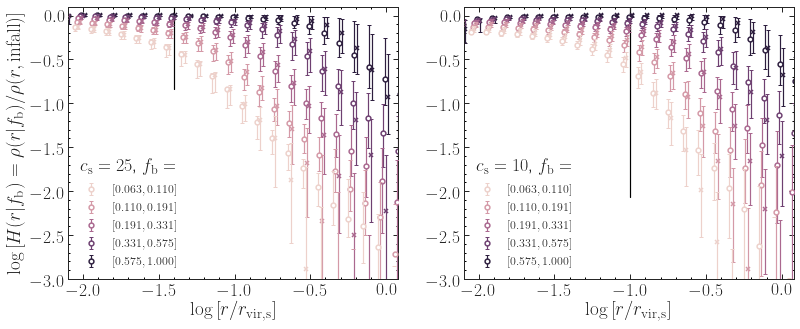

In [95]:
# this one only works for median and returns stds as differences in log space

def generate_stacks(dat_matrix, bins=5, logfb_min=-2, logfb_max=0., cs_num=5, fmt='mean'):
    if(fmt=='median'):
        stacked_profiles = np.zeros((bins,n_profile_pts))
        stacked_stds = np.zeros((bins,n_profile_pts,2))
        mean_cs = np.zeros(bins)
        fb_bin_edges = np.logspace(logfb_min,logfb_max,bins+1)
        fb_bin_centers = 10**((np.log10(fb_bin_edges[1:]) + np.log10(fb_bin_edges[:-1]))*0.5)
        for i in range(0,bins):
            sub_mat = dat_matrix[np.logical_and(dat_matrix[:,4] >= fb_bin_edges[i], dat_matrix[:,4] < fb_bin_edges[i+1])]
            sub_mat = sub_mat[sub_mat[:,1] == cs_vals[cs_num]] #only taking one cs value
            mean_cs[i] = np.median(sub_mat[:,1])
            stacked_profiles[i,:] = np.median(sub_mat[:,5:], axis=0)
            stacked_stds[i,:] = np.column_stack((np.log10(stacked_profiles[i,:]) - np.log10(np.quantile(sub_mat[:,5:],0.16, axis=0)), np.log10(np.quantile(sub_mat[:,5:],0.84,axis=0)) - np.log10(stacked_profiles[i,:])))
    return stacked_profiles, stacked_stds, mean_cs, fb_bin_centers, fb_bin_edges

fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(13,5))
ax[0].yaxis.set_ticks_position('both')
ax[0].xaxis.set_ticks_position('both')
ax[0].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
#ax[0].loglog()
ax[1].yaxis.set_ticks_position('both')
ax[1].xaxis.set_ticks_position('both')
ax[1].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
#ax[1].loglog()
stacked_cols = sns.cubehelix_palette(bins)

ax[0].xaxis.set_minor_locator(MultipleLocator(0.1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.1))
ax[1].xaxis.set_minor_locator(MultipleLocator(0.1))
ax[1].yaxis.set_minor_locator(MultipleLocator(0.1))

mean_or_median = 'median'
bins=5
csn=9
stacked_profiles_apo, stacked_stds_apo, mean_cs, fb_bin_centers, fb_bin_edges = generate_stacks(dat_matrix_apo, bins=bins, logfb_min=-1.2, logfb_max=0., cs_num=csn, fmt=mean_or_median)
print(mean_cs)
stacked_profiles_peri, stacked_stds_peri, mean_cs, fb_bin_centers, fb_bin_edges = generate_stacks(dat_matrix_peri, bins=bins, logfb_min=-1.2, logfb_max=0., cs_num=csn, fmt=mean_or_median)


for i in range(0,bins):
    # apocenters/masked peris
    (ln, caps, _) = ax[0].errorbar(np.log10(radii* 10**(0.05*i/bins)), np.log10(stacked_profiles_apo[i,:]), stacked_stds_apo[i,:] if mean_or_median=='mean' else stacked_stds_apo[i,:].T, color=stacked_cols[i],
                 label='$[%.3f, %.3f]$' % (fb_bin_edges[i], fb_bin_edges[i+1]), zorder=bins-i, 
                 marker='o', mfc='white', mew=1.5, linestyle='None', capsize=2)
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(1)
    (ln, caps, _) = ax[0].errorbar(np.log10(radii* 10**(0.02 + 0.05*i/bins)), np.log10(stacked_profiles_peri[i,:]), stacked_stds_peri[i,:] if mean_or_median=='mean' else stacked_stds_peri[i,:].T, color=stacked_cols[i],
                 zorder=bins-i, marker='x', mfc='white', mew=1.5, linestyle='None', capsize=2)
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(1)


ax[0].axvline(np.log10(1. / mean_cs[i]), zorder=-32, color = 'k', ymin=0.7)
ax[0].set_xlabel(r'$\log\Big[r/r_\mathrm{vir,s}\Big]$');
ax[0].set_xlim(np.log10(0.8* 10**-2),np.log10(1.2))
ax[0].set_ylim(np.log10(10**-3),np.log10(1.25*10**0))
ax[0].set_ylabel(r'$\log\Big[H(r | f_\mathrm{b}) = \rho(r | f_\mathrm{b}) / \rho(r,\mathrm{infall})\Big]$')
l = ax[0].legend(title=r'$c_\mathrm{s}=%.0f$, $f_\mathrm{b}=$' %cs_vals[csn],ncol=1, fontsize=12, frameon=False)
ax[0].get_legend().get_title().set_fontsize('18')
l.set_zorder(20)

mean_or_median = 'median'
bins=5
csn=5
stacked_profiles_apo, stacked_stds_apo, mean_cs, fb_bin_centers, fb_bin_edges = generate_stacks(dat_matrix_apo, bins=bins, logfb_min=-1.2, logfb_max=0., cs_num=csn, fmt=mean_or_median)
print(mean_cs)
stacked_profiles_peri, stacked_stds_peri, mean_cs, fb_bin_centers, fb_bin_edges = generate_stacks(dat_matrix_peri, bins=bins, logfb_min=-1.2, logfb_max=0., cs_num=csn, fmt=mean_or_median)
for i in range(0,bins):
    #plot data
    (ln, caps, _) = ax[1].errorbar(np.log10(radii* 10**(0.05*i/bins)), np.log10(stacked_profiles_apo[i,:]), stacked_stds_apo[i,:] if mean_or_median=='mean' else stacked_stds_apo[i,:].T, color=stacked_cols[i],
                 label='$[%.3f, %.3f]$' % (fb_bin_edges[i], fb_bin_edges[i+1]), zorder=bins-i, 
                 marker='o', mfc='white', mew=1.5, linestyle='None', capsize=2)
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(1)
    (ln, caps, _) = ax[1].errorbar(np.log10(radii* 10**(0.02 + 0.05*i/bins)), np.log10(stacked_profiles_peri[i,:]), stacked_stds_peri[i,:] if mean_or_median=='mean' else stacked_stds_peri[i,:].T, color=stacked_cols[i],
                 zorder=bins-i, marker='x', mfc='white', mew=1.5, linestyle='None', capsize=2)
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(1)
        
ax[1].axvline(np.log10(1. / mean_cs[i]), zorder=-32, color = 'k', ymin=0.3)
ax[1].set_xlabel(r'$\log\Big[r/r_\mathrm{vir,s}\Big]$');
ax[1].set_xlim(np.log10(0.8* 10**-2),np.log10(1.2))
ax[1].set_ylim(np.log10(10**-3),np.log10(1.25*10**0))

handles, labels = ax[1].get_legend_handles_labels()
order = [3,4,5,6,7,0,1,2]
#ax.legend(handles[::-1], labels[::-1], title='Line', loc='upper left')

#ax[1].set_ylabel(r'$H(r | f_\mathrm{b}) = \rho(r | f_\mathrm{b}) / \rho(r,\mathrm{infall})$')
l = ax[1].legend(title=r'$c_\mathrm{s}=%.0f$, $f_\mathrm{b}=$' %cs_vals[csn],ncol=1, fontsize=12, frameon=False)
ax[1].get_legend().get_title().set_fontsize('18')
l.set_zorder(20)
#ax[1].text(0.012, 0.05, r'$c_\mathrm{s}=%.1f$' % cs_vals[csn], fontsize=18)

#plt.savefig(fig_dir / 'stacked_prof_comparison.pdf', bbox_inches='tight')

#do we want to do this for every cs? or at least a few? could make it multiple panels...

## Compare simulation outputs

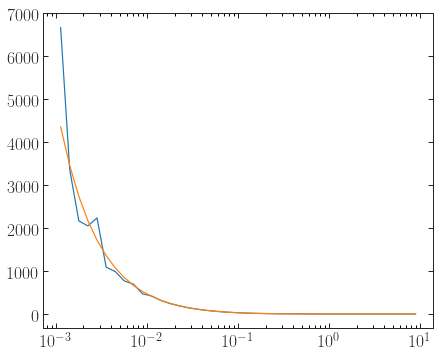

In [94]:
# just a quick test
cn = 0
tes = np.loadtxt(dash_root / ch_dirs[0] / cs_dirs[cn] / xc_dirs[5] / eta_dirs[5] / 'radprof_rho.txt')[1:,1:]
fig, ax = plot(semilogx=True)
plt.plot(radii, tes[0,:])
plt.plot(radii, nfw_profs[cn,:])

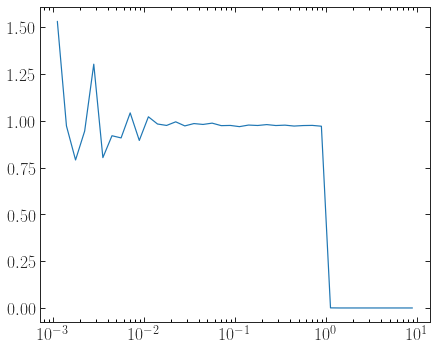

In [95]:
fig,ax = plot(semilogx=True)
plt.plot(radii, tes[0,:] / nfw_profs[cn,:])
# I think that it looks OK

In [23]:
# NEED TO USE ANALYTICAL PROFILE FOR COMPARISON INSTEAD OF ISO, RERUN LOAD IN WITH SCRIPT
# Wonder how different the IC is from snapshot_000, it's only one timestep but need to check...
# Something to look into

In [102]:
np.save('DASH_matrix', dat_matrix)

In [103]:
dat_matrix_new = np.load(home_dir / 'winhome/new_DASH_matrix.npy')
dat_matrix = np.load(home_dir / 'winhome/DASH_matrix.npy')

In [159]:
# now we can compute the mask
msk = np.logical_and(~np.all(dat_matrix == 0, axis=1), ~np.all(dat_matrix_new == 0, axis=1))
#msk2 = np.logical_and(~np.any(dat_matrix[:,5:] == 0, axis=1), ~np.any(dat_matrix_new[:,5:] == 0, axis=1))
#msk = msk * msk2

In [160]:
# now, we can loop over all of them and compute the relative difference:

rel_error_dist = (dat_matrix_new[msk,5:] - dat_matrix[msk,5:]) / dat_matrix_new[msk,5:]
rel_error_dist[np.isinf(rel_error_dist)] = np.nan

# new minus old over new...
rel_error = np.nanmean(rel_error_dist, axis=0)
rel_error_stds = np.nanstd(rel_error_dist, axis=0)

#print(rel_error.shape)

/home/sbg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/home/sbg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


(-0.1, 0.15)

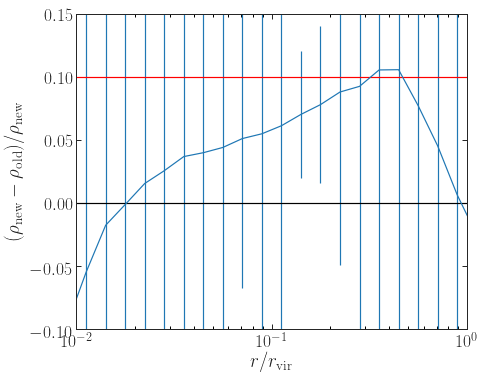

In [161]:
fig,ax = plot(semilogx=True)
plt.errorbar(radii, rel_error, rel_error_stds)
plt.axhline(0, color='k')
plt.axhline(0.1, color='r')
plt.xlabel(r'$r / r_\mathrm{vir}$')
plt.ylabel(r'$(\rho_\mathrm{new} - \rho_\mathrm{old})/\rho_\mathrm{new}$')
plt.xlim(0.01, 1.)
plt.ylim(-0.1, 0.15)

# if we only throw out zeros for particular radii, this shows that the new DASH has even higher densities
# if we throw out all snapshots where there was a zero at all, then we get something closer to 7.5-8%
# however, obviously we should only not consider radii where there was a zero instead of discarding entire snapshot
# thus, the 10% suppression effect is quite consistent with my previous findings, which I'm happy to see

In [165]:
del(dat_matrix)
del(dat_matrix_new)
del(msk)
del(msk2)
del(rel_error_dist)

## Looking at fixed DASH sim

In [17]:
new_dash_dir = home_dir / 'new_DASH/'

In [18]:
#first, we need to preprocess the datafiles
#then, we can load_sim as usual

#### CODE TO GENERATE THE NORMAL DASH DATAFILES FROM THE SIM OUTPUTS #####

for i in range(0,11):
    print("i",i)
    for j in range(0,11):
        print("j",j)
        for k in range(0,11):
            for l in range(0,11):
                direct = new_dash_dir / ch_dirs[i] / cs_dirs[j] / xc_dirs[k] / eta_dirs[l]
                sh_evo_fn = direct / 'subhalo_evolution.txt'
                if(Path(sh_evo_fn).is_file()):

                    dens = np.zeros((timesteps+1,len(radii)+1))
                    enc_mass = np.zeros((timesteps+1,len(radii)+1))
                    sigmar = np.zeros((timesteps+1,len(radii)+1))
                    dens[0,1:] = radii
                    dens[1:,0] = np.linspace(0,timesteps-1,timesteps)
                    enc_mass[0,1:] = radii
                    enc_mass[1:,0] = np.linspace(0,timesteps-1,timesteps)
                    sigmar[0,1:] = radii
                    sigmar[1:,0] = np.linspace(0,timesteps-1,timesteps)
                    for m in range(0,timesteps):
                        dat = np.loadtxt(direct/'radprof_%03d.txt' % m)
                        dens[m+1,1:] = dat[:,1]
                        enc_mass[m+1,1:] = dat[:,2]
                        sigmar[m+1,1:] = dat[:,3]

                    np.savetxt(direct/'radprof_rho.txt',dens,fmt='%e')
                    np.savetxt(direct/'radprof_m.txt',enc_mass,fmt='%e')
                    np.savetxt(direct/'radprof_sigmar.txt',sigmar,fmt='%e')
                    she = np.loadtxt(sh_evo_fn)
                    np.savetxt(direct/'subhalo_evo.txt',she,fmt='%e')

i 0
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9


KeyboardInterrupt: 

In [15]:
def plot_fb_rho_new(ch_num, cs_num, xc_num, eta_num, normalize=False,by_iso=False):
    direct = new_dash_dir / ch_dirs[ch_num] / cs_dirs[cs_num] / xc_dirs[xc_num] / eta_dirs[eta_num]
    pf_fn = direct / 'radprof_rho.txt'
    sh_evo_fn = direct / 'subhalo_evolution.txt'
    if(Path(pf_fn).is_file()):
        sim_dat = load_sim(direct,cs_num,False,normalize,by_iso) #keep all timesteps
        fig, ax = plot()
        plt.plot(times[0:sim_dat.shape[0]],sim_dat[:,0])
        plt.xlabel('$t$ (Gyr)')
        plt.ylabel('$f_b$')
        fig, ax = loglogplot()
        plt.xlabel(r'$r/r_\textrm{s,0}$')
        plt.ylabel(r'$\rho(r) / \rho(r,t=0)$')
        plt.title('Subhalo with $c_h$=%.2f, $c_s$=%.2f, $x_c$=%.2f, $\eta$=%.2f' %(ch_vals[ch_num], cs_vals[cs_num], xc_vals[xc_num], eta_vals[eta_num]))
        plt.xlim(np.min(radii*cs_vals[cs_num]),cs_vals[cs_num])
        plt.ylim(10**-1,2.)
        for i in range(0,sim_dat.shape[0]):
            plt.plot(radii*cs_vals[cs_num],sim_dat[i,1:] / sim_dat[0,1:],color=cols[i])
        
    else:
        print("No simulation run here yet!")
    
    return fig, ax

In [96]:
# let's start by looking at the 5/5/5/5 sim
#-->Verified that initial density profile and enclosed mass profile looks good
#-->Still see some coring instantly, although not as badly
# TODO: Look at isolated cs5 sim
# TODO: Look at 2/5/5/10 sim

iso_test_dir = home_dir / 'isotest'

/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in true_divide


(<Figure size 504x417.6 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f23fe1144e0>)

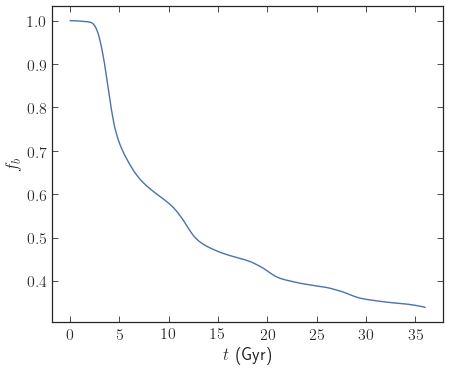

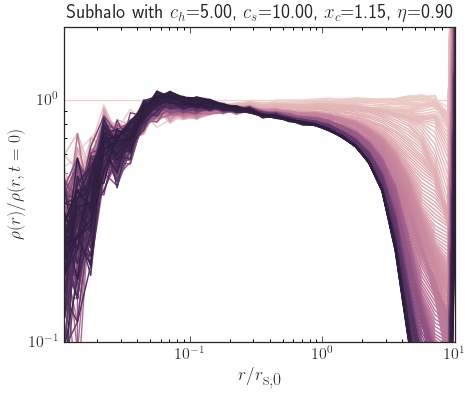

In [38]:
plot_fb_rho(2, 5, 6, 9, normalize=False,by_iso=False)

/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


(<Figure size 504x417.6 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f23fdcaacc0>)

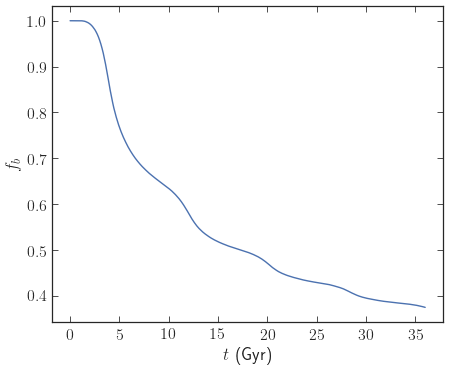

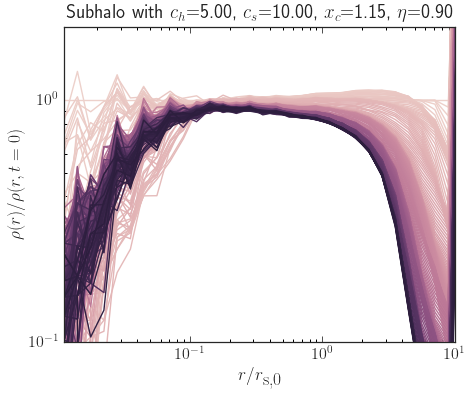

In [41]:
plot_fb_rho_new(2, 5, 6, 9)

/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


(<Figure size 504x417.6 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7eff1e4439e8>)

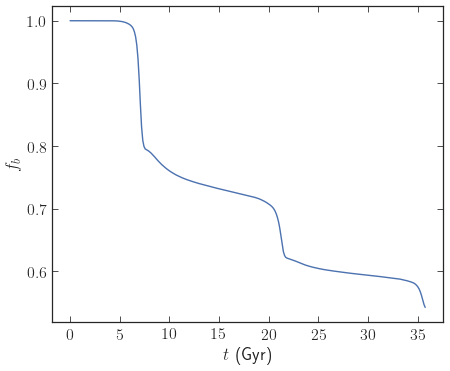

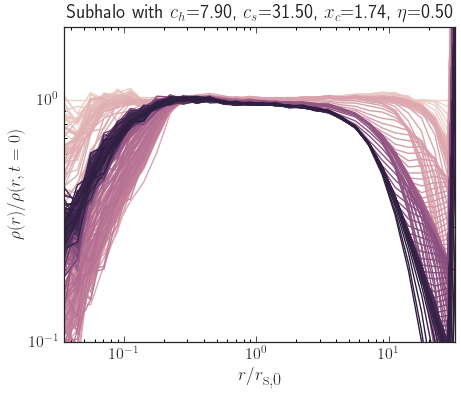

In [19]:
plot_fb_rho_new(4, 10, 9, 5)

# this looks fine, really not sure what is going on with the clist issue...

# they seem to consistently be high cs sims, often with high xc

/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


(<Figure size 504x417.6 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f23e7389940>)

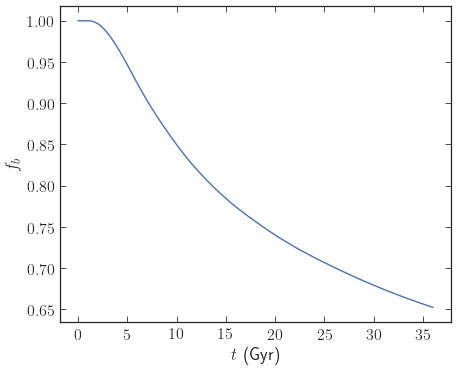

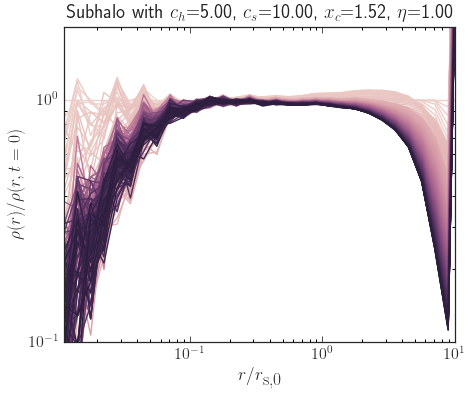

In [64]:
plot_fb_rho_new(2, 5, 8, 10)

/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  


Text(0.5, 1.0, '$c_s$=10.00, radial bins increase light to dark')

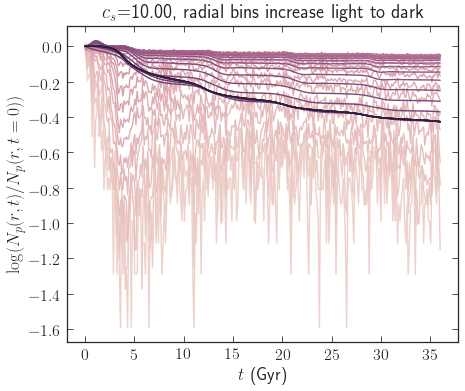

In [44]:
fig,ax = plot()
cn=5
testdat = load_enc_mass(new_dash_dir / ch_dirs[2] / cs_dirs[cn] / xc_dirs[6] / eta_dirs[9],cn)
colorss = sns.cubehelix_palette(testdat.shape[1] - 1)
for i in range(0,len(mass_prof_radii)):
    plt.plot(times,np.log10(testdat[:,1+i] / testdat[0,1+i]), color = colorss[i])
plt.ylabel(r'$\log(N_p(r,t)/N_p(r,t=0))$')
plt.xlabel(r'$t$ (Gyr)')
plt.title(r'$c_s$=%.2f, radial bins increase light to dark'% (cs_vals[cn]))

No handles with labels found to put in legend.


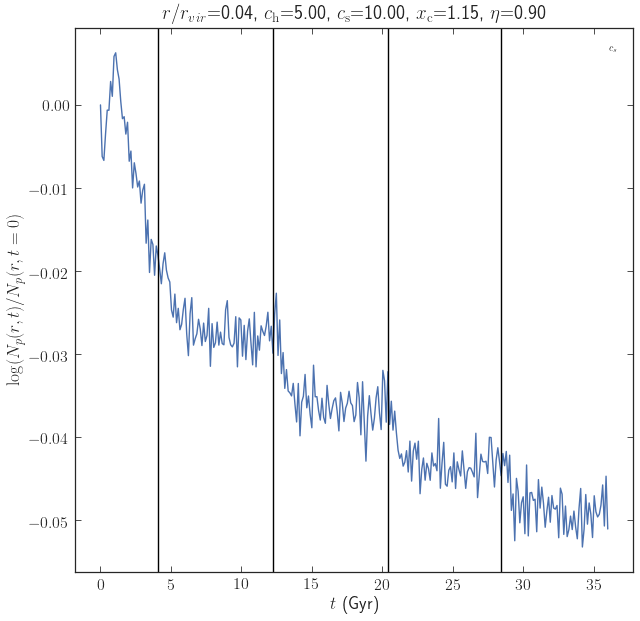

In [63]:
fig,ax = plot(figsize=(10,10))
rn=15
csn=5
chn=2
etn=9
xcn=6
testdat = load_enc_mass(new_dash_dir / ch_dirs[chn] / cs_dirs[csn] / xc_dirs[xcn] / eta_dirs[etn],csn)

sh_evo = np.loadtxt(new_dash_dir / ch_dirs[chn] / cs_dirs[csn] / xc_dirs[xcn] / eta_dirs[etn] / 'subhalo_evo.txt')
orbital_rads = sim_rads(sh_evo[:,1:4])
drdt = orbital_rads[1:] - orbital_rads[:-1] #this is dr/dt
pericenters = np.where(np.logical_and(drdt[1:] > 0, drdt[:-1] < 0))[0] + 1

plt.plot(times,np.log10(testdat[:,1+rn] / testdat[0,1+rn]))
for k in pericenters:
    plt.axvline(times[k], color = 'k')
plt.ylabel(r'$\log(N_p (r,t) / N_p(r,t=0)$')
plt.xlabel(r'$t$ (Gyr)')
plt.title(r'$r/r_{vir}$=%.2f, $c_\mathrm{h}$=%.2f, $c_\mathrm{s}$=%.2f, $x_\mathrm{c}$=%.2f, $\eta$=%.2f' % (mass_prof_radii[rn], ch_vals[chn], cs_vals[csn], xc_vals[xcn], eta_vals[etn]))
plt.legend(title='$c_s$',fontsize=18)
#not very helpful as is, need to look at the 2/5/5/10 and isolated halos probably...

In [46]:
def plot_new(dire,csn):
    rad_num = [10, 14, 17, 29] #.011, .028, .056, 0.89 x rvir
    print(radii[rad_num])
    fig, ax = plt.subplots(nrows=3,ncols=1,figsize=(20,16))
    direct = dire
    pf_fn = direct / 'radprof_rho.txt'
    sh_evo_fn = direct / 'subhalo_evo.txt'
    if(Path(pf_fn).is_file()):
        sim_dat = load_sim(direct,csn,False,normalize=False) #keep all timesteps, don't throw out near pericenter
        ax[0].set_title(r'$c_s=%.2f$' %cs_vals[csn])
        ax[1].set_xlim(-2.5,1.5)
        for k in range(0,3):
            ax[k].yaxis.set_ticks_position('both')
            ax[k].xaxis.set_ticks_position('both')
            ax[k].tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)
        ax[1].axvline(np.log10(sim_eps*cs_vals[csn]),color='k',linestyle='dotted')

        #for transfer functions
        #ax[1,i].plot(np.log10(radii[:30]*cs_vals[csn]),np.log10(sim_dat[300,1:31] / sim_dat[0,1:31]))
        #ax[1,i].axhline(0.,color='k')
        #ax[1,i].set_ylim(-0.8,0.15)

        #for density profiles
        ax[1].plot(np.log10(radii[:30]*cs_vals[csn]),np.log10(sim_dat[300,1:31] * rho200_0))
        analytic_dens = np.zeros(len(radii[:30]))
        for j in range(0,len(analytic_dens)):
            analytic_dens[j] = NFWrho(radii[j], cs_vals[csn])
        ax[1].plot(np.log10(radii[:30]*cs_vals[csn]),np.log10(analytic_dens))
        ax[1].set_ylim(-1.9,4.5)

        ax[0].set_ylim(-3.3,0.2)
        mass_dat = load_enc_mass(direct,csn)
        for j in range(0,len(rad_num)):
            ax[0].plot(times, np.log10(mass_dat[:,1+rad_num[j]]), label='%.3f' % mass_prof_radii[rad_num[j]])
            ax[0].axhline(np.log10(NFWmass(mass_prof_radii[rad_num[j]], cs_vals[csn])),color='k')

        sigmar_dat = load_sigmar_prof(direct,csn)
        #ax[2,i].plot(np.log10(radii[:30]*cs_vals[csn]),sigmar_dat[300,1:31])
        ax[2].plot(np.log10(radii[:30]*cs_vals[csn]),sigmar_dat[0,1:31])
        ax[2].set_xlim(-2.5,1.5)
        ax[2].set_ylim(0.1,1.1)
        ax[2].axvline(np.log10(sim_eps*cs_vals[csn]),color='k',linestyle='dotted')
        #ax[2,i].plot(np.log10(radii[:30]*cs_vals[csn]),np.log10(sigmar_dat[0,1:31]))
        analytic_sigmar = np.zeros(len(radii[:30]))
        for j in range(0, len(analytic_sigmar)):
            analytic_sigmar[j] = NFWsigmar(radii[j], 0., cs_vals[csn])
        ax[2].plot(np.log10(radii[:30]*cs_vals[csn]),analytic_sigmar)
        #ax[0,i].axhline(np.log10(NFWmass(radii[rad_num[j]], cs_vals[csn])),color='k')
            
    ax[2].set_xlabel(r'$\log(r / r_\textrm{s,0})$')
    ax[1].text(-0.5,-0.7,'$t=36$ Gyr',fontsize=18)
    ax[0].set_xlabel(r'$t$ (Gyr)')
    #ax[1,0].set_ylabel(r'$\log(\rho(r,t=36\,\textrm{Gyr}) / \rho(r,t=0))$')
    ax[1].set_ylabel(r'$\log(\rho(r,t=36\,\textrm{Gyr}))$')
    ax[0].set_ylabel(r'$\log(N_p (r) / N_p)$')
    ax[2].set_ylabel(r'$\sigma_r(r) / V_{vir,s}$')
    ax[1].set_xlabel(r'$\log(r / r_\textrm{s,0})$')
    #ax[2,4].text(-0.2,0.2,'$t=36$ Gyr',fontsize=18)
    ax[2].text(-0.2,0.2,'$t=0$ Gyr',fontsize=18)
    ax[0].legend(title=r'$r/r_\textrm{vir,s}$', ncol=2,fontsize=14)
    return fig,ax

[0.01122018 0.02818383 0.05623413 0.8912509 ]


/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log10


(<Figure size 1440x1152 with 3 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f23fc034e80>,
       dtype=object))

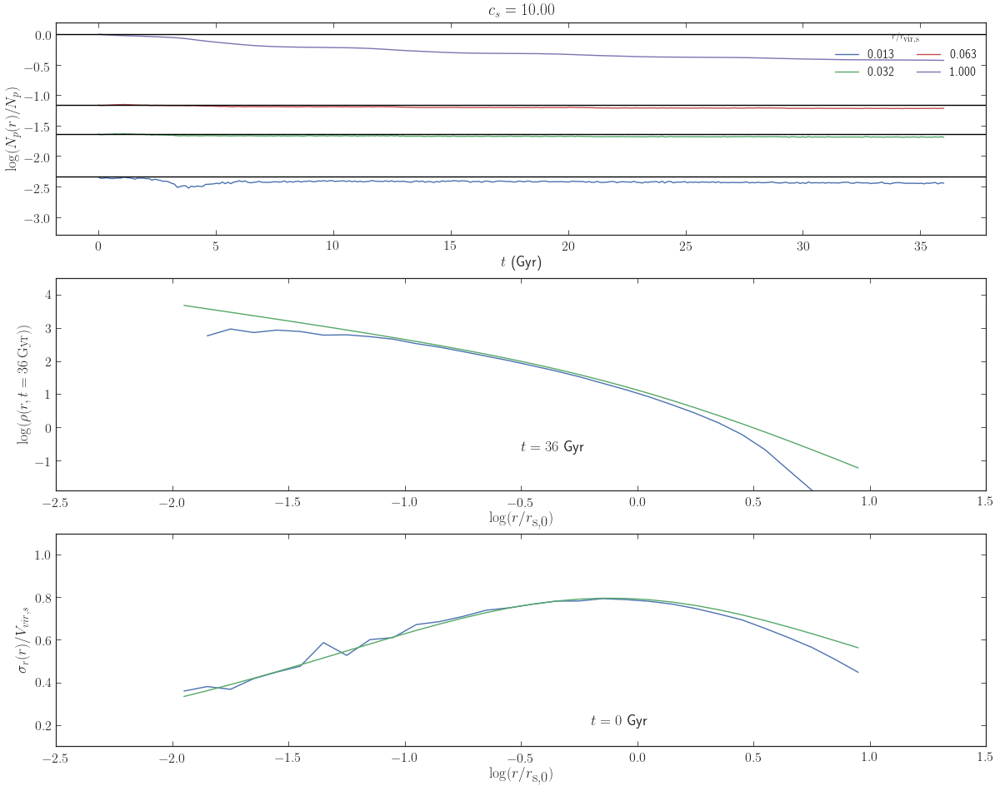

In [49]:
cn = 5
plot_new(new_dash_dir / ch_dirs[2] / cs_dirs[cn] / xc_dirs[6] / eta_dirs[9],cn)

[0.01122018 0.02818383 0.05623413 0.8912509 ]


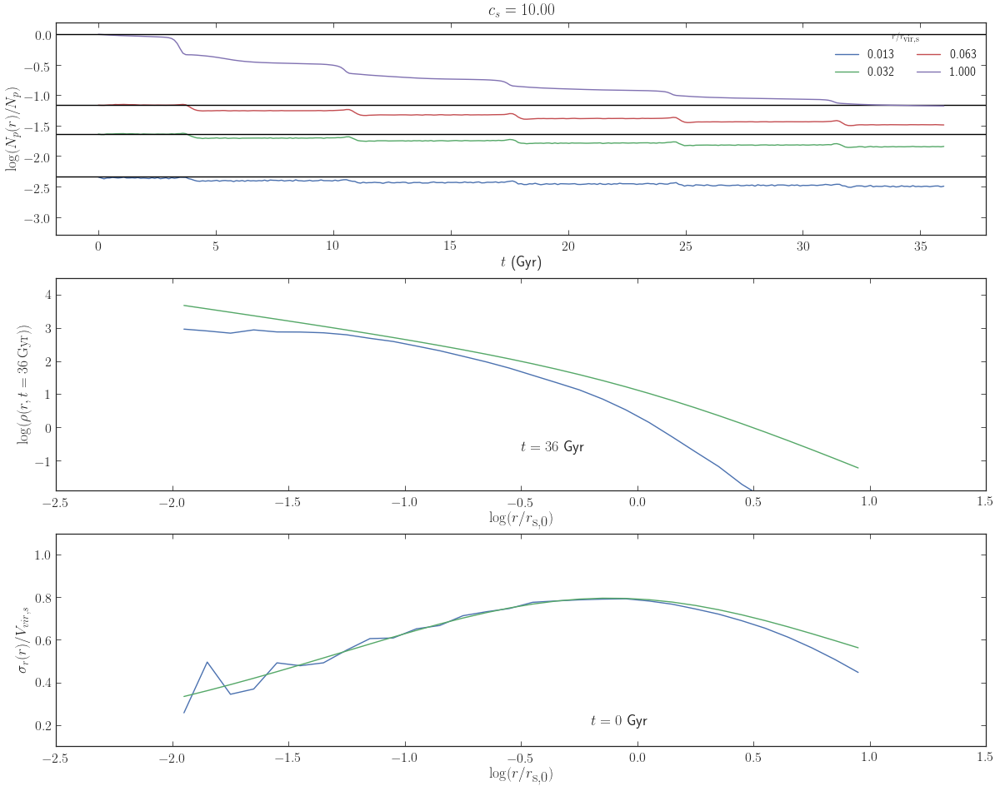

In [78]:
plot_new(new_dash_dir,5)

In [73]:
# using Go's cs0_f and cs5_f isolated halos to do some tests
# verified that for all radii, the enclosed mass is either stable or decreasing with time
# verified no increasing radii
# all that is left to do is look at the transfer function and enclosed mass evolution like in the previous few plots

In [97]:
def plot_fb_rho_iso_new(dire, csn, normalize=False,by_iso=False):
    direct = dire
    pf_fn = direct / 'radprof_rho.txt'
    sh_evo_fn = direct / 'subhalo_evo.txt'
    if(Path(pf_fn).is_file()):
        sim_dat = load_sim(direct,csn,False,normalize,by_iso) #keep all timesteps
        fig, ax = plot()
        plt.plot(times[0:sim_dat.shape[0]],sim_dat[:,0])
        plt.xlabel('$t$ (Gyr)')
        plt.ylabel('$f_b$')
        fig, ax = loglogplot()
        plt.xlabel(r'$r/r_\textrm{s,0}$')
        plt.ylabel(r'$\rho(r) / \rho(r,t=0)$')
        plt.title('Isolated subhalo with $c_s$=%.2f' %cs_vals[csn])
        plt.xlim(np.min(radii*cs_vals[csn]),cs_vals[csn])
        plt.ylim(10**-1,2.)
        for i in range(0,sim_dat.shape[0]):
            plt.plot(radii*cs_vals[csn],sim_dat[i,1:] / sim_dat[0,1:],color=cols[i])
        
    else:
        print("No simulation run here yet!")
    
    return fig, ax

/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


(<Figure size 504x417.6 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f11c41059b0>)

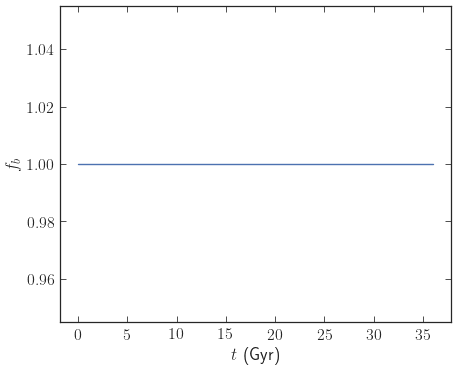

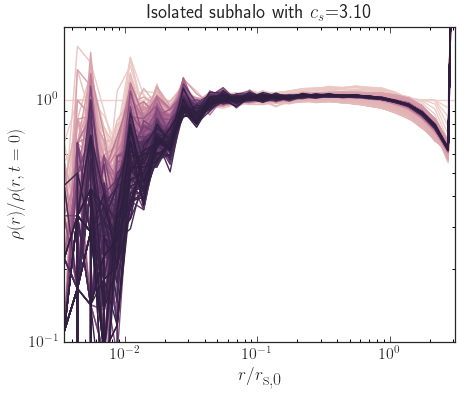

In [98]:
plot_fb_rho_iso_new(iso_test_dir/'cs0/',0)

/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


(<Figure size 504x417.6 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f11b7c2e6a0>)

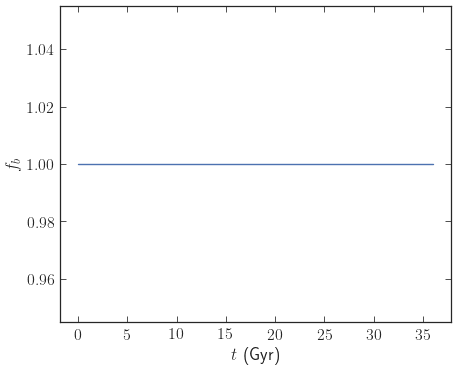

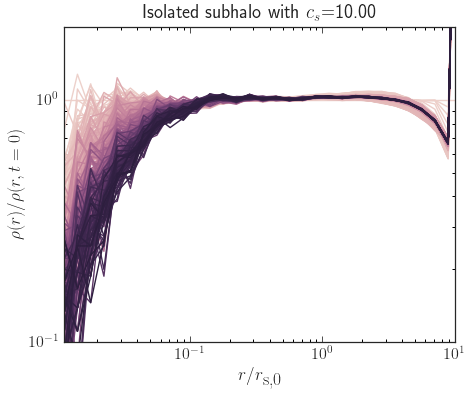

In [99]:
plot_fb_rho_iso_new(iso_test_dir/'cs5/',5)

/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


(<Figure size 504x417.6 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f11b78d5b38>)

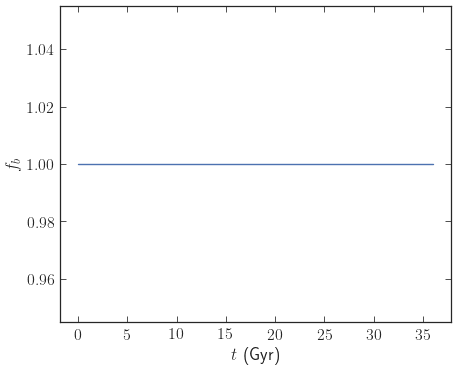

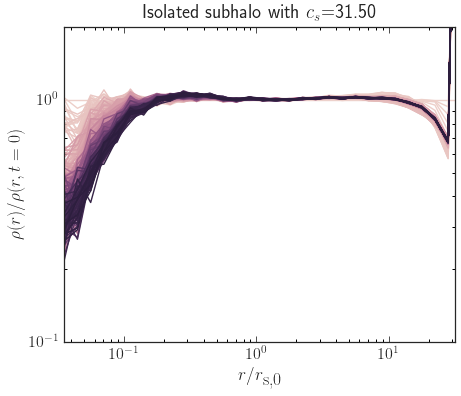

In [100]:
plot_fb_rho_iso_new(iso_test_dir/'cs10/',10)

In [ ]:
plot_fb_rho_iso_new(iso_test_dir/'cs%d/' % 1,1)

/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


[0.01122018 0.02818383 0.05623413 0.8912509 ]
[0.01122018 0.02818383 0.05623413 0.8912509 ]


/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log10
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


[0.01122018 0.02818383 0.05623413 0.8912509 ]


/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log10


[0.01122018 0.02818383 0.05623413 0.8912509 ]


/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


[0.01122018 0.02818383 0.05623413 0.8912509 ]


/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


[0.01122018 0.02818383 0.05623413 0.8912509 ]
[0.01122018 0.02818383 0.05623413 0.8912509 ]


/home/sbg/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/sbg/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encoun

[0.01122018 0.02818383 0.05623413 0.8912509 ]


/home/sbg/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/sbg/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encoun

[0.01122018 0.02818383 0.05623413 0.8912509 ]


/home/sbg/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


[0.01122018 0.02818383 0.05623413 0.8912509 ]


/home/sbg/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/sbg/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encoun

[0.01122018 0.02818383 0.05623413 0.8912509 ]


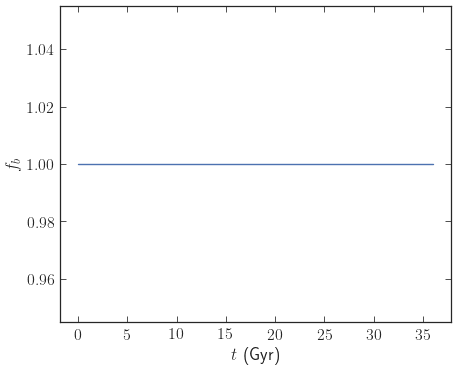

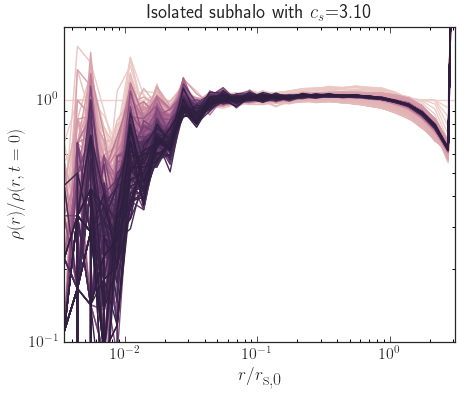

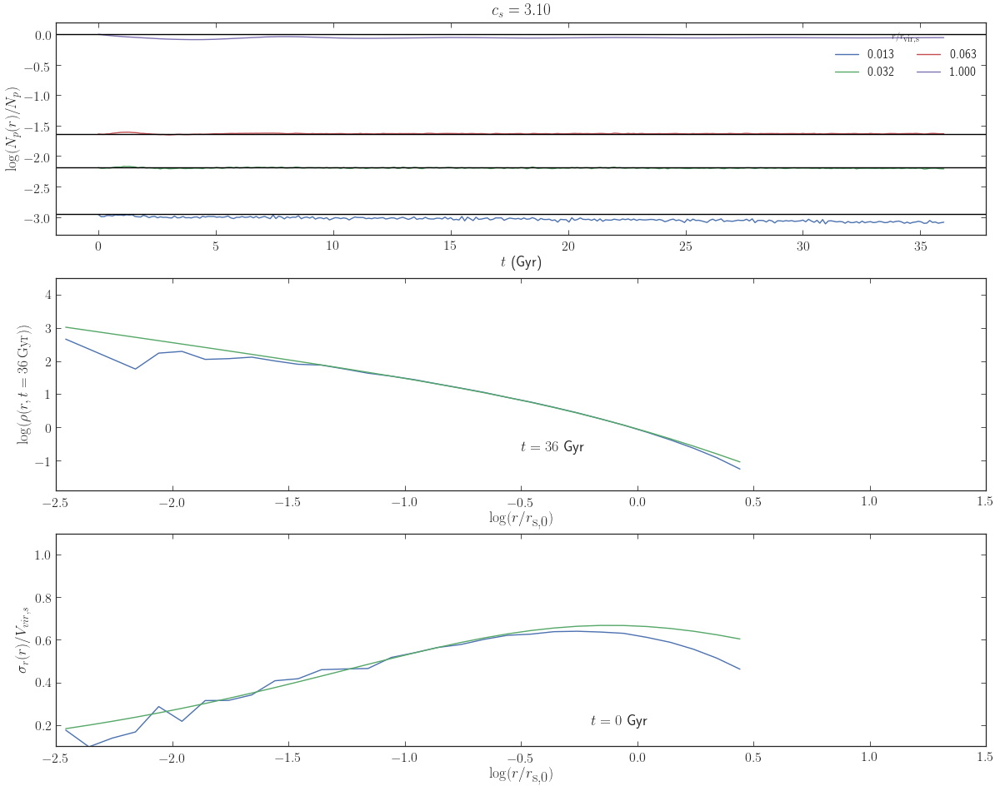

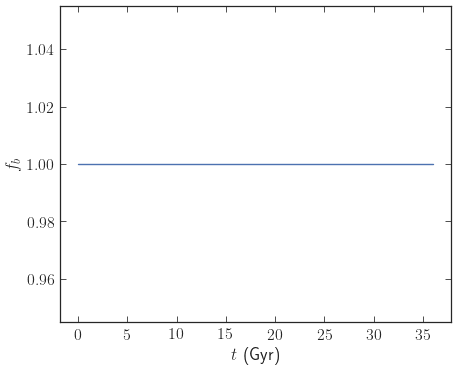

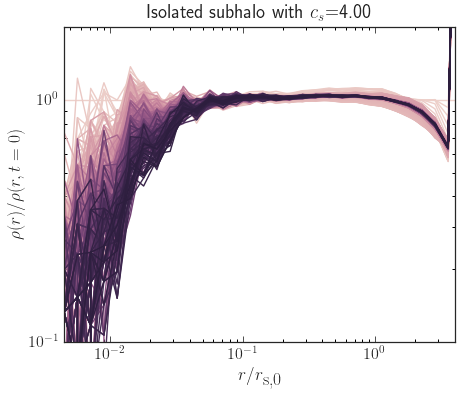

...

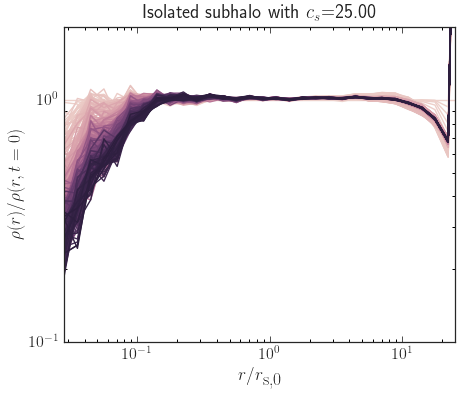

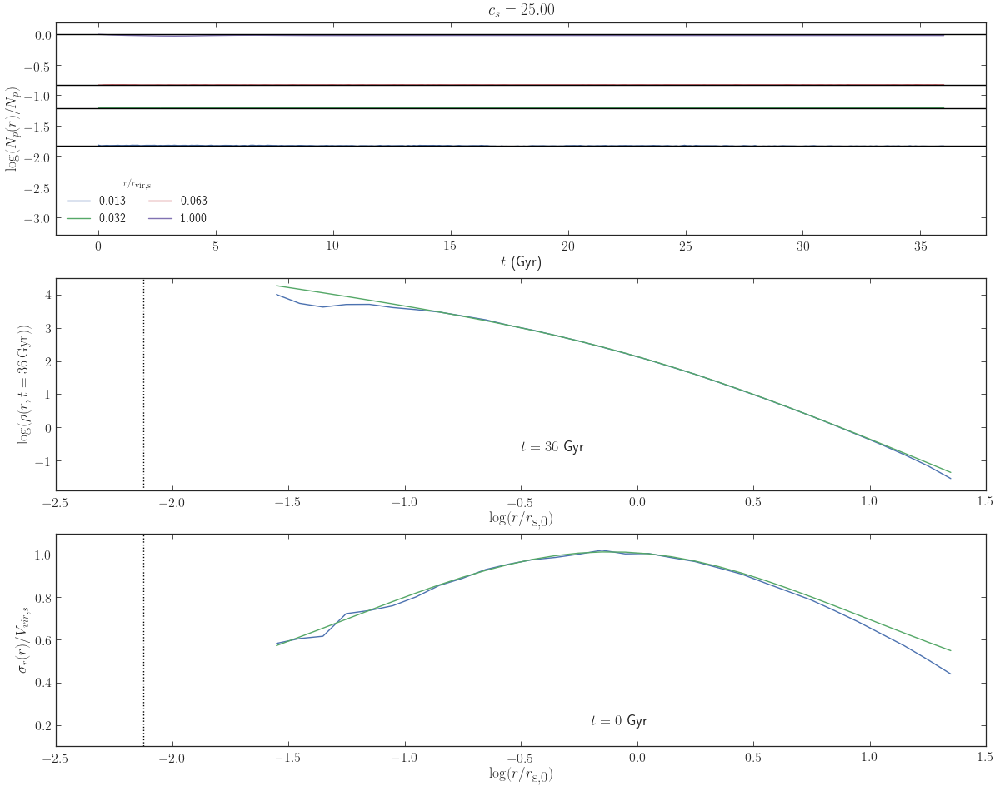

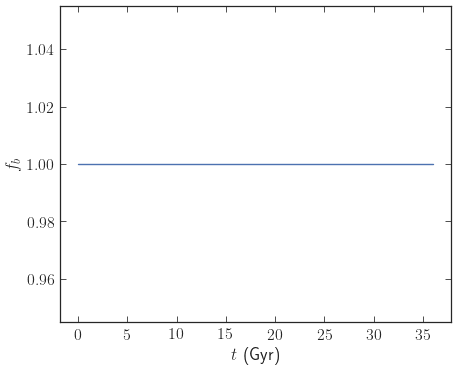

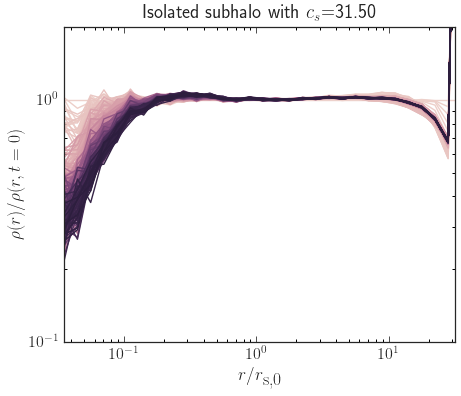

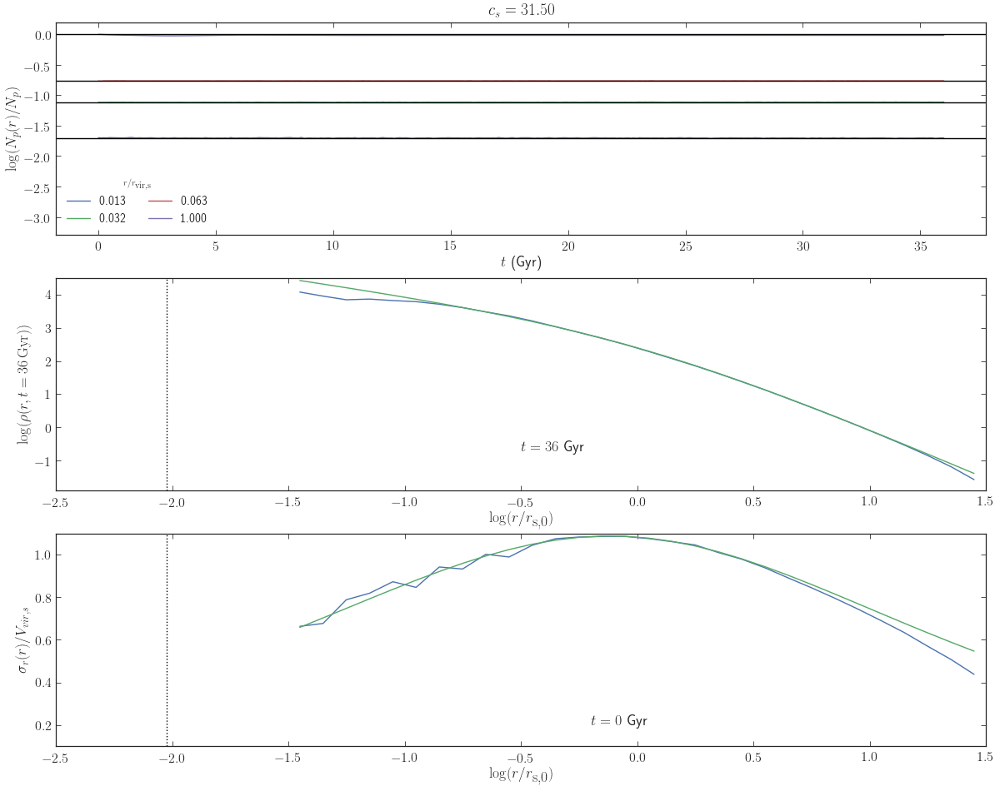

In [114]:
for cn in range(0,11):
    fig,ax = plot_fb_rho_iso_new(iso_test_dir/'cs%d/' % cn,cn)
    plt.savefig(fig_dir/'iso_tf_cs%d.png' % cn, bbox_inches='tight')
    fig,ax = plot_new(iso_test_dir/'cs%d/'% cn,cn)
    plt.savefig(fig_dir/'iso_panelplot_cs%d.png' % cn, bbox_inches='tight')

[0.01122018 0.02818383 0.05623413 0.8912509 ]


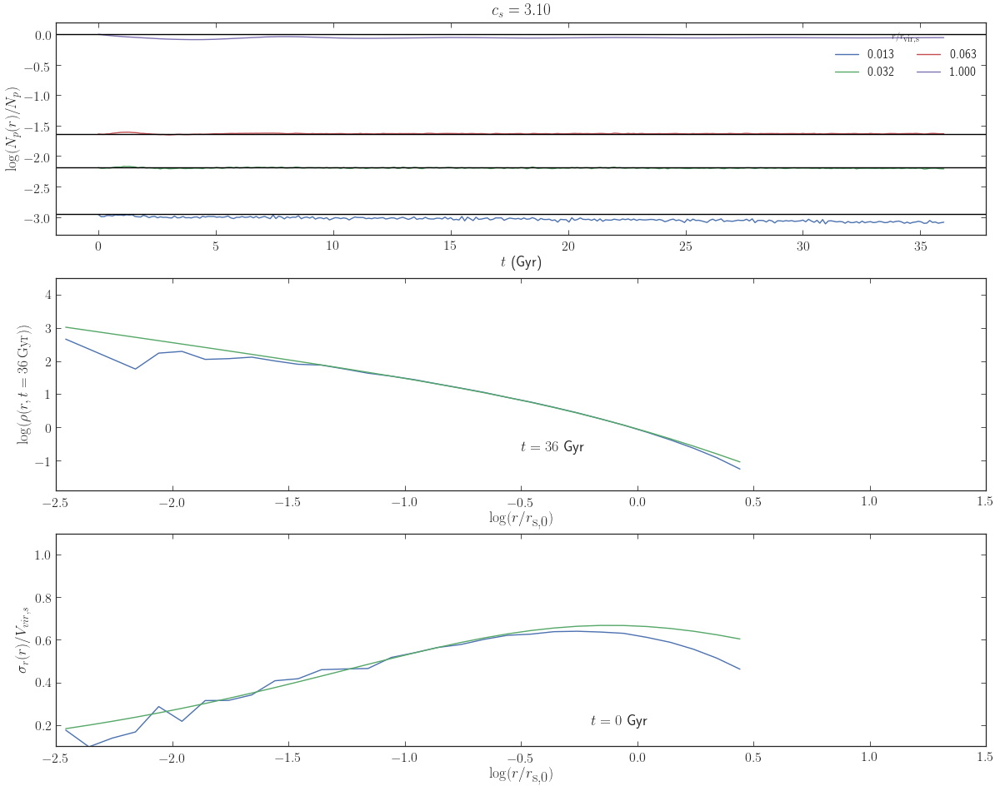

In [105]:
plot_new(iso_test_dir/'cs0/',0)

[0.01122018 0.02818383 0.05623413 0.8912509 ]


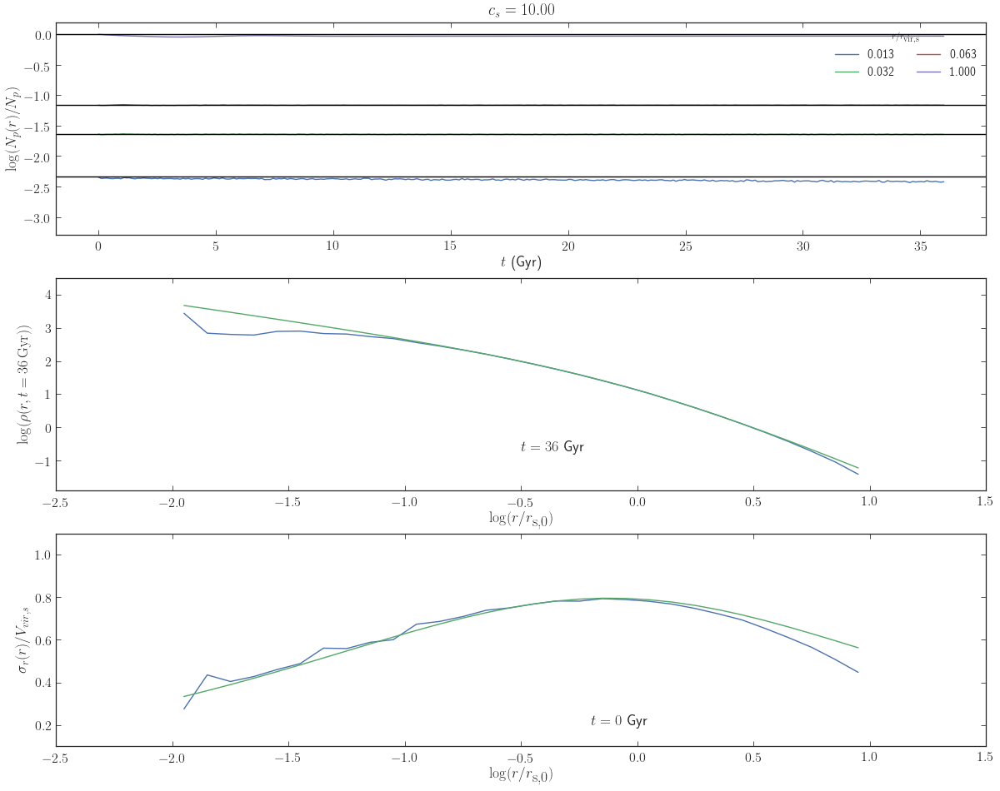

In [106]:
plot_new(iso_test_dir/'cs5/',5)

[0.01122018 0.02818383 0.05623413 0.8912509 ]


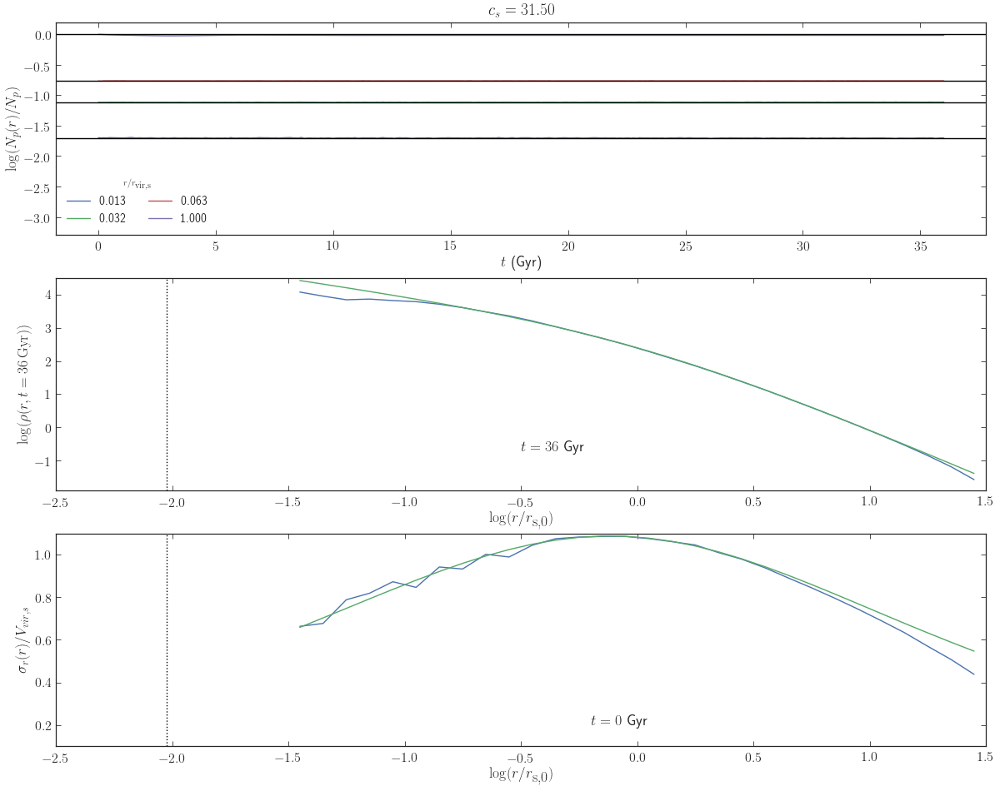

In [107]:
plot_new(iso_test_dir/'cs10/',10)

## Compare evolving circular orbit to isolated halo; tidal deformations

In [81]:
radii*10

array([1.122018e-02, 1.412538e-02, 1.778279e-02, 2.238721e-02,
       2.818383e-02, 3.548134e-02, 4.466836e-02, 5.623413e-02,
       7.079458e-02, 8.912509e-02, 1.122018e-01, 1.412538e-01,
       1.778279e-01, 2.238721e-01, 2.818383e-01, 3.548134e-01,
       4.466836e-01, 5.623413e-01, 7.079458e-01, 8.912509e-01,
       1.122018e+00, 1.412538e+00, 1.778279e+00, 2.238721e+00,
       2.818383e+00, 3.548134e+00, 4.466836e+00, 5.623413e+00,
       7.079458e+00, 8.912509e+00, 1.122018e+01, 1.412538e+01,
       1.778279e+01, 2.238721e+01, 2.818383e+01, 3.548134e+01,
       4.466836e+01, 5.623413e+01, 7.079458e+01, 8.912509e+01])

In [117]:
# load in the new ISO halo and new normal subhalo ch2/cs5/xc8/eta10

# TODO: re-run to get the simulation snapshots so we can do analysis on it

def plot_fb_rho_nvo(ch_num, cs_num, xc_num, eta_num, normalize=False,by_iso=False):
    direct_new = new_dash_dir / ch_dirs[ch_num] / cs_dirs[cs_num] / xc_dirs[xc_num] / eta_dirs[eta_num]
    direct_iso = iso_root / cs_dirs[cs_num]
    pf_fn = direct_new / 'radprof_rho.txt'
    sh_evo_fn = direct_new / 'subhalo_evolution.txt'
    ntimes=50
    time_of_int = 12
    cols = sns.cubehelix_palette(ntimes)
    if(Path(pf_fn).is_file()):
        fig1, ax1 = plot()
        ax1.set_xlabel('$t$ (Gyr)')
        ax1.set_ylabel('$f_b$')
        ax1.axvline(times[time_of_int])
        fig2, ax2 = loglogplot()
        ax2.set_xlabel(r'$r/r_\textrm{s,0}$')
        ax2.set_ylabel(r'$\rho(r)$')
        ax2.set_title('Subhalo with $c_h$=%.2f, $c_s$=%.2f, $x_c$=%.2f, $\eta$=%.2f' %(ch_vals[ch_num], cs_vals[cs_num], xc_vals[xc_num], eta_vals[eta_num]))
        ax2.set_xlim(np.min(radii*cs_vals[cs_num]),cs_vals[cs_num]*10.)
        ax2.axvline(1.04*cs_vals[cs_num], color='k')
        #ax2.set_ylim(10**-1,2.)
        for direct in [direct_new, direct_iso]:
            sim_dat = load_sim(direct,cs_num,False,normalize,by_iso) #keep all timesteps
            ax1.plot(times[0:sim_dat.shape[0]],sim_dat[:,0])

            #for i in range(0,ntimes):#sim_dat.shape[0]):
            #    plt.plot(radii*cs_vals[cs_num],sim_dat[i,1:],color=cols[i])
            plt.plot(radii*cs_vals[cs_num],sim_dat[time_of_int,1:],color='k')
        
    else:
        print("No simulation run here yet!")
    
    return fig, ax

(<Figure size 936x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f23e6cfdcc0>,
       dtype=object))

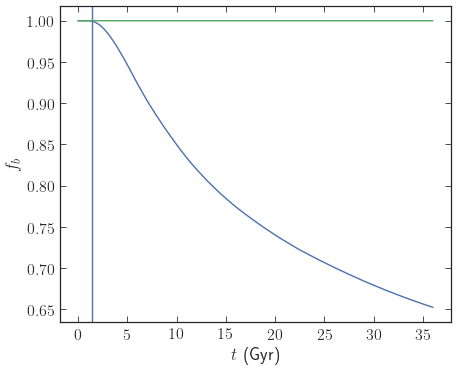

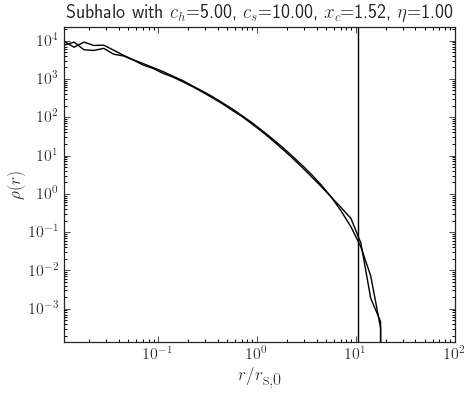

In [118]:
plot_fb_rho_nvo(2, 5, 8, 10, normalize=False,by_iso=False)

# this clearly shows that outside of the tidal radius, there is about an order of magnitude higher densities
# outside at ~2 Gyr than in the isolated halo case, so this actually agrees with our expectation
# now, let's see if we can validate this...

# let's also plot a movie that shows the evolving enclosed mass and plots the two profiles at each time

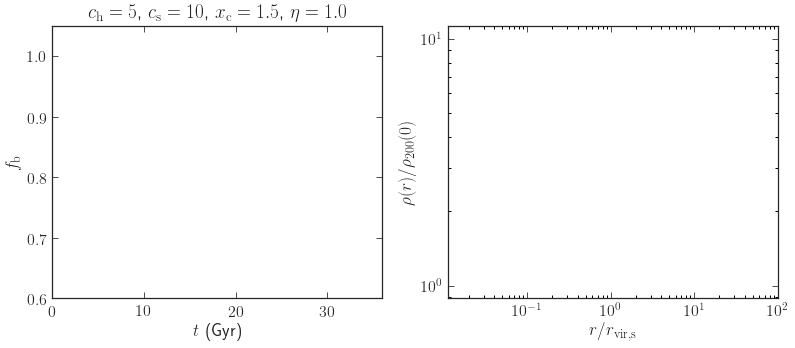

In [115]:
csn = 5
direct_new = new_dash_dir / ch_dirs[2] / cs_dirs[csn] / xc_dirs[8] / eta_dirs[10]
direct_iso = iso_root / cs_dirs[csn]

test_data = load_sim(direct_new, csn, False, normalize=False, by_iso=False)
iso_data = load_sim(direct_iso, csn, False, normalize=False, by_iso=False)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(13, 5))
ax[0].yaxis.set_ticks_position('both')
ax[0].xaxis.set_ticks_position('both')
ax[0].tick_params(axis='both', which='minor',
                  colors='black', width=1.0, length=3.0)
ax[1].yaxis.set_ticks_position('both')
ax[1].xaxis.set_ticks_position('both')
ax[1].tick_params(axis='both', which='minor',
                  colors='black', width=1.0, length=3.0)

ax[0].set_xlim((times[0], times[-1]))
ax[0].set_ylim((0.6, 1.05))
ax[0].set_xlabel('$t$ (Gyr)')
ax[0].set_ylabel('$f_\mathrm{b}$')
ax[0].set_title(
    r'$c_\mathrm{h}=5$, $c_\mathrm{s}=10$, $x_\mathrm{c}=1.5$, $\eta=1.0$')

fb_line, = ax[0].plot([], [], lw=2)

ax[1].loglog()
ax[1].set_xlim((np.min(radii*cs_vals[csn]),cs_vals[csn]*10.))
#ax[1].set_ylim((rho_model(radii[29], test_data[-1, 10], test_data[-1, 1]) * NFWrho(radii[29], test_data[-1, 1]),
#                rho_model(radii[0], test_data[0, 10], test_data[0, 1]) * NFWrho(radii[0], test_data[0, 1])))
ax[1].set_xlabel(r'$r/r_\mathrm{vir,s}$')
ax[1].set_ylabel(r'$\rho(r) / \rho_{200}(0)$')
prof_line, = ax[1].plot([], [], lw=2)
prof_line_iso, = ax[1].plot([], [], lw=2)
#rt_line = ax[1].axvline(x=rt_vs_time(test_data[0, 4:7], test_data[0, 10],
#                                     test_data[0, 1], test_data[0, 0], rt2), color='k', lw=2)

def init():
    fb_line.set_data([], [])
    prof_line.set_data([], [])
    prof_line_iso.set_data([], [])
    return (fb_line, prof_line, prof_line_iso, )

def animate(i):
    print(i)
    x = times[:i]
    y = test_data[:i,0]   
    #rt_val = rt_vs_time(test_data[i, 4:7], test_data[i, 10], test_data[i,1], test_data[i,0], rt2)
    
    fb_line.set_data(x, y)
    prof_line.set_data(radii, test_data[i,1:]) # actually will plot radii
    prof_line_iso.set_data(radii, iso_data[i,1:])
    #rt_line.set_data([rt_val, rt_val], [0,1])
    return (fb_line, prof_line, prof_line_iso, )

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=timesteps, interval=20, blit=True)

In [116]:
HTML(anim.to_html5_video())

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

## Orbital Parameter PDF calculations

In [28]:
#pdfs for the orbital parameters
#see if these can come from something more optimized for numerical speed at some point...
def plor(x,gam):
    return (gam / np.pi)*1.0/(x*x + gam*gam)

def pgauss(x,sig,mu):
    p1 = 1.0 / (np.sqrt(2.*np.pi)*sig)
    p2 = np.exp(-1.*(x-mu)**2 / (2.*sig**2))
    return p1*p2

def pV(x,sig,gam,mu):
        return integrate.quad(lambda xp: pgauss(xp,sig,mu)*plor(x-xp,gam), -1*np.inf, np.inf,full_output=1)[0];

#Go's convolution... we can just use integrate.quad
#def pV(x,sig,gam,mu):
#    p = 0.0;
#    xp = -10.0;
#    dx = 0.01;
#    while(xp <=10.0):
#        p = p + dx*pgauss(xp,sig,mu)*plor(x-xp,gam)
#        xp = xp +  dx;  
#   return p;
    
def pVr(x,B):
    return jiang_A * (np.exp(B*x)-1.)


jiang_sig = 0.077
jiang_mu  = 1.220
jiang_gam = 0.109
jiang_B = 0.049
jiang_A = 1.0 / integrate.quad(lambda xp: np.exp(jiang_B*xp)-1., 0., 1.)[0]
#everything in the pdfs for Vr/V, V/Vvirh look correct, so just need to verify coordinate transformations

In [29]:
print(eta_vals)
print(xc_vals)

[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]
[0.5        0.57434918 0.65975396 0.75785828 0.87055056 1.
 1.14869835 1.31950791 1.51571657 1.74110113 2.        ]


[0.5        0.50697974 0.51405691 0.52123288 0.52850902 0.53588673
 0.54336743 0.55095256 0.55864357 0.56644194 0.57434918 0.58236679
 0.59049633 0.59873935 0.60709744 0.61557221 0.62416527 0.6328783
 0.64171295 0.65067093 0.65975396 0.66896378 0.67830216 0.68777091
 0.69737183 0.70710678 0.71697762 0.72698626 0.73713461 0.74742462
 0.75785828 0.76843759 0.77916458 0.79004131 0.80106988 0.8122524
 0.82359102 0.83508792 0.84674531 0.85856544 0.87055056 0.882703
 0.89502507 0.90751916 0.92018765 0.93303299 0.94605765 0.95926412
 0.97265495 0.9862327  1.         1.01395948 1.02811383 1.04246576
 1.05701804 1.07177346 1.08673486 1.10190512 1.11728714 1.13288389
 1.14869835 1.16473359 1.18099266 1.1974787  1.21419488 1.23114441
 1.24833055 1.26575659 1.2834259  1.30134186 1.31950791 1.33792755
 1.35660433 1.37554182 1.39474367 1.41421356 1.43395525 1.45397252
 1.47426922 1.49484925 1.51571657 1.53687518 1.55832916 1.58008262
 1.60213976 1.62450479 1.64718203 1.67017584 1.69349062 1.71713087

C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in sqrt
  import sys
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in sqrt
  if __name__ == '__main__':


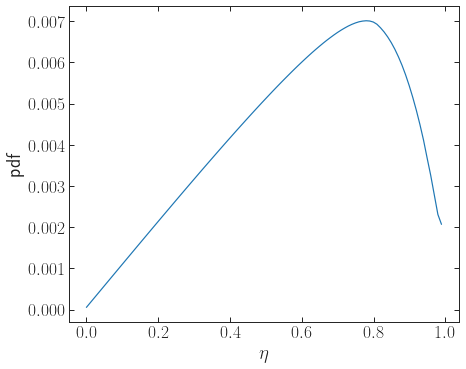

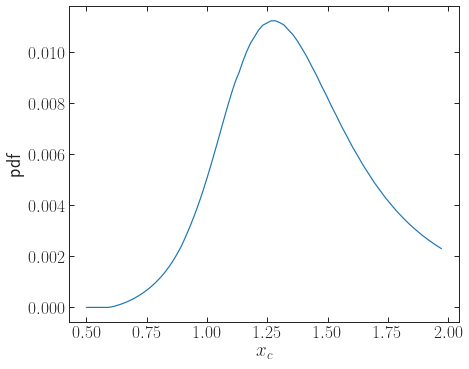

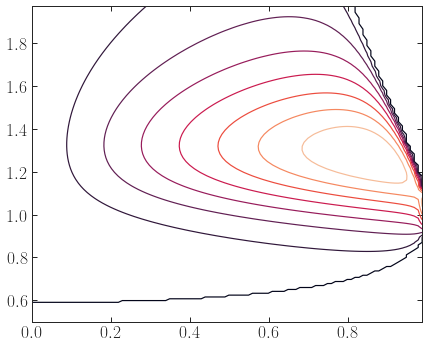

In [30]:
#translation of Go's code; only thing that disagrees with mine upon visual inspection is the result after
#Jacobian, so our Jacobian was messed up; all good otherwise

#can probably speed it up by reducing calls by doing array-wise calculation of Jacobian instead of each iteration

def transf(eta, xc, ch):
    V_Vvir = np.sqrt((2.*np.log(1+ch) - (2*np.log(1+ch*xc) - NFWf(ch*xc))/xc)/NFWf(ch))
    Vt_Vvir = eta*np.sqrt(xc * NFWf(ch*xc)/NFWf(ch))
    Vr_V = np.sqrt(1. - Vt_Vvir**2 / V_Vvir**2)
    return np.array([Vr_V, V_Vvir])

#this method depends on the bin width, so we need to do some factor of 10 such that we still get all of the
#necessary samples


n_prob_bins = 100
xcs = np.logspace(np.log10(0.5),np.log10(2.0),n_prob_bins+1)
ets = np.linspace(0.0,0.999,n_prob_bins+1)
print(xcs)
print(ets)
vr_vt_mat = np.zeros((len(xcs),len(ets),2)) #eta is x, xc is y
for i in range(0,len(xcs)):
    for j in range(0,len(ets)):
        vr_vt_mat[i,j,:] = transf(ets[j], xcs[i], 5.) #c_h=5
#my transformations were fine, but the jacobian wasn't working properly...

pdf_mat = np.zeros((n_prob_bins,n_prob_bins))
for i in range(0,n_prob_bins):
    for j in range(0,n_prob_bins):
        pdf_mat[i,j] = pVr(vr_vt_mat[i,j,0], jiang_B) * pV(vr_vt_mat[i,j,1],jiang_sig, jiang_gam, jiang_mu)
        if(np.isnan(pdf_mat[i,j])):
            pdf_mat[i,j] = 0
            continue
        else:
            pdf_mat[i,j] *= np.abs(np.sqrt(1-ets[j]**2) - np.sqrt(1-ets[j+1]**2)) * np.abs(np.sqrt(1/xcs[i]) - np.sqrt(1/xcs[i+1]))
                
fig, ax = plot()
plt.plot(ets[:-1],np.nansum(pdf_mat,axis=0)); plt.xlabel(r'$\eta$'); plt.ylabel('pdf')
fig, ax = plot()
plt.plot(xcs[:-1],np.nansum(pdf_mat,axis=1)); plt.xlabel(r'$x_c$'); plt.ylabel('pdf')

#the xc values vary along 0th axis, eta values vary along 1st axis...

fig, ax = plot()
plt.contour(ets[:-1],xcs[:-1],pdf_mat)

In [31]:
#NFW properties: potential, enclosed mass
#need to solve conservation of energy equation for Vr, Vtheta

def NFWpotential(r, Vvir, Rvir, ch):
    top = -1. * Vvir * Vvir * np.log(1. + ch*r/Rvir)
    bottom = NFWf(ch)*r/Rvir
    return top/bottom

def NFWmass(r,Mvir,Rvir, c):
    return Mvir * NFWf(c*r/Rvir) / NFWf(c)

def NFWVc2(r, Mvir, Rvir, c):
    #squared circular velocity #G=1
    return NFWmass(r, Mvir, Rvir, c) / r

def NFWVc(r, Mvir, Rvir, c):
    #circular velocity #G=1
    return np.sqrt(NFWmass(r, Mvir, Rvir, c) / r)

## Comparison to Hayashi and Penarrubia
## Stacking by orbital parameters/concentrations

In [63]:
#hayashi et al 2003 overplot
def rte(fb):
    return 10**(1.02 + 1.38*np.log10(fb) + 0.37*(np.log10(fb))**2)

def ft(fb):
    return 10**(-0.007 + 0.35*np.log10(fb) + 0.39*(np.log10(fb))**2 + 0.23*(np.log10(fb))**3)

def strip_mod_hayashi(r,fb):
    return ft(fb) / (1. + (r/rte(fb))**3)

#now i just need the original NFW profiles (relaxed and not) for the different simulations cs values...
#find one that has all the cs values and then grab the relevant profiles?

In [59]:
#penarrubia 2010 method
#haven't yet figured out how to fix this for r_vir,s=1
#I did the calculation originally assuming that r_s,0=1 and haven't been able to convert/fix it yet...

def gen_form(r,rho_0, r_s, alpha, beta, gamma):
    top = rho_0
    bottom = (r/r_s)**gamma * (1+(r/r_s)**alpha)**((beta-gamma)/alpha)
    return top / bottom

#ratio between new vmax/rmax and original vmax/rmax
#x is bound fraction
def g_v_r(x,mu,eta):
    return 2**mu * x**eta / (1+x)**mu

def VmaxNFW(c):
    Vvir = 1. / np.sqrt(c) #model units
    return 0.465 * Vvir * np.sqrt(c / NFWf(c))

def rmaxNFW(c):
    rs = 1.0 #/ c #always in model units
    return 2.163*rs
    
def rsp_solve_nfw(rsp, rmaxp):
    return ((rmaxp/rsp)**2 / (1 + rmaxp/rsp)**2) - NFWf(rmaxp/rsp)

def rsp_solve_b5(rsp, rmaxp):
    return rmaxp**2 + 4*rmaxp*rsp - 3*rsp**2
    #positive root is #

def pen_new_prof(r, fb, cs):
    if(fb <= 0.9):
        return pen_new_prof_b5(r, fb, cs)
    else:
        alpha = 1.0
        beta = 3.0
        gamma = 1.0
        vmp = g_v_r(fb, mu=0.40, eta=0.30)*VmaxNFW(cs)
        rmp = g_v_r(fb, mu=-0.30, eta=0.40)*rmaxNFW(cs)
        rsp = ridder(rsp_solve_nfw, 0.001, 30., args=(rmp))
        rho0p = vmp**2 * rmp / (4 * np.pi * rsp**3 * NFWf(rmp/rsp))
        return(gen_form(r,rho0p, rsp, alpha, beta, gamma))
    
def pen_new_prof_b5(r, fb, cs):
    alpha = 1.0
    beta = 5.0
    gamma = 1.0
    vmp = g_v_r(fb, mu=0.40, eta=0.30)*VmaxNFW(cs) #t=0 was still NFW
    rmp = g_v_r(fb, mu=-0.30, eta=0.40)*rmaxNFW(cs) #t=0 was still NFW
    rsp = ridder(rsp_solve_b5, 0.0001, 30., args=(rmp))
    rho0p = 3*(rmp+rsp)**3 * vmp**2 / (2*np.pi * rmp * (rmp+3*rsp) * rsp**3)
    return(gen_form(r,rho0p, rsp, alpha, beta, gamma))

def rho0(rs,c):
    return 1.0 / (4*np.pi * rs**3 * NFWf(c))

#NFW gamma=1, beta=3, alpha=1
#for vmax, mu=0.40, eta=0.30
#for rmasx mu=-0.30, eta=0.40

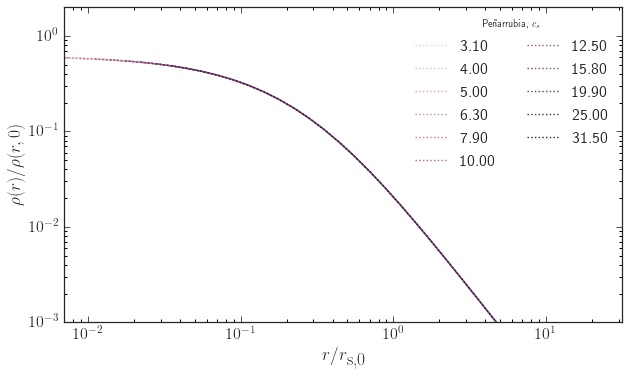

In [81]:
fig, ax = loglogplot(figsize=(10,5.8))
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i in range(0,len(cs_vals)):
    pen_rhos = np.zeros(len(radii))
    for j in range(0,len(radii)):
        pen_rhos[j] = pen_new_prof(radii[j]*cs_vals[i], 0.01, cs_vals[i]) / gen_form(radii[j]*cs_vals[i],rho0(1.,cs_vals[i]), 1., 1, 3, 1)
        #pen_rhos[j] = pen_new_prof(radii[j], 0.01, cs_vals[i]) / gen_form(radii[j],rho0(1.,cs_vals[i]), 1., 1, 3, 1)
    plt.plot(radii*cs_vals[i], pen_rhos, linestyle='dotted', color=stacked_cols[i],label='%.2f' %cs_vals[i])

plt.xlabel(r'$r/r_\textrm{s,0}$');
plt.xlim(7*10**-3,31.5)#10**0);
plt.ylim(10**-3,2*10**0)
#plt.ylabel(r'$\rho(r)$');
plt.ylabel(r'$\rho(r)/\rho(r,0)$')
plt.legend(title=r'Pe{\~ n}arrubia, $c_s$',ncol=2)
#should the profiles be normalized to what they looked like at the beginning?

# penarrubia profiles look identical for different c_s values when plotted in terms of r/rs
# however, in r/rvir they are different
# higher c_s corresponds to the profile being truncated further in

In [60]:
# generate a test, see if g_v_r(f_b) actually gives the same as when we compute the Vmax/Rmax

def penarrubiaMass(r, fb, cs):
    return 4*np.pi*quad(lambda x: x**2 * pen_new_prof(x*cs, fb, cs), 0, r)[0]                                                     

def pen_vm_rm(fb, cs, normed=True):
    #rmax = root(lambda x: 4*np.pi*x**3 * strip_mod_hayashi(x*cs, fb)
    #            * NFWrho(x, cs) - hayashiMass(x, fb, cs), g_v_r(fb, -0.3,0.4)*2.163/cs).x[0]
    rmax = root_scalar(lambda x: 4*np.pi*x**3 * pen_new_prof(x*cs, fb, cs) - penarrubiaMass(x, fb, cs), bracket=(10**-3, 1.2)).root
    vmax = np.sqrt(G*penarrubiaMass(rmax, fb, cs)*cs**3 / rmax)
    # need these as ratios...
    if(normed):
        # root(lambda x: x**3 * NFWrho(x, cs) - NFWmass(x, cs), 2.163/cs).x[0]
        rmax0 = 2.163/cs
        # np.sqrt(G*NFWmass(rmax0, cs) / rmax0) #NFW for IC
        vmax0 = 0.465*np.sqrt(cs/NFWf(cs))
        return rmax/rmax0, vmax/vmax0
    else:
        return rmax, vmax
    
fbv = 0.5
csn = 5
print(pen_vm_rm(fbv, cs_vals[csn]))
print(g_v_r(fbv, -0.3, 0.4)) #rmax
print(g_v_r(fbv, 0.4,0.3)) #vmax
# ah, something is probably wrong with my normalization, but it doesn't matter since we always divide it out
# in the density profile plots
# there is a cs**3 dependence...
# that fixed it! Penarrubia model is self-consistent

(0.6951945851587181, 0.9113107554928844)
0.6951945851579547
0.9113107554928843


/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in true_divide
/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide


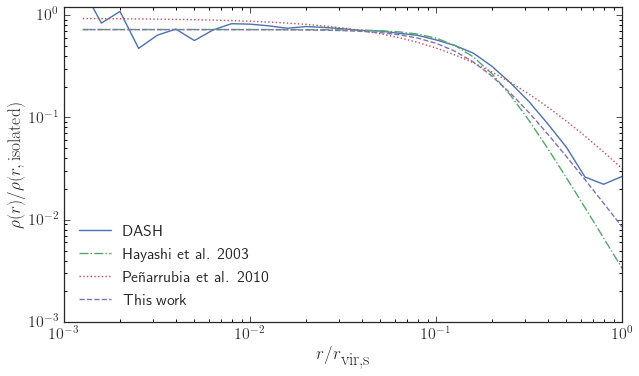

In [674]:
#test to make sure that the agreement is strong between model and simulation
#for one simulation in particular that is well converged
#let's load one simulation and then plot hayashi and penarrubia against it

#the curves look consistent with Fig 8 of dash, so we should be fine...

csv = 5
ts  = 150
#print(sim_dat[ts,0])
sim_dat = load_sim(dash_root / ch_dirs[2] / cs_dirs[csv] / xc_dirs[5] / eta_dirs[5],csv,True,True)
fig, ax = loglogplot(figsize=(10,5.8))
plt.plot(radii, sim_dat[ts, 1:], label='DASH')

mod_rhos = np.zeros(len(radii))
mp = paramet_hayashi_deluxe_v5(np.column_stack((sim_dat[ts, 0],cs_vals[csv])),fp_weights_3rt_freedelta_fbdep)
#mp, mcov = best_params[i], pcov = curve_fit(exp_decay_wrap(mean_cs[i]), np.log10(radii[3:30]*mean_cs[i]), np.log10(stacked_profiles[i,3:30]), p0=[0.9,1.], bounds=(0.,[1.,np.inf]))
for j in range(0, len(radii)):
    mod_rhos[j] = hayashi_deluxe(radii[j]*cs_vals[csv], mp[0])
    #mod_rhos[j] = 10**exp_decay_wrap(mean_cs[i])(np.log10(radii[j]*mean_cs[i]), *mp)

pen_rhos = np.zeros(len(radii))
for j in range(0,len(radii)):
    pen_rhos[j] = pen_new_prof(radii[j]*cs_vals[csv], sim_dat[ts, 0], cs_vals[csv]) / gen_form(radii[j]*cs_vals[csv],rho0(1.,cs_vals[csv]), 1., 1, 3, 1)
    #pen_rhos[j] = pen_new_prof(radii[j], sim_dat[ts, 0], cs_vals[csv]) / gen_form(radii[j],rho0(1.,cs_vals[csv]), 1., 1, 3, 1)

plt.plot(radii, strip_mod_hayashi(radii*cs_vals[csv],sim_dat[ts, 0]), 
         linestyle='dashdot', label='Hayashi et al. 2003')
plt.plot(radii, pen_rhos, linestyle='dotted',
         label='Pe{\~ n}arrubia et al. 2010')
plt.plot(radii, mod_rhos, linestyle='--',
          label='This work')
    
plt.xlabel(r'$r/r_\textrm{vir,s}$');
plt.xlim(0.001, 1)#10**0);
plt.ylim(10**-3,1.2*10**0)
#plt.ylabel(r'$\rho(r)$');
plt.ylabel(r'$\rho(r)/\rho(r,\textrm{isolated})$')
plt.legend()
#Hayashi agrees really well... Penarrubia seems off...

In [336]:
def exp_decay_wrap(cs):
    def exp_decay_func(r, *mp): #need to give it c_s
        #f_t, c_s, and r_t
        return np.log10(mp[0] * np.exp(-1.* (10**r) * ((cs - mp[1])/(cs*mp[1]))))
    #can try capturing f_t first... would solve the inner noise issue..
    return exp_decay_func

In [61]:
def generate_stacks(bins=5, logfb_min=-2, logfb_max=0., cs_num=5, fmt='mean'):
    if(fmt=='mean'):
        stacked_profiles = np.zeros((bins,n_profile_pts))
        stacked_stds = np.zeros((bins,n_profile_pts))
        mean_cs = np.zeros(bins)
        fb_bin_edges = np.logspace(logfb_min,logfb_max,bins+1)
        fb_bin_centers = 10**((np.log10(fb_bin_edges[1:]) + np.log10(fb_bin_edges[:-1]))*0.5)
        for i in range(0,bins):
            sub_mat = dat_matrix[np.logical_and(dat_matrix[:,4] >= fb_bin_edges[i], dat_matrix[:,4] < fb_bin_edges[i+1])]
            sub_mat = sub_mat[sub_mat[:,1] == cs_vals[cs_num]]
            mean_cs[i] = np.mean(sub_mat[:,1])
            stacked_profiles[i,:] = np.mean(sub_mat[:,5:], axis=0)
            stacked_stds[i,:] = np.std(sub_mat[:,5:], axis=0)
    elif(fmt=='median'):
        stacked_profiles = np.zeros((bins,n_profile_pts))
        stacked_stds = np.zeros((bins,n_profile_pts,2))
        mean_cs = np.zeros(bins)
        fb_bin_edges = np.logspace(logfb_min,logfb_max,bins+1)
        fb_bin_centers = 10**((np.log10(fb_bin_edges[1:]) + np.log10(fb_bin_edges[:-1]))*0.5)
        for i in range(0,bins):
            sub_mat = dat_matrix[np.logical_and(dat_matrix[:,4] >= fb_bin_edges[i], dat_matrix[:,4] < fb_bin_edges[i+1])]
            sub_mat = sub_mat[sub_mat[:,1] == cs_vals[cs_num]] #only taking one cs value
            mean_cs[i] = np.median(sub_mat[:,1])
            stacked_profiles[i,:] = np.median(sub_mat[:,5:], axis=0)
            stacked_stds[i,:] = np.column_stack((stacked_profiles[i,:] - np.quantile(sub_mat[:,5:],0.16, axis=0), np.quantile(sub_mat[:,5:],0.84,axis=0) - stacked_profiles[i,:]))
    return stacked_profiles, stacked_stds, mean_cs, fb_bin_centers, fb_bin_edges

mean_or_median = 'median'
bins=5
csn=5
stacked_profiles, stacked_stds, mean_cs, fb_bin_centers, fb_bin_edges = generate_stacks(bins=bins, logfb_min=-2, logfb_max=0., cs_num=csn, fmt=mean_or_median)

In [86]:
mean_cs

array([10., 10., 10., 10., 10.])

C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


[25. 25. 25. 25. 25.]


C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: RuntimeWarning: divide by zero encountered in log10


[10. 10. 10. 10. 10.]


C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:99: RuntimeWarning: divide by zero encountered in log10


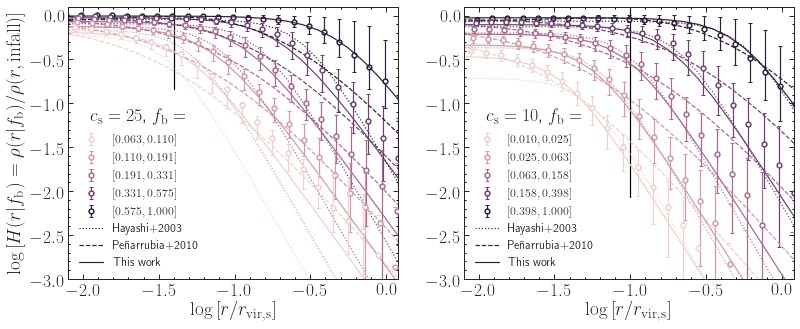

In [64]:
# this one only works for median and returns stds as differences in log space

def generate_stacks(bins=5, logfb_min=-2, logfb_max=0., cs_num=5, fmt='mean'):
    if(fmt=='median'):
        stacked_profiles = np.zeros((bins,n_profile_pts))
        stacked_stds = np.zeros((bins,n_profile_pts,2))
        mean_cs = np.zeros(bins)
        fb_bin_edges = np.logspace(logfb_min,logfb_max,bins+1)
        fb_bin_centers = 10**((np.log10(fb_bin_edges[1:]) + np.log10(fb_bin_edges[:-1]))*0.5)
        for i in range(0,bins):
            sub_mat = dat_matrix[np.logical_and(dat_matrix[:,4] >= fb_bin_edges[i], dat_matrix[:,4] < fb_bin_edges[i+1])]
            sub_mat = sub_mat[sub_mat[:,1] == cs_vals[cs_num]] #only taking one cs value
            mean_cs[i] = np.median(sub_mat[:,1])
            stacked_profiles[i,:] = np.median(sub_mat[:,5:], axis=0)
            stacked_stds[i,:] = np.column_stack((np.log10(stacked_profiles[i,:]) - np.log10(np.quantile(sub_mat[:,5:],0.16, axis=0)), np.log10(np.quantile(sub_mat[:,5:],0.84,axis=0)) - np.log10(stacked_profiles[i,:])))
    return stacked_profiles, stacked_stds, mean_cs, fb_bin_centers, fb_bin_edges

mean_or_median = 'median'
bins=5
csn=5
stacked_profiles, stacked_stds, mean_cs, fb_bin_centers, fb_bin_edges = generate_stacks(bins=bins, logfb_min=-2, logfb_max=0., cs_num=csn, fmt=mean_or_median)

##### FIGURE FOR THE PAPER #####
fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(13,5))
ax[0].yaxis.set_ticks_position('both')
ax[0].xaxis.set_ticks_position('both')
ax[0].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
#ax[0].loglog()
ax[1].yaxis.set_ticks_position('both')
ax[1].xaxis.set_ticks_position('both')
ax[1].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
#ax[1].loglog()
stacked_cols = sns.cubehelix_palette(bins)

ax[0].xaxis.set_minor_locator(MultipleLocator(0.1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.1))
ax[1].xaxis.set_minor_locator(MultipleLocator(0.1))
ax[1].yaxis.set_minor_locator(MultipleLocator(0.1))

mean_or_median = 'median'
bins=5
csn=9
stacked_profiles, stacked_stds, mean_cs, fb_bin_centers, fb_bin_edges = generate_stacks(bins=bins, logfb_min=-1.2, logfb_max=0., cs_num=csn, fmt=mean_or_median)
print(mean_cs)

for i in range(0,bins):
    #plot data
    #NOTE THAT THE ERRORS ARE ALREADY LOGGED FOR THIS FIGURE
    (ln, caps, _) = ax[0].errorbar(np.log10(radii* 10**(0.05*i/bins)), np.log10(stacked_profiles[i,:]), stacked_stds[i,:] if mean_or_median=='mean' else stacked_stds[i,:].T, color=stacked_cols[i],
                 label='$[%.3f, %.3f]$' % (fb_bin_edges[i], fb_bin_edges[i+1]), zorder=bins-i, 
                 marker='o', mfc='white', mew=1.5, linestyle='None', capsize=2)
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(1)

    mod_rhos = np.zeros(len(radii))
    mp = paramet_hayashi_deluxe_v52(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_v52_avgnfw_no1Rv_all)

    for j in range(0, len(radii)):
        mod_rhos[j] = hayashi_deluxe(radii[j]*mean_cs[i], mp[0])

    #generate penarrubia model
    pen_rhos = np.zeros(len(radii))
    for j in range(0,len(radii)):
        pen_rhos[j] = pen_new_prof(radii[j]*mean_cs[i], fb_bin_centers[i], mean_cs[i]) / gen_form(radii[j]*mean_cs[i],rho0(1.,mean_cs[i]), 1., 1, 3, 1)
    
    #plot hayashi and penarrubia
    if(i==bins-1):
        ax[0].plot(np.log10(radii), np.log10(strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i])), 
                 color=stacked_cols[i], linestyle='dotted', label='Hayashi+2003')
        ax[0].plot(np.log10(radii), np.log10(pen_rhos), linestyle='dashed', color=stacked_cols[i],
                 label='Pe{\~ n}arrubia+2010')
        ax[0].plot(np.log10(radii), np.log10(mod_rhos), linestyle='solid', color=stacked_cols[i],
                  label='This work')
    else:
        ax[0].plot(np.log10(radii), np.log10(strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i])), color=stacked_cols[i], linestyle='dotted')
        ax[0].plot(np.log10(radii), np.log10(pen_rhos), linestyle='dashed', color=stacked_cols[i])
        ax[0].plot(np.log10(radii), np.log10(mod_rhos), linestyle='solid',color=stacked_cols[i])
        
handles, labels = ax[0].get_legend_handles_labels()
order = [3,4,5,6,7,0,1,2]

ax[0].axvline(np.log10(1. / mean_cs[i]), zorder=-32, color = 'k', ymin=0.7)
ax[0].set_xlabel(r'$\log\Big[r/r_\mathrm{vir,s}\Big]$');
ax[0].set_xlim(np.log10(0.8* 10**-2),np.log10(1.2))
ax[0].set_ylim(np.log10(10**-3),np.log10(1.25*10**0))
ax[0].set_ylabel(r'$\log\Big[H(r | f_\mathrm{b}) = \rho(r | f_\mathrm{b}) / \rho(r,\mathrm{infall})\Big]$')
l = ax[0].legend([handles[i] for i in order], [labels[i] for i in order], title=r'$c_\mathrm{s}=%.0f$, $f_\mathrm{b}=$' %cs_vals[csn],ncol=1, fontsize=12, frameon=False)
ax[0].get_legend().get_title().set_fontsize('18')
l.set_zorder(20)

mean_or_median = 'median'
bins=5
csn=5
stacked_profiles, stacked_stds, mean_cs, fb_bin_centers, fb_bin_edges = generate_stacks(bins=bins, logfb_min=-2., logfb_max=0., cs_num=csn, fmt=mean_or_median)
print(mean_cs)
for i in range(0,bins):
    #plot data
    (ln, caps, _) = ax[1].errorbar(np.log10(radii* 10**(0.05*i/bins)), np.log10(stacked_profiles[i,:]), stacked_stds[i,:] if mean_or_median=='mean' else stacked_stds[i,:].T, color=stacked_cols[i],
                 label='$[%.3f, %.3f]$' % (fb_bin_edges[i], fb_bin_edges[i+1]), zorder=bins-i, 
                 marker='o', mfc='white', mew=1.5, linestyle='None', capsize=2)
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(1)

    mod_rhos = np.zeros(len(radii))
    mp = paramet_hayashi_deluxe_v52(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_v52_avgnfw_no1Rv_all)

    for j in range(0, len(radii)):
        mod_rhos[j] = hayashi_deluxe(radii[j]*mean_cs[i], mp[0])

    #generate penarrubia model
    pen_rhos = np.zeros(len(radii))
    for j in range(0,len(radii)):
        pen_rhos[j] = pen_new_prof(radii[j]*mean_cs[i], fb_bin_centers[i], mean_cs[i]) / gen_form(radii[j]*mean_cs[i],rho0(1.,mean_cs[i]), 1., 1, 3, 1)
    
    #plot hayashi and penarrubia
    if(i==bins-1):
        ax[1].plot(np.log10(radii), np.log10(strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i])), 
                 color=stacked_cols[i], linestyle='dotted', label='Hayashi+2003')
        ax[1].plot(np.log10(radii), np.log10(pen_rhos), linestyle='dashed', color=stacked_cols[i],
                 label='Pe{\~ n}arrubia+2010')
        ax[1].plot(np.log10(radii), np.log10(mod_rhos), linestyle='solid', color=stacked_cols[i],
                  label='This work')
    else:
        ax[1].plot(np.log10(radii), np.log10(strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i])), color=stacked_cols[i], linestyle='dotted')
        ax[1].plot(np.log10(radii), np.log10(pen_rhos), linestyle='dashed', color=stacked_cols[i])
        ax[1].plot(np.log10(radii), np.log10(mod_rhos), linestyle='solid',color=stacked_cols[i])
        
ax[1].axvline(np.log10(1. / mean_cs[i]), zorder=-32, color = 'k', ymin=0.3)
ax[1].set_xlabel(r'$\log\Big[r/r_\mathrm{vir,s}\Big]$');
ax[1].set_xlim(np.log10(0.8* 10**-2),np.log10(1.2))
ax[1].set_ylim(np.log10(10**-3),np.log10(1.25*10**0))

handles, labels = ax[1].get_legend_handles_labels()
order = [3,4,5,6,7,0,1,2]
#ax.legend(handles[::-1], labels[::-1], title='Line', loc='upper left')

#ax[1].set_ylabel(r'$H(r | f_\mathrm{b}) = \rho(r | f_\mathrm{b}) / \rho(r,\mathrm{infall})$')
l = ax[1].legend([handles[i] for i in order], [labels[i] for i in order], title=r'$c_\mathrm{s}=%.0f$, $f_\mathrm{b}=$' %cs_vals[csn],ncol=1, fontsize=12, frameon=False)
ax[1].get_legend().get_title().set_fontsize('18')
l.set_zorder(20)
#ax[1].text(0.012, 0.05, r'$c_\mathrm{s}=%.1f$' % cs_vals[csn], fontsize=18)

#plt.savefig(fig_dir / 'stacked_prof_comparison.pdf', bbox_inches='tight')

#do we want to do this for every cs? or at least a few? could make it multiple panels...

/home/sbg/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3250: RuntimeWarning: Invalid value encountered in median for 4 results
  r = func(a, **kwargs)
/home/sbg/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3652: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
/home/sbg/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3250: RuntimeWarning: Invalid value encountered in median for 6 results
  r = func(a, **kwargs)
/home/sbg/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3250: RuntimeWarning: Invalid value encountered in median for 9 results
  r = func(a, **kwargs)
/home/sbg/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3250: RuntimeWarning: Invalid value encountered in median for 5 results
  r = func(a, **kwargs)


[10. 10. 10. 10. 10.]


/home/sbg/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3250: RuntimeWarning: Invalid value encountered in median for 7 results
  r = func(a, **kwargs)
/home/sbg/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:3250: RuntimeWarning: Invalid value encountered in median for 11 results
  r = func(a, **kwargs)


[5. 5. 5. 5. 5.]


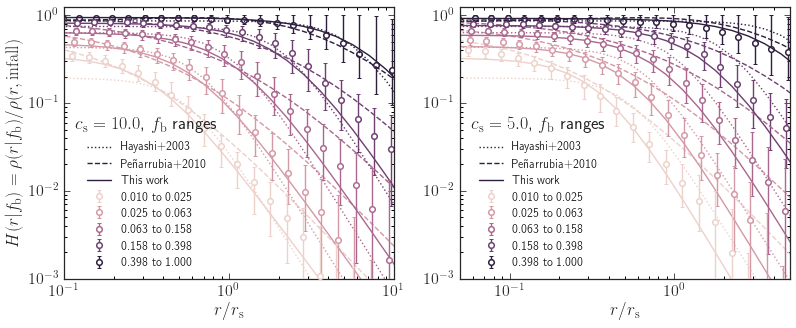

In [201]:
##### FIGURE FOR THE PAPER #####
fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(13,5))
ax[0].yaxis.set_ticks_position('both')
ax[0].xaxis.set_ticks_position('both')
ax[0].tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)
ax[0].loglog()
ax[1].yaxis.set_ticks_position('both')
ax[1].xaxis.set_ticks_position('both')
ax[1].tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)
ax[1].loglog()
stacked_cols = sns.cubehelix_palette(bins)

mean_or_median = 'median'
bins=5
csn=5
stacked_profiles, stacked_stds, mean_cs, fb_bin_centers, fb_bin_edges = generate_stacks(bins=bins, logfb_min=-2, logfb_max=0., cs_num=csn, fmt=mean_or_median)
print(mean_cs)

for i in range(0,bins):
    #plot data
    (ln, caps, _) = ax[0].errorbar(radii*mean_cs[i]* 10**(0.05*i/bins), stacked_profiles[i,:], stacked_stds[i,:] if mean_or_median=='mean' else stacked_stds[i,:].T, color=stacked_cols[i],
                 label='%.3f to %.3f' % (fb_bin_edges[i], fb_bin_edges[i+1]), zorder=bins-i, 
                 marker='o', mfc='white', mew=1.5, linestyle='None', capsize=2)
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(1)

    mod_rhos = np.zeros(len(radii))
    mp = paramet_hayashi_deluxe_v43(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_v43_all_noweight)

    for j in range(0, len(radii)):
        mod_rhos[j] = hayashi_deluxe_deluxe(radii[j]*mean_cs[i], mp[0])

    #generate penarrubia model
    pen_rhos = np.zeros(len(radii))
    for j in range(0,len(radii)):
        pen_rhos[j] = pen_new_prof(radii[j]*mean_cs[i], fb_bin_centers[i], mean_cs[i]) / gen_form(radii[j]*mean_cs[i],rho0(1.,mean_cs[i]), 1., 1, 3, 1)
    
    #plot hayashi and penarrubia
    if(i==bins-1):
        ax[0].plot(radii*mean_cs[i], strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i]), 
                 color=stacked_cols[i], linestyle='dotted', label='Hayashi+2003')
        ax[0].plot(radii*mean_cs[i], pen_rhos, linestyle='dashed', color=stacked_cols[i],
                 label='Pe{\~ n}arrubia+2010')
        ax[0].plot(radii*mean_cs[i], mod_rhos, linestyle='solid', color=stacked_cols[i],
                  label='This work')
    else:
        ax[0].plot(radii*mean_cs[i], strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i]), color=stacked_cols[i], linestyle='dotted')
        ax[0].plot(radii*mean_cs[i], pen_rhos, linestyle='dashed', color=stacked_cols[i])
        ax[0].plot(radii*mean_cs[i], mod_rhos, linestyle='solid',color=stacked_cols[i])
        

ax[0].set_xlabel(r'$r/r_\mathrm{s}$');
ax[0].set_xlim(10**-2*mean_cs[i],1.*mean_cs[i])
ax[0].set_ylim(10**-3,1.25*10**0)
ax[0].set_ylabel(r'$H(r | f_\mathrm{b}) = \rho(r | f_\mathrm{b}) / \rho(r,\mathrm{infall})$')
l = ax[0].legend(title=r'$c_\mathrm{s}=%.1f$, $f_\mathrm{b}$ ranges' %cs_vals[csn],ncol=1, fontsize=12)
ax[0].get_legend().get_title().set_fontsize('18')
l.set_zorder(20)

mean_or_median = 'median'
bins=5
csn=2
stacked_profiles, stacked_stds, mean_cs, fb_bin_centers, fb_bin_edges = generate_stacks(bins=bins, logfb_min=-2., logfb_max=0., cs_num=csn, fmt=mean_or_median)
print(mean_cs)
for i in range(0,bins):
    #plot data
    (ln, caps, _) = ax[1].errorbar(radii*mean_cs[i]* 10**(0.05*i/bins), stacked_profiles[i,:], stacked_stds[i,:] if mean_or_median=='mean' else stacked_stds[i,:].T, color=stacked_cols[i],
                 label='%.3f to %.3f' % (fb_bin_edges[i], fb_bin_edges[i+1]), zorder=bins-i, 
                 marker='o', mfc='white', mew=1.5, linestyle='None', capsize=2)
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(1)

    mod_rhos = np.zeros(len(radii))
    mp = paramet_hayashi_deluxe_v43(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_v43_all_noweight)

    for j in range(0, len(radii)):
        mod_rhos[j] = hayashi_deluxe_deluxe(radii[j]*mean_cs[i], mp[0])

    #generate penarrubia model
    pen_rhos = np.zeros(len(radii))
    for j in range(0,len(radii)):
        pen_rhos[j] = pen_new_prof(radii[j]*mean_cs[i], fb_bin_centers[i], mean_cs[i]) / gen_form(radii[j]*mean_cs[i],rho0(1.,mean_cs[i]), 1., 1, 3, 1)
    
    #plot hayashi and penarrubia
    if(i==bins-1):
        ax[1].plot(radii*mean_cs[i], strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i]), 
                 color=stacked_cols[i], linestyle='dotted', label='Hayashi+2003')
        ax[1].plot(radii*mean_cs[i], pen_rhos, linestyle='dashed', color=stacked_cols[i],
                 label='Pe{\~ n}arrubia+2010')
        ax[1].plot(radii*mean_cs[i], mod_rhos, linestyle='solid', color=stacked_cols[i],
                  label='This work')
    else:
        ax[1].plot(radii*mean_cs[i], strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i]), color=stacked_cols[i], linestyle='dotted')
        ax[1].plot(radii*mean_cs[i], pen_rhos, linestyle='dashed', color=stacked_cols[i])
        ax[1].plot(radii*mean_cs[i], mod_rhos, linestyle='solid',color=stacked_cols[i])
        

ax[1].set_xlabel(r'$r/r_\mathrm{s}$');
ax[1].set_xlim(10**-2*mean_cs[i],1.*mean_cs[i])
ax[1].set_ylim(10**-3,1.25*10**0)
#ax[1].set_ylabel(r'$H(r | f_\mathrm{b}) = \rho(r | f_\mathrm{b}) / \rho(r,\mathrm{infall})$')
l = ax[1].legend(title=r'$c_\mathrm{s}=%.1f$, $f_\mathrm{b}$ ranges' %cs_vals[csn],ncol=1, fontsize=12)
ax[1].get_legend().get_title().set_fontsize('18')
l.set_zorder(20)
#ax[1].text(0.012, 0.05, r'$c_\mathrm{s}=%.1f$' % cs_vals[csn], fontsize=18)

#plt.savefig(fig_dir / 'stacked_prof_comparison.eps', bbox_inches='tight')

#do we want to do this for every cs? or at least a few? could make it multiple panels...

[10. 10. 10. 10. 10.]
[5. 5. 5. 5. 5.]


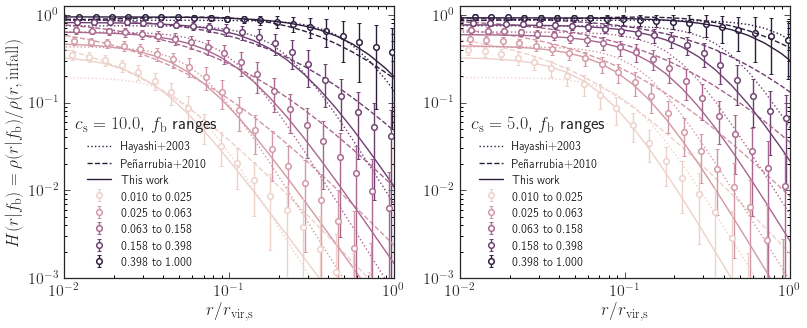

In [198]:
##### FIGURE FOR THE PAPER #####
fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(13,5))
ax[0].yaxis.set_ticks_position('both')
ax[0].xaxis.set_ticks_position('both')
ax[0].tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)
ax[0].loglog()
ax[1].yaxis.set_ticks_position('both')
ax[1].xaxis.set_ticks_position('both')
ax[1].tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)
ax[1].loglog()
stacked_cols = sns.cubehelix_palette(bins)

mean_or_median = 'mean'
bins=5
csn=5
stacked_profiles, stacked_stds, mean_cs, fb_bin_centers, fb_bin_edges = generate_stacks(bins=bins, logfb_min=-2, logfb_max=0., cs_num=csn, fmt=mean_or_median)
print(mean_cs)

for i in range(0,bins):
    #plot data
    (ln, caps, _) = ax[0].errorbar(radii* 10**(0.05*i/bins), stacked_profiles[i,:], stacked_stds[i,:] if mean_or_median=='mean' else stacked_stds[i,:].T, color=stacked_cols[i],
                 label='%.3f to %.3f' % (fb_bin_edges[i], fb_bin_edges[i+1]), zorder=bins-i, 
                 marker='o', mfc='white', mew=1.5, linestyle='None', capsize=2)
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(1)

    mod_rhos = np.zeros(len(radii))
    mp = paramet_hayashi_deluxe_v43(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_v43_all_noweight)

    for j in range(0, len(radii)):
        mod_rhos[j] = hayashi_deluxe_deluxe(radii[j]*mean_cs[i], mp[0])

    #generate penarrubia model
    pen_rhos = np.zeros(len(radii))
    for j in range(0,len(radii)):
        pen_rhos[j] = pen_new_prof(radii[j]*mean_cs[i], fb_bin_centers[i], mean_cs[i]) / gen_form(radii[j]*mean_cs[i],rho0(1.,mean_cs[i]), 1., 1, 3, 1)
    
    #plot hayashi and penarrubia
    if(i==bins-1):
        ax[0].plot(radii, strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i]), 
                 color=stacked_cols[i], linestyle='dotted', label='Hayashi+2003')
        ax[0].plot(radii, pen_rhos, linestyle='dashed', color=stacked_cols[i],
                 label='Pe{\~ n}arrubia+2010')
        ax[0].plot(radii, mod_rhos, linestyle='solid', color=stacked_cols[i],
                  label='This work')
    else:
        ax[0].plot(radii, strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i]), color=stacked_cols[i], linestyle='dotted')
        ax[0].plot(radii, pen_rhos, linestyle='dashed', color=stacked_cols[i])
        ax[0].plot(radii, mod_rhos, linestyle='solid',color=stacked_cols[i])
        

ax[0].set_xlabel(r'$r/r_\mathrm{vir,s}$');
ax[0].set_xlim(10**-2,1.)
ax[0].set_ylim(10**-3,1.25*10**0)
ax[0].set_ylabel(r'$H(r | f_\mathrm{b}) = \rho(r | f_\mathrm{b}) / \rho(r,\mathrm{infall})$')
l = ax[0].legend(title=r'$c_\mathrm{s}=%.1f$, $f_\mathrm{b}$ ranges' %cs_vals[csn],ncol=1, fontsize=12)
ax[0].get_legend().get_title().set_fontsize('18')
l.set_zorder(20)

mean_or_median = 'mean'
bins=5
csn=2
stacked_profiles, stacked_stds, mean_cs, fb_bin_centers, fb_bin_edges = generate_stacks(bins=bins, logfb_min=-2., logfb_max=0., cs_num=csn, fmt=mean_or_median)
print(mean_cs)
for i in range(0,bins):
    #plot data
    (ln, caps, _) = ax[1].errorbar(radii* 10**(0.05*i/bins), stacked_profiles[i,:], stacked_stds[i,:] if mean_or_median=='mean' else stacked_stds[i,:].T, color=stacked_cols[i],
                 label='%.3f to %.3f' % (fb_bin_edges[i], fb_bin_edges[i+1]), zorder=bins-i, 
                 marker='o', mfc='white', mew=1.5, linestyle='None', capsize=2)
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(1)

    mod_rhos = np.zeros(len(radii))
    mp = paramet_hayashi_deluxe_v43(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_v43_all_noweight)

    for j in range(0, len(radii)):
        mod_rhos[j] = hayashi_deluxe_deluxe(radii[j]*mean_cs[i], mp[0])

    #generate penarrubia model
    pen_rhos = np.zeros(len(radii))
    for j in range(0,len(radii)):
        pen_rhos[j] = pen_new_prof(radii[j]*mean_cs[i], fb_bin_centers[i], mean_cs[i]) / gen_form(radii[j]*mean_cs[i],rho0(1.,mean_cs[i]), 1., 1, 3, 1)
    
    #plot hayashi and penarrubia
    if(i==bins-1):
        ax[1].plot(radii, strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i]), 
                 color=stacked_cols[i], linestyle='dotted', label='Hayashi+2003')
        ax[1].plot(radii, pen_rhos, linestyle='dashed', color=stacked_cols[i],
                 label='Pe{\~ n}arrubia+2010')
        ax[1].plot(radii, mod_rhos, linestyle='solid', color=stacked_cols[i],
                  label='This work')
    else:
        ax[1].plot(radii, strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i]), color=stacked_cols[i], linestyle='dotted')
        ax[1].plot(radii, pen_rhos, linestyle='dashed', color=stacked_cols[i])
        ax[1].plot(radii, mod_rhos, linestyle='solid',color=stacked_cols[i])
        

ax[1].set_xlabel(r'$r/r_\mathrm{vir,s}$');
ax[1].set_xlim(10**-2,1.)
ax[1].set_ylim(10**-3,1.25*10**0)
#ax[1].set_ylabel(r'$H(r | f_\mathrm{b}) = \rho(r | f_\mathrm{b}) / \rho(r,\mathrm{infall})$')
l = ax[1].legend(title=r'$c_\mathrm{s}=%.1f$, $f_\mathrm{b}$ ranges' %cs_vals[csn],ncol=1, fontsize=12)
ax[1].get_legend().get_title().set_fontsize('18')
l.set_zorder(20)
#ax[1].text(0.012, 0.05, r'$c_\mathrm{s}=%.1f$' % cs_vals[csn], fontsize=18)

#plt.savefig(fig_dir / 'stacked_prof_comparison.eps', bbox_inches='tight')

#do we want to do this for every cs? or at least a few? could make it multiple panels...

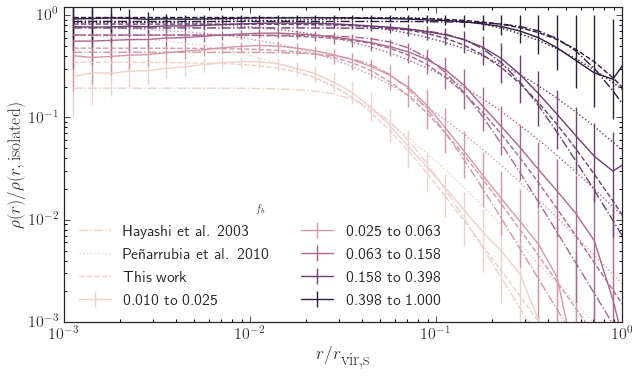

In [1657]:
fig, ax = loglogplot(figsize=(10,5.8))
stacked_cols = sns.cubehelix_palette(bins)
for i in range(0,bins):
    #plot data
    plt.errorbar(radii, stacked_profiles[i,:], stacked_stds[i,:] if mean_or_median=='mean' else stacked_stds[i,:].T, color=stacked_cols[i],
                 label='%.3f to %.3f' % (fb_bin_edges[i], fb_bin_edges[i+1]))
    
    mod_rhos = np.zeros(len(radii))
    #mp = paramet_hayashi_deluxe_v4(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_unweight_3rt_freedelta)
    #mp = paramet_hayashi_deluxe_v14(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_unweight_4rt_3ft_freedelta_log1)
    mp = paramet_hayashi_deluxe_v40(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_v40_subset_noweight)
    #mp = paramet_hayashi_deluxe_v5(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_weights_3rt_freedelta_fbdep)

    #mp, mcov = best_params[i], pcov = curve_fit(exp_decay_wrap(mean_cs[i]), np.log10(radii[3:30]*mean_cs[i]), np.log10(stacked_profiles[i,3:30]), p0=[0.9,1.], bounds=(0.,[1.,np.inf]))
    for j in range(0, len(radii)):
        mod_rhos[j] = hayashi_deluxe_deluxe(radii[j]*mean_cs[i], mp[0])
    #mod_rhos[j] = 10**exp_decay_wrap(mean_cs[i])(np.log10(radii[j]*mean_cs[i]), *mp)

    #plot our model fp_exp_v3_rmse, paramet_exp_v3, exp_decay_v3
    #mod_rhos = np.zeros(len(radii))
    #mp = paramet_exp_v3(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_exp_v3_rmse)
    #mp, mcov = best_params[i], pcov = curve_fit(exp_decay_wrap(mean_cs[i]), np.log10(radii[3:30]*mean_cs[i]), np.log10(stacked_profiles[i,3:30]), p0=[0.9,1.], bounds=(0.,[1.,np.inf]))
    #for j in range(0, len(radii)):
    #    mod_rhos[j] = exp_decay_v3(radii[j]*mean_cs[i], mp[0])
        #mod_rhos[j] = 10**exp_decay_wrap(mean_cs[i])(np.log10(radii[j]*mean_cs[i]), *mp)
    #currently, looks like our model performs worse...?
    
    #generate penarrubia model
    pen_rhos = np.zeros(len(radii))
    for j in range(0,len(radii)):
        pen_rhos[j] = pen_new_prof(radii[j]*mean_cs[i], fb_bin_centers[i], mean_cs[i]) / gen_form(radii[j]*mean_cs[i],rho0(1.,mean_cs[i]), 1., 1, 3, 1)
        #pen_rhos[j] = pen_new_prof(radii[j], fb_bin_centers[i], mean_cs[i]) / gen_form(radii[j],rho0(1.,mean_cs[i]), 1., 1, 3, 1)
    
    #plot hayashi and penarrubia
    if(i==0):
        plt.plot(radii, strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i]), 
                 color=stacked_cols[i], linestyle='dashdot', label='Hayashi et al. 2003')
        plt.plot(radii, pen_rhos, linestyle='dotted', color=stacked_cols[i],
                 label='Pe{\~ n}arrubia et al. 2010')
        plt.plot(radii, mod_rhos, linestyle='--', color=stacked_cols[i],
                  label='This work')
    else:
        plt.plot(radii, strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i]), color=stacked_cols[i], linestyle='dashdot')
        plt.plot(radii, pen_rhos, linestyle='dotted', color=stacked_cols[i])
        plt.plot(radii, mod_rhos, linestyle='--',color=stacked_cols[i])
        
#plt.axvline(radii[10]*mean_cs[0])

plt.xlabel(r'$r/r_\textrm{vir,s}$');
plt.xlim(10**-3,1.)#10**0);
plt.ylim(10**-3,1.2*10**0)
#plt.ylabel(r'$\rho(r)$');
plt.ylabel(r'$\rho(r)/\rho(r,\textrm{isolated})$')
plt.legend(title=r'$f_b$',ncol=2)

#in these plots it just looks like we're not quite getting rt correct...
#everything else looks good
#doesn't seem to make a big difference between weighted and unweighted
#in fact, unweighted looks better

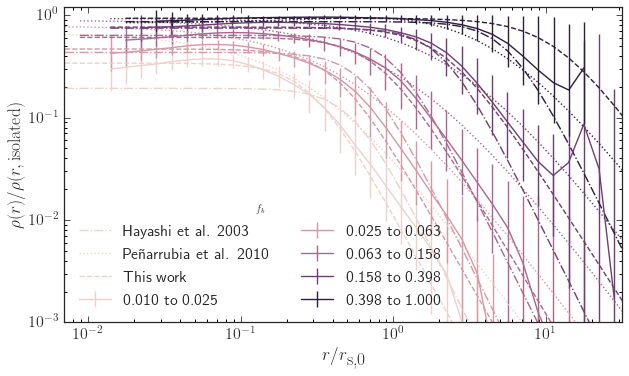

In [56]:
fig, ax = loglogplot(figsize=(10,5.8))
stacked_cols = sns.cubehelix_palette(bins)
for i in range(0,bins):
    #plot data
    plt.errorbar(radii*mean_cs[i], stacked_profiles[i,:], stacked_stds[i,:].T, color=stacked_cols[i],
                 label='%.3f to %.3f' % (fb_bin_edges[i], fb_bin_edges[i+1]))
    
    mod_rhos = np.zeros(len(radii))
    #mp = paramet_hayashi_deluxe_v4(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_unweight_3rt_freedelta)
    mp = paramet_hayashi_deluxe_v5(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_weights_3rt_freedelta_fbdep)
    #mp = paramet_hayashi_deluxe_v5(np.column_stack((fb_bin_centers[i],mean_cs[i])),fp_unweight_3rt_freedelta_fbdep)
    #mp, mcov = best_params[i], pcov = curve_fit(exp_decay_wrap(mean_cs[i]), np.log10(radii[3:30]*mean_cs[i]), np.log10(stacked_profiles[i,3:30]), p0=[0.9,1.], bounds=(0.,[1.,np.inf]))
    for j in range(0, len(radii)):
        mod_rhos[j] = hayashi_deluxe(radii[j]*mean_cs[i], mp[0])
    #mod_rhos[j] = 10**exp_decay_wrap(mean_cs[i])(np.log10(radii[j]*mean_cs[i]), *mp)
    
    #generate penarrubia model
    pen_rhos = np.zeros(len(radii))
    for j in range(0,len(radii)):
        pen_rhos[j] = pen_new_prof(radii[j]*mean_cs[i], fb_bin_centers[i], mean_cs[i]) / gen_form(radii[j]*mean_cs[i],rho0(1.,mean_cs[i]), 1., 1, 3, 1)
        #pen_rhos[j] = pen_new_prof(radii[j], fb_bin_centers[i], mean_cs[i]) / gen_form(radii[j],rho0(1.,mean_cs[i]), 1., 1, 3, 1)
    
    #plot hayashi and penarrubia
    if(i==0):
        plt.plot(radii*mean_cs[i], strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i]), 
                 color=stacked_cols[i], linestyle='dashdot', label='Hayashi et al. 2003')
        plt.plot(radii*mean_cs[i], pen_rhos, linestyle='dotted', color=stacked_cols[i],
                 label='Pe{\~ n}arrubia et al. 2010')
        plt.plot(radii*mean_cs[i], mod_rhos, linestyle='--', color=stacked_cols[i],
                 label='This work')
    else:
        plt.plot(radii*mean_cs[i], strip_mod_hayashi(radii*mean_cs[i],fb_bin_centers[i]), color=stacked_cols[i], linestyle='dashdot')
        plt.plot(radii*mean_cs[i], pen_rhos, linestyle='dotted', color=stacked_cols[i])
        plt.plot(radii*mean_cs[i], mod_rhos, linestyle='--',color=stacked_cols[i])
        
        
#plt.axvline(radii[10]*mean_cs[0])

plt.xlabel(r'$r/r_\textrm{s,0}$');
plt.xlim(7*10**-3,31.5)#10**0);
plt.ylim(10**-3,1.2*10**0)
#plt.ylabel(r'$\rho(r)$');
plt.ylabel(r'$\rho(r)/\rho(r,\textrm{isolated})$')
plt.legend(title=r'$f_b$',ncol=2)
#plt.savefig(fig_dir / 'stacked_profiles_linlog_vs_relaxed_peri_exclude.pdf',bbox_inches='tight')
#should the profiles be normalized to what they looked like at the beginning?

#MEDIAN VS MEAN?

-1.8618562394175189


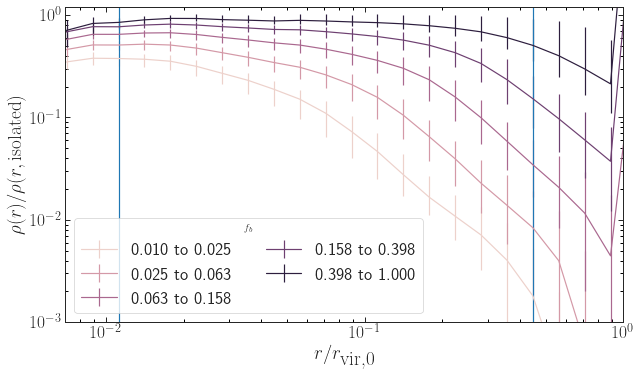

In [73]:
#getting an estimate for the dependence of dlog(rho)/dlog(r) on the bound fraction
fig, ax = loglogplot(figsize=(10,5.8))
stacked_cols = sns.cubehelix_palette(bins)
for i in range(0,bins):
    #plot data
    plt.errorbar(radii, stacked_profiles[i,:], stacked_stds[i,:] if mean_or_median=='mean' else stacked_stds[i,:].T, color=stacked_cols[i],
                 label='%.3f to %.3f' % (fb_bin_edges[i], fb_bin_edges[i+1]))
    
rad_of_int = 26
bin_of_int = 3
    
dlr = (np.log10(stacked_profiles[bin_of_int,rad_of_int]) - np.log10(stacked_profiles[bin_of_int,rad_of_int-1])) / (np.log10(radii[rad_of_int]) - np.log10(radii[rad_of_int-1]))
print(dlr)

plt.axvline(radii[10])
plt.axvline(radii[rad_of_int])

plt.xlabel(r'$r/r_\textrm{vir,0}$');
plt.xlim(7*10**-3,1.)#10**0);
plt.ylim(10**-3,1.2*10**0)
#plt.ylabel(r'$\rho(r)$');
plt.ylabel(r'$\rho(r)/\rho(r,\textrm{isolated})$')
plt.legend(title=r'$f_b$',ncol=2)

[0.73 0.79 0.85 0.91 0.97]


C:\Users\leets\Anaconda3\lib\site-packages\numpy\core\_methods.py:117: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


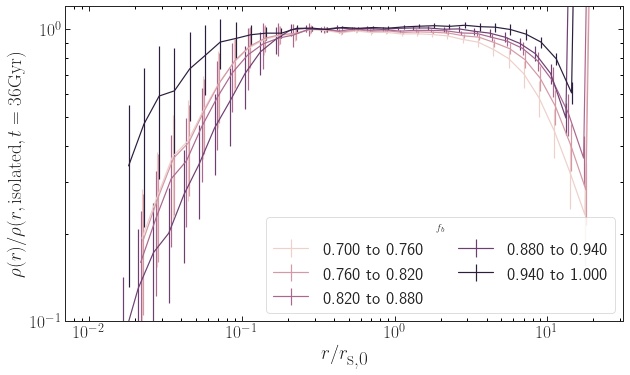

In [74]:
#let's just look at large f_b to see what the slope evolution looks like
bins = 5
stacked_profiles = np.zeros((bins,n_profile_pts))
stacked_stds = np.zeros((bins,n_profile_pts))
mean_cs = np.zeros(bins)
fb_bin_edges = np.linspace(0.7,1.0,bins+1) #ten bins
fb_bin_centers = (fb_bin_edges[1:] + fb_bin_edges[:-1])*0.5
print(fb_bin_centers)
for i in range(0,bins):
    sub_mat = dat_matrix[np.logical_and(dat_matrix[:,4] >= fb_bin_edges[i], dat_matrix[:,4] < fb_bin_edges[i+1])]
    mean_cs[i] = np.mean(sub_mat[:,1])
    stacked_profiles[i,:] = np.mean(sub_mat[:,5:], axis=0)
    stacked_stds[i,:] = np.std(sub_mat[:,5:], axis=0)

fig, ax = loglogplot(figsize=(10,5.8))
stacked_cols = sns.cubehelix_palette(bins)
for i in range(0,bins):
    #plot data
    plt.errorbar(radii*mean_cs[i], stacked_profiles[i,:], stacked_stds[i,:], color=stacked_cols[i],
                 label='%.3f to %.3f' % (fb_bin_edges[i], fb_bin_edges[i+1]))
    
    #generate penarrubia model
    pen_rhos = np.zeros(len(radii))
    for j in range(0,len(radii)):
        pen_rhos[j] = pen_new_prof(radii[j]*mean_cs[i], fb_bin_centers[i], mean_cs[i]) / gen_form(radii[j]*mean_cs[i],rho0(1.,mean_cs[i]), 1., 1, 3, 1)    

plt.xlabel(r'$r/r_\textrm{s,0}$');
plt.xlim(7*10**-3,31.5)#10**0);
plt.ylim(10**-1,1.2*10**0)
#plt.ylabel(r'$\rho(r)$');
plt.ylabel(r'$\rho(r)/\rho(r,\textrm{isolated},t=36\textrm{Gyr})$')
plt.legend(title=r'$f_b$',ncol=2)

C:\Users\leets\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\Users\leets\Anaconda3\lib\site-packages\numpy\core\_methods.py:78: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
C:\Users\leets\Anaconda3\lib\site-packages\numpy\core\_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\Users\leets\Anaconda3\lib\site-packages\numpy\core\_methods.py:110: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
C:\Users\leets\Anaconda3\lib\site-packages\numpy\core\_methods.py:130: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


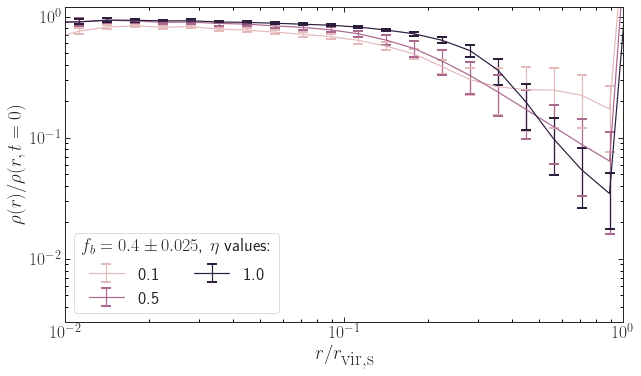

In [75]:
bins = 11 #the 11 different values of eta
stacked_profiles = np.zeros((bins,n_profile_pts))
stacked_stds = np.zeros((bins,n_profile_pts))
fb=0.4
sub_mat = dat_matrix[np.logical_and(dat_matrix[:,4] >= 0.375, dat_matrix[:,4] < 0.425)]
#loop over the different values of f_b and make sure that it seems like the results are consistent
for i in range(0,bins):
    stacked_profiles[i,:] = np.mean(sub_mat[sub_mat[:,3]==eta_vals[i],5:], axis=0)
    stacked_stds[i,:] = np.std(sub_mat[sub_mat[:,3]==eta_vals[i],5:], axis=0)

fig, ax = loglogplot(figsize=(10,5.8))
stacked_cols = sns.cubehelix_palette(bins)
for i in [1,5,10]:#range(0,bins):
    #plot data
    (_, caps, _) = plt.errorbar(radii, stacked_profiles[i,:], stacked_stds[i,:], color=stacked_cols[i],
                 label='%.1f' % eta_vals[i],capsize=5)
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(2)    

plt.xlabel(r'$r/r_\textrm{vir,s}$');
plt.xlim(10**-2,10**0);
plt.ylim(3*10**-3,1.2*10**0)
#plt.ylabel(r'$\rho(r)$');
plt.ylabel(r'$\rho(r)/\rho(r,t=0)$')
legend = plt.legend(title=r'$f_b=0.4\pm 0.025$, $\eta$ values:',ncol=2)
legend.get_title().set_fontsize('18')
#plt.savefig(fig_dir/'eta_evolve_fb0.4.pdf',bbox_inches='tight')

# this suggests that for fixed fb, the more circular the orbit, the more of the material that comes from the outside
# of the profile

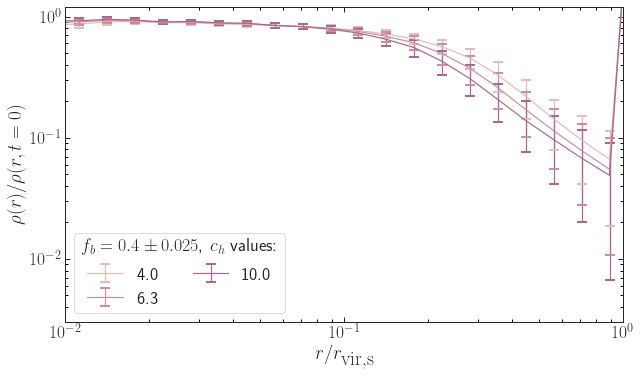

In [76]:
bins = 11 #the 11 different values of c_h
stacked_profiles = np.zeros((bins,n_profile_pts))
stacked_stds = np.zeros((bins,n_profile_pts))
fb=0.4
sub_mat = dat_matrix[np.logical_and(dat_matrix[:,4] >= 0.375, dat_matrix[:,4] < 0.425)]
#loop over the different values of f_b and make sure that it seems like the results are consistent
for i in range(0,bins):
    stacked_profiles[i,:] = np.mean(sub_mat[sub_mat[:,0]==ch_vals[i],5:], axis=0)
    stacked_stds[i,:] = np.std(sub_mat[sub_mat[:,0]==ch_vals[i],5:], axis=0)

fig, ax = loglogplot(figsize=(10,5.8))
stacked_cols = sns.cubehelix_palette(bins)
for i in [1,3,5]:#range(0,bins):
    #plot data
    (_, caps, _) = plt.errorbar(radii, stacked_profiles[i,:], stacked_stds[i,:], color=stacked_cols[i],
                 label='%.1f' % ch_vals[i],capsize=5)
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(2)    

plt.xlabel(r'$r/r_\textrm{vir,s}$');
plt.xlim(10**-2,10**0);
plt.ylim(3*10**-3,1.2*10**0)
#plt.ylabel(r'$\rho(r)$');
plt.ylabel(r'$\rho(r)/\rho(r,t=0)$')
legend = plt.legend(title=r'$f_b=0.4\pm 0.025$, $c_h$ values:',ncol=2)
legend.get_title().set_fontsize('18')
#plt.savefig(fig_dir/'ch_evolve_fb0.4.pdf',bbox_inches='tight')

# this suggests that overall, there is minimal dependence on host halo concentation
# however, it does make a difference
# unsurprisingly, a more concentrated host results in an overall more stripped outer profile

[-1.07131104 -0.81594583 -0.76168079 -0.60093387 -0.53401849 -0.36204663
 -0.25806297 -0.25181661 -0.17889648 -0.1160721  -0.11863744 -0.08323606
 -0.09894668 -0.09702927 -0.10292324 -0.11076648 -0.1209165  -0.13512212
 -0.14351025 -0.15961448 -0.17991013 -0.21092054 -0.2440724  -0.29651511
 -0.36647894 -0.48335072 -0.64808716 -0.83668151 -1.01241504 -1.18402423]
[-0.88480522 -0.63253592 -0.53937134 -0.42653723 -0.29487801 -0.25499198
 -0.1672105  -0.12432652 -0.09218724 -0.08828129 -0.07524324 -0.06267359
 -0.06535706 -0.07654626 -0.07294116 -0.08936013 -0.09588357 -0.1133418
 -0.12939933 -0.14605014 -0.17760227 -0.22472422 -0.28778261 -0.39065802
 -0.54489444 -0.74242355 -0.9344601  -1.11172494 -1.27968286 -1.44993416]
[-0.53680634 -0.45592427 -0.31772932 -0.22871281 -0.16081737 -0.09634406
 -0.0793125  -0.04935663 -0.03686434 -0.03096152 -0.03574067 -0.03538081
 -0.04995472 -0.06164426 -0.06741425 -0.08471003 -0.10529453 -0.13362845
 -0.17136958 -0.23452255 -0.3216607  -0.46145297 -

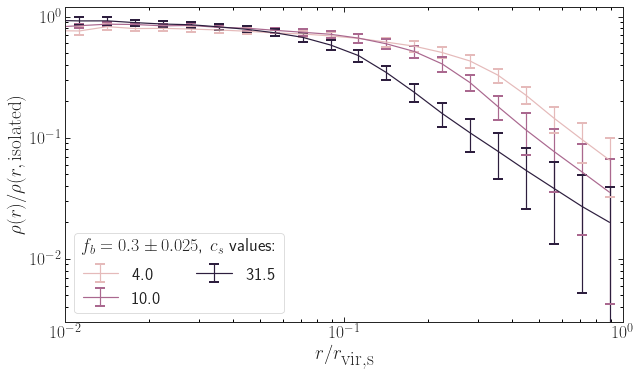

In [79]:
bins = 11 #the 11 different values of c_s
stacked_profiles = np.zeros((bins,n_profile_pts))
stacked_stds = np.zeros((bins,n_profile_pts))
fb=0.3
sub_mat = dat_matrix[np.logical_and(dat_matrix[:,4] >= 0.275, dat_matrix[:,4] < 0.325)]
#loop over the different values of f_b and make sure that it seems like the results are consistent
for i in range(0,bins):
    stacked_profiles[i,:] = np.mean(sub_mat[sub_mat[:,1]==cs_vals[i],5:], axis=0)
    stacked_stds[i,:] = np.std(sub_mat[sub_mat[:,1]==cs_vals[i],5:], axis=0)
fig, ax = loglogplot(figsize=(10,5.8))
stacked_cols = sns.cubehelix_palette(bins)
for i in [1,5,10]:#range(0,bins):
    #plot data
    (_, caps, _) = plt.errorbar(radii[radii<1.], stacked_profiles[i,:][radii<1.], stacked_stds[i,:][radii<1.], color=stacked_cols[i],
                 label='%.1f' % cs_vals[i],capsize=5)
    print(np.log10(stacked_profiles[i,:][radii<1.]))
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(2)    

plt.xlabel(r'$r/r_\textrm{vir,s}$');
plt.xlim(10**-2, 1.)
#plt.xlim(7*10**-3,31.5)#10**0);
plt.ylim(3*10**-3,1.2*10**0)
#plt.ylabel(r'$\rho(r)$');
plt.ylabel(r'$\rho(r)/\rho(r,\textrm{isolated})$')
legend = plt.legend(title=r'$f_b=0.3\pm 0.025$, $c_s$ values:',ncol=2)
legend.get_title().set_fontsize('18')
plt.savefig(fig_dir/'cs_evolve_fb0.3.pdf',bbox_inches='tight')#0.542208322455#0.492065425614#0.89970615654

# must substantially, this shows that more concentrated haloes are stripped further in for the same amount of mass lost

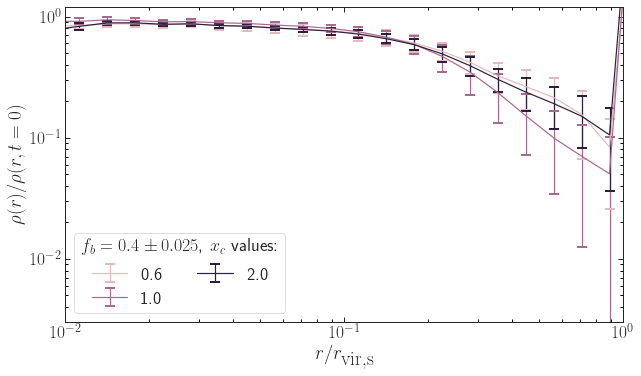

In [80]:
bins = 11 #the 11 different values of x_c
stacked_profiles = np.zeros((bins,n_profile_pts))
stacked_stds = np.zeros((bins,n_profile_pts))
fb=0.4
sub_mat = dat_matrix[np.logical_and(dat_matrix[:,4] >= 0.375, dat_matrix[:,4] < 0.425)]
#loop over the different values of f_b and make sure that it seems like the results are consistent
for i in range(0,bins):
    stacked_profiles[i,:] = np.mean(sub_mat[sub_mat[:,2]==xc_vals[i],5:], axis=0)
    stacked_stds[i,:] = np.std(sub_mat[sub_mat[:,2]==xc_vals[i],5:], axis=0)

fig, ax = loglogplot(figsize=(10,5.8))
stacked_cols = sns.cubehelix_palette(bins)
for i in [1,5,10]:#range(0,bins):
    #plot data
    (_, caps, _) = plt.errorbar(radii, stacked_profiles[i,:], stacked_stds[i,:], color=stacked_cols[i],
                 label='%.1f' % xc_vals[i],capsize=5)
    for cap in caps:
        cap.set_color(stacked_cols[i])
        cap.set_markeredgewidth(2)    

plt.xlabel(r'$r/r_\textrm{vir,s}$');
plt.xlim(10**-2,10**0);
plt.ylim(3*10**-3,1.2*10**0)
#plt.ylabel(r'$\rho(r)$');
plt.ylabel(r'$\rho(r)/\rho(r,t=0)$')
legend = plt.legend(title=r'$f_b=0.4\pm 0.025$, $x_c$ values:',ncol=2)
legend.get_title().set_fontsize('18')
#plt.savefig(fig_dir/'xc_evolve_fb0.4.pdf',bbox_inches='tight')

# xc has very little effect

## Penarrubia Vmax, Rmax comparison

In [ ]:
# for the fitting function, we want to get vmax/rmax for every single snapshot, same cut as made in the original dataset
# used for fitting density profile

In [65]:
max_mat = np.zeros((timesteps*nsims, 7+len(radii)))#[] #preload this as numpy zeros of the proper size
vm_rm_arr = np.zeros((timesteps*nsims, 2))

for i in range(0,11):
    print("i",i)
    for j in range(0,11):
        print("j",j)
        for k in range(0,11):
            for l in range(0,11):
                direct = dash_root / ch_dirs[i] / cs_dirs[j] / xc_dirs[k] / eta_dirs[l]
                pf_fn = direct / 'radprof_m.txt'
                sh_evo_fn = direct / 'subhalo_evo.txt'
                if(Path(pf_fn).is_file()):
                    sim_dat, vm_rm = load_vrmax(direct, j, normed=True)#[0,:][np.newaxis,:]
                    snaps_used = sim_dat.shape[0]
                    row = ((i*11**3)+(j*11**2)+(k*11)+l)*timesteps
                    max_mat[row:row+snaps_used,0] = ch_vals[i]
                    max_mat[row:row+snaps_used,1] = cs_vals[j]
                    max_mat[row:row+snaps_used,2] = xc_vals[k]
                    max_mat[row:row+snaps_used,3] = eta_vals[l]
                    max_mat[row:row+snaps_used,4:] = sim_dat
                    vm_rm_arr[row:row+snaps_used] = vm_rm
                
                    
max_mat = max_mat[~np.all(max_mat == 0, axis=1)]
vm_rm_arr = vm_rm_arr[~np.all(vm_rm_arr == 0, axis=1)]
assert(vm_rm_arr.shape[0] == max_mat.shape[0])
#ch, cs, xc, eta, fb, vmax, rmax (normed to vmax/rmax at t=0)

# thus, we are normalizing by t=0 snapshot for our data, and for our model (which is trained on data normalized to avg nfw)
# whereas we are normalizing hayashi results by NFW and penarrubia results come normalized already

# can mention that the IC/t=0 results of dash differ from NFW by less than 1% for rmax and are virtually identical for vmax

i 0
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 1
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 2
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 3
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 4
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 5
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 6
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 7
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 8
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 9
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10
i 10
j 0
j 1
j 2
j 3
j 4
j 5
j 6
j 7
j 8
j 9
j 10


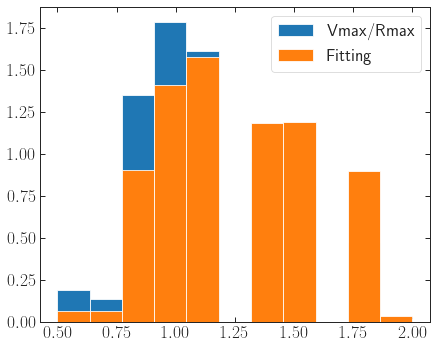

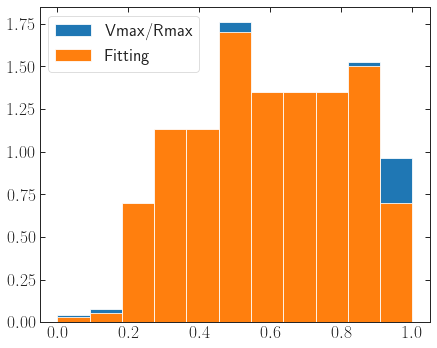

In [160]:
# how many of the different apocenters are we seeing here as a function of dist?
plot()
plt.hist(max_mat[:,2], bins=11, density='normed', label='Vmax/Rmax')
plt.hist(dat_matrix[:,2], bins=11, density='normed', label='Fitting')
plt.legend()

plot()
plt.hist(max_mat[:,3], bins=11, density='normed', label='Vmax/Rmax')
plt.hist(dat_matrix[:,3], bins=11, density='normed', label='Fitting')
plt.legend()

# so the main thing is that there are far more low x_c orbits present in these distributions than there are in
# the overall dash database
# perhaps this is why our values are skewed low?

(array([4080., 2480.,  761.,  595.,  427.,  257.,    0.,    0.,    0.,
          83.]),
 array([0.06797087, 0.14840749, 0.22884411, 0.30928072, 0.38971734,
        0.47015396, 0.55059058, 0.63102719, 0.71146381, 0.79190043,
        0.87233704]),
 <a list of 10 Patch objects>)

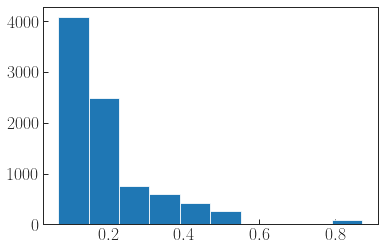

In [311]:
plt.hist(vm_rm_arr[:,1])

In [329]:
max_mat.shape

(10936, 47)

(array([297.,   0., 342., 412., 384., 253.,   0.,   0.,  96., 184.]),
 array([0.98 , 0.984, 0.988, 0.992, 0.996, 1.   , 1.004, 1.008, 1.012,
        1.016, 1.02 ]),
 <a list of 10 Patch objects>)

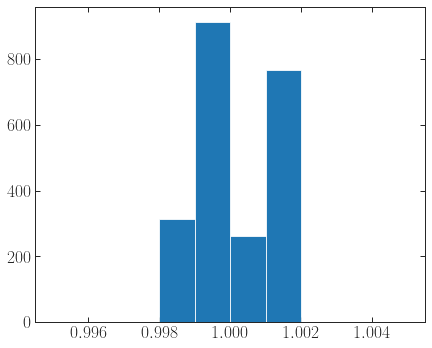

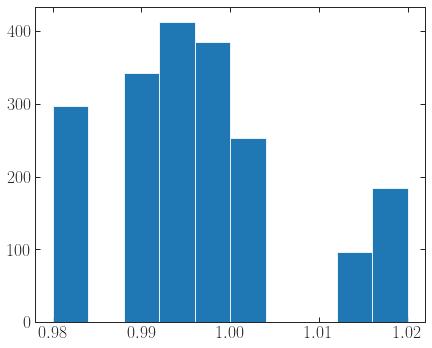

In [324]:
plot()
plt.hist(max_mat[:,5],range=(0.995,1.005))
# roughly the same level of fluctuation

# so the vmax are bang on

plot()
plt.hist(max_mat[:,6],range=(0.98,1.02))

#what is the cause of rmax being suppressed relative to NFW?

In [66]:
@njit
def exp_decay_v3(r, mp):
    #f_t, c_s, and r_t
    return mp[0] * np.exp(-1.* r * ((mp[1] - mp[2])/(mp[1]*mp[2])))

@njit(parallel = True, fastmath = True)
def paramet_exp_v3_free_ft(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 3))
    for i in prange(0, len(fb_cs)):
        #less computationally efficient, but still works...
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1]=fb_cs[i,1] #just c_s
        model_params[i, 2]=10**(np.log10(fb_cs[i,1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2.)
    return model_params
    #return np.column_stack((ft_vals, model_params))
    
@jit
def hayashi_deluxe(r, mp):
    # f_t, r_vir (i.e., c_s), r_t, delta
    if(np.abs(mp[1]-mp[2]) < 1e-8):
        #print("this happened for r=%.3e"%r)
        return mp[0]
    else:
        return mp[0] / (1. + (r * ((mp[1] - mp[2])/(mp[1]*mp[2])))**mp[3])
    
@jit
def hayashi_deluxe_deluxe(r, mp):
    # f_t, r_vir (i.e., c_s), r_t, delta
    if(np.abs(mp[1]-mp[2]) < 1e-8):
        return mp[0]
    elif(mp[1] < mp[2]): #rt is larger than rvir, which shouldn't be the case...
        return 0. #this will throw an inf
    else:
        return mp[0] / (1. + (r * ((mp[1] - mp[2])/(mp[1]*mp[2])))**mp[3])**mp[4]    
    
@jit
def powerlaw_exp(r, mp):
    if(np.abs(mp[1]-mp[2]) < 1e-8):
        #print("this happened for r=%.3e"%r)
        return mp[0]
    elif(mp[1] < mp[2]): #rt is larger than rvir, which shouldn't be the case...
        return 0. #this will throw an inf
    else:
        return (mp[0] / (1. + (r * ((mp[1] - mp[2])/(mp[1]*mp[2])))**mp[3])) * np.exp(-1. * r * ((mp[1] - mp[4])/(mp[1]*mp[4])))


@jit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v5(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2. + fp[8]*(fb_cs[i, 1] / 10.)**fp[9] * np.log10(fb_cs[i, 0])**3)
        model_params[i, 3] = fp[10] + fp[11]*fb_cs[i,0]**fp[12]
    return model_params

@jit(parallel=True)#, fastmath=True)
def paramet_hayashi_deluxe_v4(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2. + fp[8]*(fb_cs[i, 1] / 10.)**fp[9] * np.log10(fb_cs[i, 0])**3)
        model_params[i, 3] = fp[10]
    return model_params

In [67]:
# method for computing the vmax, rmax given a transfer function
# we'll assume the transfer function depends on r, f_b, and c_s
# the initial density profile is an NFW profile, and we now need to write a function for the NFW, which depends
# only on c_s
# need to get it to agree with our profile for a simulated halo in the model units

# once we have this profile function, called NFWrho or something, we can write as mass profile function
# then rmax can be calculated from minimizing this

#everything that we need for the penarrubia model of vmax, rmax
#(mu,eta) = (0.4, 0.3) for vmax
#(mu,eta) = (-0.3, 0.4) for rmax
def g_v_r(x,mu,eta):
    return 2**mu * x**eta / (1+x)**mu


def NFWrho(r, cs):  # in units where Rvir=1, so r_s = 1/c_s
    rhos = (4*np.pi * cs**-3 * NFWf(cs))**-1  # this factor drops out...
    return rhos / ((r*cs)*(1. + r*cs)**2)


def NFWmass(r, cs):
    return 4*np.pi*quad(lambda x: x**2 * NFWrho(x, cs), 0, r)[0]


def hayashiMass(r, fb, cs):
    return 4*np.pi*quad(lambda x: x**2 * NFWrho(x, cs)*strip_mod_hayashi(x*cs, fb), 0, r)[0]


def penarrubiaMass(r, fb, cs):
    return 4*np.pi*quad(lambda x: x**2 * pen_new_prof(x*cs, fb, cs), 0, r)[0]


def rte(fb):
    return 10**(1.02 + 1.38*np.log10(fb) + 0.37*(np.log10(fb))**2)


def ft(fb):
    return 10**(-0.007 + 0.35*np.log10(fb) + 0.39*(np.log10(fb))**2 + 0.23*(np.log10(fb))**3)


def strip_mod_hayashi(r, fb):
    return ft(fb) / (1. + (r/rte(fb))**3)

from scipy.optimize import root_scalar
def hayashi_vm_rm(fb, cs, normed=True):
    #rmax = root(lambda x: 4*np.pi*x**3 * strip_mod_hayashi(x*cs, fb)
    #            * NFWrho(x, cs) - hayashiMass(x, fb, cs), g_v_r(fb, -0.3,0.4)*2.163/cs).x[0]
    rmax = root_scalar(lambda x: 4*np.pi*x**3 * strip_mod_hayashi(x*cs, fb)
                * NFWrho(x, cs) - hayashiMass(x, fb, cs), bracket=(10**-3, 1.2)).root
    vmax = np.sqrt(G*hayashiMass(rmax, fb, cs) / rmax)
    # need these as ratios...
    if(normed):
        # root(lambda x: x**3 * NFWrho(x, cs) - NFWmass(x, cs), 2.163/cs).x[0]
        rmax0 = 2.163/cs
        # np.sqrt(G*NFWmass(rmax0, cs) / rmax0) #NFW for IC
        vmax0 = 0.465*np.sqrt(cs/NFWf(cs))
        return rmax/rmax0, vmax/vmax0
    else:
        return rmax, vmax


def modelMass(fit_parms, model_param_func, rho_model, r, fb, cs):
    model_params = model_param_func(np.column_stack((fb, cs)), fit_parms)
    return 4*np.pi*quad(lambda x: x**2 * rho_model(x*cs, model_params[0])*NFWrho(x, cs), 0, r)[0]

# this is for our model
# need to pass the model, parameterization, and parameters
def model_vm_rm(fit_parms, model_param_func, rho_model, fb, cs, normed=True):
    model_params = model_param_func(np.column_stack((fb, cs)), fit_parms)
    #rmax = root(lambda x: 4*np.pi*x**3 * rho_model(x*cs, model_params[0]) * NFWrho(
    #    x, cs) - modelMass(fit_parms, model_param_func, rho_model, x, fb, cs), g_v_r(fb, -0.3,0.4)* 2.163/cs).x[0]
    rmax = root_scalar(lambda x: 4*np.pi*x**3 * rho_model(x*cs, model_params[0]) * NFWrho(
        x, cs) - modelMass(fit_parms, model_param_func, rho_model, x, fb, cs), bracket=(10**-10, 1.2)).root
    vmax = np.sqrt(G*modelMass(fit_parms, model_param_func, rho_model, rmax, fb, cs) / rmax)
    if(normed):
        rmax0 = 2.163/cs
        vmax0 = 0.465*np.sqrt(cs/NFWf(cs))
        return rmax/rmax0, vmax/vmax0
    else:
        return rmax, vmax

In [68]:
model_vmax = np.zeros(len(max_mat))
model_rmax = np.zeros(len(max_mat))
for i in prange(0,len(max_mat)):
    if i % 100 == 0:
        print(i)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_exp_v3_sub_histweight_orbweight_fixft, paramet_exp_v3, exp_decay_v3, max_mat[i,4], max_mat[i,1], normed=True)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_weights_3rt_freedelta_fbdep, paramet_hayashi_deluxe_v5, hayashi_deluxe, max_mat[i,4], max_mat[i,1], normed=True)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_unweight_3rt_freedelta, paramet_hayashi_deluxe_v4, hayashi_deluxe, max_mat[i,4], max_mat[i,1], normed=True)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_unweight_4rt_3ft_freedelta_log1, paramet_hayashi_deluxe_v14, hayashi_deluxe, max_mat[i,4], max_mat[i,1], normed=True)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_unweight_4rt_3ft_freedelta_log1_cspulledrtft, paramet_hayashi_deluxe_v18, hayashi_deluxe, max_mat[i,4], max_mat[i,1], normed=True)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_unweight_doublepowerlaw_hayashi_v22, paramet_hayashi_deluxe_v22, rho_model_hayashi, max_mat[i,4], max_mat[i,1], normed=True)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_unweight_v25, paramet_hayashi_deluxe_v25, hayashi_deluxe, max_mat[i,4], max_mat[i,1], normed=True)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_unweight_v25_outer_rads_full, paramet_hayashi_deluxe_v25, hayashi_deluxe, max_mat[i,4], max_mat[i,1], normed=True)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_v43_all_noweight, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, max_mat[i,4], max_mat[i,1], normed=True)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_v43_t0_no1Rv, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, max_mat[i,4], max_mat[i,1], normed=False) 
    model_rmax[i], model_vmax[i] = model_vm_rm(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe, max_mat[i,4], max_mat[i,1], normed=True) 
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_plexp_v2_avgnfw_no1Rv_all, paramet_plexp_v2, powerlaw_exp, max_mat[i,4], max_mat[i,1], normed=False) 
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_v31_subset_noweight, paramet_hayashi_deluxe_v31, hayashi_deluxe_deluxe, max_mat[i,4], max_mat[i,1], normed=True)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_unweight_doublepowerlaw_v21, paramet_hayashi_deluxe_v21, hayashi_deluxe, max_mat[i,4], max_mat[i,1], normed=True)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_weights_v25, paramet_hayashi_deluxe_v25, hayashi_deluxe, max_mat[i,4], max_mat[i,1], normed=True)
    
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_weights_4rt_3ft_freedelta_log1, paramet_hayashi_deluxe_v14, hayashi_deluxe, max_mat[i,4], max_mat[i,1], normed=True)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_exp_v3_rmse, paramet_exp_v3, exp_decay_v3, max_mat[i,4], max_mat[i,1], normed=True)
    #model_rmax[i], model_vmax[i] = model_vm_rm(fp_individual_fits, paramet_exp_v3_free_ft, exp_decay_v3, max_mat[i,4], max_mat[i,1], normed=True)

#model_rmax = model_rmax / vm_rm_arr[:,1]
#model_vmax = model_vmax / vm_rm_arr[:,0]
# THE DOUBLE EXPONENTIAL IS ON THE RIGHT TRACK!!

# so our model values are measured relative to t=0
# our data values are also measured relative to t=0
# whereas hayashi are measured relative to NFW
# and penarrubia isn't measured relative to anything

# my final concern is that the second parameter in the model is pretty low, so you would think that would justify
# throwing it out... however, we are using consistent power-law shapes for all of them, so that is nice

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600


[0.5        0.57434918 0.65975396 0.75785828 0.87055056 1.
 1.14869835 1.31950791 1.51571657 1.74110113 2.        ]


Text(0.5, 1.0, '$c_\\mathrm{s}=25$, $c_\\mathrm{h}=12.5$')

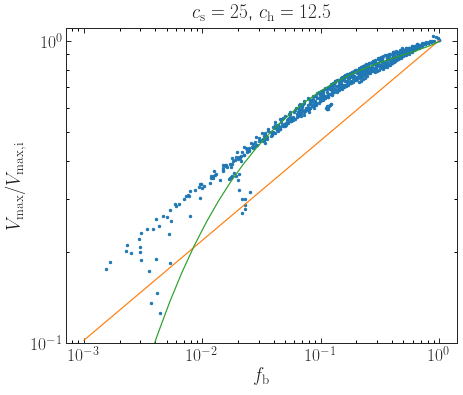

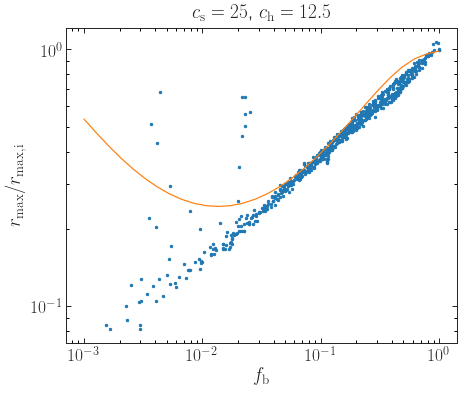

In [806]:
# Hayashi comparison
nfb = 30
fb_vals = np.logspace(-3,0,nfb)
vm_vals = np.zeros(nfb); rm_vals = np.zeros(nfb)
for i in range(0,nfb):
    rm_vals[i], vm_vals[i] = hayashi_vm_rm(fb_vals[i], 10., normed=True)

submat = max_mat[np.logical_and(max_mat[:,1]==10.,max_mat[:,0]==5.)]
print(np.unique(submat[:,2]))
loglogplot()
plt.plot(submat[:,4],submat[:,5],'.')
plt.plot(fb_vals,fb_vals**(0.33))
plt.plot(fb_vals,vm_vals)

plt.xlabel(r'$f_\mathrm{b}$')
plt.ylabel(r'$V_\mathrm{max} / V_\mathrm{max,i}$')
plt.title(r'$c_\mathrm{s}=25$, $c_\mathrm{h}=12.5$')
plt.ylim(10**-1,1.1)

loglogplot()
plt.plot(submat[:,4],submat[:,6],'.')
plt.plot(fb_vals,rm_vals)
plt.xlabel(r'$f_\mathrm{b}$')
plt.ylabel(r'$r_\mathrm{max} / r_\mathrm{max,i}$')
plt.title(r'$c_\mathrm{s}=25$, $c_\mathrm{h}=12.5$')
# So Hayashi we are able to confirm their results for c_s=10....
# However, even when rescaled, we can't reproduce Penarrubia's results, so this is alarming to me and makes me think
# that it is more than a rescaling issue, which I verified repeatedly
# Would like to be able to write some sentences saying that Hayashi's predictions actually look good for c_s=10
# but oh welll
# it's not amazing even for c_s=10, but compared to Penarrubia...

[0.87055056 1.         1.14869835 1.31950791 1.51571657 1.74110113]


Text(0, 0.5, '$r_\\mathrm{max} / r_\\mathrm{max,i}$')

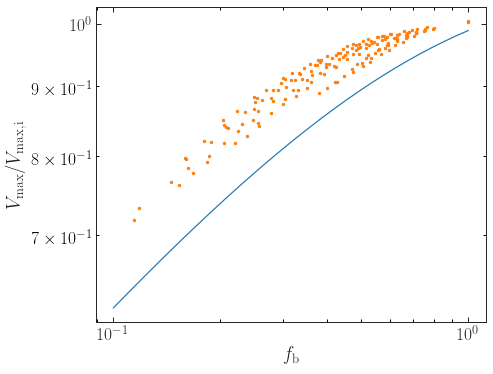

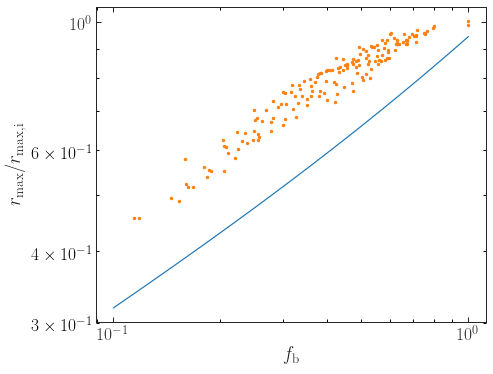

In [808]:
# TODO: keep trying to figure this out and make sure we're doing the conversion right, then send to Frank

fb_vals = np.logspace(-1,0,30)
vm_vals = g_v_r(fb_vals*Gamma**2 / Qs(18.2)**3, 0.4,0.3) #*Vmax0(23.1, 1.)/Vmax0(18.2,1.) # don't think this was right either
rm_vals = g_v_r(fb_vals*Gamma**2 / Qs(18.2)**3,-0.3,0.4) #*rmax0(1. / 23.1)/rmax0(1. / 18.2)

submat = max_mat[np.logical_and(max_mat[:,1]==19.9,max_mat[:,0]==10.)]

# this is normalized by V_max for cs=19.9
# what if we change this to normalize by Vmax for cs=23.1?

#        rmax = np.array(rmax) / rmax0(1. / cs_vals[cs_num]) # want to try the old version again to figure out issue...
#        vmax = np.array(vmax) / Vmax0(cs_vals[cs_num], 1.)

print(np.unique(submat[:,2]))
loglogplot()
plt.plot(fb_vals,vm_vals)
plt.plot(submat[:,4],submat[:,5],'.')
plt.xlabel(r'$f_\mathrm{b}$')
plt.ylabel(r'$V_\mathrm{max} / V_\mathrm{max,i}$')
#plt.title(r'$c_\mathrm{s}=25$, $c_\mathrm{h}=12.5$')

loglogplot()
plt.plot(fb_vals,rm_vals)
plt.plot(submat[:,4],submat[:,6],'.')
plt.xlabel(r'$f_\mathrm{b}$')
plt.ylabel(r'$r_\mathrm{max} / r_\mathrm{max,i}$')
#plt.title(r'$c_\mathrm{s}=25$, $c_\mathrm{h}=12.5$')
# NOT EVEN CLOSE...

In [730]:
def fHu(x):
    return x**3 / (np.log(1. + x**-1) - (1. + x)**-1)

delta_v = 101.
delta_h = 200.

#solving for ch given cv
def c_conv_func(ch, cv):
    return fHu(1. / ch) - ((delta_h / delta_v) * fHu(1. / cv))

#converts cv to ch
def c_conv(cv):
    return root_scalar(c_conv_func,args=(cv),method='brentq', bracket=(1,500))

print(c_conv(23.1))
print(c_conv(12))

      converged: True
           flag: 'converged'
 function_calls: 17
     iterations: 16
           root: 18.925081681321068
      converged: True
           flag: 'converged'
 function_calls: 17
     iterations: 16
           root: 9.89268969404338


In [762]:
# validate using frank's rescaling

hdash = 0.678
hpen  = 0.7
delta_v = 101.
delta_h = 200.

def c_conv_func(q, cs):
    return (q**3 * NFWf(cs)/NFWf(cs*q) * delta_v / delta_h * (hpen/hdash)**2) - 1

def c_conv(cs):
    q= root_scalar(c_conv_func,args=(cs),method='brentq', bracket=(1,500)).root
    return cs*q

def Qs(cs):
    q= root_scalar(c_conv_func,args=(cs),method='brentq', bracket=(1,500)).root
    return q

Gamma = (hpen/hdash)**(-1.0) * (delta_v / delta_h)**(-1.0/2.0)

print(c_conv(18.925))
print(c_conv(18.2))

# depends on if the q is in the top f(c) or bottom f(c)
print(Qs(18.2))
print(Gamma)

# the two methods don't agree.... I think that I found an error in DASH paper

24.069336951896364
23.159319426429334
1.2724900783752382
1.362968958077537


In [768]:
print(c_conv(9.3))
print(Qs(9.3))
print(Gamma**2)
print(Qs(18.2)**3)

11.967897987984632
1.2868707513961968
1.8576843806829668
2.0604553815420714


In [69]:

#now we need to get these values for every single thing in our dataset

@jit(parallel=True)
def get_hayashi_vr(normed=True):
    hayashi_vmax = np.zeros(len(max_mat))
    hayashi_rmax = np.zeros(len(max_mat))
    for i in prange(0,len(max_mat)):
        if i % 1000 == 0:
            print(i)
        hayashi_rmax[i], hayashi_vmax[i] = hayashi_vm_rm(max_mat[i,4], max_mat[i,1], normed)
    return hayashi_rmax, hayashi_vmax
        
hayashi_rmax, hayashi_vmax = get_hayashi_vr(normed=True)

# this seems to only be using one core... how do we make it use all of them?

0
1000
2000
3000
4000
5000
6000
7000
8000


(40,)
1.4113975607987028 0.046137600247654544
[0.90532033 0.90540958 0.90554243 0.90573943 0.90603012 0.90645618
 0.90707504 0.90796299 0.90921541 0.91093925 0.91322713 0.91609431
 0.91934862 0.92236491 0.92379594 0.92146358 0.91298125 0.89736252
 0.87633159 0.8535349  0.83240523 0.81486767 0.80138803 0.79157017
 0.7846887  0.7799985  0.77686769 0.77481046 0.77347491 0.77261593
 0.77206748 0.77171928 0.7714992  0.7713606  0.77127354 0.77121898
 0.77118485 0.77116353 0.77115022 0.77114193]


Text(0, 0.5, '$V_\\textnormal{c}(r)$')

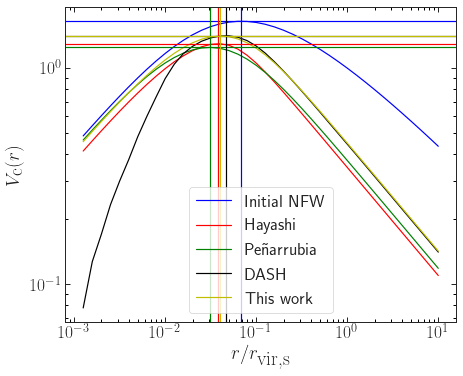

In [271]:
vc_vals_hay = np.zeros(len(mass_prof_radii))
vc_vals_nfw = np.zeros(len(mass_prof_radii))
vc_vals_pen = np.zeros(len(mass_prof_radii))
vc_vals_mod = np.zeros(len(mass_prof_radii))
testcs = 31.5
testfb = 0.20
for i in range(0, len(radii)):
    vc_vals_nfw[i] = np.sqrt(G*NFWmass(mass_prof_radii[i], testcs) / mass_prof_radii[i])
    vc_vals_hay[i] = np.sqrt(
        G*hayashiMass(mass_prof_radii[i], testfb, testcs) / mass_prof_radii[i])
    vc_vals_pen[i] = testcs**(3./2.) * np.sqrt(G*penarrubiaMass(mass_prof_radii[i], testfb, testcs) / mass_prof_radii[i]) #this is units where r_s=1, right?
    vc_vals_mod[i] = np.sqrt(
        G*modelMass(fp_v43_newdash_sub, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, mass_prof_radii[i], testfb, testcs) / mass_prof_radii[i])
        #G*modelMass(fp_exp_v3_rmse, paramet_exp_v3, exp_decay_v3, radii[i], testfb, testcs) / radii[i])
    

init_rmax = 2.163/testcs
init_vmax = 0.465*np.sqrt(testcs/NFWf(testcs))

sim_num=1
dash_rmax = max_mat[np.logical_and(np.logical_and(max_mat[:, 1] == testcs, max_mat[:, 4] >= testfb-.001), max_mat[:, 4] <= testfb+.001)][:, 6][sim_num]
dash_vmax = max_mat[np.logical_and(np.logical_and(max_mat[:, 1] == testcs, max_mat[:, 4] >= testfb-.001), max_mat[:, 4] <= testfb+.001)][:, 5][sim_num]
dash_prof = max_mat[np.logical_and(np.logical_and(max_mat[:, 1] == testcs, max_mat[:, 4] >= testfb-.001), max_mat[:, 4] <= testfb+.001)][:, 7:][sim_num]
print(dash_prof.shape)
print(dash_vmax,dash_rmax)
## TODO: go from penarubbia density to velocity 
#(figure out what's going on here... penarubbia prediction disagrees with their own model)
## TODO: plot an example dash velocity curve

print(vc_vals_hay / vc_vals_mod)

fig, ax = loglogplot()
plt.plot(mass_prof_radii, vc_vals_nfw, 'b')
plt.plot(mass_prof_radii, vc_vals_hay, 'r')
plt.plot(mass_prof_radii, vc_vals_pen, 'g')
plt.plot(mass_prof_radii, np.sqrt(G*dash_prof / mass_prof_radii), color='k')
plt.plot(mass_prof_radii, vc_vals_mod, color='y') #TODO: plot predictions
plt.axvline(init_rmax, label='Initial NFW', color='b')
plt.axhline(init_vmax, color='b')
plt.axvline(hayashi_vm_rm(testfb, testcs, normed=False)[
            0], color='r', label='Hayashi')
plt.axhline(hayashi_vm_rm(testfb, testcs, normed=False)[
            1], color='r')
plt.axvline(g_v_r(testfb, -0.3, 0.4)*init_rmax, color='g', label='Pe{\~ n}arrubia')
plt.axhline(g_v_r(testfb, 0.4, 0.3)*init_vmax, color='g')
plt.axvline(dash_rmax, label='DASH', color='k')
plt.axhline(dash_vmax, color='k')
plt.axvline(model_vm_rm(fp_v43_newdash_sub, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, testfb, testcs, normed=False)[0], color='y', label='This work')
plt.axhline(model_vm_rm(fp_v43_newdash_sub, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, testfb, testcs, normed=False)[1], color='y')
#plt.axvline(model_vm_rm(fp_exp_v3_rmse, paramet_exp_v3, exp_decay_v3, testfb, testcs, normed=False)[0], color='y', label='This work')
#plt.axhline(model_vm_rm(fp_exp_v3_rmse, paramet_exp_v3, exp_decay_v3, testfb, testcs, normed=False)[1], color='y')
plt.legend()
plt.xlabel(r'$r/r_\textnormal{vir,s}$')
plt.ylabel(r'$V_\textnormal{c}(r)$')
# plot the true...

#the issue remaining is related to the normalizations
#DASH normalizations are obviously fine, since we're dividing by vmax at t=0
#Penarrubia normalizations are fine, since the calculations are explicitly in terms of the ratios
#thus, we can just multiply those by the initial vmax/rmax of the NFW profile
#However, what about Hayashi?

#the difficulty lies in getting that correct, because we are fitting explicitly for ratios relative to t=0
#however, it makes since to use the t=0 ratio as the original NFW ratio, because that's just what it is...

#plt.xlim(5e-2, 1)
#plt.ylim(0.4,1)

#okay, so what is happening at the lower values of fb...?
#clearly the profile is there, but the solution for rmax isn't doing well...

In [163]:
max_mat[np.logical_and(max_mat[:,4] <3e-2,max_mat[:,6] > 3e-1)][:,:4]

array([[ 5.        , 10.        ,  1.        ,  0.        ],
       [ 5.        , 10.        ,  1.        ,  0.1       ],
       [ 5.        , 10.        ,  1.14869835,  0.        ],
       [ 5.        , 10.        ,  1.31950791,  0.        ],
       [ 5.        , 10.        ,  1.51571657,  0.        ],
       [ 5.        , 10.        ,  1.51571657,  0.        ],
       [ 5.        , 10.        ,  1.51571657,  0.        ],
       [ 5.        , 10.        ,  1.74110113,  0.        ],
       [ 5.        , 10.        ,  1.74110113,  0.        ],
       [ 5.        , 10.        ,  2.        ,  0.        ]])

In [222]:
# make a cut to get the sims in a particular region with the highest concentration
max_mat[np.logical_and(max_mat[:,1] == cs_vals[10], np.logical_and(max_mat[:,4] <6e-1,max_mat[:,6] > 1))][:,:4]

# one of the ones that behaves strangely is ch_dirs[9] / cs_dirs[10] / xc_dirs[9] / eta_dirs[5]
# this seems to be the same...

array([[19.9       , 31.5       ,  1.51571657,  0.2       ],
       [19.9       , 31.5       ,  1.74110113,  0.5       ],
       [25.        , 31.5       ,  1.31950791,  0.5       ],
       [25.        , 31.5       ,  1.51571657,  0.2       ],
       [25.        , 31.5       ,  1.51571657,  0.5       ],
       [25.        , 31.5       ,  1.74110113,  0.5       ]])

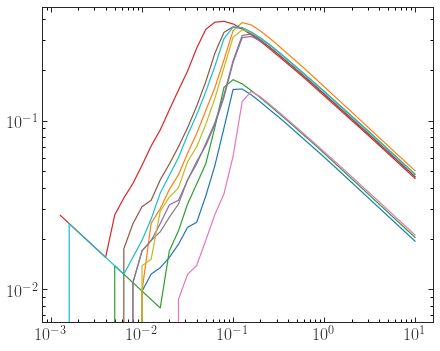

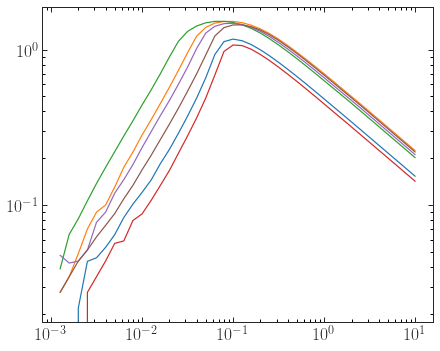

In [224]:
outliers = max_mat[np.logical_and(max_mat[:,4] <3e-2,max_mat[:,6] > 3e-1)]
fig, ax = loglogplot()
for i in range(0,outliers.shape[0]):
    plt.plot(mass_prof_radii, np.sqrt(outliers[i,7:] / mass_prof_radii))
    
outliers = max_mat[np.logical_and(max_mat[:,1] == cs_vals[10], np.logical_and(max_mat[:,4] <6e-1,max_mat[:,6] > 1))]
fig, ax = loglogplot()
for i in range(0,outliers.shape[0]):
    plt.plot(mass_prof_radii, np.sqrt(outliers[i,7:] / mass_prof_radii))
#these seem to have a similar issue
#they all seem to have the same cs, ch configuration, with slightly different xc, eta combinations
    
# yep, this is what is happening to all of them
# they're blowing out...

# now, we just need to determine if this is also the case for the large f_b one...
# we can make a complete list of all of the outliers and consider throwing them out

In [271]:
# modified version of load_vrmax that loads for all steps instead of just the apocenters

def load_vrmax_all(directory, cs_num, normed=True):
    prof_dat = np.loadtxt(directory / 'radprof_m.txt')[1:,1:] #radii are in 0th and same for all
    sh_dat = np.loadtxt(directory / 'subhalo_evo.txt')
    num_conv_ind = convergence_criteria(sh_dat,cs_vals[cs_num])
    
    #now, find the apocenters and remove other points
    mask = mask_apocenters(sh_dat)[0:num_conv_ind]
    prof_dat = prof_dat[:num_conv_ind,:]
    sh_dat = sh_dat[:num_conv_ind,:]

    #compute vmax, rmax for each point
    vels = np.sqrt(G * prof_dat / mass_prof_radii)
    rmax = []
    vmax = []
    for i in range(0,vels.shape[0]):
        interp_vel_prof = InterpolatedUnivariateSpline(mass_prof_radii,vels[i,:], k=4)
        rm = max(interp_vel_prof.derivative().roots())
        rmax.extend([rm])
        vmax.extend([interp_vel_prof(rm)])
        #plt.plot(np.log10(radii), np.log10(vels[2,:]))
        #plt.plot(np.log10(radii), np.log10(interp_vel_prof(radii)))
        #plt.axvline(np.log10(rm)) #for visualizing
             
    if(normed):
        init_vals = np.column_stack((np.repeat(vmax[0],len(vmax)),np.repeat(rmax[0],len(rmax))))
        #rmax = np.array(rmax) / rmax[0] #normalized
        #vmax = np.array(vmax) / vmax[0]
        
        rmax = np.array(rmax) / rmax0(1. / cs_vals[cs_num]) # want to try the old version again to figure out issue...
        vmax = np.array(vmax) / Vmax0(cs_vals[cs_num], 1.)  # basically, should we be comparing to NFW or to t=0, why does the difference come about?
    else:
        rmax = np.array(rmax)
        vmax = np.array(vmax)
      
    
    return(np.column_stack((sh_dat[:,7], vmax, rmax, prof_dat)),init_vals) #throw out the first one

(301, 41)


Text(0.5, 1.0, '$c_\\mathrm{h}=25.00$, $c_\\mathrm{s}=31.50$, $x_\\mathrm{c}=1.52$, $\\eta=0.20$')

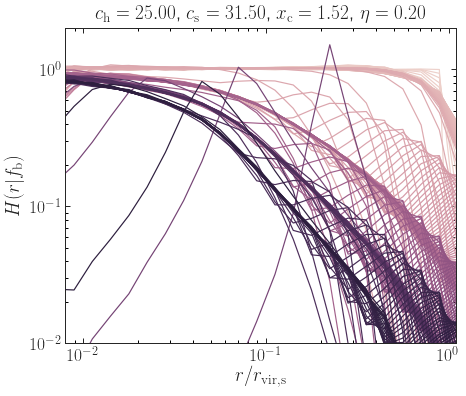

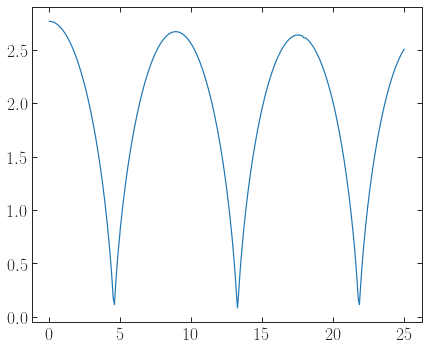

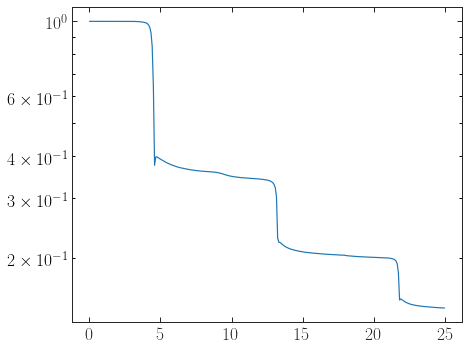

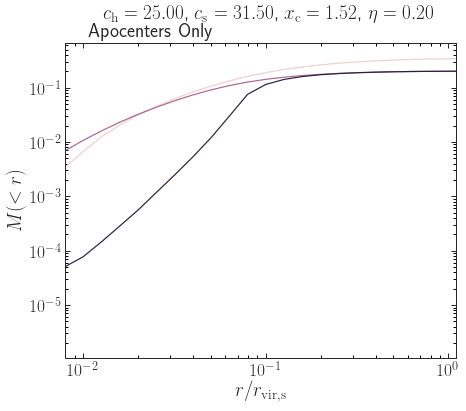

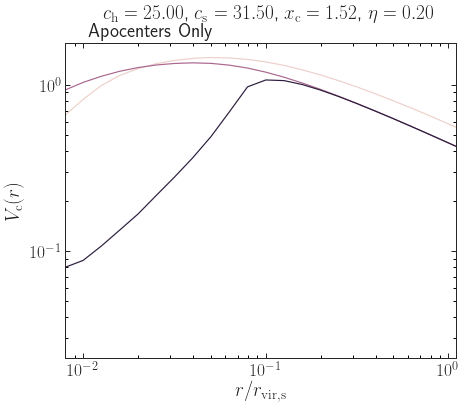

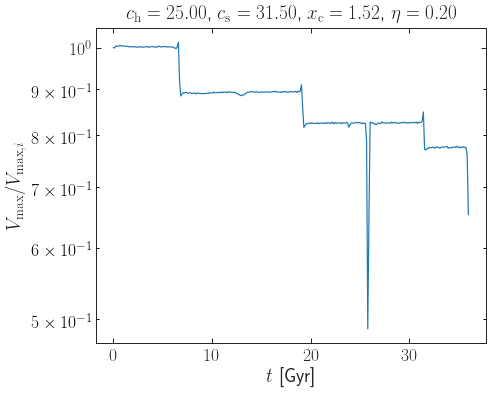

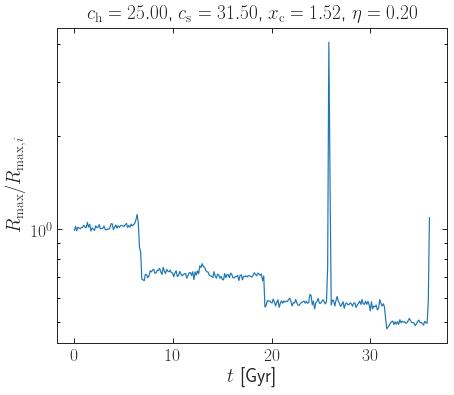

In [283]:
# let's give one of these density profiles a look to see what's going on
# clearly this is after

#chn = 2; csn = 5; xcn = 5; etn = 0
# another example, these on the high f_b end
#[25.        , 31.5       ,  1.74110113,  0.5       ]
chn = 9; csn = 10; xcn = 8; etn = 2


direct = dash_root / ch_dirs[chn] / cs_dirs[csn] / xc_dirs[xcn] / eta_dirs[etn]
sh_evo_fn = direct / 'subhalo_evo.txt'
evo_dat = np.loadtxt(sh_evo_fn)


test = load_sim(dash_root / ch_dirs[chn] / cs_dirs[csn] / xc_dirs[xcn] / eta_dirs[etn], csn,mask_snaps=False, normalize=True, by_nfw=True, mask_type=MT)
print(test.shape)
cols = sns.cubehelix_palette(test.shape[0])
loglogplot()
for i in range(0,len(test)):
    plt.plot(radii, test[i,1:], color=cols[i])
plt.xlim(8e-3,1.1); plt.ylim(10**-2, 2.)
plt.xlabel(r'$r/r_\mathrm{vir,s}$')
plt.ylabel('$H(r|f_\mathrm{b})$')

plt.title(r'$c_\mathrm{h}=%.2f$, $c_\mathrm{s}=%.2f$, $x_\mathrm{c}=%.2f$, $\eta=%.2f$' % (ch_vals[chn], cs_vals[csn], xc_vals[xcn], eta_vals[etn]))

fig, ax = plot()
plt.plot(times[:test.shape[0]], np.linalg.norm(evo_dat[:,1:4],axis=1)[:test.shape[0]])

plot(semilogy=True)
plt.plot(times[:test.shape[0]], test[:,0])

# now can we also get the Vmax curve...
test, trash = load_vrmax(dash_root / ch_dirs[chn] / cs_dirs[csn] / xc_dirs[xcn] / eta_dirs[etn], csn, normed=True)
cols = sns.cubehelix_palette(test.shape[0])
loglogplot()
for i in range(0,len(test)):
    plt.plot(mass_prof_radii, test[i,3:], color=cols[i])
plt.xlim(8e-3,1.1)
plt.xlabel(r'$r/r_\mathrm{vir,s}$')
plt.ylabel('$M(<r)$')
plt.title(r'$c_\mathrm{h}=%.2f$, $c_\mathrm{s}=%.2f$, $x_\mathrm{c}=%.2f$, $\eta=%.2f$ \\ Apocenters Only' % (ch_vals[chn], cs_vals[csn], xc_vals[xcn], eta_vals[etn]))

test, trash = load_vrmax(dash_root / ch_dirs[chn] / cs_dirs[csn] / xc_dirs[xcn] / eta_dirs[etn], csn, normed=True)
cols = sns.cubehelix_palette(test.shape[0])
loglogplot()
for i in range(0,len(test)):
    plt.plot(mass_prof_radii, np.sqrt(test[i,3:] / mass_prof_radii), color=cols[i])
plt.xlim(8e-3,1.1)
plt.xlabel(r'$r/r_\mathrm{vir,s}$')
plt.ylabel('$V_\mathrm{c}(r)$')
plt.title(r'$c_\mathrm{h}=%.2f$, $c_\mathrm{s}=%.2f$, $x_\mathrm{c}=%.2f$, $\eta=%.2f$ \\ Apocenters Only' % (ch_vals[chn], cs_vals[csn], xc_vals[xcn], eta_vals[etn]))

# frank want's to see vmax/rmax vs time
# we just load in the mass profile
test, trash = load_vrmax_all(dash_root / ch_dirs[chn] / cs_dirs[csn] / xc_dirs[xcn] / eta_dirs[etn], csn, normed=True)
plot(semilogy=True)
plt.plot(times[:test.shape[0]]*1.44,test[:,1])
plt.xlabel(r'$t$ [Gyr]')
plt.ylabel(r'$V_\mathrm{max}/V_{\mathrm{max},i}$')
plt.title(r'$c_\mathrm{h}=%.2f$, $c_\mathrm{s}=%.2f$, $x_\mathrm{c}=%.2f$, $\eta=%.2f$' % (ch_vals[chn], cs_vals[csn], xc_vals[xcn], eta_vals[etn]))
plot(semilogy=True)
plt.plot(times[:test.shape[0]]*1.44,test[:,2])
plt.ylabel(r'$R_\mathrm{max}/R_{\mathrm{max},i}$')
plt.xlabel(r'$t$ [Gyr]')
plt.title(r'$c_\mathrm{h}=%.2f$, $c_\mathrm{s}=%.2f$, $x_\mathrm{c}=%.2f$, $\eta=%.2f$' % (ch_vals[chn], cs_vals[csn], xc_vals[xcn], eta_vals[etn]))

# I would like to color these so that I know which ones correspond to apocentric and pericentric passage
# This way I can tell if the last few are right before pericenter or not..
# maybe we can plot the radius vs. time since we have the data; we can load subhalo evo and see which snaps
# correspond to apo, peri

# so what is happening in these cases is that the subhalo seems to blow up from the insight out right at the final
# apocentric passage before failing the numerical convergence criteria

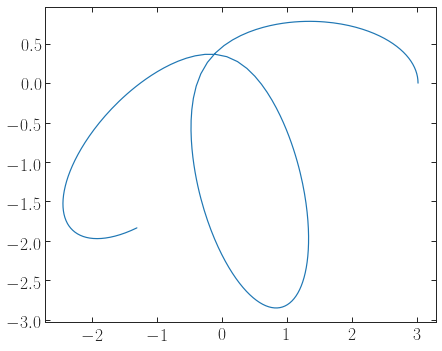

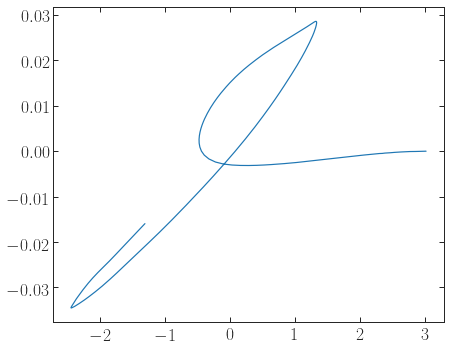

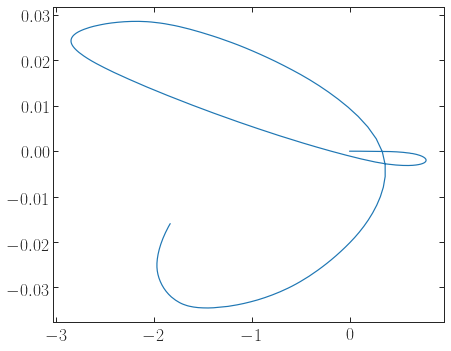

In [158]:
test = np.loadtxt(dash_root / ch_dirs[9] / cs_dirs[10] / xc_dirs[9] / eta_dirs[5] / 'subhalo_evo.txt')
plot()
plt.plot(test[:,1], test[:,2])
plot()
plt.plot(test[:,1], test[:,3])
plot()
plt.plot(test[:,2], test[:,3])

# unclear what is causing this, but there are several that this happens to

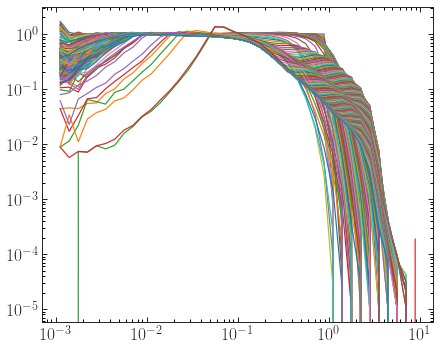

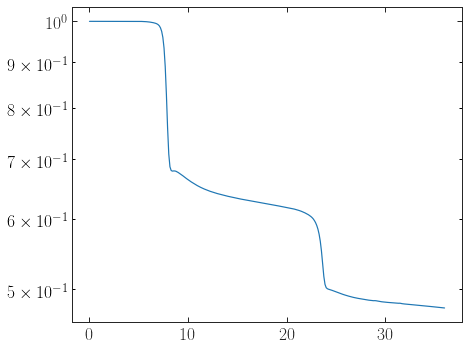

In [152]:
test = load_sim(dash_root / ch_dirs[9] / cs_dirs[10] / xc_dirs[9] / eta_dirs[5], 10,mask_snaps=False, normalize=True, by_nfw=True, mask_type=MT)
loglogplot()
for i in range(0,len(test)):
    plt.plot(radii, test[i,1:])

plot(semilogy=True)
plt.plot(times, test[:,0]) # seems reasonably well-behaved
# something really strange happened in this simulation, not worth re-running them all to find out what

[2.50000000e+01 3.15000000e+01 1.74110113e+00 5.00000000e-01
 4.82095700e-01 8.78458142e-01 1.64004910e+00 9.53674300e-07
 1.90734900e-06 3.81469700e-06 6.67572000e-06 1.23977700e-05
 2.19345100e-05 3.91006500e-05 7.62939500e-05 1.43051100e-04
 2.84194900e-04 5.50270100e-04 1.09863300e-03 2.18868300e-03
 4.43077100e-03 9.22107700e-03 1.94301600e-02 4.27560800e-02
 9.43088500e-02 1.51829700e-01 2.07066500e-01 2.60771800e-01
 3.10822500e-01 3.54460700e-01 3.88858800e-01 4.14249400e-01
 4.32470300e-01 4.46051600e-01 4.56298800e-01 4.63583900e-01
 4.68635600e-01 4.72100300e-01 4.74899300e-01 4.77744100e-01
 4.80451600e-01 4.81563600e-01 4.81718100e-01 4.81752400e-01
 4.81761000e-01 4.81762900e-01 4.81762900e-01]
25.0 31.5 1.7411011265922482 0.5
3


(array([[6.29973400e-01, 9.75141697e-01, 9.64942196e-01, 2.19345100e-05,
         5.62667800e-05, 1.28746000e-04, 2.68936200e-04, 5.14984100e-04,
         1.06906900e-03, 2.07042700e-03, 3.88145400e-03, 6.84833500e-03,
         1.13830600e-02, 1.77946100e-02, 2.65283600e-02, 3.84187700e-02,
         5.37948600e-02, 7.36227000e-02, 9.81807700e-02, 1.27814300e-01,
         1.62958100e-01, 2.03878400e-01, 2.49117900e-01, 2.97849700e-01,
         3.48077800e-01, 3.96713300e-01, 4.41088700e-01, 4.79733500e-01,
         5.12048700e-01, 5.38782100e-01, 5.61322200e-01, 5.79563100e-01,
         5.93168300e-01, 6.03533700e-01, 6.10798800e-01, 6.17938000e-01,
         6.24910400e-01, 6.29444100e-01, 6.29928600e-01, 6.29962000e-01,
         6.29962000e-01, 6.29962000e-01, 6.29962000e-01],
        [4.82095700e-01, 8.78458142e-01, 1.64004910e+00, 9.53674300e-07,
         1.90734900e-06, 3.81469700e-06, 6.67572000e-06, 1.23977700e-05,
         2.19345100e-05, 3.91006500e-05, 7.62939500e-05, 1.4305110

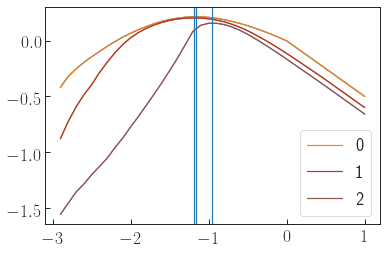

In [157]:
print(max_mat[8604])
#loglogplot()
#plt.plot(radii, np.sqrt(max_mat[8604,7:] / radii))
print(ch_vals[9], cs_vals[10], xc_vals[9],eta_vals[5])
load_vrmax(dash_root / ch_dirs[9] / cs_dirs[10] / xc_dirs[9] / eta_dirs[5], 10, normed=True)
# what in the hell happened to this one?

In [70]:
max_mat

array([[ 3.1       ,  3.1       ,  1.        , ...,  0.3581209 ,
         0.3581209 ,  0.3581209 ],
       [ 3.1       ,  3.1       ,  1.        , ...,  0.1213217 ,
         0.1213217 ,  0.1213217 ],
       [ 3.1       ,  3.1       ,  1.        , ...,  0.0506916 ,
         0.0506916 ,  0.0506916 ],
       ...,
       [31.5       , 31.5       ,  1.14869835, ...,  0.7146244 ,
         0.7146244 ,  0.7146244 ],
       [31.5       , 31.5       ,  1.14869835, ...,  0.6081266 ,
         0.6081266 ,  0.6081266 ],
       [31.5       , 31.5       ,  1.14869835, ...,  0.5566378 ,
         0.5566378 ,  0.5566378 ]])

8683
93
-0.6151328227978996 7.610436748726574


/home/sbg/anaconda3/lib/python3.7/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
/home/sbg/anaconda3/lib/python3.7/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
/home/sbg/anaconda3/lib/python3.7/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")
/home/sbg/anaconda3/lib/python3.7/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'densit

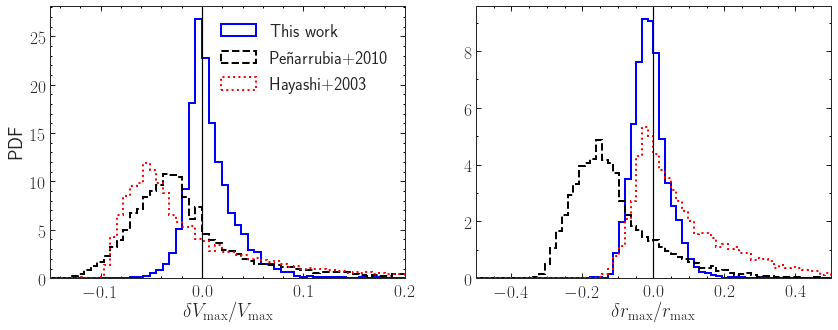

In [782]:
#generate two of our pdfs. Penarrubia vs. ours for vmax/rmax
msk = np.logical_and(np.logical_and(np.logical_and(max_mat[:,5] != 1,~np.isclose(model_rmax,0.)),max_mat[:,6] != 1),~np.isclose(hayashi_rmax,0.))
print(np.sum(msk))
# not sure how to interpret the cs dependence since hayashi calibrated with cs=10 and penarrubia with cs=23
# why is the agreement very bad, and what does this say for us? I should make sure the penarrubia method is correct
#csn = 9
#fbv = 0.45
#fbd = 0.05
#etn = 1
#msk = np.logical_and(msk, max_mat[:,1] == cs_vals[csn])
#msk = np.logical_and(np.logical_and(msk, max_mat[:,4] >= fbv-fbd), max_mat[:,4] <= fbv+fbd)
#print(cs_vals[csn])

# figure out why changing vmax/rmax preds for Hayashi changes the way the other curves look
# it is because with the old root finder we got 8588
# but with the new root finder that uses secant method, we get 8683 nonzero

# need to fix the location of the legend
# what happens to our results if we use the second root finder for our results as well?

vmax_errors_pen = (g_v_r(max_mat[msk,4], 0.4, 0.3) - max_mat[msk,5]) / max_mat[msk,5]
rmax_errors_pen = (g_v_r(max_mat[msk,4], -0.3,0.4) - max_mat[msk,6]) / max_mat[msk,6]

vmax_errors_hay = (hayashi_vmax[msk] - max_mat[msk,5]) / max_mat[msk,5]
rmax_errors_hay = (hayashi_rmax[msk] - max_mat[msk,6]) / max_mat[msk,6]

vmax_errors_mod = (model_vmax[msk] - max_mat[msk,5]) / max_mat[msk,5]
rmax_errors_mod = (model_rmax[msk] - max_mat[msk,6]) / max_mat[msk,6]

#the couple bad ones are where the model is basically zero, so we throw those out

print(int(np.sqrt(len(rmax_errors_hay))))
print(np.min(rmax_errors_hay),np.max(rmax_errors_hay))

bin_edges_v = (-0.4,0.2)
bin_edges_r = (-1,0.5)

fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(14,5))
ax[0].yaxis.set_ticks_position('both')
ax[0].xaxis.set_ticks_position('both')
ax[0].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
ax[1].yaxis.set_ticks_position('both')
ax[1].xaxis.set_ticks_position('both')
ax[1].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
ax[0].xaxis.set_minor_locator(MultipleLocator(0.02))
ax[0].yaxis.set_minor_locator(MultipleLocator(1))
ax[1].xaxis.set_minor_locator(MultipleLocator(0.05))
ax[1].yaxis.set_minor_locator(MultipleLocator(1))

ax[0].hist(vmax_errors_mod, bins=int(np.sqrt(len(vmax_errors_mod))), normed=True, color="b", linestyle='solid', histtype="step", linewidth=2., label='This work', range=bin_edges_v);
ax[0].hist(vmax_errors_pen, bins=int(np.sqrt(len(vmax_errors_pen))), normed=True, color="k", linestyle='dashed', histtype="step", linewidth=2., label='Pe{\~ n}arrubia+2010', range=bin_edges_v);
ax[0].hist(vmax_errors_hay, bins=int(np.sqrt(len(vmax_errors_hay))), normed=True, color="r", linestyle='dotted', histtype="step", linewidth=2., label='Hayashi+2003', range=bin_edges_v);
ax[0].axvline(0., color='k')
#ax[0].set_xlabel(r'$[\frac{V_{max}}{V_{max,i}}\textrm{(DASH)} - \frac{V_{max}}{V_{max,i}}\textrm{(Model)}] / \frac{V_{max}}{V_{max,i}}\textrm{(DASH)}$')
ax[0].set_xlabel(r'$\delta V_\mathrm{max} / V_\mathrm{max}$')
ax[0].set_xlim(-0.15, 0.2)
ax[0].set_ylabel(r'PDF')
ax[1].hist(rmax_errors_mod, bins=int(np.sqrt(len(rmax_errors_mod))), normed=True, color="b", linestyle='solid', histtype="step", linewidth=2., label='This work', range=bin_edges_r);
ax[1].hist(rmax_errors_pen, bins=int(np.sqrt(len(rmax_errors_pen))), normed=True, color="k", linestyle='dashed', histtype="step", linewidth=2., label='Pe{\~ n}arrubia+2010', range=bin_edges_r);
ax[1].hist(rmax_errors_hay, bins=int(np.sqrt(len(rmax_errors_hay))), normed=True, color="r", linestyle='dotted', histtype="step", linewidth=2., label='Hayashi+2003', range=bin_edges_r);
#ax[1].set_xlabel(r'$[\frac{R_{max}}{R_{max,i}}\textrm{(DASH)} - \frac{R_{max}}{R_{max,i}}\textrm{(Model)}] / \frac{R_{max}}{R_{max,i}}\textrm{(DASH)}$')
ax[1].set_xlabel(r'$\delta r_\mathrm{max} / r_\mathrm{max}$')
ax[1].axvline(0., color='k')
ax[1].set_xlim(-0.5,0.5)
ax[0].legend(loc=1, frameon=False)

mean = 0; std = 0.02; variance = np.square(std)
x = np.arange(-0.1,0.1,.01)
f = np.exp(-np.square(x-mean)/(2*variance))/(np.sqrt(2*np.pi*variance))
#ax[0].plot(x,f)

mean = -0.0125; std = 0.045; variance = np.square(std)
x = np.arange(-0.1,0.1,.01)
f = np.exp(-np.square(x-mean)/(2*variance))/(np.sqrt(2*np.pi*variance))
#ax[1].plot(x,f)

plt.savefig(fig_dir/'vmax_rmax_dist.eps', bbox_inches='tight') # may want to look at this as function of c_s?

#we're going to generate two plots, each of which have 3 histograms
#comparing hayashi, penarrubia, and our model

#why are there zeros? these are obviously just the first snapshot... threw them out

#my new model calculated in the same manner as hayashi seems to do even worse...

#NOTE: These are just at apocenter... is that OK?

#There is still an overall slight bias in the Rmax values, but things should get better once we have the new data
#If not, then it is what it is

# expect the dist to look better when we are using Rmax0 instead of Rmax_NFW as the normalizer
# not yet sure if NFW or avg NFW bins will do better

# best so far is normalizing by avg NFW using either Rmax0 or Rmax_NFW as normalizer

# since the bias is still there, let's try visualizing the error dist
# then, we can decide if we should cut deeper into the halo

# things look slightly worse when normalizing density profs by NFW instead of avg NFW
# I think that using avg NFW makes the most sense
# I also think that using the NFW Vmax/Rmax makes most sense for the comparisons (helps us most too, since rmax ratios lower)
# however, there is an argument to be made for using Rmax0 instead... ask Frank

# skipping outer 2 radial bins DEFINITELY helps
# but I think that what will be most helpful is actually iincorporating additional dependence on c_s in f_{te}

# going 2nd order in f_te didn't make much of a difference
# trying to add the exponential for f_te but it seems to be hitting a similar wall for performance
# much of this seems to highlight either an inadequacy in the functional form, or an inadequacy in the mu/delta?
# or an issue related to weighting: there should not be a strong c_s dependence on the overall normalization
# what if I took a mean of the innermost ~4 bins and then fit directly to that, as has been proposed before
# not sure if this would be better

# removing outer shells *definitely* helps get closer
# another thing that could help would be to weight the outer shells less
# we still need to try, using fewer shells, a couple more modified forms for the density profile;
# pick this back up after meeting

# c_s binning shows that we pretty systematically predict wrong...
# the scatter plot seems to suggest that we are biased consistently along f_b as well
# this suggests to me that the outer radii are weighted too strongly


# current leads:
# outer radii weighted too strongly
# insufficent c_s dependence on mu, delta

# this shows that the value placed on the further out radii is too high
# since rmax = 2.163rs to first order for NFW, we really should be weighting more, for given c_s, the radial
# bins inside of estimated original rmax
# thus, it should be unsurprising that the lower c_s values actually do better, since we are only really weighting out
# to rmax...

# the relative error is 3%... let's spend tomorrow making sure there is nowhere else that the error could be coming
# in that isn't attributed to just fitting error...
# could be something related to translating/normalization/etc

# for v48, we can get it to 2%... let's play around tomorrow and see if we can find any sources of an additional 2% error
# counterintuitively, it seems that for the low c_s values, even though we seem to do worse on the density profile,
# we are closer to correct for the rmax distribution... let's think more about this and the 2% error sources tomorrow

# currently normalizing the density profiles by the avg NFW profile
# currently normalizing Vmax/Rmax by NFW predictions
# currently writing model predictions in terms of value at t=0... but should probably do NFW
# since when fb=1, the model prediction will go to NFW, this means that fb=1

# do we use the NFW prediction for vmax,rmax normalization or the t=0... it makes sense to use t=0 I think for our stuff
# since we've trained it on a particular density profile
# but then it also makes sense to normalize by the t=0 density profile...

# let's make a plot that shows transfer functions binned by c_h, c_s, x_c, eta, f_b

# we're now so close that any improvement at all would make it unbiased
# now, we still have some c_s-dependent residual, but I think we put that on the backburner for now and check with Frank

# things to do:
# make a plot that shows transfer functions binned by the various parameters: c_h, c_s, x_c, eta, f_b
# this should show trends
# then, start working on alpha(t) distributino

#hayashi does bad at vmax because it doesn't capture the inner radii very well (too low)

In [70]:
from inspect import getmembers, isclass
import matplotlib
import matplotlib.pyplot as plt
import numpy as np


def rasterize_and_save(fname, rasterize_list=None, fig=None, dpi=None,
                       savefig_kw={}):
    """Save a figure with raster and vector components
    This function lets you specify which objects to rasterize at the export
    stage, rather than within each plotting call. Rasterizing certain
    components of a complex figure can significantly reduce file size.
    Inputs
    ------
    fname : str
        Output filename with extension
    rasterize_list : list (or object)
        List of objects to rasterize (or a single object to rasterize)
    fig : matplotlib figure object
        Defaults to current figure
    dpi : int
        Resolution (dots per inch) for rasterizing
    savefig_kw : dict
        Extra keywords to pass to matplotlib.pyplot.savefig
    If rasterize_list is not specified, then all contour, pcolor, and
    collects objects (e.g., ``scatter, fill_between`` etc) will be
    rasterized
    Note: does not work correctly with round=True in Basemap
    Example
    -------
    Rasterize the contour, pcolor, and scatter plots, but not the line
    >>> import matplotlib.pyplot as plt
    >>> from numpy.random import random
    >>> X, Y, Z = random((9, 9)), random((9, 9)), random((9, 9))
    >>> fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2)
    >>> cax1 = ax1.contourf(Z)
    >>> cax2 = ax2.scatter(X, Y, s=Z)
    >>> cax3 = ax3.pcolormesh(Z)
    >>> cax4 = ax4.plot(Z[:, 0])
    >>> rasterize_list = [cax1, cax2, cax3]
    >>> rasterize_and_save('out.svg', rasterize_list, fig=fig, dpi=300)
    """

    # Behave like pyplot and act on current figure if no figure is specified
    fig = plt.gcf() if fig is None else fig

    # Need to set_rasterization_zorder in order for rasterizing to work
    zorder = -5  # Somewhat arbitrary, just ensuring less than 0

    if rasterize_list is None:
        # Have a guess at stuff that should be rasterised
        types_to_raster = ['QuadMesh', 'Contour', 'collections']
        rasterize_list = []

        print("""
        No rasterize_list specified, so the following objects will
        be rasterized: """)
        # Get all axes, and then get objects within axes
        for ax in fig.get_axes():
            for item in ax.get_children():
                if any(x in str(item) for x in types_to_raster):
                    rasterize_list.append(item)
        print('\n'.join([str(x) for x in rasterize_list]))
    else:
        # Allow rasterize_list to be input as an object to rasterize
        if type(rasterize_list) != list:
            rasterize_list = [rasterize_list]

    for item in rasterize_list:

        # Whether or not plot is a contour plot is important
        is_contour = (isinstance(item, matplotlib.contour.QuadContourSet) or
                      isinstance(item, matplotlib.tri.TriContourSet))

        # Whether or not collection of lines
        # This is commented as we seldom want to rasterize lines
        # is_lines = isinstance(item, matplotlib.collections.LineCollection)

        # Whether or not current item is list of patches
        all_patch_types = tuple(
            x[1] for x in getmembers(matplotlib.patches, isclass))
        try:
            is_patch_list = isinstance(item[0], all_patch_types)
        except TypeError:
            is_patch_list = False

        # Convert to rasterized mode and then change zorder properties
        if is_contour:
            curr_ax = item.ax.axes
            curr_ax.set_rasterization_zorder(zorder)
            # For contour plots, need to set each part of the contour
            # collection individually
            for contour_level in item.collections:
                contour_level.set_zorder(zorder - 1)
                contour_level.set_rasterized(True)
        elif is_patch_list:
            # For list of patches, need to set zorder for each patch
            for patch in item:
                curr_ax = patch.axes
                curr_ax.set_rasterization_zorder(zorder)
                patch.set_zorder(zorder - 1)
                patch.set_rasterized(True)
        else:
            # For all other objects, we can just do it all at once
            curr_ax = item.axes
            curr_ax.set_rasterization_zorder(zorder)
            item.set_rasterized(True)
            item.set_zorder(zorder - 1)

    # dpi is a savefig keyword argument, but treat it as special since it is
    # important to this function
    if dpi is not None:
        savefig_kw['dpi'] = dpi

    # Save resulting figure
    fig.savefig(fname, **savefig_kw)

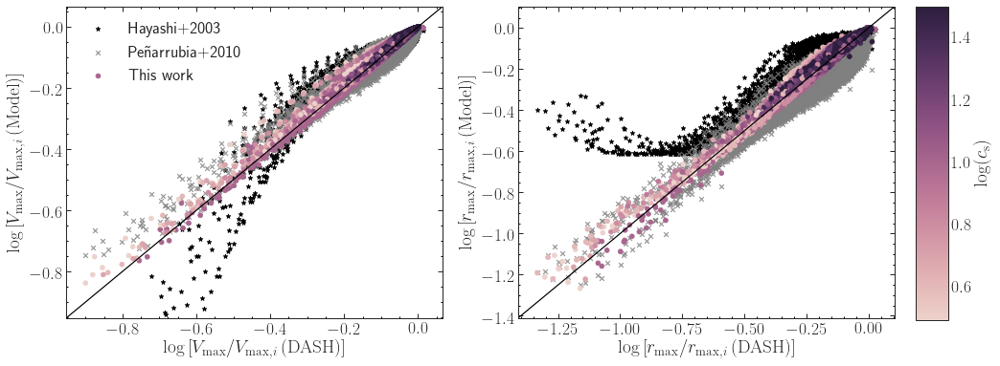

In [71]:
from matplotlib.colors import ListedColormap
my_cmap = ListedColormap(sns.cubehelix_palette(256).as_hex())

msk = np.logical_and(np.logical_and(np.logical_and(max_mat[:,5] != 1,~np.isclose(model_rmax,0.)),max_mat[:,6] != 1),~np.isclose(hayashi_rmax,0.))
msk = np.logical_and(msk, (model_rmax - max_mat[:,6]) / max_mat[:,6] > -0.25)

fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(15.5,6))
ax[0].yaxis.set_ticks_position('both')
ax[0].xaxis.set_ticks_position('both')
#ax[0].loglog()
ax[0].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
ax[1].yaxis.set_ticks_position('both')
ax[1].xaxis.set_ticks_position('both')
#ax[1].loglog()
ax[1].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
ax[0].xaxis.set_minor_locator(MultipleLocator(0.05))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.05))
ax[1].xaxis.set_minor_locator(MultipleLocator(0.05))
ax[1].yaxis.set_minor_locator(MultipleLocator(0.05))
#cs_num = 2
#sc = plt.scatter(max_mat[msk,5][np.where(max_mat[msk,1] ==cs_vals[cs_num])], model_vmax[msk][np.where(max_mat[msk,1] ==cs_vals[cs_num])], c=np.log10(max_mat[msk,1])[np.where(max_mat[msk,1] ==cs_vals[cs_num])], cmap=plt.get_cmap('jet'))
sc1 = ax[0].scatter(np.log10(max_mat[msk,5]), np.log10(hayashi_vmax[msk]), marker='*', color='k', label=r'Hayashi+2003',zorder=-2)
sc2 = ax[0].scatter(np.log10(max_mat[msk,5]), np.log10(g_v_r(max_mat[msk,4], 0.4,0.3)), marker='x', color='gray', label=r'Pe{\~ n}arrubia+2010',zorder=-1,alpha=0.8)
sc3 = ax[0].scatter(np.log10(max_mat[msk,5]), np.log10(model_vmax[msk]), c=np.log10(max_mat[msk,1]), cmap=my_cmap, label=r'This work',zorder=0)
ax[0].set_xlabel(r'$\log\Big[V_\mathrm{max} / V_{\mathrm{max},i} \, (\mathrm{DASH})\Big]$')
ax[0].set_ylabel(r'$\log\Big[V_\mathrm{max} / V_{\mathrm{max},i} \, (\mathrm{Model})\Big]$');
ax[0].legend(frameon=False,loc=2);
ax[0].set_ylim(np.log10(1.5e-1),np.log10(1.1))

leg = ax[0].get_legend()
leg.legendHandles[2].set_color(sns.cubehelix_palette(256)[128])

#ax[0].set_rasterization_zorder(1)
#cbar = plt.colorbar(sc);
#cbar.set_label(r'$\log_{10}(c_s)$');

#fig, ax  = loglogplot()
sc4 = ax[1].scatter(np.log10(max_mat[msk,6]), np.log10(hayashi_rmax[msk]), marker='*', color='k', label=r'Hayashi+2003',zorder=-2)
sc5 = ax[1].scatter(np.log10(max_mat[msk,6]), np.log10(g_v_r(max_mat[msk,4], -0.3,0.4)), marker='x', color='gray', label=r'Pe{\~ n}arrubia+2010',zorder=-1,alpha=0.8)
sc6 = ax[1].scatter(np.log10(max_mat[msk,6]), np.log10(model_rmax[msk]), c=np.log10(max_mat[msk,1]), cmap=my_cmap,zorder=0)
#ax[1].plot([np.min(max_mat[msk,6]),np.max(max_mat[msk,6])],[np.min(max_mat[msk,6]),np.max(max_mat[msk,6])], 'k')
ax[1].set_xlabel(r'$\log\Big[r_\mathrm{max} / r_{\mathrm{max},i} \, (\mathrm{DASH})\Big]$')
ax[1].set_ylabel(r'$\log\Big[r_\mathrm{max} / r_{\mathrm{max},i} \, (\mathrm{Model})\Big]$');
ax[1].set_rasterization_zorder(1)
#cbar = plt.colorbar(sc);
#cbar.set_label(r'$\log_{10}(c_s)$');

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.12, 0.03, 0.76])
fig.colorbar(sc6, cax=cbar_ax, label=r'$\log(c_\mathrm{s})$')

for i in range(0,2):
    lims = [
        np.min([ax[i].get_xlim(), ax[i].get_ylim()]),  # min of both axes
        np.max([ax[i].get_xlim(), ax[i].get_ylim()]),  # max of both axes
    ]
    ax[i].plot(lims, lims, 'k')
    ax[i].set_xlim(lims)
    ax[i].set_ylim(lims)

rasterize_list = [sc1,sc2,sc3,sc4,sc5,sc6]

#plt.savefig(fig_dir / 'vmax_rmax_scatter.eps', bbox_inches='tight', dpi=300)
#rasterize_and_save(fig_dir/'vmax_rmax_scatter.pdf', rasterize_list, dpi=300, savefig_kw=dict(bbox_inches='tight'))
#plot by different colors, use this to figure out what is still lacking...

#in the unweighted version, still doing bad in the low values of c_s...
#how does it look if weighted... still not great.... clearly

#we tend to systematically overpredict the rmax when we do the weighting...

#the scaling in vmax is also bad
#this seems to suggest that we are still not getting the normalization quite right for low c_s
#meaning that the scaling is not doing well enough... need more degrees of freedom?

#the weighting causes us to do really poorly for rmax/rmax0 near unity, because we are weighing that region
#of log(fb) parameter space far more lightly and emphasizing the bottom... perhaps we need to rethink
#how we're doing the weighing

# what is going on with the few of these that are particularly poorly behaved...
# problem also seems to be there in hayashi and penarrubia
# which means that the value of fb has to be larger?

# if we throw these out, it should make no difference... what is the constraint that will do it?
# i would say to mask any where fractional error is < -0.3

# there's nothing wrong with throwing these few out, because we really don't know what the heck is going on but it
# affects only a tiny, tiny number of simulations and doesn't seem to affect bound fractions

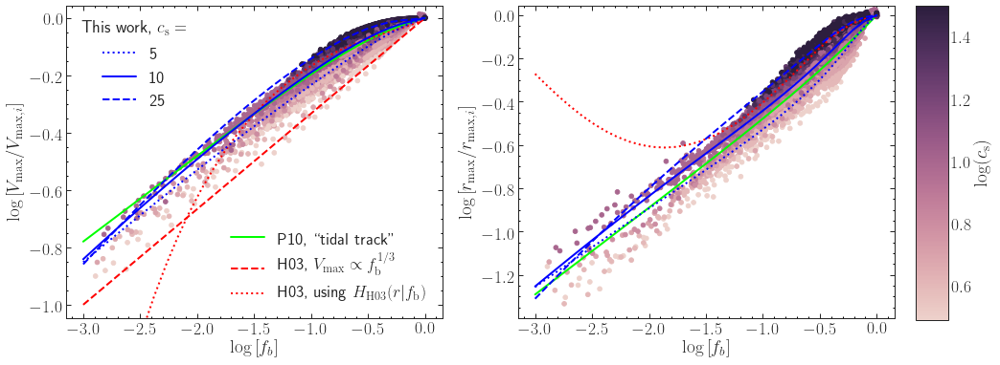

In [72]:
# now, I think we want to make this plot binned by c_s and see how things look for different c_s values
from matplotlib.colors import ListedColormap
my_cmap = ListedColormap(sns.cubehelix_palette(256).as_hex())

msk = max_mat[:,6] < 1.47*max_mat[:,4]**(0.43)

fb_bins = 30
fb_vals = np.logspace(-3, 0, fb_bins)

# need to overplot some bin averages to see what's going on since it looks like Penarrubia does a good job
# then can also overplot the Hayashi model predictions using my other approach
bins = 10
median_vmax = np.zeros(bins); vmax_quants = np.zeros((bins,2))
median_rmax = np.zeros(bins); rmax_quants = np.zeros((bins,2))
n_per_bin = np.zeros(bins)
frac_diff_v = np.zeros(bins); frac_diff_r = np.zeros(bins)
fb_bin_edges = np.logspace(-3,0,bins+1)
fb_bin_centers = 10**((np.log10(fb_bin_edges[1:]) + np.log10(fb_bin_edges[:-1]))*0.5)
for i in range(0,bins):
    sel = np.logical_and(max_mat[:,4] > fb_bin_edges[i], max_mat[:,4] <= fb_bin_edges[i+1])
    sel = np.logical_and(sel, msk)
    n_per_bin[i] = np.sum(sel)
    median_vmax[i] = np.median(max_mat[sel,5])
    median_rmax[i] = np.median(max_mat[sel,6])
    vmax_quants[i,:] = np.percentile(max_mat[sel,5],[16,84])
    rmax_quants[i,:] = np.percentile(max_mat[sel,6],[16,84])
    vmax_quants[i,0] = np.log10(median_vmax[i]) - np.log10(vmax_quants[i,0])
    vmax_quants[i,1] = np.log10(vmax_quants[i,1]) - np.log10(median_vmax[i])
    rmax_quants[i,0] = np.log10(median_rmax[i]) - np.log10(rmax_quants[i,0])
    rmax_quants[i,1] = np.log10(rmax_quants[i,1]) - np.log10(median_rmax[i])
    frac_diff_v[i] = (g_v_r(fb_bin_centers[i], 0.4,0.3) - median_vmax[i])/median_vmax[i]
    frac_diff_r[i] = (g_v_r(fb_bin_centers[i], -0.3,0.4) - median_rmax[i])/median_rmax[i]

# above each, we can put a table with N and the fractional between the penarrubia prediction and the median value

# now, can we figure out a way to overplot the Hayashi predictions via the integration method for 23.1 and 10?
# want to do this for the fb_vals, of which there are 30... we can do this for two concentrations

# returns rmax and vmax as 0,1 column
hay_preds_c10 = np.zeros((fb_bins,2))
hay_preds_c25 = np.zeros((fb_bins,2))
model_preds_c5 = np.zeros((fb_bins,2))
model_preds_c10 = np.zeros((fb_bins,2))
model_preds_c25 = np.zeros((fb_bins,2))
for i in range(0,fb_bins):
    hay_preds_c10[i,:] = hayashi_vm_rm(fb_vals[i], 10, normed=True)
    hay_preds_c25[i,:] = hayashi_vm_rm(fb_vals[i], 25, normed=True)
    model_preds_c5[i,:] = model_vm_rm(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe, fb_vals[i], 5, normed=True)
    model_preds_c10[i,:] = model_vm_rm(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe, fb_vals[i], 10, normed=True)
    model_preds_c25[i,:] = model_vm_rm(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe, fb_vals[i], 25, normed=True)
# there is a problem here... why doesn't it show up when we do the comparison plots?
# why do the Hayashi predictions look fine below fb=10**-2, or do they?

# hayashi_vm_rm(max_mat[i,4], max_mat[i,1], normed)

fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(15.5, 6))
ax[0].yaxis.set_ticks_position('both')
ax[0].xaxis.set_ticks_position('both')
ax[0].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
ax[1].yaxis.set_ticks_position('both')
ax[1].xaxis.set_ticks_position('both')
ax[1].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
ax[0].xaxis.set_minor_locator(MultipleLocator(0.1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.05))
ax[1].xaxis.set_minor_locator(MultipleLocator(0.1))
ax[1].yaxis.set_minor_locator(MultipleLocator(0.05))
#ax[0].loglog(); ax[1].loglog() #might change this to regular space, pending Frank...; also want to rasterize


sc1 = ax[0].scatter(np.log10(max_mat[msk,4]), np.log10(max_mat[msk,5]), c=np.log10(max_mat[msk,1]), cmap=my_cmap)
ax[0].plot(np.log10(fb_vals), np.log10(g_v_r(fb_vals, 0.4,0.3)),'lime', linewidth=2, label=r"P10, ``tidal track''")
ax[0].plot(np.log10(fb_vals), np.log10(fb_vals**(1./3.)),'red',linestyle='dashed',linewidth=2, label=r'H03, $V_\mathrm{max}\propto f_\mathrm{b}^{1/3}$')
#for i in range(0,bins):
#    plt.text(fb_bin_centers[i], 1.3, '%d' % n_per_bin[i])
#    plt.text(fb_bin_centers[i], 1.5, '%.2f' % frac_diff_v[i])
#(_, caps, _) = ax[0].errorbar(np.log10(fb_bin_centers), np.log10(median_vmax), yerr=vmax_quants.T, fmt='.', color = 'blue', markersize=10, linewidth=2, capsize=3, capthick=2, zorder=32)
#for cap in caps:
#    cap.set_color('k')
#    cap.set_markeredgewidth(1)
ax[0].plot(np.log10(fb_vals), np.log10(hay_preds_c25[:,1]), color='red', linewidth=2, linestyle='dotted', label=r'H03, using $H_\mathrm{H03}(r|f_\mathrm{b})$')
lm1, = ax[0].plot(np.log10(fb_vals), np.log10(model_preds_c5[:,1]), color='blue', linewidth=2, linestyle='dotted')
lm2, = ax[0].plot(np.log10(fb_vals), np.log10(model_preds_c10[:,1]), color='blue', linewidth=2, linestyle='solid')
lm3, = ax[0].plot(np.log10(fb_vals), np.log10(model_preds_c25[:,1]), color='blue', linewidth=2, linestyle='dashed')
lines = [lm1, lm2, lm3]
legend1 = fig.legend(lines, [r'5',r'10',r'25'], title=r'This work, $c_\mathrm{s}=$', title_fontsize=18, frameon=False, bbox_to_anchor=(0,1), bbox_transform=ax[0].transAxes, loc=2)
#ax[0].add_artist(legend1)
#plt.plot(fb_vals, hay_preds_c10[:,1])
ax[0].set_xlabel(r'$\log\Big[f_b\Big]$')
ax[0].set_ylabel(r'$\log\Big[V_\mathrm{max} / V_{\mathrm{max},i}\Big]$');
#cbar = plt.colorbar(sc);
#cbar.set_label(r'$c_s$');
ax[0].set_ylim(np.log10(9e-2),np.log10(1.1))
ax[0].legend(frameon=False);

#fig, ax  = loglogplot()
sc2 = ax[1].scatter(np.log10(max_mat[msk,4]), np.log10(max_mat[msk,6]), c=np.log10(max_mat[msk,1]), cmap=my_cmap) #by c_s
ax[1].plot(np.log10(fb_vals), np.log10(g_v_r(fb_vals, -0.3,0.4)),'lime', linewidth=2, label=r'P10, $\gamma=1$')
#(_, caps, _) = ax[1].errorbar(np.log10(fb_bin_centers), np.log10(median_rmax), yerr=rmax_quants.T, fmt='.', color = 'blue', markersize=10, linewidth=2, capsize=3, capthick=2, zorder=32)
#for i in range(0,bins):
#    plt.text(fb_bin_centers[i], 1.3, '%d' % n_per_bin[i])
#    plt.text(fb_bin_centers[i], 1.5, '%.2f' % frac_diff_r[i])
ax[1].plot(np.log10(fb_vals), np.log10(hay_preds_c25[:,0]), color='red', linewidth=2, linestyle='dotted', label=r'H03, using $H_\mathrm{H03}(r|f_\mathrm{b})$')
ax[1].plot(np.log10(fb_vals), np.log10(model_preds_c5[:,0]), color='blue', linewidth=2, linestyle='dotted', label=r'This work, $c_\mathrm{s}=5$')
ax[1].plot(np.log10(fb_vals), np.log10(model_preds_c10[:,0]), color='blue', linewidth=2, linestyle='solid', label=r'This work, $c_\mathrm{s}=10$')
ax[1].plot(np.log10(fb_vals), np.log10(model_preds_c25[:,0]), color='blue', linewidth=2, linestyle='dashed', label=r'This work, $c_\mathrm{s}=25$')
ax[1].set_xlabel(r'$\log\Big[f_b\Big]$')
ax[1].set_ylabel(r'$\log\Big[r_\mathrm{max} / r_{\mathrm{max},i}\Big]$');
#cbar = ax[1].colorbar(sc);
#cbar.set_label(r'$c_s$');
ax[1].set_ylim(np.log10(4e-2),np.log10(1.1))
#ax[1].legend(loc=4,frameon=False);

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.12, 0.03, 0.76])
fig.colorbar(sc2, cax=cbar_ax, label=r'$\log(c_\mathrm{s})$')

#plt.plot(fb_vals,1.45*fb_vals**(0.43)) # add this to the mask

rasterize_list = [sc1,sc2]

#rasterize_and_save(fig_dir/'vmax_rmax_vs_fb.pdf', rasterize_list, dpi=300, savefig_kw=dict(bbox_inches='tight'))


(0, 47)


/home/sbg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:77: RuntimeWarning: divide by zero encountered in log10
/home/sbg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: RuntimeWarning: divide by zero encountered in log10


Text(0.5, 1.0, '$c_\\mathrm{s} = 6.37$')

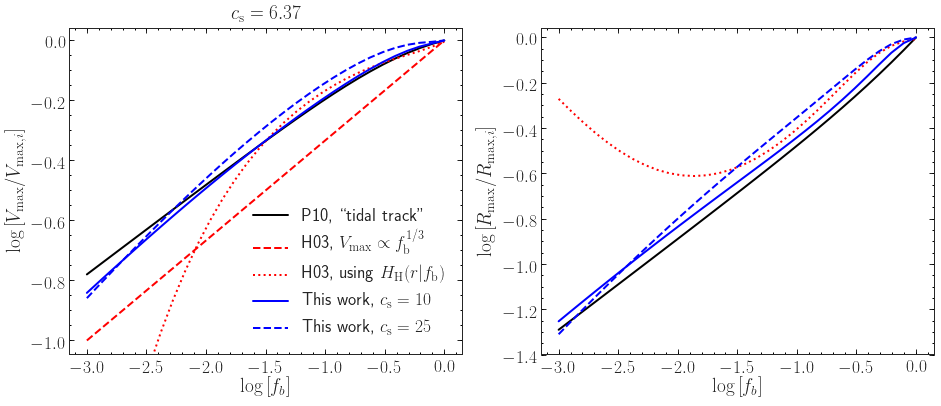

In [538]:
csn = 9
msk = max_mat[:,6] < 1.47*max_mat[:,4]**(0.43)
msk = np.logical_and(msk, max_mat[:,1] == cs_vals[csn])

print(max_mat[msk].shape)

fb_bins = 30
fb_vals = np.logspace(-3, 0, fb_bins)

# need to overplot some bin averages to see what's going on since it looks like Penarrubia does a good job
# then can also overplot the Hayashi model predictions using my other approach
bins = 10
median_vmax = np.zeros(bins); vmax_quants = np.zeros((bins,2))
median_rmax = np.zeros(bins); rmax_quants = np.zeros((bins,2))
n_per_bin = np.zeros(bins)
frac_diff_v = np.zeros(bins); frac_diff_r = np.zeros(bins)
fb_bin_edges = np.logspace(-3,0,bins+1)
fb_bin_centers = 10**((np.log10(fb_bin_edges[1:]) + np.log10(fb_bin_edges[:-1]))*0.5)
for i in range(0,bins):
    sel = np.logical_and(max_mat[:,4] > fb_bin_edges[i], max_mat[:,4] <= fb_bin_edges[i+1])
    sel = np.logical_and(sel, msk)
    n_per_bin[i] = np.sum(sel)
    if(n_per_bin[i] == 0):
        continue
    else:
        median_vmax[i] = np.median(max_mat[sel,5])
        median_rmax[i] = np.median(max_mat[sel,6])
        vmax_quants[i,:] = np.percentile(max_mat[sel,5],[16,84])
        rmax_quants[i,:] = np.percentile(max_mat[sel,6],[16,84])
        vmax_quants[i,0] = np.log10(median_vmax[i]) - np.log10(vmax_quants[i,0])
        vmax_quants[i,1] = np.log10(vmax_quants[i,1]) - np.log10(median_vmax[i])
        rmax_quants[i,0] = np.log10(median_rmax[i]) - np.log10(rmax_quants[i,0])
        rmax_quants[i,1] = np.log10(rmax_quants[i,1]) - np.log10(median_rmax[i])
        frac_diff_v[i] = (g_v_r(fb_bin_centers[i], 0.4,0.3) - median_vmax[i])/median_vmax[i]
        frac_diff_r[i] = (g_v_r(fb_bin_centers[i], -0.3,0.4) - median_rmax[i])/median_rmax[i]

# above each, we can put a table with N and the fractional between the penarrubia prediction and the median value

# now, can we figure out a way to overplot the Hayashi predictions via the integration method for 23.1 and 10?
# want to do this for the fb_vals, of which there are 30... we can do this for two concentrations

# returns rmax and vmax as 0,1 column
hay_preds_c10 = np.zeros((fb_bins,2))
hay_preds_c25 = np.zeros((fb_bins,2))
model_preds_c10 = np.zeros((fb_bins,2))
model_preds_c25 = np.zeros((fb_bins,2))
for i in range(0,fb_bins):
    hay_preds_c10[i,:] = hayashi_vm_rm(fb_vals[i], 10, normed=True)
    hay_preds_c25[i,:] = hayashi_vm_rm(fb_vals[i], 25, normed=True)
    model_preds_c10[i,:] = model_vm_rm(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe, fb_vals[i], 10, normed=True)
    model_preds_c25[i,:] = model_vm_rm(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe, fb_vals[i], 25, normed=True)
# there is a problem here... why doesn't it show up when we do the comparison plots?
# why do the Hayashi predictions look fine below fb=10**-2, or do they?

# hayashi_vm_rm(max_mat[i,4], max_mat[i,1], normed)

fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(15.5, 6))
ax[0].yaxis.set_ticks_position('both')
ax[0].xaxis.set_ticks_position('both')
ax[0].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
ax[1].yaxis.set_ticks_position('both')
ax[1].xaxis.set_ticks_position('both')
ax[1].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
ax[0].xaxis.set_minor_locator(MultipleLocator(0.1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.05))
ax[1].xaxis.set_minor_locator(MultipleLocator(0.1))
ax[1].yaxis.set_minor_locator(MultipleLocator(0.05))
#ax[0].loglog(); ax[1].loglog() #might change this to regular space, pending Frank...; also want to rasterize


sc1 = ax[0].scatter(np.log10(max_mat[msk,4]), np.log10(max_mat[msk,5]))
ax[0].plot(np.log10(fb_vals), np.log10(g_v_r(fb_vals, 0.4,0.3)),'k', linewidth=2, label=r"P10, ``tidal track''")
ax[0].plot(np.log10(fb_vals), np.log10(fb_vals**(1./3.)),'red',linestyle='dashed',linewidth=2, label=r'H03, $V_\mathrm{max}\propto f_\mathrm{b}^{1/3}$')
#for i in range(0,bins):
#    plt.text(fb_bin_centers[i], 1.3, '%d' % n_per_bin[i])
#    plt.text(fb_bin_centers[i], 1.5, '%.2f' % frac_diff_v[i])
(_, caps, _) = ax[0].errorbar(np.log10(fb_bin_centers), np.log10(median_vmax), yerr=vmax_quants.T, fmt='.', color = 'blue', markersize=10, linewidth=2, capsize=3, capthick=2, zorder=32)
for cap in caps:
    cap.set_color('k')
    cap.set_markeredgewidth(1)
ax[0].plot(np.log10(fb_vals), np.log10(hay_preds_c25[:,1]), color='red', linewidth=2, linestyle='dotted', label=r'H03, using $H_\mathrm{H}(r|f_\mathrm{b})$')
ax[0].plot(np.log10(fb_vals), np.log10(model_preds_c10[:,1]), color='blue', linewidth=2, linestyle='solid', label=r'This work, $c_\mathrm{s}=10$')
ax[0].plot(np.log10(fb_vals), np.log10(model_preds_c25[:,1]), color='blue', linewidth=2, linestyle='dashed', label=r'This work, $c_\mathrm{s}=25$')
#plt.plot(fb_vals, hay_preds_c10[:,1])
ax[0].set_xlabel(r'$\log\Big[f_b\Big]$')
ax[0].set_ylabel(r'$\log\Big[V_\mathrm{max} / V_{\mathrm{max},i}\Big]$');
#cbar = plt.colorbar(sc);
#cbar.set_label(r'$c_s$');
ax[0].set_ylim(np.log10(9e-2),np.log10(1.1))
ax[0].legend(frameon=False);

#fig, ax  = loglogplot()
sc2 = ax[1].scatter(np.log10(max_mat[msk,4]), np.log10(max_mat[msk,6])) #by c_s
ax[1].plot(np.log10(fb_vals), np.log10(g_v_r(fb_vals, -0.3,0.4)),'k', linewidth=2, label=r'P10, $\gamma=1$')
(_, caps, _) = ax[1].errorbar(np.log10(fb_bin_centers), np.log10(median_rmax), yerr=rmax_quants.T, fmt='.', color = 'blue', markersize=10, linewidth=2, capsize=3, capthick=2, zorder=32)
#for i in range(0,bins):
#    plt.text(fb_bin_centers[i], 1.3, '%d' % n_per_bin[i])
#    plt.text(fb_bin_centers[i], 1.5, '%.2f' % frac_diff_r[i])
ax[1].plot(np.log10(fb_vals), np.log10(hay_preds_c25[:,0]), color='red', linewidth=2, linestyle='dotted', label=r'H03, using $H_\mathrm{H}(r|f_\mathrm{b})$')
ax[1].plot(np.log10(fb_vals), np.log10(model_preds_c10[:,0]), color='blue', linewidth=2, linestyle='solid', label=r'This work, $c_\mathrm{s}=10$')
ax[1].plot(np.log10(fb_vals), np.log10(model_preds_c25[:,0]), color='blue', linewidth=2, linestyle='dashed', label=r'This work, $c_\mathrm{s}=25$')
ax[1].set_xlabel(r'$\log\Big[f_b\Big]$')
ax[1].set_ylabel(r'$\log\Big[r_\mathrm{max} / r_{\mathrm{max},i}\Big]$');
#cbar = ax[1].colorbar(sc);
#cbar.set_label(r'$c_s$');
ax[1].set_ylim(np.log10(4e-2),np.log10(1.1))
#ax[1].legend(loc=4,frameon=False);

ax[0].set_title(r'$c_\mathrm{s} = %.2f$' % cs_vals[csn])

### Fitting Functions for Vmax and Rmax

In [633]:
# we'll use the same parametrization as Penarrubia but with c_s dependence added
#def vr_fit_func(fb_cs,*p):
#    mu = p[0] * fb_cs[:,1] + p[1]
#    eta = p[2] * fb_cs[:,1] + p[3]
#    return 2**mu * fb_cs[:,0]**eta / (1+fb_cs[:,0])**mu

def vr_fit_func(fb_logcs,*p):
    mu = p[0] * fb_logcs[:,1] + p[1]
    eta = p[2] * fb_logcs[:,1] + p[3]
    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu


# no extra luck with this formula
#def vr_fit_func_2(fb_logcs,*p):
#    mu = p[0] * fb_logcs[:,1] + p[1]  * np.log10(fb_logcs[:,0]) + p[2]
#    eta = p[3] * fb_logcs[:,1] + p[4] * np.log10(fb_logcs[:,0]) + p[5]
#    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu

def vr_fit_func_2(fb_logcs,*p):
    mu = 10**(p[0] + p[1] * (10**fb_logcs[:,1] / 10.)**p[2] * np.log10(fb_logcs[:,0]) + p[3] * (1. - fb_logcs[:,0])**p[4] * fb_logcs[:,1])
    eta =10**(p[5] + p[6] * (10**fb_logcs[:,1] / 10.)**p[7] * np.log10(fb_logcs[:,0]) + p[8] * (1. - fb_logcs[:,0])**p[9] * fb_logcs[:,1])
    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu

#def vr_fit_func_2(fb_logcs,*p):
#    mu = 10**(p[0] + p[1] * (10**fb_logcs[:,1] / 10.)**p[2] * np.log10(fb_logcs[:,0]))
#    eta =10**(p[3] + p[4] * (10**fb_logcs[:,1] / 10.)**p[5] * np.log10(fb_logcs[:,0]))
#    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu

#def vr_fit_func_2(fb_logcs,*p):
#    mu = 10**(p[0] + p[1] * (1. - fb_logcs[:,0])**p[2] * fb_logcs[:,1])
#    eta =10**(p[3] + p[4] * (1. - fb_logcs[:,0])**p[5] * fb_logcs[:,1])
#    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu


# so mu and eta are going to have to be written as function of c_s?
# let's do this fit...
# doesn't have to be perfect, so we'll just use the apocenter data with the bad points masked
# TODO: once we have this plot, let's compare it to the model that you get from integrating directly my TF to see
# how similar they are, and then also how similar it is to the median in each bin for the actual data

#TODO: try with and without logging cs...

# the cost function is going to be 

# dataset is max_mat[msk,5] and max_mat[msk,6] seperately
# dependent parameters are max_mat[msk,1] (c_s) and max_mat[msk,4] (f_b)

# throw out bad ones:
msk = max_mat[:,6] < 1.47*max_mat[:,4]**(0.43)

fb_logcs = np.column_stack((max_mat[msk,4],np.log10(max_mat[msk,1]))) #fb, logcs
fb_cs = np.column_stack((max_mat[msk,4],max_mat[msk,1])) #fb, cs

# for vmax (max_mat[msk,5])
#vm_parm, vm_cv = curve_fit(vr_fit_func, fb_cs, max_mat[msk,5], p0=[0., 0.4, 0., 0.3])
#vm_parm, vm_cv = curve_fit(vr_fit_func, fb_logcs, max_mat[msk,5], p0=[0., 0.4, 0., 0.3])
#vm_parm, vm_cv = curve_fit(vr_fit_func_2, fb_logcs, max_mat[msk,5], p0=[0., 0., 0.4, 0., 0., 0.3])
vm_parm, vm_cv = curve_fit(vr_fit_func_2, fb_logcs, max_mat[msk,5], p0=[0.4, 0., 0., 0., 0.1, 0.3, 0., 0., 0., 0.1], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,0,-np.inf,-np.inf,-np.inf,-np.inf,0],np.inf), maxfev=10000)
# for rmax (max_mat[msk,6])
#rm_parm, rm_cv = curve_fit(vr_fit_func, fb_cs, max_mat[msk,6], p0=[0., -0.3, 0., 0.4])
#rm_parm, rm_cv = curve_fit(vr_fit_func, fb_logcs, max_mat[msk,6], p0=[0., -0.3, 0., 0.4])
#rm_parm, rm_cv = curve_fit(vr_fit_func_2, fb_logcs, max_mat[msk,6], p0=[0., 0., -0.3, 0., 0., 0.4])
rm_parm, rm_cv = curve_fit(vr_fit_func_2, fb_logcs, max_mat[msk,6], p0=[-0.3, 0., 0., 0., 0.1, 0.4, 0., 0., 0., 0.1], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,0,-np.inf,-np.inf,-np.inf,-np.inf,0],np.inf), maxfev=10000)

In [635]:
vm_parm, vm_cv = curve_fit(vr_fit_func_final, fb_logcs, max_mat[msk,5], p0=[0.4, 0., 0., 0., 0., 0.3, 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=100000)
rm_parm, rm_cv = curve_fit(vr_fit_func_final, fb_logcs, max_mat[msk,6], p0=[-0.3, 0., 0., 0., 0., 0.4, 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=100000)


/home/sbg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in power
  after removing the cwd from sys.path.
/home/sbg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in multiply
  after removing the cwd from sys.path.


In [800]:
# calibrate the fitting function against the model instead... we just need data points spaced uniformly in
# f_b and c_s and we can see how well it does with various simplified models
# generate vmax, rmax from a matrix of f_b and c_s
n_fb = 80
n_cs = 50
fb_vals = np.logspace(-3.5,0,n_fb)
logcs_vals = np.log10(np.logspace(np.log10(cs_vals[0]),np.log10(cs_vals[-1]),n_cs))
fb_logcs = np.zeros((n_fb*n_cs,2))
for i in range(0,n_fb):
    for j in range(0,n_cs):
        fb_logcs[i*n_cs + j,0] = fb_vals[i]
        fb_logcs[i*n_cs + j,1] = logcs_vals[j]
# now we have our values, we need to get the rmax, vmax predictions from the model

train_vmax = np.zeros(len(fb_logcs))
train_rmax = np.zeros(len(fb_logcs))
for i in prange(0,len(fb_logcs)):
    if i % 100 == 0:
        print(i)
    train_rmax[i], train_vmax[i] = model_vm_rm(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe, fb_logcs[i,0], 10**fb_logcs[i,1], normed=True)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900


In [591]:
def vr_fit_func_2(fb_logcs,*p):
    mu = 10**(p[0] + p[1] * (10**fb_logcs[:,1] / 10.)**p[2] * np.log10(fb_logcs[:,0]) + p[3] * (1. - fb_logcs[:,0])**p[4] * fb_logcs[:,1])
    eta =10**(p[5] + p[6] * (10**fb_logcs[:,1] / 10.)**p[7] * np.log10(fb_logcs[:,0]) + p[8] * (1. - fb_logcs[:,0])**p[9] * fb_logcs[:,1])
    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu

vm_parm, vm_cv = curve_fit(vr_fit_func_2, fb_logcs, train_vmax, p0=[0.4, 0., 0., 0., 0.1, 0.3, 0., 0., 0., 0.1], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,0,-np.inf,-np.inf,-np.inf,-np.inf,0],np.inf), maxfev=10000)
rm_parm, rm_cv = curve_fit(vr_fit_func_2, fb_logcs, train_rmax, p0=[-0.3, 0., 0., 0., 0.1, 0.4, 0., 0., 0., 0.1], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,0,-np.inf,-np.inf,-np.inf,-np.inf,0],np.inf), maxfev=10000)

In [593]:
def vr_fit_func_2(fb_logcs,*p):
    mu = 10**(p[0] + p[1] * (10**fb_logcs[:,1] / 10.)**p[2] * np.log10(fb_logcs[:,0]) + p[3] * fb_logcs[:,1])
    eta =10**(p[4] + p[5] * (10**fb_logcs[:,1] / 10.)**p[6] * np.log10(fb_logcs[:,0]) + p[7] * fb_logcs[:,1])
    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu

vm_parm, vm_cv = curve_fit(vr_fit_func_2, fb_logcs, train_vmax, p0=[np.log10(0.4), 0., 0., 0., np.log10(0.3), 0., 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=10000)
rm_parm, rm_cv = curve_fit(vr_fit_func_2, fb_logcs, train_rmax, p0=[np.log10(-0.3), 0., 0., 0., 0.4, 0., 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=10000)
#(array([-0.51541479, -0.10630722, -0.48050411,  0.20002843, -0.31366382,
        #-0.01835329,  0.85172686, -0.16130459]),
# for vm

/home/sbg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in power
  after removing the cwd from sys.path.
/home/sbg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in multiply
  after removing the cwd from sys.path.
/home/sbg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


In [599]:
def vr_fit_func_2(fb_logcs,*p):
    mu = p[0] * 10**(p[1] * (10**fb_logcs[:,1] / 10.)**p[2] * np.log10(fb_logcs[:,0]) + p[3] * fb_logcs[:,1])
    eta =p[4] * 10**(p[5] * (10**fb_logcs[:,1] / 10.)**p[6] * np.log10(fb_logcs[:,0]) + p[7] * fb_logcs[:,1])
    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu

vm_parm, vm_cv = curve_fit(vr_fit_func_2, fb_logcs, train_vmax, p0=[0.4, 0., 0., 0., 0.3, 0., 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=10000)
rm_parm, rm_cv = curve_fit(vr_fit_func_2, fb_logcs, train_rmax, p0=[-0.3, 0., 0., 0., 0.4, 0., 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=10000)


/home/sbg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


In [605]:
def vr_fit_func_2(fb_logcs,*p):
    mu = p[0] + p[1] * (10**fb_logcs[:,1] / 10.)**p[2] * np.log10(fb_logcs[:,0]) + p[3] * (10**fb_logcs[:,1])**p[4]
    eta =p[5] + p[6] * (10**fb_logcs[:,1] / 10.)**p[7] * np.log10(fb_logcs[:,0]) + p[8] * (10**fb_logcs[:,1])**p[9]
    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu

vm_parm, vm_cv = curve_fit(vr_fit_func_2, fb_logcs, train_vmax, p0=[0.4, 0., 0., 0., 0., 0.3, 0., 0., 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=100000)
rm_parm, rm_cv = curve_fit(vr_fit_func_2, fb_logcs, train_rmax, p0=[-0.3, 0., 0., 0., 0., 0.4, 0., 0., 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=100000)


In [625]:
def vr_fit_func_2(fb_logcs,*p):
    mu = p[0] + p[1] * (10**fb_logcs[:,1])**p[2]
    eta =p[3] + p[4] * (10**fb_logcs[:,1])**p[5] * np.log10(fb_logcs[:,0]) #+ p[8] * (10**fb_logcs[:,1])**p[9]
    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu

vm_parm, vm_cv = curve_fit(vr_fit_func_2, fb_logcs, train_vmax, p0=[0.4, 0., 0., 0.3, 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=100000)
rm_parm, rm_cv = curve_fit(vr_fit_func_2, fb_logcs, train_rmax, p0=[-0.3, 0., 0., 0.4, 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=100000)


In [628]:
def vr_fit_func_2(fb_logcs,*p):
    mu = p[0] + p[1] * np.log10(fb_logcs[:,0]) + p[2] * (10**fb_logcs[:,1])**p[3]
    eta =p[4] + p[5] * (10**fb_logcs[:,1])**p[6] * np.log10(fb_logcs[:,0]) #+ p[8] * (10**fb_logcs[:,1])**p[9]
    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu

vm_parm, vm_cv = curve_fit(vr_fit_func_2, fb_logcs, train_vmax, p0=[0.4, 0., 0., 0., 0.3, 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=100000)
rm_parm, rm_cv = curve_fit(vr_fit_func_2, fb_logcs, train_rmax, p0=[-0.3, 0., 0., 0., 0.4, 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=100000)


In [801]:
def vr_fit_func_final(fb_logcs,*p):
    mu = p[0] + p[1] * (10**fb_logcs[:,1])**p[2] * np.log10(fb_logcs[:,0]) + p[3] * (10**fb_logcs[:,1])**p[4]
    eta =p[5] + p[6] * (10**fb_logcs[:,1])**p[7] * np.log10(fb_logcs[:,0]) #+ p[8] * (10**fb_logcs[:,1])**p[9]
    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu

vm_parm, vm_cv = curve_fit(vr_fit_func_final, fb_logcs, train_vmax, p0=[0.4, 0., 0., 0., 0., 0.3, 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=100000)
rm_parm, rm_cv = curve_fit(vr_fit_func_final, fb_logcs, train_rmax, p0=[-0.3, 0., 0., 0., 0., 0.4, 0., 0.], bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf,-np.inf],np.inf), maxfev=100000)


In [802]:
vm_parm, rm_parm

(array([ 2.97965015,  0.31032605, -0.22258215, -3.30779007, -0.07911846,
         0.17627415, -0.00821831,  0.45242989]),
 array([ 1.02117857,  1.46283788,  0.09912662, -4.64300584, -0.24985742,
        -0.52477636, -0.06452431,  0.08334596]))

In [647]:
vm_parm, rm_parm

(array([ 2.97954476,  0.31032744, -0.22257701, -3.30768962, -0.07912148,
         0.17627256, -0.00821844,  0.45242595]),
 array([ 1.0211789 ,  1.46283784,  0.09912661, -4.64300604, -0.24985739,
        -0.52477632, -0.0645243 ,  0.08334598]))

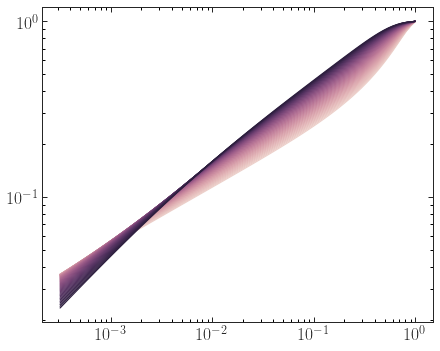

In [585]:
# let's see if we can identify a trend in the rmax
cols = sns.cubehelix_palette(n_cs)
loglogplot()
for i in range(0,n_cs):
    plt.plot(fb_vals,train_rmax[i::n_cs], color=cols[i])

In [504]:
vm_parm

array([-5.12697856e-01,  1.25535023e-01,  1.45881210e-14, -3.20087072e-01,
       -2.06743165e-01,  1.64329993e-16])

In [575]:
np.min(train_rmax)

0.02329394795423201

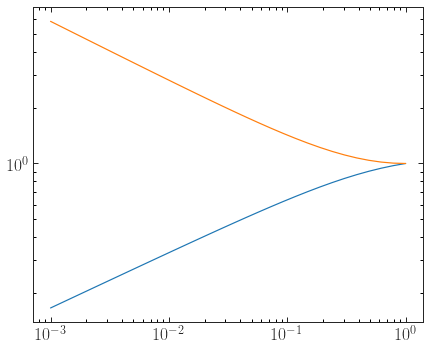

In [505]:
def vr_fit_func(fb_logcs,p):
    mu = p[0] * fb_logcs[:,1] + p[1]
    eta = p[2] * fb_logcs[:,1] + p[3]
    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu

fb_bins = 30
fb_vals = np.logspace(-3, 0, fb_bins)
csn = 10

test_parm = [0., 0.4, 0., 0.3]

loglogplot()
plt.plot(fb_vals, vr_fit_func(np.column_stack((fb_vals,np.repeat(np.log10(cs_vals[csn]),fb_bins))), test_parm))
plt.plot(fb_vals, vr_fit_func(np.column_stack((fb_vals,np.repeat(np.log10(cs_vals[csn]),fb_bins))), vm_parm))

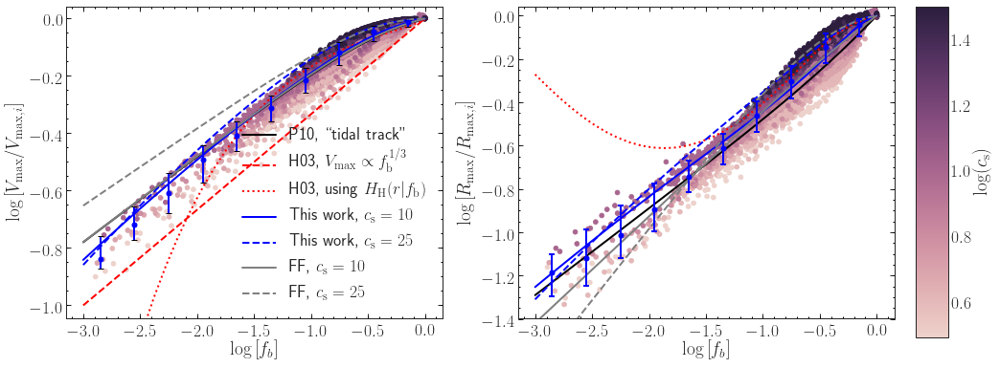

In [466]:
# now we can look at how well our fitting function performs

msk = max_mat[:,6] < 1.47*max_mat[:,4]**(0.43)

fb_bins = 30
fb_vals = np.logspace(-3, 0, fb_bins)

# need to overplot some bin averages to see what's going on since it looks like Penarrubia does a good job
# then can also overplot the Hayashi model predictions using my other approach
bins = 10
median_vmax = np.zeros(bins); vmax_quants = np.zeros((bins,2))
median_rmax = np.zeros(bins); rmax_quants = np.zeros((bins,2))
n_per_bin = np.zeros(bins)
frac_diff_v = np.zeros(bins); frac_diff_r = np.zeros(bins)
fb_bin_edges = np.logspace(-3,0,bins+1)
fb_bin_centers = 10**((np.log10(fb_bin_edges[1:]) + np.log10(fb_bin_edges[:-1]))*0.5)
for i in range(0,bins):
    sel = np.logical_and(max_mat[:,4] > fb_bin_edges[i], max_mat[:,4] <= fb_bin_edges[i+1])
    sel = np.logical_and(sel, msk)
    n_per_bin[i] = np.sum(sel)
    median_vmax[i] = np.median(max_mat[sel,5])
    median_rmax[i] = np.median(max_mat[sel,6])
    vmax_quants[i,:] = np.percentile(max_mat[sel,5],[16,84])
    rmax_quants[i,:] = np.percentile(max_mat[sel,6],[16,84])
    vmax_quants[i,0] = np.log10(median_vmax[i]) - np.log10(vmax_quants[i,0])
    vmax_quants[i,1] = np.log10(vmax_quants[i,1]) - np.log10(median_vmax[i])
    rmax_quants[i,0] = np.log10(median_rmax[i]) - np.log10(rmax_quants[i,0])
    rmax_quants[i,1] = np.log10(rmax_quants[i,1]) - np.log10(median_rmax[i])
    frac_diff_v[i] = (g_v_r(fb_bin_centers[i], 0.4,0.3) - median_vmax[i])/median_vmax[i]
    frac_diff_r[i] = (g_v_r(fb_bin_centers[i], -0.3,0.4) - median_rmax[i])/median_rmax[i]

# above each, we can put a table with N and the fractional between the penarrubia prediction and the median value

# now, can we figure out a way to overplot the Hayashi predictions via the integration method for 23.1 and 10?
# want to do this for the fb_vals, of which there are 30... we can do this for two concentrations

# returns rmax and vmax as 0,1 column
hay_preds_c10 = np.zeros((fb_bins,2))
hay_preds_c25 = np.zeros((fb_bins,2))
model_preds_c10 = np.zeros((fb_bins,2))
model_preds_c25 = np.zeros((fb_bins,2))
for i in range(0,fb_bins):
    hay_preds_c10[i,:] = hayashi_vm_rm(fb_vals[i], 10, normed=True)
    hay_preds_c25[i,:] = hayashi_vm_rm(fb_vals[i], 25, normed=True)
    model_preds_c10[i,:] = model_vm_rm(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe, fb_vals[i], 10, normed=True)
    model_preds_c25[i,:] = model_vm_rm(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe, fb_vals[i], 25, normed=True)
# there is a problem here... why doesn't it show up when we do the comparison plots?
# why do the Hayashi predictions look fine below fb=10**-2, or do they?

# hayashi_vm_rm(max_mat[i,4], max_mat[i,1], normed)

fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(15.5, 6))
ax[0].yaxis.set_ticks_position('both')
ax[0].xaxis.set_ticks_position('both')
ax[0].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
ax[1].yaxis.set_ticks_position('both')
ax[1].xaxis.set_ticks_position('both')
ax[1].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
ax[0].xaxis.set_minor_locator(MultipleLocator(0.1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.05))
ax[1].xaxis.set_minor_locator(MultipleLocator(0.1))
ax[1].yaxis.set_minor_locator(MultipleLocator(0.05))
#ax[0].loglog(); ax[1].loglog() #might change this to regular space, pending Frank...; also want to rasterize


sc1 = ax[0].scatter(np.log10(max_mat[msk,4]), np.log10(max_mat[msk,5]), c=np.log10(max_mat[msk,1]), cmap=my_cmap)
ax[0].plot(np.log10(fb_vals), np.log10(g_v_r(fb_vals, 0.4,0.3)),'k', linewidth=2, label=r"P10, ``tidal track''")
ax[0].plot(np.log10(fb_vals), np.log10(fb_vals**(1./3.)),'red',linestyle='dashed',linewidth=2, label=r'H03, $V_\mathrm{max}\propto f_\mathrm{b}^{1/3}$')
#for i in range(0,bins):
#    plt.text(fb_bin_centers[i], 1.3, '%d' % n_per_bin[i])
#    plt.text(fb_bin_centers[i], 1.5, '%.2f' % frac_diff_v[i])
(_, caps, _) = ax[0].errorbar(np.log10(fb_bin_centers), np.log10(median_vmax), yerr=vmax_quants.T, fmt='.', color = 'blue', markersize=10, linewidth=2, capsize=3, capthick=2, zorder=32)
for cap in caps:
    cap.set_color('k')
    cap.set_markeredgewidth(1)
ax[0].plot(np.log10(fb_vals), np.log10(hay_preds_c25[:,1]), color='red', linewidth=2, linestyle='dotted', label=r'H03, using $H_\mathrm{H}(r|f_\mathrm{b})$')
ax[0].plot(np.log10(fb_vals), np.log10(model_preds_c10[:,1]), color='blue', linewidth=2, linestyle='solid', label=r'This work, $c_\mathrm{s}=10$')
ax[0].plot(np.log10(fb_vals), np.log10(model_preds_c25[:,1]), color='blue', linewidth=2, linestyle='dashed', label=r'This work, $c_\mathrm{s}=25$')
#plt.plot(fb_vals, hay_preds_c10[:,1])
#plt.plot(fb_vals, hay_preds_c10[:,1])
ax[0].set_xlabel(r'$\log\Big[f_b\Big]$')
ax[0].set_ylabel(r'$\log\Big[V_\mathrm{max} / V_{\mathrm{max},i}\Big]$');
#cbar = plt.colorbar(sc);
#cbar.set_label(r'$c_s$');
ax[0].set_ylim(np.log10(9e-2),np.log10(1.1))


#fig, ax  = loglogplot()
sc2 = ax[1].scatter(np.log10(max_mat[msk,4]), np.log10(max_mat[msk,6]), c=np.log10(max_mat[msk,1]), cmap=my_cmap) #by c_s
ax[1].plot(np.log10(fb_vals), np.log10(g_v_r(fb_vals, -0.3,0.4)),'k', linewidth=2, label=r'P10, $\gamma=1$')
(_, caps, _) = ax[1].errorbar(np.log10(fb_bin_centers), np.log10(median_rmax), yerr=rmax_quants.T, fmt='.', color = 'blue', markersize=10, linewidth=2, capsize=3, capthick=2, zorder=32)
#for i in range(0,bins):
#    plt.text(fb_bin_centers[i], 1.3, '%d' % n_per_bin[i])
#    plt.text(fb_bin_centers[i], 1.5, '%.2f' % frac_diff_r[i])
ax[1].plot(np.log10(fb_vals), np.log10(hay_preds_c25[:,0]), color='red', linewidth=2, linestyle='dotted', label=r'H03, using $H_\mathrm{H}(r|f_\mathrm{b})$')
ax[1].plot(np.log10(fb_vals), np.log10(model_preds_c10[:,0]), color='blue', linewidth=2, linestyle='solid', label=r'This work, $c_\mathrm{s}=10$')
ax[1].plot(np.log10(fb_vals), np.log10(model_preds_c25[:,0]), color='blue', linewidth=2, linestyle='dashed', label=r'This work, $c_\mathrm{s}=25$')
ax[1].set_xlabel(r'$\log\Big[f_b\Big]$')
ax[1].set_ylabel(r'$\log\Big[r_\mathrm{max} / r_{\mathrm{max},i}\Big]$');
#cbar = ax[1].colorbar(sc);
#cbar.set_label(r'$c_s$');
ax[1].set_ylim(np.log10(4e-2),np.log10(1.1))
#ax[1].legend(loc=4,frameon=False);

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.12, 0.03, 0.8])
fig.colorbar(sc2, cax=cbar_ax, label=r'$\log(c_\mathrm{s})$')

def vr_fit_func(fb_logcs,p):
    mu = p[0] * fb_logcs[:,1] + p[1]
    eta = p[2] * fb_logcs[:,1] + p[3]
    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu

#def vr_fit_func(fb_cs,p):
#    mu = p[0] * fb_cs[:,1] + p[1]
#    eta = p[2] * fb_cs[:,1] + p[3]
#    return 2**mu * fb_cs[:,0]**eta / (1+fb_cs[:,0])**mu
#ax[0].plot(np.log10(fb_vals), np.log10(vr_fit_func(np.column_stack((fb_vals,np.repeat(10.,fb_bins))),vm_parm)), color='gray', linewidth=2, linestyle='solid', label=r'FF, $c_\mathrm{s}=10$')
#ax[0].plot(np.log10(fb_vals), np.log10(vr_fit_func(np.column_stack((fb_vals,np.repeat(25.,fb_bins))),vm_parm)), color='gray', linewidth=2, linestyle='dashed', label=r'FF, $c_\mathrm{s}=25$')
#ax[1].plot(np.log10(fb_vals), np.log10(vr_fit_func(np.column_stack((fb_vals,np.repeat(10.,fb_bins))),rm_parm)), color='gray', linewidth=2, linestyle='solid', label=r'FF, $c_\mathrm{s}=10$')
#ax[1].plot(np.log10(fb_vals), np.log10(vr_fit_func(np.column_stack((fb_vals,np.repeat(25.,fb_bins))),rm_parm)), color='gray', linewidth=2, linestyle='dashed', label=r'FF, $c_\mathrm{s}=25$')
ax[0].plot(np.log10(fb_vals), np.log10(vr_fit_func(np.column_stack((fb_vals,np.repeat(np.log10(10.),fb_bins))),vm_parm)), color='gray', linewidth=2, linestyle='solid', label=r'FF, $c_\mathrm{s}=10$')
ax[0].plot(np.log10(fb_vals), np.log10(vr_fit_func(np.column_stack((fb_vals,np.repeat(np.log10(25.),fb_bins))),vm_parm)), color='gray', linewidth=2, linestyle='dashed', label=r'FF, $c_\mathrm{s}=25$')
ax[1].plot(np.log10(fb_vals), np.log10(vr_fit_func(np.column_stack((fb_vals,np.repeat(np.log10(10.),fb_bins))),rm_parm)), color='gray', linewidth=2, linestyle='solid', label=r'FF, $c_\mathrm{s}=10$')
ax[1].plot(np.log10(fb_vals), np.log10(vr_fit_func(np.column_stack((fb_vals,np.repeat(np.log10(25.),fb_bins))),rm_parm)), color='gray', linewidth=2, linestyle='dashed', label=r'FF, $c_\mathrm{s}=25$')
ax[0].legend(frameon=False);

In [640]:
print(vm_parm,rm_parm)

[ 2.97954476  0.31032744 -0.22257701 -3.30768962 -0.07912148  0.17627256
 -0.00821844  0.45242595] [ 1.0211789   1.46283784  0.09912661 -4.64300604 -0.24985739 -0.52477632
 -0.0645243   0.08334598]


0.03265559394831271 0.1267127333788437
0.010708152183015084 0.13305015568162065
0.01927741151443458 0.10159651008033163


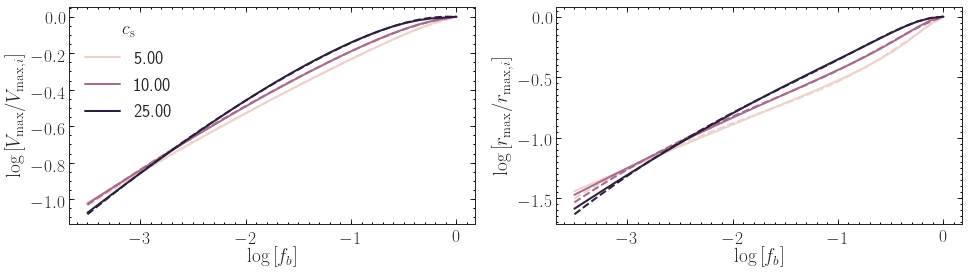

In [803]:
def vr_fit_func_final(fb_logcs,p):
    mu = p[0] + p[1] * (10**fb_logcs[:,1])**p[2] * np.log10(fb_logcs[:,0]) + p[3] * (10**fb_logcs[:,1])**p[4]
    eta =p[5] + p[6] * (10**fb_logcs[:,1])**p[7] * np.log10(fb_logcs[:,0])
    return 2**mu * fb_logcs[:,0]**eta / (1+fb_logcs[:,0])**mu

fb_bins = 30
fb_vals = np.logspace(-3.5, 0, fb_bins)

# TODO: still need to find some way to actually incorporate in the f_b dependence so that the slope changes
# This should be a simple modification without overdoing it

# now a figure that just compares our model to the fitting function to demonstrate how well it does
fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(16,4))
ax[0].yaxis.set_ticks_position('both')
ax[0].xaxis.set_ticks_position('both')
ax[0].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
ax[1].yaxis.set_ticks_position('both')
ax[1].xaxis.set_ticks_position('both')
ax[1].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
ax[0].xaxis.set_minor_locator(MultipleLocator(0.1))
ax[0].yaxis.set_minor_locator(MultipleLocator(0.05))
ax[1].xaxis.set_minor_locator(MultipleLocator(0.1))
ax[1].yaxis.set_minor_locator(MultipleLocator(0.05))

ax[0].set_xlabel(r'$\log\Big[f_b\Big]$')
ax[0].set_ylabel(r'$\log\Big[V_\mathrm{max} / V_{\mathrm{max},i}\Big]$');
ax[1].set_xlabel(r'$\log\Big[f_b\Big]$')
ax[1].set_ylabel(r'$\log\Big[r_\mathrm{max} / r_{\mathrm{max},i}\Big]$');

csn_ns = [2, 5, 9]
cols = sns.cubehelix_palette(len(csn_ns))

model_preds = np.zeros((fb_bins,2))



for coln,csn in enumerate(csn_ns):
    fitting_vm = vr_fit_func_final(np.column_stack((fb_vals,np.repeat(np.log10(cs_vals[csn]),fb_bins))),vm_parm)
    fitting_rm = vr_fit_func_final(np.column_stack((fb_vals,np.repeat(np.log10(cs_vals[csn]),fb_bins))),rm_parm)
    ax[0].plot(np.log10(fb_vals), np.log10(fitting_vm), color=cols[coln], linewidth=2, linestyle='dashed')
    ax[1].plot(np.log10(fb_vals), np.log10(fitting_rm), color=cols[coln], linewidth=2, linestyle='dashed')
    for i in range(0,fb_bins):
        model_preds[i,:] = model_vm_rm(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe, fb_vals[i], cs_vals[csn], normed=True)
    ax[0].plot(np.log10(fb_vals), np.log10(model_preds[:,1]), color=cols[coln], linewidth=2, linestyle='solid', label=r'%.2f' % cs_vals[csn])
    ax[1].plot(np.log10(fb_vals), np.log10(model_preds[:,0]), color=cols[coln], linewidth=2, linestyle='solid')
    res_vm = np.max(np.abs((model_preds[:,1] - fitting_vm) / model_preds[:,1]))
    res_rm = np.max(np.abs((model_preds[:,0] - fitting_rm) / model_preds[:,0]))
    print(res_vm,res_rm)

ax[0].legend(title=r'$c_\mathrm{s}$', frameon=False, title_fontsize=18)
#ax[0].set_title('Solid = from transfer function, Dashed = from fitting function for Vmax/Rmax')
#plt.savefig(fig_dir/'vm_rm_fitting_func.eps', bbox_inches='tight')

## Fitting each profile separately, looking at f_t, r_t distributions

In [46]:
# we start with data loaded in only at apocenter
# less preprocessing here: only need to select the particular radii we want to use

#throw out nans, infs, etc. as needed... zeros are ok
print(dat_matrix.shape)
#dat matrix contains ch, cs, xc, eta, fb, radial pts
innermost_radial_pt = 10
radial_pts =  30 - innermost_radial_pt #not keeping the outer radii
cols_needed = np.append(np.array([0,1,2,3,4]),np.arange(5+innermost_radial_pt, 5+innermost_radial_pt+radial_pts))
dat_for_fit = dat_matrix[:,cols_needed]
cols_needed = np.arange(1+innermost_radial_pt, 1+innermost_radial_pt+radial_pts)
unnormed_dat_for_fit = unnormalized_dat_matrix[:,cols_needed] #contains fb still, drop
fit_rads = radii[innermost_radial_pt:innermost_radial_pt+radial_pts]

print(dat_for_fit.shape)
print(unnormed_dat_for_fit.shape)
print(fit_rads.shape)
print(fit_rads)

(4406941, 45)
(4406941, 25)
(4406941, 20)
(20,)
[0.01122018 0.01412538 0.01778279 0.02238721 0.02818383 0.03548134
 0.04466836 0.05623413 0.07079458 0.08912509 0.1122018  0.1412538
 0.1778279  0.2238721  0.2818383  0.3548134  0.4466836  0.5623413
 0.7079458  0.8912509 ]


In [47]:
msk  = ~np.logical_or(np.logical_or(np.any(np.isnan(dat_for_fit[:,5:]),axis=1), np.any(dat_for_fit[:,5:] == np.inf, axis=1)),np.any(dat_for_fit[:,5:] == 0., axis=1))
dat_for_fit = dat_for_fit[msk]
unnormed_dat_for_fit = unnormed_dat_for_fit[msk]
print(dat_for_fit.shape)

#WARNING: throwing out zeros, need to figure out how this affects our f_b distribution to ensure coverage...

(10823, 25)


In [48]:
#dat_for_fit = dat_for_fit[dat_for_fit[:,4] <= 0.98]

In [49]:
weights = np.zeros(dat_for_fit.shape[0])
#just need the probabilities
for i in range(0,len(weights)):
    weights[i] = fb_weight(dat_for_fit[i,4])
    
#HOW MUCH DOES THIS ERROR MATTER?

In [50]:
radial_bin = 15 - innermost_radial_pt
ft_fit_dat = dat_for_fit[:, [0, 1, 2, 3, 4, 5+radial_bin]]
fb_cs = ft_fit_dat[:, [4, 1]]

Ns = ft_fit_dat.shape[0]


@njit(parallel=True, fastmath=True)
def ft_cost(fp, fb_cs):
    #ft = np.zeros(Ns)
    cost = 0
    for i in prange(0, Ns):
        logft = (0. + fp[0]*(fb_cs[i, 1] / 10.)**fp[1] * np.log10(fb_cs[i, 0]
                                                                  ) + fp[2]*(fb_cs[i, 1] / 10.)**fp[3] * np.log10(fb_cs[i, 0])**2)
        cost += (np.log10(ft_fit_dat[i, 5]) - logft)**2
    return cost

def ft(fp, fb_cs):
    logft = (0. + fp[0]*(fb_cs[:, 1] / 10.)**fp[1] * np.log10(fb_cs[:, 0]
                                                                  ) + fp[2]*(fb_cs[:, 1] / 10.)**fp[3] * np.log10(fb_cs[:, 0])**2)
    return logft

x0 = [ 0.08574221, -0.35442253, -0.09686971,  0.41424968]

ft_best_fp = minimize(ft_cost, x0, method='Nelder-Mead', args=(fb_cs), options={'disp':True, 'maxfev':10000})
print(ft_best_fp)

Optimization terminated successfully.
         Current function value: 17.356353
         Iterations: 152
         Function evaluations: 254
 final_simplex: (array([[ 0.05432079, -0.70383034, -0.22422497,  0.39898044],
       [ 0.05432235, -0.70373537, -0.22422721,  0.39894613],
       [ 0.05432969, -0.70374787, -0.22422083,  0.39897512],
       [ 0.05432057, -0.70391819, -0.22422674,  0.39898553],
       [ 0.05432527, -0.70378212, -0.22421775,  0.39894504]]), array([17.35635339, 17.35635343, 17.35635344, 17.35635346, 17.35635351]))
           fun: 17.35635339235783
       message: 'Optimization terminated successfully.'
          nfev: 254
           nit: 152
        status: 0
       success: True
             x: array([ 0.05432079, -0.70383034, -0.22422497,  0.39898044])


Text(0, 0.5, '$\\log_{10}$(Fit Normalization)')

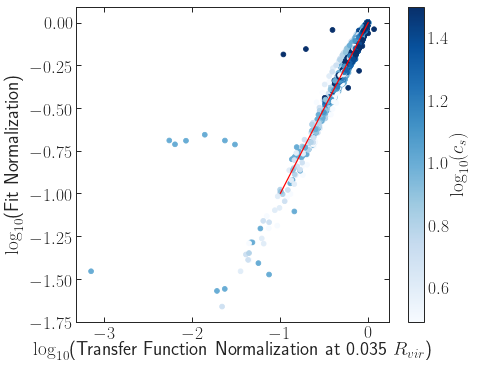

In [51]:
fig, ax = plot()
sc = plt.scatter(np.log10(ft_fit_dat[:, 5]), ft(ft_best_fp.x, fb_cs), c=np.log10(fb_cs[:,1]), cmap=plt.get_cmap('Blues')) #Change this scale...
plt.plot([-1,0],[-1,0],'r')
cb = plt.colorbar(sc)
cb.set_label(r'$\log_{10}(c_s)$')
plt.xlabel('$\log_{10}$(Transfer Function Normalization at %.3f $R_{vir}$)' % radii[radial_bin+innermost_radial_pt])
plt.ylabel('$\log_{10}$(Fit Normalization)')

# this suggests that there are some high-concentration halos with very low normalization

In [52]:
Nsnaps = dat_for_fit.shape[0]
n_prof_pts = dat_for_fit[:,5:].shape[1]
r_by_rs = fit_rads*dat_for_fit[:, 1][:, np.newaxis]

In [53]:
# now, we want to look at how a particular fit evolves over time
# should plot our transfer function for a particular halo at multiple f_b points and see how the fits evolve

In [117]:
#we now have transfer functions for ~10,000 snapshots at apocenter
#we want to fit the TF function to each of them and then plot the parameters against f_b, c_s

def exp_decay_ftfix_wrap(cs,fb):
    def exp_decay_func(r, mp): #need to give it c_s
        #f_t, c_s, and r_t
        return np.log10(10**ft(ft_best_fp.x, np.array([fb,cs])[np.newaxis,:]) * np.exp(-1.* (10**r) * ((cs - mp)/(cs*mp))))
    #can try capturing f_t first... would solve the inner noise issue..
    return exp_decay_func

def hayashi_deluxe_deluxe_wrap(cs):
    def hayashi_deluxe_deluxe(r, *params): #need to give it c_s
        fte = params[0]
        rte = params[1]
        mu  = params[2]
        delta = params[3]
        #f_t, c_s, and r_t
        #print((cs - mp[1])/(cs*mp[1]))
        if(np.abs(cs-rte) < 1e-8):
            return fte
        elif(cs < rte): #rt is larger than rvir, which shouldn't be the case...
            return 0. #this will throw an inf
        else:
            return np.log10(fte / (1. + (10**r * ((cs - rte)/(cs*rte)))**mu)**delta)
    return hayashi_deluxe_deluxe

def hayashi_deluxe_wrap(cs):
    def hayashi_deluxe(r, *mp): #need to give it c_s
        #f_t, c_s, and r_t
        #print((cs - mp[1])/(cs*mp[1]))
        return np.log10(mp[0] / (1. + (10**r * ((cs - mp[1])/(cs*mp[1])))**mp[2]))#mp[2]))
    #can try capturing f_t first... would solve the inner noise issue..
    return hayashi_deluxe

def exp_decay_wrap(cs):
    def exp_decay_func(r, *mp): #need to give it c_s
        #f_t, c_s, and r_t
        return np.log10(mp[0] * np.exp(-1.* (10**r) * ((cs - mp[1])/(cs*mp[1]))))
    #can try capturing f_t first... would solve the inner noise issue..
    return exp_decay_func

def hayashi_wrap(cs):
    def hayashi(r, *mp): #need to give it c_s
        #f_t, c_s, and r_t
        return np.log10(mp[0] * 1. / (1. + (10**r / mp[1])**3))
    return hayashi

In [118]:
best_params = np.zeros((Nsnaps,4)) #for f_t, r_t

#how do we do the best fit
#dat matrix contains ch, cs, xc, eta, fb, radial pts
for i in range(0, Nsnaps): #Nsnaps
    if(i%100 == 0):
        print(i)
    #best_params[i], pcov = curve_fit(exp_decay_wrap(dat_for_fit[i,1]), np.log10(r_by_rs[i,:]), np.log10(dat_for_fit[i,5:]), p0=[1.,1.])
    best_params[i], pcov = curve_fit(hayashi_deluxe_deluxe_wrap(dat_for_fit[i,1]), np.log10(r_by_rs[i,:]), np.log10(dat_for_fit[i,5:]), p0=[1.,1., 3., 3.], maxfev=1000000, bounds=(0.,[5.,2.*dat_for_fit[i,1], 20., 20.]))
    #best_params[i], pcov = curve_fit(exp_decay_wrap(dat_for_fit[i,1]), np.log10(r_by_rs[i,:]), np.log10(dat_for_fit[i,5:]), p0=[0.9,1.], bounds=(0.,[1.,np.inf]))
    #NOT SURE IF HOLDING F_T BELOW 1 IS THE BEST THING TO DO...
    #best_params[i], pcov = curve_fit(hayashi_wrap(dat_for_fit[i,1]), np.log10(r_by_rs[i,:]), np.log10(dat_for_fit[i,5:]), p0=[1.,10.])
    #best_params[i], pcov = curve_fit(exp_decay_ftfix_wrap(dat_for_fit[i,1],dat_for_fit[i,4]), np.log10(r_by_rs[i,:]), np.log10(dat_for_fit[i,5:]), p0=[1.])

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800


In [115]:
np.max(best_params[:,2])

19.999999999999996

(array([5.700e+01, 0.000e+00, 0.000e+00, 0.000e+00, 3.000e+00, 5.200e+01,
        3.685e+03, 5.505e+03, 1.119e+03, 4.020e+02]),
 array([-3.88172069, -3.36344562, -2.84517055, -2.32689548, -1.80862041,
        -1.29034535, -0.77207028, -0.25379521,  0.26447986,  0.78275493,
         1.30103   ]),
 <a list of 10 Patch objects>)

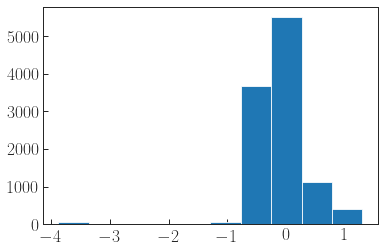

In [122]:
plt.hist(np.log10(best_params[:,3]))

In [94]:
def plot_rho_vs_model(num, fit_parms, rho_model):
    print('ch=%.2f, cs=%.2f, xc=%.2f, eta=%.2f, f_b=%.3f' % (dat_for_fit[num,0], dat_for_fit[num,1], dat_for_fit[num,2], dat_for_fit[num,3], dat_for_fit[num,4]))
    rho_m = 10**rho_model(dat_for_fit[num, 1])(np.log10(r_by_rs[num, :]), *fit_parms[num])
    fig, ax = loglogplot()
    plt.xlabel(r'$r/r_\textrm{s,0}$')
    plt.ylabel(r'$\rho(r) / \rho(r,\textrm{iso})$')
    plt.plot(fit_rads * dat_for_fit[num,1], dat_for_fit[num,5:], label='DASH')
    plt.plot(fit_rads * dat_for_fit[num,1], rho_m, label='Model')
    plt.legend()
    plt.title('$c_h = %.2f$, $c_s = %.2f$, $x_c = %.2f$, $\eta = %.2f$, $f_b = %.2f$' % (dat_for_fit[num,0], dat_for_fit[num,1], dat_for_fit[num,2], dat_for_fit[num,3], dat_for_fit[num,4]))
    #plt.xlim(radii[0]* dat_for_fit[num, 1], 1.* dat_for_fit[num, 1])
    #plt.ylim(10**-4, 2.)
    return fig, ax

In [95]:
# let's write some code to plot the model residuals by fb or by cs bin
def plot_resids_by_fb(fp, model_func, fb_bins=5, logfb_min=-2, logfb_max=0.):
    #loop over and show several fb slices

    fb_bin_edges = np.logspace(logfb_min,logfb_max,fb_bins+1) #ten bins
    fb_bin_centers = 10**((np.log10(fb_bin_edges[1:]) + np.log10(fb_bin_edges[:-1]))*0.5)
    full_resids = resid_dist(fp, model_func)
    msk = ~np.any(np.isnan(full_resids),axis=1)
    full_resids = full_resids[msk,:]
    fig, ax = plot(semilogx=True)
    for num in range(0,fb_bins):
        resids = full_resids[np.logical_and(dat_for_fit[msk,4] > fb_bin_edges[num], dat_for_fit[msk,4]<=fb_bin_edges[num+1])]
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.mean(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]



        plt.errorbar(fit_rads, dist_means, yerr=[dist_low16, dist_high84], label = '%.3f to %.3f' %(fb_bin_edges[num], fb_bin_edges[num+1]))
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    plt.xlabel(r'$r/r_\textrm{vir,s}$')
    plt.ylabel(r'$[\log(\textrm{TF}_s) - \log(\textrm{TF}_m)]$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    plt.legend(title=r'$f_b$', loc=2)

In [96]:
#look at distribution of errors as a function of radii for different functional forms
#the one with the tighest distributions is the one we stick with
#THEN, we fit...
#if none of this works, then we do the same thing but for vmax/rmax and try penarrubia approach
def plot_resids(fp, model_func):
    resids = resid_dist(fp, model_func)
    msk = ~np.any(np.isnan(resids),axis=1)
    resids = resids[msk,:]
    print(np.where(np.isnan(resids)))
    dist_means = np.zeros(n_prof_pts)
    dist_low16 = np.zeros(n_prof_pts)
    dist_low2 = np.zeros(n_prof_pts)
    dist_high84 = np.zeros(n_prof_pts)
    dist_high97 = np.zeros(n_prof_pts)
    for i in range(0, n_prof_pts):
        dist_means[i] = np.mean(resids[resids[:,i] != 0,i])
        dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
        dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
        dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
        dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]

    print(dist_high84)
    print(dist_means)
    print(dist_low16)
    fig, ax = plot(semilogx=True)
    plt.errorbar(fit_rads, dist_means, yerr=[dist_low16, dist_high84], label = '16/84')
    plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    plt.xlabel(r'$r/r_\textrm{vir,s}$')
    plt.ylabel(r'$[\log(\textrm{TF}_s) - \log(\textrm{TF}_m)]$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    plt.legend()
    
def resid_dist(fit_parms, rho_model):
    resids = np.zeros((Nsnaps, n_prof_pts))
    for i in prange(0, Nsnaps):
        for j in prange(0, n_prof_pts):
            resids[i, j] = (np.log10(dat_for_fit[i, 5+j]) -
                                       rho_model(dat_for_fit[i, 1])(np.log10(r_by_rs[i, j]), *fit_parms[i]))
    return resids

(array([], dtype=int64), array([], dtype=int64))
[0.02619835 0.02631789 0.02348897 0.01870907 0.01623723 0.01189343
 0.01020036 0.00813757 0.00498972 0.00639319 0.02050151 0.03691632
 0.05245568 0.05970087 0.06122483 0.0516192  0.0543165  0.05378231
 0.06665142 0.17479085]
[ 0.00590097  0.00366225  0.00136089 -0.00039534 -0.00387845 -0.00427093
 -0.00503364 -0.00363312 -0.0015508   0.00229361  0.00697385  0.01197839
  0.01329631  0.01306663  0.00636568 -0.00694187 -0.02514368 -0.0345325
 -0.01157362  0.03205537]
[0.02435733 0.0203644  0.01969018 0.02053232 0.01854341 0.01818514
 0.01650779 0.01599932 0.01505447 0.0167157  0.02234127 0.03196015
 0.04355854 0.05940926 0.06285529 0.05979911 0.08326056 0.09332174
 0.0786806  0.10032012]


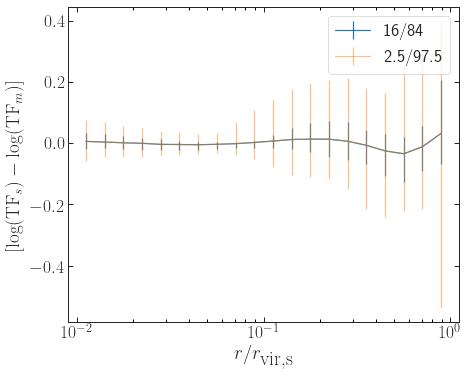

In [100]:
plot_resids(best_params, hayashi_deluxe_wrap)

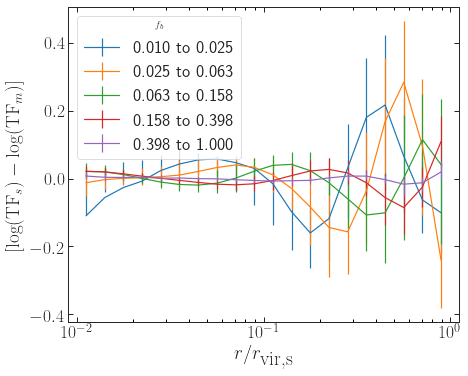

In [123]:
plot_resids_by_fb(best_params, hayashi_deluxe_deluxe_wrap)

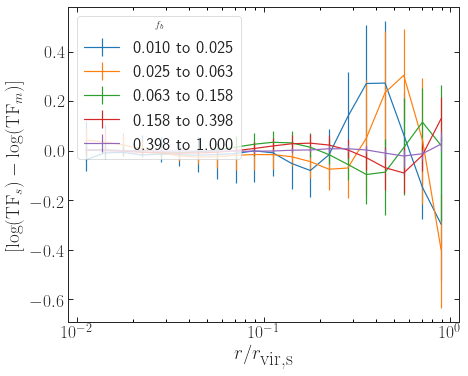

In [109]:
plot_resids_by_fb(best_params, hayashi_deluxe_wrap)
#looks identical

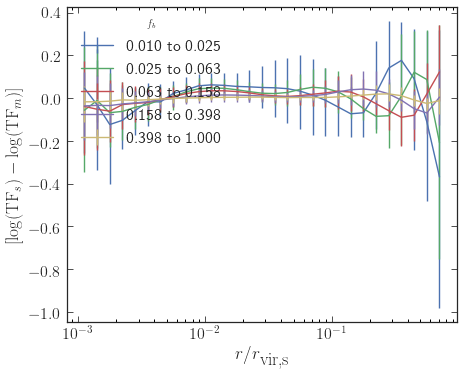

In [428]:
plot_resids_by_fb(best_params, hayashi_wrap)
#this is with a slope of 2.2
#wow... a hell of a lot better...

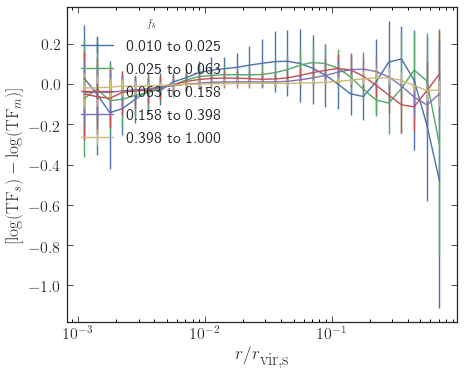

In [425]:
plot_resids_by_fb(best_params, hayashi_wrap)
#this is with a slope of 2
#wow... a hell of a lot better...

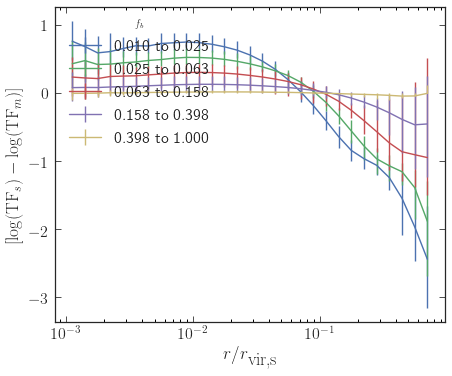

In [422]:
plot_resids_by_fb(best_params, hayashi_wrap)
#this is with a slope of 3

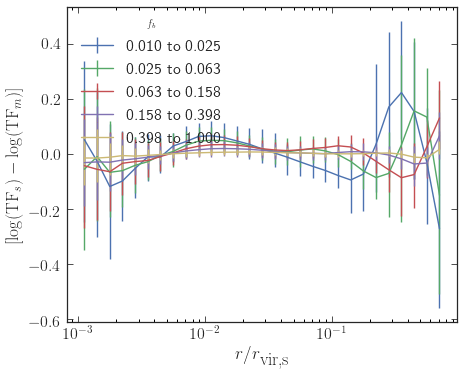

In [420]:
plot_resids_by_fb(best_params, hayashi_deluxe_wrap)

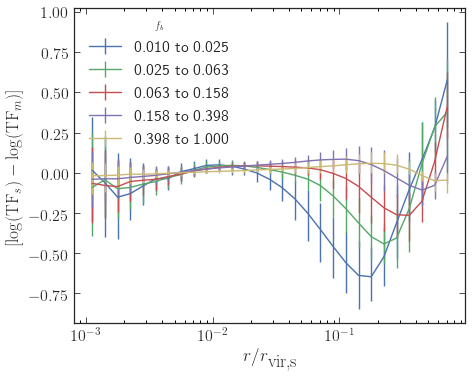

In [413]:
plot_resids_by_fb(best_params, exp_decay_ftfix_wrap)

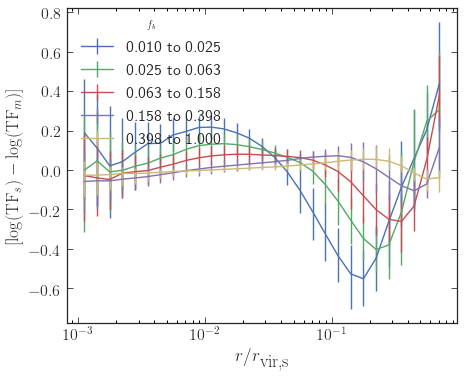

In [398]:
plot_resids_by_fb(best_params, exp_decay_wrap)

(array([], dtype=int64), array([], dtype=int64))
[0.12126278 0.10612492 0.07930638 0.06125469 0.04486514 0.03514347
 0.02775808 0.02519023 0.0234607  0.02317014 0.02445967 0.02630358
 0.02801684 0.02787346 0.02852546 0.02951491 0.03140272 0.03457861
 0.03981625 0.04853348 0.06068489 0.07659568 0.09296726 0.10803156
 0.1097824  0.09333926 0.05607291 0.03958395 0.16501977]
[-0.03519163 -0.03436573 -0.03494892 -0.02581522 -0.02358422 -0.01846131
 -0.01151097 -0.00448293  0.00254738  0.00817539  0.01326505  0.01727805
  0.02062334  0.02407072  0.02687019  0.0293776   0.0324485   0.03719729
  0.04015748  0.04069853  0.04102685  0.03578814  0.0236435   0.00648373
 -0.01463218 -0.03832995 -0.05606147 -0.03958272  0.05215972]
[0.13976367 0.12487756 0.09497769 0.07468245 0.05881774 0.04582673
 0.03783214 0.03325744 0.03002003 0.02774059 0.02619322 0.02478417
 0.02285457 0.02414025 0.02679928 0.02933091 0.03238671 0.03709484
 0.04009177 0.04064745 0.0410187  0.0357934  0.04775403 0.09056438
 0.1

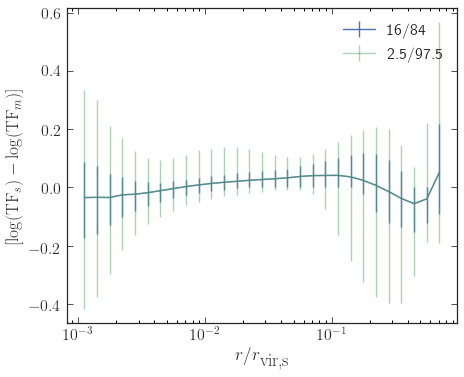

In [399]:
plot_resids(best_params, exp_decay_wrap)

[0.0138467  0.01185568 0.01187981 0.0140951  0.0173374  0.02268197
 0.02966534 0.03738939 0.0437035  0.05036032 0.05509412 0.05166766
 0.04136423 0.06175694 0.0830383  0.09519831 0.10715406 0.11156887
 0.1228228  0.18267868]
[-0.01306028 -0.01134893 -0.01159124 -0.01383976 -0.01719332 -0.02258253
 -0.02966855 -0.03737474 -0.04363183 -0.05021671 -0.05477612 -0.05102556
 -0.03964808 -0.01868338  0.01433459  0.05656058  0.10257372  0.15144411
  0.21877601  0.33179946]
[0.03692653 0.03462635 0.03273211 0.03138221 0.03052681 0.02958165
 0.02977761 0.03103146 0.03520957 0.04033556 0.04409104 0.04565108
 0.05123501 0.06272996 0.06828194 0.0620589  0.08358637 0.11435825
 0.14769389 0.19993501]


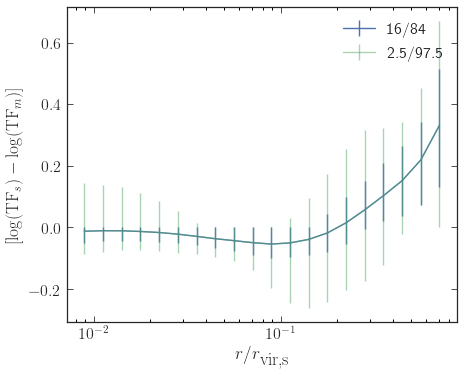

In [50]:
plot_resids(best_params, hayashi_wrap)

ch=4.00, cs=5.00, xc=1.15, eta=0.80, f_b=1.000


(<Figure size 504x417.6 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f282a070c88>)

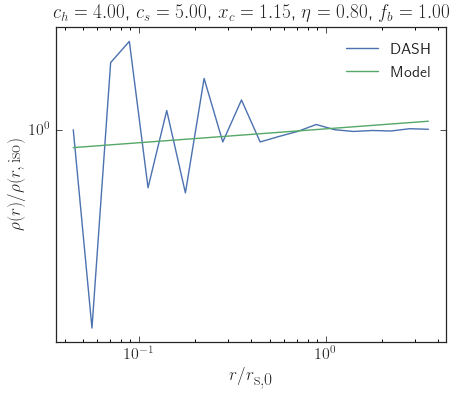

In [109]:
plot_rho_vs_model(1526, best_params, hayashi_deluxe_wrap)

ch=4.00, cs=7.90, xc=1.00, eta=0.70, f_b=0.229


(<Figure size 504x417.6 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f282aa66320>)

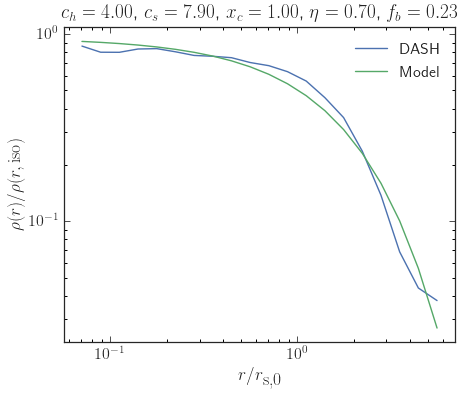

In [320]:
plot_rho_vs_model(1524, best_params, exp_decay_wrap)

In [39]:
#next moves: look at distribution of residuals and see which model overall fits the best
#also look at some test case halos and look at the fit vs. time as an example
#the functional form that has the lowest distribution of residuals upon best fits are the ones we should look at
#then, once we've decided on that functional form, we need to come up with a parametrization for f_t, r_t

(0.30000000000000004, 1)

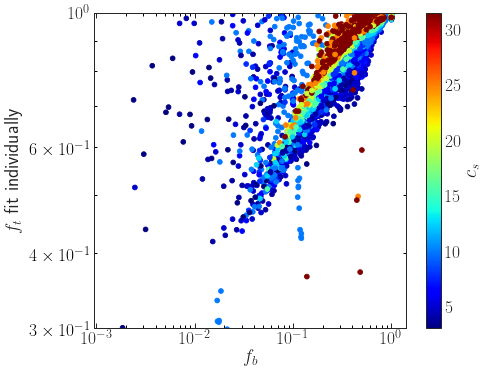

In [138]:
fig, ax  = loglogplot()
sc = plt.scatter(fb_cs[:,0], best_params[:,0], c=dat_for_fit[:,1], cmap=plt.get_cmap('jet'))
plt.xlabel(r'$f_b$')
plt.ylabel(r'$f_t$ fit individually');
cbar = plt.colorbar(sc);
cbar.set_label(r'$c_s$');
plt.ylim(3*10**-1, 1)

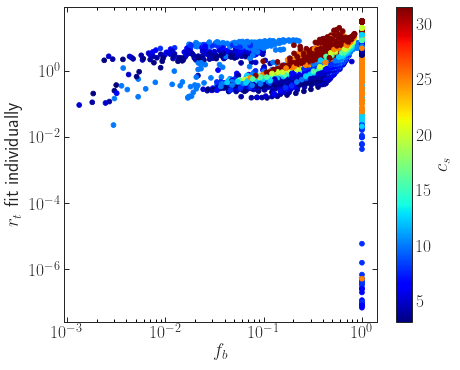

In [136]:
fig, ax  = loglogplot()
sc = plt.scatter(fb_cs[:,0], best_params[:,1], c=dat_for_fit[:,1], cmap=plt.get_cmap('jet'))
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t$ fit individually');
cbar = plt.colorbar(sc);
cbar.set_label(r'$c_s$');
#plt.ylim(3*10**-1, 1)

(0, 8)

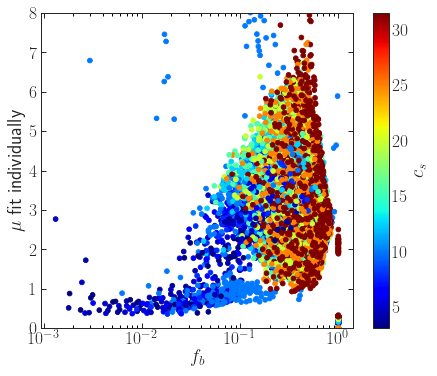

In [146]:
fig, ax  = plot(semilogx=True)
sc = plt.scatter(fb_cs[:,0], best_params[:,2], c=dat_for_fit[:,1], cmap=plt.get_cmap('jet'))
plt.xlabel(r'$f_b$')
plt.ylabel(r'$\mu$ fit individually');
cbar = plt.colorbar(sc);
cbar.set_label(r'$c_s$');
plt.ylim(0,8)
#plt.ylim(3*10**-1, 1)

(0, 8)

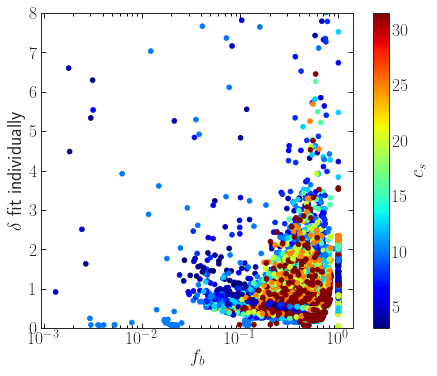

In [147]:
fig, ax  = plot(semilogx=True)
sc = plt.scatter(fb_cs[:,0], best_params[:,3], c=dat_for_fit[:,1], cmap=plt.get_cmap('jet'))
plt.xlabel(r'$f_b$')
plt.ylabel(r'$\delta$ fit individually');
cbar = plt.colorbar(sc);
cbar.set_label(r'$c_s$');
plt.ylim(0,8)
#plt.ylim(3*10**-1, 1)

(0, 8)

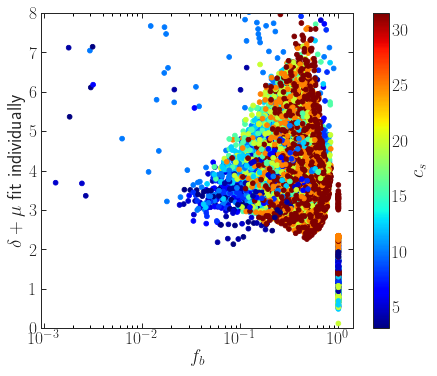

In [144]:
fig, ax  = plot(semilogx=True)
sc = plt.scatter(fb_cs[:,0], best_params[:,2]+best_params[:,3], c=dat_for_fit[:,1], cmap=plt.get_cmap('jet'))
plt.xlabel(r'$f_b$')
plt.ylabel(r'$\delta+\mu$ fit individually');
cbar = plt.colorbar(sc);
cbar.set_label(r'$c_s$');
#plt.ylim(3*10**-1, 1)
plt.ylim(0,8)

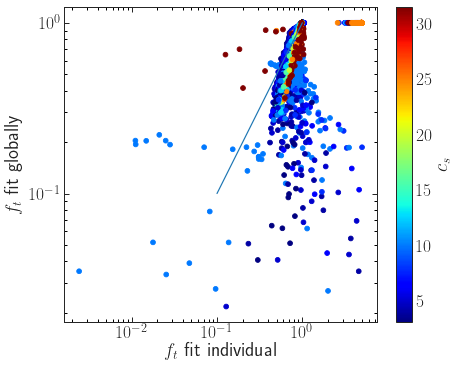

In [124]:
#let's plot the predicted f_b vs. the true to see if it is a good functional form
#if so, we will use that same functional form fit against this data
fig, ax  = loglogplot()
sc = plt.scatter(best_params[:,0], 10**ft(ft_best_fp.x, fb_cs), c=dat_for_fit[:,1], cmap=plt.get_cmap('jet'))
plt.plot([10**-1,1.],[10**-1,1.])
plt.xlabel(r'$f_t$ fit individual')
plt.ylabel(r'$f_t$ fit globally');
cbar = plt.colorbar(sc);
cbar.set_label(r'$c_s$');

#obviously the overall interior normalization doesn't look much like the f_t values of the fit

In [437]:
#throw out nans, report how many there were
print(np.sum(np.isnan(best_params)) / best_params.shape[0])
dat_for_fit = dat_for_fit[~np.any(np.isnan(best_params),axis=1)]
best_params = best_params[~np.any(np.isnan(best_params),axis=1)]

0.017234775947912676


In [438]:
#throw out fluke values..
dat_for_fit = dat_for_fit[~np.isclose(best_params[:,1],0)]
best_params = best_params[~np.isclose(best_params[:,1],0)]

In [439]:
#now, let's do some fits for ft and rt to see how well we can predict the best values
#if we can get a good functional form for these, then we'll use this model to predict the vmax/rmax
#and if we do better, then we have our model. Otherwise, we go back to the drawing board and fit for v_circ
#then can look at that distribution and compare to penarrubia

#if this doesn't work either, then we fit explicitly for vmax/rmax, come up with a good model for that
#and then use the penarrubia method to preserve vmax/rmax

In [473]:
# trying the same functional form but fitting for ft instead of normalization at specific index
ft_fit_dat = np.column_stack(
    (dat_for_fit[:, [0, 1, 2, 3, 4]], best_params[:, 0]))
fb_cs = ft_fit_dat[:, [4, 1]]

Ns = ft_fit_dat.shape[0]


@njit(parallel=True, fastmath=True)
def ft_cost(fp, fb_cs):
    #ft = np.zeros(Ns)
    cost = 0
    for i in prange(0, Ns):
        logft = (0. + fp[0]*(fb_cs[i, 1] / 10.)**fp[1] * np.log10(fb_cs[i, 0]
                                                                  ) + fp[2]*(fb_cs[i, 1] / 10.)**fp[3] * np.log10(fb_cs[i, 0])**2)
                 #+ fp[4]*(fb_cs[i, 1] / 10.)**fp[5] * np.log10(fb_cs[i, 0])**3)
        cost += weights[i] * (np.log10(ft_fit_dat[i, 5]) - logft)**2
    return cost


def ft(fp, fb_cs):
    logft = (0. + fp[0]*(fb_cs[:, 1] / 10.)**fp[1] * np.log10(fb_cs[:, 0]
                                                              ) + fp[2]*(fb_cs[:, 1] / 10.)**fp[3] * np.log10(fb_cs[:, 0])**2)
            # + fp[4]*(fb_cs[:, 1] / 10.)**fp[5] * np.log10(fb_cs[:, 0])**3)
    return logft


x0 = [0.08574221, -0.35442253, -0.09686971,  0.41424968]#, 0., 0.]

ft_global = minimize(ft_cost, x0, method='Nelder-Mead',
                     args=(fb_cs), options={'disp': True, 'maxfev': 10000})
print(ft_global)

#with weights: ([-0.03368131,  0.78733938, -0.25567325,  0.38096909])
# without weights: array([-0.09062959,  0.54069653, -0.29855063,  0.43094621])

#with weights: 41 with parametrization
#with weights: 41 without parametrizatoin

#no weights: 9.7 with parametrization
#no weights: 9.9 without parametrization... doesn't make a big difference

#makes no difference in f_t if we add a third order in the expansion

Optimization terminated successfully.
         Current function value: 41.089621
         Iterations: 118
         Function evaluations: 198
 final_simplex: (array([[ 0.11828698, -0.22727728, -0.08899368,  0.49204038],
       [ 0.11829147, -0.22721884, -0.08899032,  0.49196548],
       [ 0.11828801, -0.22727748, -0.08899234,  0.49205153],
       [ 0.11828567, -0.22721712, -0.08899412,  0.49194947],
       [ 0.11829079, -0.22723088, -0.08899233,  0.4920231 ]]), array([41.08962137, 41.08962138, 41.08962138, 41.08962143, 41.08962143]))
           fun: 41.08962137154481
       message: 'Optimization terminated successfully.'
          nfev: 198
           nit: 118
        status: 0
       success: True
             x: array([ 0.11828698, -0.22727728, -0.08899368,  0.49204038])


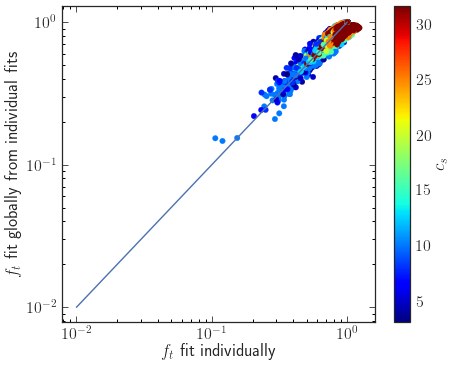

In [474]:
fig, ax  = loglogplot()
sc = plt.scatter(best_params[:,0], 10**ft(ft_global.x, fb_cs), c=dat_for_fit[:,1], cmap=plt.get_cmap('jet'))
plt.plot([10**-2,1.],[10**-2,1.])
plt.xlabel(r'$f_t$ fit individually')
plt.ylabel(r'$f_t$ fit globally from individual fits');
cbar = plt.colorbar(sc);
cbar.set_label(r'$c_s$');
#really not preferred that some of these values are greater than one...

#seems that the weighting makes it perform slightly better at lower f_b, but not much

In [480]:
#now we have the best fit parameters for ft
#should we try the same fitting function for fb?
#once we have a final set of model parameters, we can use this to try to predict vmax/rmax values again

rt_fit_dat = np.column_stack((dat_for_fit[:, [0, 1, 2, 3, 4]],best_params[:,1]))
fb_cs = rt_fit_dat[:, [4, 1]]

Ns = rt_fit_dat.shape[0]


@njit(parallel=True, fastmath=True)
def rt_cost(fp, fb_cs):
    #ft = np.zeros(Ns)
    cost = 0
    for i in prange(0, Ns):
        logrt = (np.log10(fb_cs[i,1]) + fp[0]*(fb_cs[i, 1] / 10.)**fp[1] * np.log10(fb_cs[i, 0]
                                                                  ) + fp[2]*(fb_cs[i, 1] / 10.)**fp[3] * np.log10(fb_cs[i, 0])**2
                        + fp[4]*(fb_cs[i, 1] / 10.)**fp[5] * np.log10(fb_cs[i, 0])**3)
        cost += (np.log10(rt_fit_dat[i, 5]) - logrt)**2
    return cost

def rt(fp, fb_cs):
    logrt = (np.log10(fb_cs[:,1]) + fp[0]*(fb_cs[:, 1] / 10.)**fp[1] * np.log10(fb_cs[:, 0]
                                                                  ) + fp[2]*(fb_cs[:, 1] / 10.)**fp[3] * np.log10(fb_cs[:, 0])**2
             + fp[4]*(fb_cs[:, 1] / 10.)**fp[5] * np.log10(fb_cs[:, 0])**3)
    return logrt

x0 = [ 0.08574221, -0.35442253, -0.09686971,  0.41424968, 0., 0.]

rt_global = basinhopping(rt_cost, x0, minimizer_kwargs={'method':'Nelder-Mead','args':(fb_cs)})

#rt_global = minimize(rt_cost, x0, method='Nelder-Mead', args=(fb_cs), options={'disp':True, 'maxfev':10000})
print(rt_global)

#with weights: array([1.34633237, 0.48384936, 0.38903314, 0.99394505])
#without weights: array([1.68678437, 0.48166738, 0.66394613, 1.07329042]) HOW?
#THIS SEEMS TO SUGGEST THAT WE ONLY CARE ABOUT GETTING THE HIGH FB RIGHT AGAIN...


#with weights and without extra params: 190.07
#without weights and without extra params: 65.144
#with weights and with extra params: 121.786
#without weights and with extra params: 31.7

#so it makes a somewhat meaningful difference to incorporate both the weights and the extra params on r_t

#with a fixed delta, the extra parameters on r_t make a HUGE difference!!!

                        fun: 31.717518344114932
 lowest_optimization_result:  final_simplex: (array([[2.25446311, 0.46554547, 1.60588501, 1.04364143, 0.44605077,
        1.61633483],
       [2.25445358, 0.46555258, 1.60587078, 1.04366375, 0.44604683,
        1.61637146],
       [2.25445072, 0.46555773, 1.60586892, 1.04366438, 0.44604561,
        1.61635572],
       [2.25446306, 0.46554566, 1.60588823, 1.0436348 , 0.44605389,
        1.61630434],
       [2.25447056, 0.46554163, 1.60591343, 1.04362138, 0.44606633,
        1.61628691],
       [2.25446587, 0.46553226, 1.60589381, 1.04359985, 0.44605581,
        1.6162566 ],
       [2.25446547, 0.46554395, 1.60589354, 1.04363907, 0.44605172,
        1.6163351 ]]), array([31.71751834, 31.71751837, 31.71751838, 31.71751838, 31.71751841,
       31.71751841, 31.71751843]))
           fun: 31.717518344114932
       message: 'Optimization terminated successfully.'
          nfev: 724
           nit: 461
        status: 0
       success: True
    

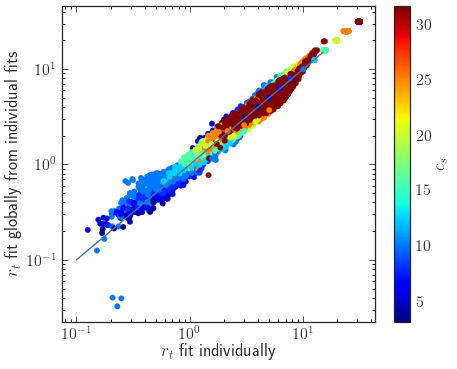

In [481]:
fig, ax  = loglogplot()
sc = plt.scatter(best_params[:,1], 10**rt(rt_global.x, fb_cs), c=dat_for_fit[:,1], cmap=plt.get_cmap('jet'))
plt.plot([10**-1,15.],[10**-1,15.])
plt.xlabel(r'$r_t$ fit individually')
plt.ylabel(r'$r_t$ fit globally from individual fits');
cbar = plt.colorbar(sc);
cbar.set_label(r'$c_s$');

#there is a dependence on eta here too, if we got it then the scatter would shrink down

#we got it... now, we just need to generate a model with these fit params and see how it performs on vmax/rmax

#at low values of c_s, the global fit consistently underestimates

#need to rethink what is going on for some of these high values... might need to change that?

#one note is that there is little scatter at large and small r_t, likely due to my weighting, so this seems
#to at least confirm that the weighting is in fact working..

In [198]:
delta_fit_dat = np.column_stack((dat_for_fit[:, [0, 1, 2, 3, 4]],best_params[:,2]))
fb_cs = delta_fit_dat[:, [4, 1]]

Ns = delta_fit_dat.shape[0]


@njit(parallel=True, fastmath=True)
def delta_cost(fp, fb_cs):
    #ft = np.zeros(Ns)
    cost = 0
    for i in prange(0, Ns):
        delta = (fp[0]*(fb_cs[i, 1] / 10.)**fp[1] * np.log10(fb_cs[i, 0]
                                                                  ) + fp[2]*(fb_cs[i, 1] / 10.)**fp[3] * np.log10(fb_cs[i, 0])**2)
        cost += (delta_fit_dat[i, 5] - delta)**2
    return cost

def delta(fp, fb_cs):
    delta = (fp[0]*(fb_cs[:, 1] / 10.)**fp[1] * np.log10(fb_cs[:, 0]
                                                                  ) + fp[2]*(fb_cs[:, 1] / 10.)**fp[3] * np.log10(fb_cs[:, 0])**2)
    return delta

x0 = [ 0.08574221, -0.35442253, -0.09686971,  0.41424968]

delta_global = minimize(delta_cost, x0, method='Nelder-Mead', args=(fb_cs), options={'disp':True, 'maxfev':10000})
print(delta_global)

#this parametrization is not capturing it...

Optimization terminated successfully.
         Current function value: 19079.378728
         Iterations: 279
         Function evaluations: 478
 final_simplex: (array([[-3.15678061e+00,  7.31523237e-01, -9.03684820e-05,
         9.58989787e+00],
       [-3.15679107e+00,  7.31521086e-01, -9.03629738e-05,
         9.58991890e+00],
       [-3.15673337e+00,  7.31541228e-01, -9.03807442e-05,
         9.58981354e+00],
       [-3.15673973e+00,  7.31523761e-01, -9.03689561e-05,
         9.58980546e+00],
       [-3.15672529e+00,  7.31574060e-01, -9.03821582e-05,
         9.58983753e+00]]), array([19079.37872793, 19079.37872951, 19079.37873072, 19079.37873437,
       19079.37873761]))
           fun: 19079.378727927724
       message: 'Optimization terminated successfully.'
          nfev: 478
           nit: 279
        status: 0
       success: True
             x: array([-3.15678061e+00,  7.31523237e-01, -9.03684820e-05,  9.58989787e+00])


In [213]:
delta_fit_dat = np.column_stack((dat_for_fit[:, [0, 1, 2, 3, 4]],best_params[:,2]))
fb_cs = delta_fit_dat[:, [4, 1]]

Ns = delta_fit_dat.shape[0]


@njit(parallel=True, fastmath=True)
def delta_cost(fp, fb_cs):
    #ft = np.zeros(Ns)
    cost = 0
    for i in prange(0, Ns):
        delta = fp[0] + fp[1] * fb_cs[i,0] #(fb_cs[i, 1] / 10.)**fp[1]# * np.log10(fb_cs[i, 0]
                                                 #                 ) + fp[2]*(fb_cs[i, 1] / 10.)**fp[3] * np.log10(fb_cs[i, 0])**2)
        cost += (delta_fit_dat[i, 5] - delta)**2
    return cost

def delta(fp, fb_cs):
    delta = fp[0] + fp[1]*fb_cs[:,0]# * np.log10(fb_cs[:, 0]
                                             #                     ) + fp[2]*(fb_cs[:, 1] / 10.)**fp[3] * np.log10(fb_cs[:, 0])**2)
    return delta

x0 = [ 3.158096 , -2.4848386]#, -0.09686971,  0.41424968]

delta_global = minimize(delta_cost, x0, method='Nelder-Mead', args=(fb_cs), options={'disp':True, 'maxfev':10000})
print(delta_global)

Optimization terminated successfully.
         Current function value: 11443.492422
         Iterations: 26
         Function evaluations: 51
 final_simplex: (array([[ 3.158096  , -2.4848386 ],
       [ 3.15803457, -2.48474104],
       [ 3.15804732, -2.48479936]]), array([11443.49242229, 11443.49242775, 11443.49242862]))
           fun: 11443.492422288795
       message: 'Optimization terminated successfully.'
          nfev: 51
           nit: 26
        status: 0
       success: True
             x: array([ 3.158096 , -2.4848386])


(0, 10)

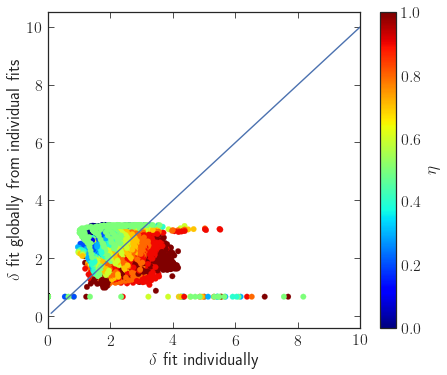

In [214]:
fig, ax  = plot()
sc = plt.scatter(best_params[:,2], delta(delta_global.x, fb_cs), c=dat_for_fit[:,3], cmap=plt.get_cmap('jet'))
plt.plot([10**-1,10.],[10**-1,10.])
plt.xlabel(r'$\delta$ fit individually')
plt.ylabel(r'$\delta$ fit globally from individual fits');
cbar = plt.colorbar(sc);
cbar.set_label(r'$\eta$');
plt.xlim(0,10)

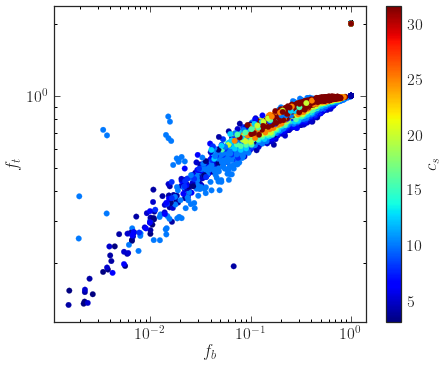

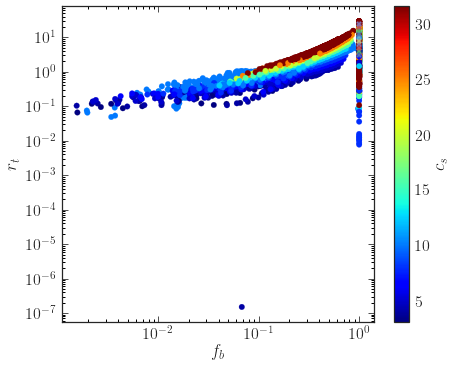

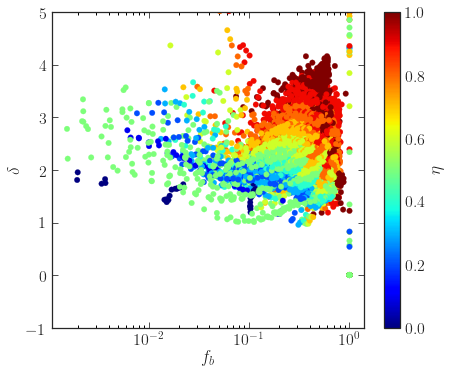

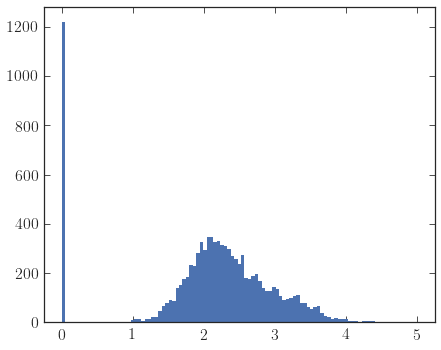

In [185]:
fig, ax  = loglogplot()
sc = plt.scatter(dat_for_fit[:,4], best_params[:,0], c=dat_for_fit[:,1], cmap=plt.get_cmap('jet'))
plt.xlabel(r'$f_b$')
plt.ylabel(r'$f_t$');
cbar = plt.colorbar(sc);
cbar.set_label(r'$c_s$');

fig, ax  = loglogplot()
sc = plt.scatter(dat_for_fit[:,4], best_params[:,1], c=dat_for_fit[:,1], cmap=plt.get_cmap('jet'))
for i in range(0,10):
    plt.plot([1.],cs_vals[i], 'X') #I thought so...
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t$');
cbar = plt.colorbar(sc);
cbar.set_label(r'$c_s$');

fig, ax  = plot(semilogx=True)
sc = plt.scatter(dat_for_fit[:,4], best_params[:,2], c=dat_for_fit[:,3], cmap=plt.get_cmap('jet'))
plt.xlabel(r'$f_b$')
plt.ylabel(r'$\delta$');
cbar = plt.colorbar(sc);
cbar.set_label(r'$\eta$');
plt.ylim(-1,5)

fig,ax = plot()
plt.hist(best_params[:,2], bins=int(np.sqrt(len(best_params))),range=(0,5));

In [188]:
np.log10(dat_for_fit[:,4])

array([ 0.        , -0.52600706, -1.0412792 , ..., -0.51314479,
       -0.61198019, -0.68050689])

In [206]:
print(np.corrcoef(best_params[:,2],dat_for_fit[:,0]))
print(np.corrcoef(best_params[:,2],dat_for_fit[:,1]))
print(np.corrcoef(best_params[:,2],dat_for_fit[:,2]))
print(np.corrcoef(best_params[:,2],dat_for_fit[:,3]))
print(np.corrcoef(best_params[:,2],dat_for_fit[:,4]))
print(np.corrcoef(best_params[:,2],np.log10(dat_for_fit[:,0])))
print(np.corrcoef(best_params[:,2],np.log10(dat_for_fit[:,1])))
print(np.corrcoef(best_params[:,2],np.log10(dat_for_fit[:,2])))
#print(np.corrcoef(best_params[:,2],np.log10(dat_for_fit[:,3])))
print(np.corrcoef(np.log10(best_params[best_params[:,2] > 0,2]),np.log10(dat_for_fit[best_params[:,2] > 0,4])))
print(np.corrcoef(best_params[:,2],np.log10(dat_for_fit[:,4])))

#negative correlation means that as fb increases, delta decreases, which MAKES SENSE

#delta correlates most strongly with circularity and fb

#this tells us that the slope depends very weakly on c_s... more on the orbital parameters than fb...

[[ 1.         -0.07230778]
 [-0.07230778  1.        ]]
[[ 1.        -0.0309039]
 [-0.0309039  1.       ]]
[[ 1.         -0.17151265]
 [-0.17151265  1.        ]]
[[1.        0.2349586]
 [0.2349586 1.       ]]
[[ 1.         -0.59128273]
 [-0.59128273  1.        ]]
[[ 1.        -0.0741324]
 [-0.0741324  1.       ]]
[[ 1.         -0.03237407]
 [-0.03237407  1.        ]]
[[ 1.         -0.16382666]
 [-0.16382666  1.        ]]
[[ 1.         -0.45856305]
 [-0.45856305  1.        ]]
[[ 1.         -0.38601013]
 [-0.38601013  1.        ]]


In [47]:
#the ft and rt functions take ft_global.x and rt_global.x as well as fb_cs vector
#using this, they return the values of ft and rt
#then, we can pass this into the model as the mp set to get predicted densities for everything
#use paramet_exp_v3_free_ft

fp_individual_fits = np.append(ft_global.x, rt_global.x)

In [48]:
fp_individual_fits

array([-0.09062959,  0.54069653, -0.29855063,  0.43094621,  1.68678437,
        0.48166738,  0.66394613,  1.07329042])

## Fit just f_t

In [147]:
radial_bin = 10
ft_fit_dat = dat_matrix[:, [0, 1, 2, 3, 4, 4+radial_bin]]
fb_cs = ft_fit_dat[:, [4, 1]]

Ns = ft_fit_dat.shape[0]

wts = fb_weight(fb_cs[:,0])

@njit(parallel=True, fastmath=True)
def ft_cost(fp, fb_cs):
    #ft = np.zeros(Ns)
    cost = 0
    for i in prange(0, Ns):
        logft = (0. + fp[0]*(fb_cs[i, 1] / 10.)**fp[1] * np.log10(fb_cs[i, 0]
                                                                  ) + fp[2]*(fb_cs[i, 1] / 10.)**fp[3] * np.log10(fb_cs[i, 0])**2)
        cost +=  (np.log10(ft_fit_dat[i, 5]) - logft)**2
    return cost

def ft(fp, fb_cs):
    logft = (0. + fp[0]*(fb_cs[:, 1] / 10.)**fp[1] * np.log10(fb_cs[:, 0]
                                                                  ) + fp[2]*(fb_cs[:, 1] / 10.)**fp[3] * np.log10(fb_cs[:, 0])**2)
    return logft

x0 = [1., 1., 1., 1.]

ft_best_fp = minimize(ft_cost, x0, method='Nelder-Mead', args=(fb_cs), options={'disp':True, 'maxfev':10000})
print(ft_best_fp)
#without weight array([ 0.08574221, -0.35442253, -0.09686971,  0.41424968])
#with weight array([ 0.0765425 , -0.28995816, -0.10412717,  0.38705254])

Optimization terminated successfully.
         Current function value: 277.325201
         Iterations: 369
         Function evaluations: 606
 final_simplex: (array([[ 0.08574221, -0.35442253, -0.09686971,  0.41424968],
       [ 0.08574061, -0.3544422 , -0.09687372,  0.41426433],
       [ 0.08573937, -0.35450861, -0.09687316,  0.41434014],
       [ 0.08574248, -0.35443919, -0.09687281,  0.41430406],
       [ 0.08573453, -0.35440261, -0.09687776,  0.41426668]]), array([277.32520108, 277.32520131, 277.32520142, 277.3252025 ,
       277.32520254]))
           fun: 277.3252010816073
       message: 'Optimization terminated successfully.'
          nfev: 606
           nit: 369
        status: 0
       success: True
             x: array([ 0.08574221, -0.35442253, -0.09686971,  0.41424968])


Text(0, 0.5, '$\\log_{10}$(Fit Normalization)')

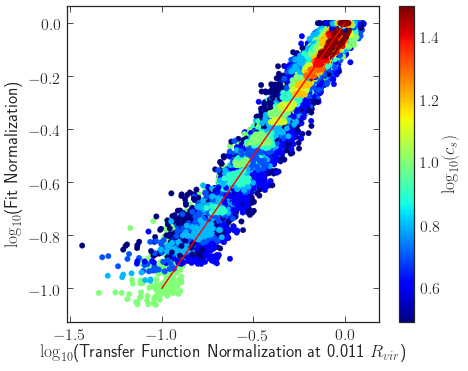

In [148]:
fig, ax = plot()
sc = plt.scatter(np.log10(ft_fit_dat[:, 5]), ft(ft_best_fp.x, fb_cs), c=np.log10(fb_cs[:,1]), cmap=plt.get_cmap('jet')) #Change this scale...
plt.plot([-1,0],[-1,0],'r')
cb = plt.colorbar(sc)
cb.set_label(r'$\log_{10}(c_s)$')
plt.xlabel('$\log_{10}$(Transfer Function Normalization at %.3f $R_{vir}$)' % radii[radial_bin])
plt.ylabel('$\log_{10}$(Fit Normalization)')

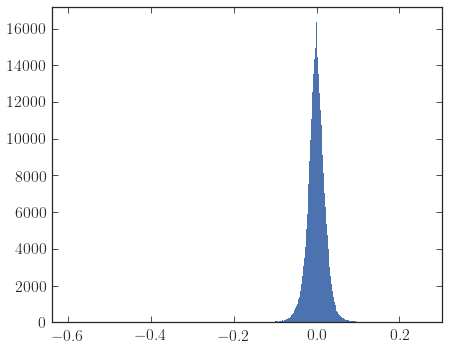

In [167]:
# TODO: run MCMC to get the error bars on these fit values...
#what's the distribution of errors look like?

fig, ax = plot()
plt.hist(np.log10(ft_fit_dat[:, 5]) - ft(ft_best_fp.x, fb_cs), bins=int(np.sqrt(len(ft_fit_dat))));
#bang on, looks great.
#long tail in the negative, meaning that our fit ocassionally overpredicts

## Fitting Function Optimization

In [32]:
print(dat_matrix.shape)
print(radii[:30].shape) #lose 10 additional bins...

#we only want to keep the first 30 radial bins, because problems arise outside of the virial radius since we
#are actually calculating bound fraction relative to isolated halo to avoid artificial 2-body relaxation
#so there are 579528 snapshots that are not near pericenter and pass numerical stability test

#dat matrix contains ch, cs, xc, eta, fb, radial pts
innermost_radial_pt = 10
radial_pts =  30 - innermost_radial_pt
cols_needed = np.append(np.array([0,1,2,3,4]),np.arange(5+innermost_radial_pt, 5+innermost_radial_pt+radial_pts))
dat_for_fit = dat_matrix[:,cols_needed]
cols_needed = np.arange(1+innermost_radial_pt, 1+innermost_radial_pt+radial_pts)
unnormed_dat_for_fit = unnormalized_dat_matrix[:,cols_needed] #contains fb still, drop

#########################################
# THIS IS JUST TO TEST A SMALL SUBSET
#unnormed_dat_for_fit = unnormed_dat_for_fit[dat_for_fit[:,0] == ch_vals[2]]
#dat_for_fit = dat_for_fit[dat_for_fit[:,0] == ch_vals[2]]
#unnormed_dat_for_fit = unnormed_dat_for_fit[dat_for_fit[:,1] == cs_vals[5]]
#dat_for_fit = dat_for_fit[dat_for_fit[:,1] == cs_vals[5]]
#unnormed_dat_for_fit = unnormed_dat_for_fit[dat_for_fit[:,2] == xc_vals[6]]
#dat_for_fit = dat_for_fit[dat_for_fit[:,2] == xc_vals[6]]
#unnormed_dat_for_fit = unnormed_dat_for_fit[dat_for_fit[:,3] == eta_vals[7]]
#dat_for_fit = dat_for_fit[dat_for_fit[:,3] == eta_vals[7]]

#####select for only a specific cs value
#csn = 10
#unnormed_dat_for_fit = unnormed_dat_for_fit[dat_for_fit[:,1] == cs_vals[csn]]
#dat_for_fit = dat_for_fit[dat_for_fit[:,1] == cs_vals[csn]]

#### WE SHOULD THROW OUT FB=1, SINCE WE DON'T WANT TO CALIBRATE THAT. MODEL SHOULD BE UNITY AT Fb=1
#unnormed_dat_for_fit = unnormed_dat_for_fit[dat_for_fit[:,4] != 1]
#dat_for_fit = dat_for_fit[dat_for_fit[:,4] != 1]

'''
subset_frac = 0.1
mask = np.full(dat_for_fit.shape[0], False)
mask[:int(dat_for_fit.shape[0] * subset_frac)] = True
np.random.shuffle(mask)
unnormed_dat_for_fit = unnormed_dat_for_fit[mask]
dat_for_fit = dat_for_fit[mask]
'''

########################################



fit_rads = radii[innermost_radial_pt:innermost_radial_pt+radial_pts]

print(dat_for_fit.shape)
print(unnormed_dat_for_fit.shape)
print(fit_rads.shape)
print(fit_rads)

(675430, 45)
(30,)
(675430, 25)
(675430, 20)
(20,)
[0.01122018 0.01412538 0.01778279 0.02238721 0.02818383 0.03548134
 0.04466836 0.05623413 0.07079458 0.08912509 0.1122018  0.1412538
 0.1778279  0.2238721  0.2818383  0.3548134  0.4466836  0.5623413
 0.7079458  0.8912509 ]


In [33]:
#make a mask that throws out NaNs, zeros, and infinities
#TODO: figure out where these are coming from
#remember to change this depending on if we're doing the calculation normalized to isolated subhalo
#or normalized to t=0
#msk  = ~np.logical_or(np.any(np.isnan(dat_for_fit[:,5:]),axis=1), 
#                      np.logical_or(np.any(dat_for_fit[:,5:] == 0., axis=1), 
#                                    np.any(dat_for_fit[:,5:] == np.inf, axis=1)))

##### ALLOWING ZEROS INTO DATASET; doesn't affect calculation since error is infinite #####
msk  = ~np.logical_or(np.any(np.isnan(dat_for_fit[:,5:]),axis=1), np.any(dat_for_fit[:,5:] == np.inf, axis=1))

In [34]:
print(np.sum(np.isnan(dat_for_fit[:,5:]))) #this happens when there was a zero....
#let's just throw out the 1.6k points where there is a nan, because these are just where the denominator was zero
#meaning that there were no points in that cell at a given snapshot in the isolated halo
#dat_for_fit = dat_for_fit[~np.any(np.isnan(dat_for_fit[:,5:]),axis=1)]
#dat_for_fit = dat_for_fit[~np.any(dat_for_fit[:,5:] == 0., axis=1)]
#dat_for_fit = dat_for_fit[~np.any(dat_for_fit[:,5:] == np.inf, axis=1)]
dat_for_fit = dat_for_fit[msk]
unnormed_dat_for_fit = unnormed_dat_for_fit[msk]
print(dat_for_fit.shape)

0
(675430, 25)


In [35]:
#mask bad data points by replacing with zero all radial bins that start to increase again
#there are 30 points, let's remove the inner few radii and the outer ones whenever we have two trues in a row?
#increasing_mask =  dat_for_fit[:,6:] > dat_for_fit[:,5:-1]
#start_col = 15 #starting from the 15th radial bin
#dbl_increasing_mask = increasing_mask[:,start_col:-1] * increasing_mask[:,start_col+1:]
#print(np.sum(increasing_mask[:,start_col:]) / (np.shape(increasing_mask[:,start_col:])[0]*np.shape(increasing_mask[:,start_col:])[1]))
#print(np.sum(dbl_increasing_mask) / (np.shape(dbl_increasing_mask)[0]*np.shape(dbl_increasing_mask)[1]))
#for i in range(0,Nsnaps):
#    for j in range(start_col, n_prof_pts-2):
#        if(dbl_increasing_mask[i,j-start_col]): #if start column meets requirement of 2 radial bins increasing, kill rest of prof
#            dat_for_fit[i,5+j:] = 0
#            break #no need to keep going here, since we kill rest of the bins

#################fix implementation
#################currently removing all bins outside of the inner 15 (which have some fluctuation)
#################that have two radial bins increasing in a row

In [36]:
#now that we have the pdf for the orbital parameter, let's do the fit.

Nsnaps = dat_for_fit.shape[0]
n_prof_pts = dat_for_fit.shape[1] - 5 #-5 because ch, cs, xc, eta, fb

In [37]:
sim_inds = np.zeros((Nsnaps,2))
#sim inds is eta first, then xc
for i in range(0,Nsnaps):
    sim_inds[i] = [np.where(dat_for_fit[i,3] == eta_vals)[0][0], np.where(dat_for_fit[i,2] == xc_vals)[0][0]]
    
#since we are using 100 points in our pdf, 0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 99
#just need to make the reduced pdf matrix
sim_inds = sim_inds.astype(int)

In [38]:
print(ets[0::10])
print(xcs[0::10])
inds_to_take = [0,10,20,30,40,50,60,70,80,90,99]
print(pdf_mat[inds_to_take][:,inds_to_take].shape)
sub_pdf_mat = pdf_mat[inds_to_take][:,inds_to_take]

[0.     0.0999 0.1998 0.2997 0.3996 0.4995 0.5994 0.6993 0.7992 0.8991
 0.999 ]
[0.5        0.57434918 0.65975396 0.75785828 0.87055056 1.
 1.14869835 1.31950791 1.51571657 1.74110113 2.        ]
(11, 11)


In [39]:
weights = np.zeros(Nsnaps)
#just need the probabilities
#for i in range(0,Nsnaps):
    #weights[i] = sub_pdf_mat[sim_inds[i,0],sim_inds[i,1]] * fb_weight(dat_for_fit[i,4]) #matrix is eta by xc
#    weights[i] = fb_weight(dat_for_fit[:,4])
#TODO: Verify that weights are calculated correctly, if the order was flipped the fit would look much worse
#eta by xc vs other way around
weights = fb_weight(dat_for_fit[:,4])
W_tot = np.sum(weights)

In [40]:
# new weights
weights = np.zeros((Nsnaps, n_prof_pts))
rmax_vals_nfw = 2.163 / cs_vals
weights = 1.0 / (fit_rads[np.newaxis,:] / (2.163 / dat_for_fit[:,1,np.newaxis]))
weights[weights >=1] = 1.

In [41]:
errors = np.zeros((Nsnaps, n_prof_pts))
error_prefact = (1. / np.log(10)) * (mp / rho200_0)**(1./2.)
for i in range(0,Nsnaps):
    #errors[i,:] = 1.0 / np.sqrt(unnormed_dat_for_fit[i,:] * shell_vols[:n_prof_pts])
    errors[i,:] = error_prefact / np.sqrt(unnormed_dat_for_fit[i,:] * shell_vols[innermost_radial_pt:innermost_radial_pt+n_prof_pts])

C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in true_divide
  """


Text(0, 0.5, 'N')

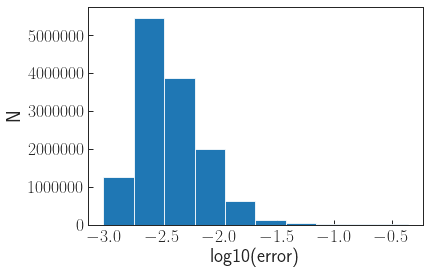

In [42]:
plt.hist(np.log10(errors[errors != np.inf]))
plt.xlabel('log10(error)')
plt.ylabel('N')

In [41]:
#dat_for_fit[:,5:][dat_for_fit[:,5:] == 0] = np.finfo(np.float).eps #machine epsilon

In [43]:
#for a given dataset, we have the weights, errors, dat_for_fit (contains params and prof pts normed to iso)
#this is all we need in order to run the following cost function minimization and mcmc, so we can pickle
#it and load it in my codes on grace
np.savez('fit_dat_avgnfw_0.01rv_no1Rv_all_PERIS', dat_for_fit=dat_for_fit, weights=weights, errors=errors, fit_rads=fit_rads)

#norms to try: avg_nfw (best so far, can try removing another data point or varying Vmax0), t=0, iso, true NFW
# want to see which one gets the best Vmax, Rmax distributions for our particular model
# then, can try reducing further in to just focus on the radial region of interest
# let's look at the residual distribution after this...

# we saw that the rmax0 / rmax_NFW is slightly skewed to less than 1
# so if we want to get the predictions closer to correct, we should normalize by Rmax0

# we're trying with the outer two radial bins removed; Depending on how this looks, we may keep it
# otherwise, I think that we need to start out by trying to increase parametrization and c_s dependence on f_t, because
# there is a clear inner normalization residual with f_te

In [42]:
def plot_rho_vs_model(ch_num, cs_num, xc_num, eta_num, snapnum, fp, model_param_func, rho_model,by_iso=False):
    direct = dash_root / ch_dirs[ch_num] / cs_dirs[cs_num] / xc_dirs[xc_num] / eta_dirs[eta_num]
    pf_fn = direct / 'radprof_rho.txt'
    sh_evo_fn = direct / 'subhalo_evo.txt'
    if(Path(pf_fn).is_file()):
        sim_dat = load_sim_old(direct,cs_num,False,normalize=True, by_iso=by_iso) #keep all timesteps
        
        #generate model, takes as input r/rs0
        rho_m = rho_fit(radii * cs_vals[cs_num], np.array([sim_dat[snapnum,0]]), np.array([cs_vals[cs_num]]), fp, model_param_func, rho_model)
        fig, ax = loglogplot()
        plt.xlabel(r'$r/r_\textrm{s,0}$')
        plt.ylabel(r'$\rho(r) / \rho(r,\textrm{iso})$')
        plt.plot(radii * cs_vals[cs_num], sim_dat[snapnum,1:], label='DASH')
        plt.plot(radii * cs_vals[cs_num], rho_m, label='Model')
        plt.legend()
        plt.title('$c_h = %.2f$, $c_s = %.2f$, $x_c = %.2f$, $\eta = %.2f$, $f_b = %.2f$' % (ch_vals[ch_num], cs_vals[cs_num], xc_vals[xc_num], eta_vals[eta_num], sim_dat[snapnum,0]))
        plt.xlim(10**-2 * cs_vals[cs_num], 1.* cs_vals[cs_num])
        plt.ylim(10**-4, 2.)
        
    else:
        print("No simulation run here yet!")

C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: RuntimeWarning: divide by zero encountered in true_divide
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in true_divide


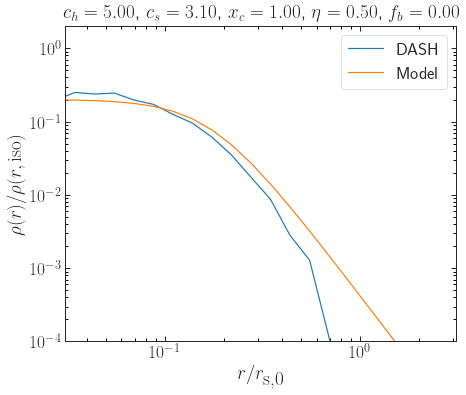

In [554]:
plot_rho_vs_model(2, 0, 5, 5, 300, fp_v43_avgnfw_no1Rv, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe,by_iso=False)

# this looks more exponential...

C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: RuntimeWarning: divide by zero encountered in true_divide
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in true_divide


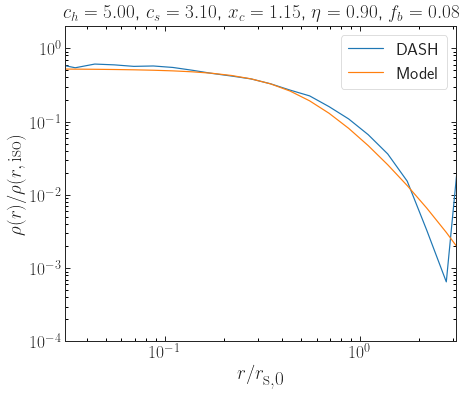

In [558]:
plot_rho_vs_model(2, 0, 6, 9, 250, fp_plexp_v1_avgnfw_no1Rv, paramet_plexp_v1, powerlaw_exp,by_iso=False)

In [48]:
# one last try with njit for use on the clusters...

# TODO: eventually incorporate c_h?

o_errsq = 1. / errors**2
o_err = 1. / errors

#weight_o_errsq = weights[:, np.newaxis] * o_errsq
#weights_no_err = np.repeat(weights, len(fit_rads)).reshape(np.shape(o_errsq))
#weights_no_err[dat_for_fit[:, 5:] == 0] = 0
unity = np.ones(np.shape(o_errsq))
unity[dat_for_fit[:, 5:] == 0] = 0
r_by_rs = fit_rads*dat_for_fit[:, 1][:, np.newaxis]
fb_cs = np.column_stack(
    (dat_for_fit[:, 4], dat_for_fit[:, 1]))  # fb, cs for use_cs

ft_vals = 10**(0.08574221*(fb_cs[:, 1] / 10.)**-0.35442253 * np.log10(fb_cs[:, 0]
                                                                      ) + -0.09686971*(fb_cs[:, 1] / 10.)**0.41424968 * np.log10(fb_cs[:, 0])**2)

MIN_PROF_DENS = 1e-12
PRIOR_MAX = 10.


@njit
def rho_model_hayashi(r, mp):
    return mp[0] / (1. + (r/mp[1])**mp[2])


@njit
def exp_decay_model(r, mp):
    return mp[0] * np.exp(-1.*r / mp[1])


@njit
def exp_decay_deluxe(r, mp):
    return mp[0] * np.exp(-1. * (r / mp[1])**mp[2])


@njit
def exp_decay_v3(r, mp):
    # f_t, c_s, and r_t
    return mp[0] * np.exp(-1. * r * ((mp[1] - mp[2])/(mp[1]*mp[2])))


@njit
def hayashi_deluxe(r, mp):
    # f_t, r_vir (i.e., c_s), r_t, delta
    if(np.abs(mp[1]-mp[2]) < 1e-8):
        #print("this happened for r=%.3e"%r)
        return mp[0]
    elif(mp[1] < mp[2]): #rt is larger than rvir, which shouldn't be the case...
        return 0. #this will throw an inf
    else:
        return mp[0] / (1. + (r * ((mp[1] - mp[2])/(mp[1]*mp[2])))**mp[3])

@njit
def hayashi_deluxe_deluxe(r, mp):
    # f_t, r_vir (i.e., c_s), r_t, delta
    if(np.abs(mp[1]-mp[2]) < 1e-8):
        return mp[0]
    elif(mp[1] < mp[2]): #rt is larger than rvir, which shouldn't be the case...
        return 0. #this will throw an inf
    else:
        return mp[0] / (1. + (r * ((mp[1] - mp[2])/(mp[1]*mp[2])))**mp[3])**mp[4]
    
    
# will try this if our double power-law can't cut it
@njit
def powerlaw_exp(r, mp):
    if(np.abs(mp[1]-mp[2]) < 1e-8):
        #print("this happened for r=%.3e"%r)
        return mp[0]
    elif(mp[1] < mp[2]): #rt is larger than rvir, which shouldn't be the case...
        return 0. #this will throw an inf
    else:
        return (mp[0] / (1. + (r * ((mp[1] - mp[2])/(mp[1]*mp[2])))**mp[3])) * np.exp(-1. * r * ((mp[1] - mp[4])/(mp[1]*mp[4])))
   
    
@njit(parallel=True, fastmath=True)
def paramet_plexp_v3(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1])) * np.exp(fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(np.log10(fb_cs[i,1]) + fp[13] * (fb_cs[i,1] / 10.)**fp[14] * np.log10(fb_cs[i,0]) + fp[15] * (fb_cs[i,1] / 10.)**fp[16] * np.log10(fb_cs[i,0])**2)
    return model_params    

@njit(parallel=True, fastmath=True)
def paramet_plexp_v2(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1])) * np.exp(fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(np.log10(fb_cs[i,1]) + fp[13] * (fb_cs[i,1] / 10.)**fp[14] * np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_plexp_v1(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1])) * np.exp(fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(np.log10(fb_cs[i,1]) + fp[13] * (fb_cs[i,1] / 10.)**fp[14] * np.log10(fb_cs[i,0]) + fp[15] * (1. - fb_cs[i,0])**fp[16] * np.log10(fb_cs[i,1]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_polexp1(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5)) # there's ft, cs, rt, mu, delta
    x = np.log10(fb_cs[:,0])
    y = np.log10(fb_cs[:,1])
    for i in prange(0, len(fb_cs)):
        model_params[i, 0] = 10**(fp[0]*x[i] + fp[1]*y[i] + fp[2]*x[i]*y[i] + fp[3]*x[i]**2 + fp[4]*y[i]**2 + fp[5]*x[i]**2 * y[i] + fp[6]*x[i]*y[i]**2 + fp[7]*x[i]**3 + fp[8]*y[i]**3)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(y[i] + fp[9]*x[i] + fp[10]*y[i] + fp[11]*x[i]*y[i] + fp[12]*x[i]**2 + fp[13]*y[i]**2 + fp[14]*x[i]**2 * y[i] + fp[15]*x[i]*y[i]**2 + fp[16]*x[i]**3 + fp[17]*y[i]**3)
        model_params[i, 3] = 10**(fp[18] + fp[19]*x[i] + fp[20]*y[i] + fp[21]*x[i]**2 + fp[22]*y[i]**2 + fp[23]*x[i]*y[i])
        model_params[i, 4] = 10**(fp[24] + fp[25]*x[i] + fp[26]*y[i] + fp[27]*x[i]**2 + fp[28]*y[i]**2 + fp[29]*x[i]*y[i])
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v46(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1])) * np.exp(fp[16] * (fb_cs[i,1] / 10.)**fp[17] * (1. - fb_cs[i,0]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1])) * np.exp(fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[13] + fp[14]*(fb_cs[i,1] / 10.)**fp[15] * np.log10(fb_cs[i,0]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v51(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1])) * np.exp(fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[10] + fp[11] * np.log10(fb_cs[i,1]))
        model_params[i, 4] = 10**(fp[12] + fp[13]*(fb_cs[i,1] / 10.)**fp[14] * np.log10(fb_cs[i,0]) + fp[15] * (1. - fb_cs[i,0])**fp[16] * np.log10(fb_cs[i,1]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v53(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * np.log10(fb_cs[i,0]) + fp[1] * (1. - fb_cs[i,0])**fp[2] * np.log10(fb_cs[i,1]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[3] * (fb_cs[i,1] / 10.)**fp[4] * np.log10(fb_cs[i,0]) + fp[5] * (1. - fb_cs[i,0])**fp[6] * np.log10(fb_cs[i,1])) * np.exp(fp[7] * (fb_cs[i,1] / 10.)**fp[8] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[9] + fp[10]*(fb_cs[i,1] / 10.)**fp[11] * np.log10(fb_cs[i,0]) + fp[12] * (1. - fb_cs[i,0])**fp[13] * np.log10(fb_cs[i,1]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v52(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1])) * np.exp(fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]) + fp[13] * (1. - fb_cs[i,0])**fp[14] * np.log10(fb_cs[i,1]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v50(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1])) * np.exp(fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]) + fp[16] * np.log10(fb_cs[i,1]))
        model_params[i, 4] = 10**(fp[13] + fp[14]*(fb_cs[i,1] / 10.)**fp[15] * np.log10(fb_cs[i,0]) + fp[17] * (1. - fb_cs[i,0])**fp[18] * np.log10(fb_cs[i,1]))
    return model_params

#polynomial expansion once again, but with sufficient dependence baked into mu, delta
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v49(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2. + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(fb_cs[i, 0])**3.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(
            fb_cs[i, 0]) + fp[8]*((fb_cs[i, 1] / 10.)**fp[9]) * np.log10(fb_cs[i, 0])**2. + fp[10]*(fb_cs[i, 1] / 10.)**fp[11] * np.log10(fb_cs[i, 0])**3 + fp[12]*(fb_cs[i, 1] / 10.)**fp[13] * np.log10(fb_cs[i, 0])**4)
        model_params[i, 3] = 10**(fp[14] + fp[15]*(fb_cs[i,1] / 10.)**fp[16] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[17] + fp[18]*(fb_cs[i,1] / 10.)**fp[19] * np.log10(fb_cs[i,0]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v48(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1])) * np.exp(fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]) + fp[16] * (1. - fb_cs[i,0])**fp[17] * np.log10(fb_cs[i,1]))
        model_params[i, 4] = 10**(fp[13] + fp[14]*(fb_cs[i,1] / 10.)**fp[15] * np.log10(fb_cs[i,0]) + fp[18] * (1. - fb_cs[i,0])**fp[19] * np.log10(fb_cs[i,1]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v47(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1])) * np.exp(fp[16] * (fb_cs[i,1] / 10.)**fp[17] * (1. - fb_cs[i,0])**fp[18])
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1])) * np.exp(fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[13] + fp[14]*(fb_cs[i,1] / 10.)**fp[15] * np.log10(fb_cs[i,0]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v46(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1])) * np.exp(fp[16] * (fb_cs[i,1] / 10.)**fp[17] * (1. - fb_cs[i,0]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1])) * np.exp(fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[13] + fp[14]*(fb_cs[i,1] / 10.)**fp[15] * np.log10(fb_cs[i,0]))
    return model_params

# this one adds exponential to fte, still has exp in rte but adds power law dpeendence to the 1-fb in the exps for both
# this is also second order in fb for fte, not sure if necessary but we'll decide if it helps based on v44 results
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v45(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    if(fp[3] < 0 or fp[7] < 0 or fp[18] < 0 or fp[19] < 0):
        model_params[:,1] = -100
        return model_params
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1])) * np.exp(fp[16] * (fb_cs[i,1] / 10.)**fp[17] * (1. - fb_cs[i,0])**fp[18])
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1])) * np.exp(fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0])**fp[19])
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[13] + fp[14]*(fb_cs[i,1] / 10.)**fp[15] * np.log10(fb_cs[i,0]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v44(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1]) + fp[16]*(fb_cs[i,1] / 10.)**fp[17] * np.log10(fb_cs[i,0])**2)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1])) * np.exp(fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[13] + fp[14]*(fb_cs[i,1] / 10.)**fp[15] * np.log10(fb_cs[i,0]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v43(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1])) * np.exp(fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[13] + fp[14]*(fb_cs[i,1] / 10.)**fp[15] * np.log10(fb_cs[i,0]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v42(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * (1. - fb_cs[i,0])**fp[1] * np.log10(fb_cs[i,1]) + fp[2] * (fb_cs[i,0] / 10.)**fp[3] * (1. - fb_cs[i,0]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1]) + fp[8] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[9] + fp[10] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[11])
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v40(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6] * (1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1]) + fp[8] * (fb_cs[i,1] / 10.)**fp[9] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[13] + fp[14]*(fb_cs[i,1] / 10.)**fp[15] * np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v39(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # CAN ALSO TRY THIS BUT REPLACING 1-FB WITH LOG(FB)
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2] * (1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * (1. - fb_cs[i,0]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[6] * (fb_cs[i,1] / 10.)**fp[7] * np.log10(fb_cs[i,0]) + fp[8] * (1. - fb_cs[i,0])**fp[9] * np.log10(fb_cs[i,1]) + fp[10] * (fb_cs[i,1] / 10.)**fp[11] * (1. - fb_cs[i,0]))
        model_params[i, 3] = 10**(fp[12] + fp[13]*(fb_cs[i,1] / 10.)**fp[14] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[15] + fp[16]*(fb_cs[i,1] / 10.)**fp[17] * np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v36(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        loggamma1 = np.log10(1. / fp[0]) * fp[1] * (fb_cs[i,1] / 10.)**fp[2] + np.log10(1. + 1./fp[0]) * fp[3] * (fb_cs[i,1] / 10.)**fp[4]
        model_params[i, 0] = 10**(0. + loggamma1 - fp[1] * (fb_cs[i,1] / 10.)**fp[2] * np.log10(fb_cs[i,0] / fp[0]) - fp[3] * (fb_cs[i,1] / 10.)**fp[4] * np.log10(1. + fb_cs[i,0] / fp[0]) + fp[15]*(1. - fb_cs[i,0])**fp[16] * np.log10(fb_cs[i,1]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[5] * (fb_cs[i,1] / 10.)**fp[6] * np.log10(fb_cs[i,0]) + fp[7]*(1. - fb_cs[i,0])**fp[8] * np.log10(fb_cs[i,1]))
        model_params[i, 3] = 10**(fp[9] + fp[10]*(fb_cs[i,1] / 10.)**fp[11] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[12] + fp[13]*(fb_cs[i,1] / 10.)**fp[14] * np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v34(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        model_params[i, 0] = 10**(0. + fp[0] * (fb_cs[i,1] / 10.)**fp[1] * np.log10(fb_cs[i,0]) + fp[2]*(1. - fb_cs[i,0])**fp[3] * np.log10(fb_cs[i,1]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(fb_cs[i,0]) + fp[6]*(1. - fb_cs[i,0])**fp[7] * np.log10(fb_cs[i,1]))
        model_params[i, 3] = 10**(fp[8] + fp[9]*(fb_cs[i,1] / 10.)**fp[10] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[11] + fp[12]*(fb_cs[i,1] / 10.)**fp[13] * np.log10(fb_cs[i,0]))
    return model_params
    
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v32(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        loggamma1 = np.log10(1. / fp[0]) * fp[1] * (fb_cs[i,1] / 10.)**fp[2] + np.log10(1. + 1./fp[0]) * fp[3] * (fb_cs[i,1] / 10.)**fp[4]
        model_params[i, 0] = 10**(0. + loggamma1 - fp[1] * (fb_cs[i,1] / 10.)**fp[2] * np.log10(fb_cs[i,0] / fp[0]) - fp[3] * (fb_cs[i,1] / 10.)**fp[4] * np.log10(1. + fb_cs[i,0] / fp[0]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        loggamma2 = np.log10(1. / fp[5]) * fp[6] * (fb_cs[i,1] / 10.)**fp[7] + np.log10(1. + 1./fp[5]) * fp[8] * (fb_cs[i,1] / 10.)**fp[9]
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + loggamma2 - fp[6] * (fb_cs[i,1] / 10.)**fp[7] * np.log10(fb_cs[i,0] / fp[5]) - fp[8] * (fb_cs[i,1] / 10.)**fp[9] * np.log10(1. + fb_cs[i,0] / fp[5]) + fp[10]*(1. - fb_cs[i,0])**fp[11] * np.log10(fb_cs[i,1]))
        model_params[i, 3] = 10**(fp[12] + fp[13]*(fb_cs[i,1] / 10.)**fp[14] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[15] + fp[16]*(fb_cs[i,1] / 10.)**fp[17] * np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v31(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        loggamma1 = np.log10(1. / fp[0]) * fp[1] * (fb_cs[i,1] / 10.)**fp[2] + np.log10(1. + 1./fp[0]) * fp[3] * (fb_cs[i,1] / 10.)**fp[4]
        model_params[i, 0] = 10**(0. + loggamma1 - fp[1] * (fb_cs[i,1] / 10.)**fp[2] * np.log10(fb_cs[i,0] / fp[0]) - fp[3] * (fb_cs[i,1] / 10.)**fp[4] * np.log10(1. + fb_cs[i,0] / fp[0]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        loggamma2 = np.log10(1. / fp[5]) * fp[6] * (fb_cs[i,1] / 10.)**fp[7] + np.log10(1. + 1./fp[5]) * fp[8] * (fb_cs[i,1] / 10.)**fp[9]
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + loggamma2 - fp[6] * (fb_cs[i,1] / 10.)**fp[7] * np.log10(fb_cs[i,0] / fp[5]) - fp[8] * (fb_cs[i,1] / 10.)**fp[9] * np.log10(1. + fb_cs[i,0] / fp[5]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[13] + fp[14]*(fb_cs[i,1] / 10.)**fp[15] * np.log10(fb_cs[i,0]))
    return model_params
    
#try a polynomial expansion once again, and try adding c_s dep to the slopes?
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v30(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2. + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(fb_cs[i, 0])**3.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(
            fb_cs[i, 0]) + fp[8]*((fb_cs[i, 1] / 10.)**fp[9]) * np.log10(fb_cs[i, 0])**2. + fp[10]*(fb_cs[i, 1] / 10.)**fp[11] * np.log10(fb_cs[i, 0])**3 + fp[12]*(fb_cs[i, 1] / 10.)**fp[13] * np.log10(fb_cs[i, 0])**4)
        model_params[i, 3] = 10**(fp[14] + fp[15]*np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[16] + fp[17]*np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v29(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        loggamma1 = np.log10(1. / fp[0]) * fp[1] * (fb_cs[i,1] / 10.)**fp[2] + np.log10(1. + 1./fp[0]) * fp[3] * (fb_cs[i,1] / 10.)**fp[4]
        model_params[i, 0] = 10**(0. + loggamma1 - fp[1] * (fb_cs[i,1] / 10.)**fp[2] * np.log10(fb_cs[i,0] / fp[0]) - fp[3] * (fb_cs[i,1] / 10.)**fp[4] * np.log10(1. + fb_cs[i,0] / fp[0]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        loggamma2 = np.log10(1. / fp[5]) * fp[6] * (fb_cs[i,1] / 10.)**fp[7] + np.log10(1. + 1./fp[5]) * fp[8] * (fb_cs[i,1] / 10.)**fp[9]
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + loggamma2 - fp[6] * (fb_cs[i,1] / 10.)**fp[7] * np.log10(fb_cs[i,0] / fp[5]) - fp[8] * (fb_cs[i,1] / 10.)**fp[9] * np.log10(1. + fb_cs[i,0] / fp[5]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[12] + fp[13]*np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v28_cs(fb_cs, fp): #coupled with hayashi_deluxe_deluxe
    model_params = np.zeros((len(fb_cs), 5))
    for i in prange(0, len(fb_cs)):
        
        model_params[i, 0] = 10**(0. + fp[0]*np.log10(fb_cs[i, 0]) + fp[1]*np.log10(fb_cs[i, 0])**2. + fp[2]*np.log10(fb_cs[i, 0])**3.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[3]*np.log10(fb_cs[i, 0]) + fp[4]*np.log10(fb_cs[i, 0])**2. + fp[5]*np.log10(fb_cs[i, 0])**3 + fp[6]*np.log10(fb_cs[i, 0])**4)
        model_params[i, 3] = 10**(fp[7] + fp[8]*np.log10(fb_cs[i,0]))
        model_params[i, 4] = 10**(fp[9] + fp[10]*np.log10(fb_cs[i,0]))
    return model_params

    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v27_cs(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        
        model_params[i, 0] = 10**(0. + fp[0]*np.log10(fb_cs[i, 0]) + fp[1]*np.log10(fb_cs[i, 0])**2. + fp[2]*np.log10(fb_cs[i, 0])**3.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[3]*np.log10(fb_cs[i, 0]) + fp[4]*np.log10(fb_cs[i, 0])**2. + fp[5]*np.log10(fb_cs[i, 0])**3 + fp[6]*np.log10(fb_cs[i, 0])**4)
        model_params[i, 3] = 10**(fp[7] + fp[8]*np.log10(fb_cs[i,0]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v26_cs(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        loggamma1 = np.log10(1. / fp[0]) * fp[1] + np.log10(1. + 1./fp[0]) * fp[2]
        model_params[i, 0] = 10**(0. + loggamma1 - fp[1] * np.log10(fb_cs[i,0] / fp[0]) - fp[2] * np.log10(1. + fb_cs[i,0] / fp[0]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        loggamma2 = np.log10(1. / fp[3]) * fp[4] + np.log10(1. + 1./fp[3]) * fp[5]
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + loggamma2 - fp[4] * np.log10(fb_cs[i,0] / fp[3]) - fp[5] * np.log10(1. + fb_cs[i,0] / fp[3]))
        model_params[i, 3] = 10**(fp[6] + fp[7]*np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v25(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        loggamma1 = np.log10(1. / fp[0]) * fp[1] * (fb_cs[i,1] / 10.)**fp[2] + np.log10(1. + 1./fp[0]) * fp[3] * (fb_cs[i,1] / 10.)**fp[4]
        model_params[i, 0] = 10**(0. + loggamma1 - fp[1] * (fb_cs[i,1] / 10.)**fp[2] * np.log10(fb_cs[i,0] / fp[0]) - fp[3] * (fb_cs[i,1] / 10.)**fp[4] * np.log10(1. + fb_cs[i,0] / fp[0]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        loggamma2 = np.log10(1. / fp[5]) * fp[6] * (fb_cs[i,1] / 10.)**fp[7] + np.log10(1. + 1./fp[5]) * fp[8] * (fb_cs[i,1] / 10.)**fp[9]
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + loggamma2 - fp[6] * (fb_cs[i,1] / 10.)**fp[7] * np.log10(fb_cs[i,0] / fp[5]) - fp[8] * (fb_cs[i,1] / 10.)**fp[9] * np.log10(1. + fb_cs[i,0] / fp[5]) + fp[12]*(1. - fb_cs[i,0])**fp[13] * np.log10(fb_cs[i,1]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v24(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        loggamma1 = np.log10(1. / fp[0]) * fp[1] * (fb_cs[i,1] / 10.)**fp[2] + np.log10(1. + 1./fp[0]) * fp[3] * (fb_cs[i,1] / 10.)**fp[4]
        model_params[i, 0] = 10**(0. + loggamma1 - fp[1] * (fb_cs[i,1] / 10.)**fp[2] * np.log10(fb_cs[i,0] / fp[0]) - fp[3] * (fb_cs[i,1] / 10.)**fp[4] * np.log10(1. + fb_cs[i,0] / fp[0]) + fp[12]*(1. - fb_cs[i,0])**fp[13] * np.log10(fb_cs[i,1]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        loggamma2 = np.log10(1. / fp[5]) * fp[6] * (fb_cs[i,1] / 10.)**fp[7] + np.log10(1. + 1./fp[5]) * fp[8] * (fb_cs[i,1] / 10.)**fp[9]
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + loggamma2 - fp[6] * (fb_cs[i,1] / 10.)**fp[7] * np.log10(fb_cs[i,0] / fp[5]) - fp[8] * (fb_cs[i,1] / 10.)**fp[9] * np.log10(1. + fb_cs[i,0] / fp[5]) + fp[14]*(1. - fb_cs[i,0])**fp[15] * np.log10(fb_cs[i,1]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v23(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 3))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        model_params[i, 0] = 10**(fp[0] + fp[1]*np.log10(fb_cs[i,1]) + fp[2] * (fb_cs[i,1] / 10.)**fp[3] * np.log10(fb_cs[i,0] / fp[4]) + fp[5] * (fb_cs[i,1] / 10.)**fp[6] * np.log10(1. + fb_cs[i,0] / fp[4]))
        model_params[i, 1] = 10**(fp[7] + fp[8]*np.log10(fb_cs[i,1]) + fp[9] * (fb_cs[i,1] / 10.)**fp[10] * np.log10(fb_cs[i,0] / fp[11]) + fp[12] * (fb_cs[i,1] / 10.)**fp[13] * np.log10(1. + fb_cs[i,0] / fp[11]))
        model_params[i, 2] = 10**(fp[14] + fp[15]*np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v22(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 3))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        model_params[i, 0] = 10**(fp[0] + fp[1] * (fb_cs[i,1] / 10.)**fp[2] * np.log10(fb_cs[i,0] / fp[3]) + fp[4] * (fb_cs[i,1] / 10.)**fp[5] * np.log10(1. + fb_cs[i,0] / fp[3]))
        model_params[i, 1] = 10**(fp[6] + fp[7] * (fb_cs[i,1] / 10.)**fp[8] * np.log10(fb_cs[i,0] / fp[9]) + fp[10] * (fb_cs[i,1] / 10.)**fp[11] * np.log10(1. + fb_cs[i,0] / fp[9]))
        model_params[i, 2] = 10**(fp[12] + fp[13]*np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v21(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        loggamma1 = np.log10(1. / fp[0]) * fp[1] * (fb_cs[i,1] / 10.)**fp[2] + np.log10(1. + 1./fp[0]) * fp[3] * (fb_cs[i,1] / 10.)**fp[4]
        model_params[i, 0] = 10**(0. + loggamma1 - fp[1] * (fb_cs[i,1] / 10.)**fp[2] * np.log10(fb_cs[i,0] / fp[0]) - fp[3] * (fb_cs[i,1] / 10.)**fp[4] * np.log10(1. + fb_cs[i,0] / fp[0]))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        loggamma2 = np.log10(1. / fp[5]) * fp[6] * (fb_cs[i,1] / 10.)**fp[7] + np.log10(1. + 1./fp[5]) * fp[8] * (fb_cs[i,1] / 10.)**fp[9]
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + loggamma2 - fp[6] * (fb_cs[i,1] / 10.)**fp[7] * np.log10(fb_cs[i,0] / fp[5]) - fp[8] * (fb_cs[i,1] / 10.)**fp[9] * np.log10(1. + fb_cs[i,0] / fp[5]))
        model_params[i, 3] = 10**(fp[10] + fp[11]*np.log10(fb_cs[i,0]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v20(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2. + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(fb_cs[i, 0])**3.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        loggamma = np.log10(1. / fp[6]) * fp[7] * (fb_cs[i,1] / 10.)**fp[8] + np.log10(1. + 1./fp[6]) * fp[9] * (fb_cs[i,1] / 10.)**fp[10]
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + loggamma - fp[7] * (fb_cs[i,1] / 10.)**fp[8] * np.log10(fb_cs[i,0] / fp[6]) - fp[9] * (fb_cs[i,1] / 10.)**fp[10] * np.log10(1. + fb_cs[i,0] / fp[6]))
        model_params[i, 3] = 10**(fp[11] + fp[12]*np.log10(fb_cs[i,0]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v19(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + (fb_cs[i, 1] / 10.)**fp[0] * (fp[1] * np.log10(fb_cs[i, 0]) + fp[2] * np.log10(fb_cs[i, 0])**2. + fp[3]* np.log10(fb_cs[i, 0])**3))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        loggamma = np.log10(1. / fp[4]) * fp[5] * (fb_cs[i,1] / 10.)**fp[6] + np.log10(1. + 1./fp[4]) * fp[7] * (fb_cs[i,1] / 10.)**fp[8]
        model_params[i, 2] = 10**(np.log10(fb_cs[i,1]) + loggamma - fp[5] * (fb_cs[i,1] / 10.)**fp[6] * np.log10(fb_cs[i,0] / fp[4]) - fp[7] * (fb_cs[i,1] / 10.)**fp[8] * np.log10(1. + fb_cs[i,0] / fp[4]))
        model_params[i, 3] = 10**(fp[9] + fp[10]*np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v18(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + (fb_cs[i, 1] / 10.)**fp[0] * (fp[1] * np.log10(fb_cs[i, 0]) + fp[2] * np.log10(fb_cs[i, 0])**2. + fp[3]* np.log10(fb_cs[i, 0])**3))
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + (fb_cs[i, 1] / 10.)**fp[4] * (fp[5] * np.log10(fb_cs[i, 0]) + fp[6] * np.log10(fb_cs[i, 0])**2. + fp[7]* np.log10(fb_cs[i, 0])**3 + fp[8]*np.log10(fb_cs[i, 0])**4))
        model_params[i, 3] = 10**(fp[9] + fp[10]*np.log10(fb_cs[i,0]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v17(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2. + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(fb_cs[i, 0])**3.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + (fb_cs[i, 1] / 10.)**fp[6] * (fp[7] * np.log10(fb_cs[i, 0]) + fp[8] * np.log10(fb_cs[i, 0])**2. + fp[9]* np.log10(fb_cs[i, 0])**3 + fp[10]*np.log10(fb_cs[i, 0])**4))
        model_params[i, 3] = 10**(fp[11] + fp[12]*np.log10(fb_cs[i,0]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v16(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2. + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(fb_cs[i, 0])**3.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(
            fb_cs[i, 0]) + fp[8]*((fb_cs[i, 1] / 10.)**fp[9]) * np.log10(fb_cs[i, 0])**2. + fp[10]*(fb_cs[i, 1] / 10.)**fp[11] * np.log10(fb_cs[i, 0])**3 + fp[12]*(fb_cs[i, 1] / 10.)**fp[13] * np.log10(fb_cs[i, 0])**4 + fp[14]*(fb_cs[i, 1] / 10.)**fp[15] * np.log10(fb_cs[i, 0])**5)
        model_params[i, 3] = 10**(fp[16] + fp[17]*np.log10(fb_cs[i,0]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v15(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2. + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(fb_cs[i, 0])**3.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(
            fb_cs[i, 0]) + fp[8]*((fb_cs[i, 1] / 10.)**fp[9]) * np.log10(fb_cs[i, 0])**2. + fp[10]*(fb_cs[i, 1] / 10.)**fp[11] * np.log10(fb_cs[i, 0])**3 + fp[12]*(fb_cs[i, 1] / 10.)**fp[13] * np.log10(fb_cs[i, 0])**4)
        model_params[i, 3] = 10**(fp[14] + fp[15]*np.log10(fb_cs[i,0]) + fp[16]*np.log10(fb_cs[i,0])**2.)
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v14(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2. + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(fb_cs[i, 0])**3.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(
            fb_cs[i, 0]) + fp[8]*((fb_cs[i, 1] / 10.)**fp[9]) * np.log10(fb_cs[i, 0])**2. + fp[10]*(fb_cs[i, 1] / 10.)**fp[11] * np.log10(fb_cs[i, 0])**3 + fp[12]*(fb_cs[i, 1] / 10.)**fp[13] * np.log10(fb_cs[i, 0])**4)
        model_params[i, 3] = 10**(fp[14] + fp[15]*np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v13(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2. + fp[8]*(fb_cs[i, 1] / 10.)**fp[9] * np.log10(fb_cs[i, 0])**3 + fp[10]*(fb_cs[i, 1] / 10.)**fp[11] * np.log10(fb_cs[i, 0])**4)
        model_params[i, 3] = 10**(fp[12] + fp[13]*np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v12(fb_cs, fp):
#this one goes one more order in ft... let's see if third order in both is sufficient
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2. + fp[4]*(fb_cs[i, 1] / 10.)**fp[5] * np.log10(fb_cs[i, 0])**3)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(
            fb_cs[i, 0]) + fp[8]*((fb_cs[i, 1] / 10.)**fp[9]) * np.log10(fb_cs[i, 0])**2. + fp[10]*(fb_cs[i, 1] / 10.)**fp[11] * np.log10(fb_cs[i, 0])**3)
        model_params[i, 3] = 10**(fp[12] + fp[13]*np.log10(fb_cs[i,0]))
    return model_params
    
def paramet_hayashi_deluxe_v11(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2. + fp[8]*(fb_cs[i, 1] / 10.)**fp[9] * np.log10(fb_cs[i, 0])**3)
        model_params[i, 3] = 10**(fp[10] + fp[11]*np.log10(fb_cs[i,0]) + fp[12]*np.log10(fb_cs[i,0])**2.)
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v11(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2. + fp[8]*(fb_cs[i, 1] / 10.)**fp[9] * np.log10(fb_cs[i, 0])**3)
        model_params[i, 3] = 10**(fp[10] + fp[11]*np.log10(fb_cs[i,0]) + fp[12]*np.log10(fb_cs[i,0])**2.)
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v10(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2. + fp[8]*(fb_cs[i, 1] / 10.)**fp[9] * np.log10(fb_cs[i, 0])**3)
        model_params[i, 3] = 10**(fp[10] + fp[11]*(fb_cs[i,1] / 10.)**fp[12] * np.log10(fb_cs[i,0]))
    return model_params

@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v9(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2. + fp[8]*(fb_cs[i, 1] / 10.)**fp[9] * np.log10(fb_cs[i, 0])**3)
        model_params[i, 3] = 10**(fp[10] + fp[11]*np.log10(fb_cs[i,0]))
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v8(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 3))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # I think that it would make sense to try this with the rho_model_hayashi and hayashi_deluxe
        # does the ability for the transfer function go to unity matter a lot?
        #we'll try this current one with rho_model_hayashi and see if it does better
        model_params[i, 0] = 10**(fp[0] + fp[1]*((fb_cs[i, 1] / 10.)**fp[2]) * np.log10(
            fb_cs[i, 0]) + fp[3]*((fb_cs[i, 1] / 10.)**fp[4]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = 10**(fp[5] + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(
            fb_cs[i, 0]) + fp[8]*((fb_cs[i, 1] / 10.)**fp[9]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 2] = fp[10]
    return model_params
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v7(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 3] = fp[8] + fp[9]*fb_cs[i,0]**fp[10]
    return model_params 
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v6(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 3] = fp[8]
    return model_params 
    
@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v5(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir, but then will want to use hayashi form...
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2. + fp[8]*(fb_cs[i, 1] / 10.)**fp[9] * np.log10(fb_cs[i, 0])**3)
        model_params[i, 3] = fp[10] + fp[11]*fb_cs[i,0]**fp[12]
    return model_params

@njit(parallel=True)#, fastmath=True)
def paramet_hayashi_deluxe_v4(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2. + fp[8]*(fb_cs[i, 1] / 10.)**fp[9] * np.log10(fb_cs[i, 0])**3)
        model_params[i, 3] = fp[10]
    return model_params

@njit(parallel=True)#, fastmath=True)
def paramet_hayashi_deluxe_v4(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # can also try setting the first term in f_t free to allow deviation from zero
        # and can allow first term in r_t to deviate from r_vir
        
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2. + fp[8]*(fb_cs[i, 1] / 10.)**fp[9] * np.log10(fb_cs[i, 0])**3)
        model_params[i, 3] = fp[10]
    return model_params


@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v3(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # less computationally efficient, but still works...
        model_params[i, 0] = 10**(0.08574221*(fb_cs[i, 1] / 10.)**-0.35442253 * np.log10(fb_cs[i, 0]
                                                                                         ) + -0.09686971*(fb_cs[i, 1] / 10.)**0.41424968 * np.log10(fb_cs[i, 0])**2)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 3] = fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0])
    return model_params  # lastly, try it logged and see how that goes...


@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe_v2(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # less computationally efficient, but still works...
        model_params[i, 0] = 10**(0.08574221*(fb_cs[i, 1] / 10.)**-0.35442253 * np.log10(fb_cs[i, 0]
                                                                                         ) + -0.09686971*(fb_cs[i, 1] / 10.)**0.41424968 * np.log10(fb_cs[i, 0])**2)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 3] = fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2.
    return model_params


@njit(parallel=True, fastmath=True)
def paramet_hayashi_deluxe(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 4))
    for i in prange(0, len(fb_cs)):
        # less computationally efficient, but still works...
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 3] = fp[8]*((fb_cs[i, 1] / 10.)**fp[9]) * np.log10(
            fb_cs[i, 0]) + fp[10]*((fb_cs[i, 1] / 10.)**fp[11]) * np.log10(fb_cs[i, 0])**2.
    return model_params


@njit(parallel=True, fastmath=True)
def paramet_exp_v3_free_ft(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 3))
    for i in prange(0, len(fb_cs)):
        # less computationally efficient, but still works...
        model_params[i, 0] = 10**(0. + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[4]*((fb_cs[i, 1] / 10.)**fp[5]) * np.log10(
            fb_cs[i, 0]) + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(fb_cs[i, 0])**2.)
    return model_params
    # return np.column_stack((ft_vals, model_params))


@njit(parallel=True, fastmath=True)
def paramet_exp_v3(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 3))
    for i in prange(0, len(fb_cs)):
        # less computationally efficient, but still works...
        model_params[i, 0] = 10**(0.08574221*(fb_cs[i, 1] / 10.)**-0.35442253 * np.log10(fb_cs[i, 0]
                                                                                         ) + -0.09686971*(fb_cs[i, 1] / 10.)**0.41424968 * np.log10(fb_cs[i, 0])**2)
        model_params[i, 1] = fb_cs[i, 1]  # just c_s
        model_params[i, 2] = 10**(np.log10(fb_cs[i, 1]) + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
    return model_params
    # return np.column_stack((ft_vals, model_params))


@njit(parallel=True, fastmath=True)
def hayashi_params(fb_cs, fit_params):
    fb = fb_cs[:, 0]
    # in this case, param_inputs is just the f_b array
    # need as many as there are values of fb, and 3 for ft, rt, delta
    model_params = np.zeros((len(fb), 3))
    for i in prange(0, len(fb)):
        model_params[i, 0] = 10**(fit_params[0] + fit_params[1]*np.log10(
            fb[i]) + fit_params[2]*np.log10(fb[i])**2 + fit_params[3]*np.log10(fb[i])**3)
        model_params[i, 1] = 10**(fit_params[4] + fit_params[5]
                                  * np.log10(fb[i]) + fit_params[6]*np.log10(fb[i])**2)
        model_params[i, 2] = 10**(fit_params[7] + fit_params[8]
                                  * np.log10(fb[i]) + fit_params[9]*np.log10(fb[i])**2)
    return model_params


@njit(parallel=True, fastmath=True)
def hayashi_params_wcs(fb_cs, fit_params):
    # in this case, ip is f_b, c_s arrays
    # need as many as there are values of fb, and 3 for ft, rt, delta
    model_params = np.zeros((len(fb_cs), 3))
    for i in prange(0, len(fb_cs)):
        model_params[i, 0] = 10**(fit_params[0] + fit_params[1]*np.log10(fb_cs[i, 0]) + fit_params[2]*np.log10(
            fb_cs[i, 1]) + fit_params[3]*np.log10(fb_cs[i, 0])**2 + fit_params[4]*np.log10(fb_cs[i, 0])**3)
        model_params[i, 1] = 10**(fit_params[5] + fit_params[6]*np.log10(fb_cs[i, 0]) +
                                  fit_params[7]*np.log10(fb_cs[i, 1]) + fit_params[8]*np.log10(fb_cs[i, 0])**2)
        model_params[i, 2] = 10**(fit_params[9] + fit_params[10]*np.log10(fb_cs[i, 0]) +
                                  fit_params[11]*np.log10(fb_cs[i, 1]) + fit_params[12]*np.log10(fb_cs[i, 0])**2)
    return model_params


@njit(parallel=True, fastmath=True)
def paramet_frank(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 3))
    # passing each time instead of initializing would be faster
    # but then I probably wouldn't be able to parallize as well..
    for i in prange(0, len(fb_cs)):
        model_params[i, 0] = 10**(0.301029995664 + fp[0]*((fb_cs[i, 1] / 10.)**fp[1]) * np.log10(
            fb_cs[i, 0]) + fp[2]*((fb_cs[i, 1] / 10.)**fp[3]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 1] = 10**(fp[4] + fp[5]*((fb_cs[i, 1] / 10.)**fp[6]) * np.log10(
            fb_cs[i, 0]) + fp[7]*((fb_cs[i, 1] / 10.)**fp[8]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 2] = fp[9]*((fb_cs[i, 1] / 10.)**fp[10]) * np.log10(
            fb_cs[i, 0]) + fp[11]*((fb_cs[i, 1] / 10.)**fp[12]) * np.log10(fb_cs[i, 0])**2
    return model_params


@njit(parallel=True, fastmath=True)
def paramet_ft_fix(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 3))
    for i in prange(0, len(fb_cs)):
        # less computationally efficient, but still works...
        model_params[i, 0] = 10**(0.08574221*(fb_cs[i, 1] / 10.)**-0.35442253 * np.log10(fb_cs[i, 0]
                                                                                         ) + -0.09686971*(fb_cs[i, 1] / 10.)**0.41424968 * np.log10(fb_cs[i, 0])**2)
        model_params[i, 1] = 10**(fp[0] + fp[1]*((fb_cs[i, 1] / 10.)**fp[2]) * np.log10(
            fb_cs[i, 0]) + fp[3]*((fb_cs[i, 1] / 10.)**fp[4]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 2] = fp[5]*((fb_cs[i, 1] / 10.)**fp[6]) * np.log10(
            fb_cs[i, 0]) + fp[7]*((fb_cs[i, 1] / 10.)**fp[8]) * np.log10(fb_cs[i, 0])**2
    return model_params
    # return np.column_stack((ft_vals, model_params))


@njit(parallel=True, fastmath=True)
def paramet_exp(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 2))
    for i in prange(0, len(fb_cs)):
        # less computationally efficient, but still works...
        model_params[i, 0] = 10**(0.08574221*(fb_cs[i, 1] / 10.)**-0.35442253 * np.log10(fb_cs[i, 0]
                                                                                         ) + -0.09686971*(fb_cs[i, 1] / 10.)**0.41424968 * np.log10(fb_cs[i, 0])**2)
        model_params[i, 1] = 10**(fp[0] + fp[1]*((fb_cs[i, 1] / 10.)**fp[2]) * np.log10(
            fb_cs[i, 0]) + fp[3]*((fb_cs[i, 1] / 10.)**fp[4]) * np.log10(fb_cs[i, 0])**2.)
    return model_params
    # return np.column_stack((ft_vals, model_params))


@njit(parallel=True, fastmath=True)
def paramet_ft_fix_nonzero_delt(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 3))
    for i in prange(0, len(fb_cs)):
        # less computationally efficient, but still works...
        model_params[i, 0] = 10**(0.08574221*(fb_cs[i, 1] / 10.)**-0.35442253 * np.log10(fb_cs[i, 0]
                                                                                         ) + -0.09686971*(fb_cs[i, 1] / 10.)**0.41424968 * np.log10(fb_cs[i, 0])**2)
        model_params[i, 1] = 10**(fp[0] + fp[1]*((fb_cs[i, 1] / 10.)**fp[2]) * np.log10(
            fb_cs[i, 0]) + fp[3]*((fb_cs[i, 1] / 10.)**fp[4]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 2] = fp[5] + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(
            fb_cs[i, 0]) + fp[8]*((fb_cs[i, 1] / 10.)**fp[9]) * np.log10(fb_cs[i, 0])**2
    return model_params


@njit(parallel=True, fastmath=True)
def paramet_ft_fix_powerlaw_delt(fb_cs, fp):
    model_params = np.zeros((len(fb_cs), 3))
    for i in prange(0, len(fb_cs)):
        # less computationally efficient, but still works...
        model_params[i, 0] = 10**(0.08574221*(fb_cs[i, 1] / 10.)**-0.35442253 * np.log10(fb_cs[i, 0]
                                                                                         ) + -0.09686971*(fb_cs[i, 1] / 10.)**0.41424968 * np.log10(fb_cs[i, 0])**2)
        model_params[i, 1] = 10**(fp[0] + fp[1]*((fb_cs[i, 1] / 10.)**fp[2]) * np.log10(
            fb_cs[i, 0]) + fp[3]*((fb_cs[i, 1] / 10.)**fp[4]) * np.log10(fb_cs[i, 0])**2.)
        model_params[i, 2] = 10**(fp[5] + fp[6]*((fb_cs[i, 1] / 10.)**fp[7]) * np.log10(
            fb_cs[i, 0]) + fp[8]*((fb_cs[i, 1] / 10.)**fp[9]) * np.log10(fb_cs[i, 0])**2)
    return model_params


def rho_fit(r, fb, cs, fit_params, model_param_func, rho_model):
    model_params = model_param_func(np.column_stack((fb, cs)), fit_params)
    if(len(fb) == 1):
        return rho_model(r, model_params[0])  # this is because len(fb) == 1
    else:
        return rho_model(r, model_params)


@njit(parallel=True, fastmath=True)
def cost(fit_parms, model_param_func, rho_model, pdf_weighted=True, error_weighted=True):

    if(pdf_weighted and error_weighted):
        #wt = weight_o_errsq
        pass
    elif(pdf_weighted and not error_weighted):
        #wt = weights_no_err
        pass
    elif(not pdf_weighted and error_weighted):
        #wt = o_errsq
        pass
    elif(not pdf_weighted and not error_weighted):
        wt = unity

    model_params = model_param_func(
        fb_cs, fit_parms)  # use cs doesn't matter now

    # remember that all of these calculations are done in terms of r/r_s,0

    totl = 0
    for i in prange(0, Nsnaps):
        for j in prange(0, n_prof_pts):
            if(o_err[i, j] == 0): #if this point has infinite error, skip it
                continue
            else:
                totl += (wt[i, j] * (np.log10(dat_for_fit[i, 5+j])
                                     - np.log10(rho_model(r_by_rs[i, j], model_params[i])))**2)
            #if(np.isnan(totl)):
            #    print(i,j,totl,np.log10(dat_for_fit[i, 5+j]), rho_model(r_by_rs[i, j], model_params[i]), model_params[i])

    if(error_weighted):
        return totl / 2.  # chi^2 sum([log(rho1) - log(rho2)]**2 / [2 * delta(log(rho1))**2]
    else:
        return totl  # RMSE


def cost_print(fit_parms, model_param_func, rho_model, pdf_weighted=True, error_weighted=True):
    c = cost(fit_parms, model_param_func, rho_model,
             pdf_weighted, error_weighted)
    print(c)
    return c


@njit(parallel=True, fastmath=True)
def lnlik(fit_parms, model_param_func, rho_model, pdf_weighted=True, error_weighted=True):
    for i in range(0, len(fit_parms)):
        if(np.abs(fit_parms[i]) > PRIOR_MAX):
            return -np.inf
    return -1. * cost(fit_parms, model_param_func, rho_model, pdf_weighted, error_weighted)

# delta chi^2 is probably more useful than raw rmse for this metric
@njit(parallel=True, fastmath=True)
def cost_dist(fit_parms, model_param_func, rho_model, chi=True):
    if(chi):
        mt = o_err
    else:
        mt = np.ones(o_err.shape)
    model_params = model_param_func(fb_cs, fit_parms)
    resids = np.zeros((Nsnaps, n_prof_pts))
    for i in prange(0, Nsnaps):
        for j in prange(0, n_prof_pts):
            if(o_err[i, j] == 0):
                continue  # if there is infinite error, then the error-weighted residual is zero
            else:
                resids[i, j] = mt[i, j] * (np.log10(dat_for_fit[i, 5+j]) -
                                           np.log10(rho_model(r_by_rs[i, j], model_params[i])))
    return resids


# for each iteration, we calculate ft, rt, delt at the top of cost, then calculate the cost function
x0 = [-0.007, 0.35, 0.39, 0.23, 1.02, 1.38, 0.37, np.log10(3.), 0., 0.]

### Test of optimizations computed on Astro servers

In [ ]:
# list of models that have been tried

#TODO: try models with orbital param weight to verify
#DONE, we're no longer going to worry about orbital weighting

#hayashi

#chi^2 minimization
#1. full dataset w/ errors, NO ORBITAL PARAM WEIGHT, normalized to isolated halo (only 29 radial bins)
#array([0.01090221, 0.35124975, 0.64178954, 0.34631043, 1.51013294,
#       2.72609049, 0.93581575, 0.35140052, 0.41233099, 0.26641938])

#2. full dataset w/ errors, NO ORBITAL PARAM WEIGHT, normalized to t=0! (only 29 radial bins)
#array([-0.00601334,  0.30219497,  0.59455395,  0.32549739,  1.49752429,
#        2.73869533,  0.92559588,  0.34062228,  0.40031202,  0.25594572])

#3. full dataset w/ errors, and with orbital param weight, normalized to t=0
#array([-0.00498481,  0.3140456 ,  0.61857986,  0.36345416,  1.50442787,
#       2.81882331,  1.02419715,  0.31898057,  0.2448342 ,  0.18748   ])
#verify similar but not identical
#when we normalize by orbital parameters, the slope decreases a bit

#4. full dataset w/ errors, no orbit weight, normed to t=0, linear in CS
#array([-0.06534287,  0.30805627,  0.05275662,  0.5807585 ,  0.32252632,
#        0.55062551,  2.10649401,  0.6088649 ,  0.73909121,  0.39459771,
#        0.52603784,  0.06990939,  0.30799968])

#5. full dataset w/ errors, no orbit weight, normed to t=0, quad in CS
#array([-0.09753915,  0.30835039,  0.10991699,  0.57706928, -0.02434872,
#        0.32066758,  0.55364365,  2.10012927,  0.60238398,  0.73684967,
#        0.00224664,  0.24856215,  0.53645515,  0.35417805,  0.31732673,
#       -0.12854447])

#RMSE minimization
#1. full dataset, no errors, no orb weight, normalized to t=0
#array([-0.03774275,  0.22362227,  0.00423844,  0.02778132,  1.32779052,
#        1.87193149,  0.4406268 ,  0.35134218,  0.11095958,  0.06917327])

#full dataset, no errors, no orb weight, normalized to t=0, LINEAR IN CS
#array([-0.19148238,  0.21394662,  0.12572507,  0.03360537,  0.03824485,
#        0.59951165,  1.42369367,  0.47858173,  0.32829844,  0.61774718,
#        0.25116762, -0.0841551 ,  0.09966618])

#full dataset, no errors, no orb weight, normalized to t=0, quad in CS
#array([-0.44827244,  0.21730656,  0.61130919,  0.03765668, -0.21836788,
#        0.0367151 ,  1.00446251,  1.41237872, -0.28122535,  0.31437172,
#        0.33911749,  0.71575117,  0.26260442, -0.23306851,  0.10012054,
#        0.05951506])

#double power law, 10-param linear parametrization #ft, r1, delta, r2, gamma
#chi^2 minimization

# 1. full dataset w/ errors, no orb weight, normed to t=0
#array([ 5.33837715e-04, -4.53885565e-01,  2.53882324e+00,  5.47421309e+00,
#       -9.65896509e-02,  1.92838153e+00,  1.52934873e+00,  2.16610949e+00,
#        3.63882548e-01,  2.62546017e-01])

# 2. full dataset w/ errors, no orb weight, normed to iso
#array([ 0.02040937, -0.435589  ,  2.90594734,  6.10943774, -0.17931664,
#        2.06574082,  1.51857331,  2.14919303,  0.37189183,  0.27525548])

#rmse minimization
#1. full dataset, no errors, no orb weight, normed t=0
#array([-3.75771892e-02,  9.47642129e-03,  4.39726501e+01, -1.27417190e+02,
#       -1.38881181e+00,  1.94141391e+00,  1.18995453e+00,  1.27162674e+00,
#        3.92186770e-01,  9.77454881e-02])

#double power law, 15-param quad parametrization
#chi^2 minimization
# 1. full dataset w/ errors, no orb weight, normed to t=0
#array([ 8.87992399e-03,  2.41708461e-01,  4.00195180e-01,  1.51596344e+00,
#        2.88184285e+00,  1.13813572e+00,  3.34702362e-01,  4.12342446e-01,
#        3.01506745e-01,  2.90977619e+01, -1.89029381e+01, -4.62075843e+01,
#       -1.31167640e+00,  2.07190390e-01])

#rmse minimization
# 1. full dataset w/ errors, no orb weight, normed to t=0
#array([-0.04183338,  0.1809013 , -0.06973782,  1.33795305,  1.92269396,
#        0.477262  ,  0.33677051,  0.08958135,  0.06316453,  7.81888778,
#        2.99291711, -0.08400039, -0.21627664, -0.06733664])

#power law+exp decay, 8 param linear parametrization
#ch^2 minimization

#1. full dataset w/ errors, no orb weight, normed to t=0
#array([-0.0197841 ,  0.05179999,  1.39142901,  1.99568863,  0.39136979,
#        0.41735833,  2.54860946,  1.33650166])

#rmse minimization

#1. full dataset w/0 errors, no orb weight, normed to t=0
#array([-0.04817041,  0.20865877,  1.26376729,  1.41421166,  0.45684877,
#        0.22007216,  2.58644233,  1.05808453])

#power law+exp decay, 12 param linear parametrization
#chi^2 minimization
#array([-5.02485654e-03,  2.12233240e-01,  2.49002311e-01,  1.54540971e+00,
#        2.59551652e+00,  5.86501545e-01,  3.15280680e-01,  3.26443736e-01,
#        1.61121545e-01,  2.97810059e+00,  8.33229877e+00,  1.27269850e+01]) ERROR 0.000426
#rmse minimization
#1. full dataset w/0 errors, no orb weight, normed to t=0
#array([-4.35152546e-02,  1.70457303e-01, -7.94645957e-02,  1.32507501e+00,
#        1.87352768e+00,  4.47788842e-01,  3.43232279e-01,  9.39621060e-02,
#        6.25468587e-02,  6.87978751e+01,  4.75812270e+01,  8.19028121e+00])

### RADIAL WEIGHTED RUN
### chi^2 minimization
#HAYASHI WITH LINEAR CS
#full dataset, errors, no orbital weight, normed to t=0
#array([-0.04938301,  0.50190089,  0.04695369,  1.22385713,  0.6577857 ,
#        0.57115607,  2.36646956,  0.6305158 ,  0.91072638,  0.38122415,
#        0.51949361,  0.05636775,  0.33614554])

In [60]:
#chi^2 comparison of random subset of models
x0 = [-0.007, 0.35, 0.39, 0.23, 1.02, 1.38, 0.37, np.log10(3.), 0., 0.]
fp_ftfix_subset = np.array([ 1.31402659,  2.43446453, -0.32596182,  1.11230221, -0.42558921, #19617593581.53666
       -4.84928638,  0.72450374, -2.07241438,  1.54823308])
fp_ftfix_subset_2x = np.array([ 0.15147806,  0.54411769, -0.73120467,  0.04894323, -1.80212919, #6604487821.549289
       -3.03798522, -0.15756642, -1.2975853 , -0.39158434])
fp_ftfix_subset_rmse = np.array([-2.74952940e-01, -2.14794192e-12, -2.03026368e+01, -2.13951168e-06, # 11148716684.230019
       -8.06420429e+00, -1.11354404e+00,  1.06131639e-01,  1.48735942e+00,
       -3.76085714e-01])
fp_ftfix_subset_nz_delt = np.array([ 1.40205665e+00,  2.83028687e+00, -2.58305615e-01,  1.39848644e+00,
       -3.27791747e-01,  2.01865537e+00,  8.49897230e-05,  6.20369928e+00,
       -3.96544867e-09, -1.54042833e+01])
fp_ftfix_subset_nz_delt_outer = np.array([ 1.40033268e+00,  2.80159630e+00, -2.53265268e-01,  1.35145938e+00,
       -3.11822610e-01,  2.06683787e+00,  1.46663426e-08,  1.41560172e+01,
       -2.00753162e-01, -3.87526498e-01]) #VERY LITTLE EFFECT HERE...
fp_ftfix_subset_nz_delt_outer_rmse = np.array([ 0.86836833,  0.80394888, -0.15801537,  0.13746085, -0.25931823,
        0.64586078, -4.25866845, -0.1951643 , -0.04676206,  3.19941517])
fp_exp_subset = np.array([ 1.68132676,  3.28984441, -0.17925433,  1.78825981, -0.12293326])
fp_exp_subset_rmse = np.array([ 1.24674153,  1.48580754, -0.18392472,  0.27807932, -0.24128807])
fp_exp_subset_outer_rmse = np.array([ 1.2446957 ,  1.47045374, -0.16855196,  0.26986691, -0.20981051,
        1.21906478,  0.43216742,  1.62480327,  1.89719707,  1.75086715])
fp_exp_subset_delux_rmse = np.array([ 1.23092977e+00,  1.45088855e+00, -9.40130860e-02,  2.80378473e-01,
       -6.86546401e-02,  1.12049747e+00,  3.05791177e-02,  2.94012478e+00,
        4.25163448e-06,  1.01990411e+01])
fp_exp_v3_subset = np.array([1.65973886, 0.34498677, 0.72214397, 0.7215641 ])
fp_exp_v3_rmse = np.array([1.3131102 , 0.50695822, 0.25720575, 1.43458328])
fp_exp_v3_full_outer_rmse = np.array([1.29131198, 0.29953332, 0.2421359 , 0.64666987])
fp_exp_v3_sub_out_ftfree_rmse = np.array([0.19677851, 0.71168657, 0.05107621, 2.26378043, 1.29964333,
       0.27181044, 0.23932249, 0.56188263])
fp_exp_v3_emcee_v1 = np.array([1.29835337, 0.31710777, 0.24637506, 0.72219108])
fp_hay_deluxe = np.array([ 2.54315013e-01, -7.85919032e-02, -1.25482262e-01,  3.24729448e-02,
        1.20731144e+00, -2.59721328e-02,  2.76308432e-01, -1.46316937e-01,
       -3.78621337e+00,  3.45795067e-01, -9.93771206e-14,  2.60938946e+01])
fp_hay_deluxe_orbhist = np.array([ 3.34503569e-01, -1.26802510e-01, -9.87809799e-02, -8.73257117e-01,
        8.84119222e-01,  5.32470137e-01,  2.05073564e-01,  8.94906284e-01,
       -5.92140904e+00, -3.31593544e-01, -5.40163332e-12, -2.23968930e+01])
fp_hay_deluxe_v2 = np.array([ 1.30025805e+00,  7.63705958e-01,  3.29518969e-01,  1.69546260e+00,
       -4.02081711e+00, -4.70111241e-02, -2.05475274e-12,  8.70520799e+00])
fp_hay_deluxe_v3 = np.array([ 1.30025805,  0.76370596,  0.32951897,  1.6954626 , -4.02081711,
       -0.04701112])
fp_hay_deluxe_v3_orbhist = np.array([ 1.04681265,  0.58942223,  0.25786269,  1.08786243, -5.32931135,
       -0.19308961])
fp_exp_v3_sub_histweight = np.array([-0.1136053 , -0.40803795, -0.2504518 , -0.50924003,  1.2597568 ,
        0.28261604,  0.22513063,  0.46036995])
fp_exp_v3_sub_histweight_orbweight = np.array([ 2.79700321e-01, -9.80982012e-01, -1.94470433e-04,  5.86150373e+00,
        1.18847760e+00,  3.36432553e-01,  1.94365710e-01,  6.62141020e-01])
fp_exp_v3_sub_histweight_orbweight_fixft = np.array([1.21353149, 0.21395865, 0.20911213, 0.4153397 ])
print(cost(x0, hayashi_params, rho_model_hayashi, False, True))
print(cost(fp_ftfix_subset, paramet_ft_fix, rho_model_hayashi, False, True)) #still the main contender
#print(cost(fp_ftfix_subset_2x, paramet_ft_fix, rho_model_hayashi, False, True)) #this did awful except at 0.2rvir
#print(cost(fp_ftfix_subset_rmse, paramet_ft_fix, rho_model_hayashi, False, True))
print(cost(fp_ftfix_subset_nz_delt, paramet_ft_fix_nonzero_delt, rho_model_hayashi, False, True)) #WAY BETTER
print(cost(fp_ftfix_subset_nz_delt_outer, paramet_ft_fix_nonzero_delt, rho_model_hayashi, False, True))
print(cost(fp_ftfix_subset_nz_delt_outer_rmse, paramet_ft_fix_nonzero_delt, rho_model_hayashi, False, True))
print(cost(fp_exp_subset, paramet_exp, exp_decay_model, False, True))
print(cost(fp_exp_subset_rmse, paramet_exp, exp_decay_model, False, True))
print(cost(fp_exp_subset_delux_rmse, paramet_ft_fix_nonzero_delt, exp_decay_deluxe, False, True))
print(cost(fp_exp_subset_outer_rmse, paramet_exp, exp_decay_model, False, True))
print(cost(fp_exp_v3_subset, paramet_exp_v3, exp_decay_v3, False, True))
print(cost(fp_exp_v3_rmse, paramet_exp_v3, exp_decay_v3, False, True))
print(cost(fp_exp_v3_full_outer_rmse, paramet_exp_v3, exp_decay_v3, False, True))
print(cost(fp_exp_v3_sub_out_ftfree_rmse, paramet_exp_v3_free_ft, exp_decay_v3, False, True))
print(cost(fp_exp_v3_emcee_v1, paramet_exp_v3, exp_decay_v3, False, True))
print(cost(fp_hay_deluxe, paramet_hayashi_deluxe, hayashi_deluxe, False, True))
print(cost(fp_hay_deluxe_orbhist, paramet_hayashi_deluxe, hayashi_deluxe, False, True))
print(cost(fp_hay_deluxe_v2, paramet_hayashi_deluxe_v2, hayashi_deluxe, False, True))
print(cost(fp_hay_deluxe_v3, paramet_hayashi_deluxe_v3, hayashi_deluxe, False, True))
print(cost(fp_hay_deluxe_v3_orbhist, paramet_hayashi_deluxe_v3, hayashi_deluxe, False, True))
print(cost(fp_exp_v3_sub_histweight, paramet_exp_v3_free_ft, exp_decay_v3, False, True))
print(cost(fp_exp_v3_sub_histweight_orbweight, paramet_exp_v3_free_ft, exp_decay_v3, False, True))
print(cost(fp_exp_v3_sub_histweight_orbweight_fixft, paramet_exp_v3, exp_decay_v3, False, True))

#much worse

4161797620.2031198
1950512887.959545
393190422.1364972
390101744.76488423
2099661101.242568
566723924.6119857
1162477950.3563058
1244795629.9322584
1179572814.54952
410495920.20391107
551893653.8544334
622094066.0908258
625462998.7330527
609968267.4524438
2610832282.529891
2845712625.658466
2277773491.1459064
2277773490.127783
3046214040.8828273
842128472.9356164
787889236.6364067
762765064.232231


In [769]:
print(cost(x0, hayashi_params, rho_model_hayashi, False, False))

1396777.2898573466


In [61]:
print(cost(x0, hayashi_params, rho_model_hayashi, False, False))
print(cost(fp_ftfix_subset, paramet_ft_fix, rho_model_hayashi, False, False)) #still the main contender
#print(cost(fp_ftfix_subset_2x, paramet_ft_fix, rho_model_hayashi, False, True)) #this did awful except at 0.2rvir
#print(cost(fp_ftfix_subset_rmse, paramet_ft_fix, rho_model_hayashi, False, True))
print(cost(fp_ftfix_subset_nz_delt, paramet_ft_fix_nonzero_delt, rho_model_hayashi, False, False)) #WAY BETTER
print(cost(fp_ftfix_subset_nz_delt_outer, paramet_ft_fix_nonzero_delt, rho_model_hayashi, False, False))
print(cost(fp_ftfix_subset_nz_delt_outer_rmse, paramet_ft_fix_nonzero_delt, rho_model_hayashi, False, False))
print(cost(fp_exp_subset, paramet_exp, exp_decay_model, False, False))
print(cost(fp_exp_subset_rmse, paramet_exp, exp_decay_model, False, False))
print(cost(fp_exp_subset_delux_rmse, paramet_ft_fix_nonzero_delt, exp_decay_deluxe, False, False)) #best so far, technically, still has 12 free params...
print(cost(fp_exp_subset_outer_rmse, paramet_exp, exp_decay_model, False, False))
print(cost(fp_exp_v3_subset, paramet_exp_v3, exp_decay_v3, False, False))
print(cost(fp_exp_v3_rmse, paramet_exp_v3, exp_decay_v3, False, False))
print(cost(fp_exp_v3_full_outer_rmse, paramet_exp_v3, exp_decay_v3, False, False))
print(cost(fp_exp_v3_sub_out_ftfree_rmse, paramet_exp_v3_free_ft, exp_decay_v3, False, False))
print(cost(fp_exp_v3_emcee_v1, paramet_exp_v3, exp_decay_v3, False, False)) #very similar...
print(cost(fp_hay_deluxe, paramet_hayashi_deluxe, hayashi_deluxe, False, False))
print(cost(fp_hay_deluxe_orbhist, paramet_hayashi_deluxe, hayashi_deluxe, False, False))

print(cost(fp_hay_deluxe_v2, paramet_hayashi_deluxe_v2, hayashi_deluxe, False, False))
print(cost(fp_hay_deluxe_v3, paramet_hayashi_deluxe_v3, hayashi_deluxe, False, False)) #would like to write as a power law
print(cost(fp_hay_deluxe_v3_orbhist, paramet_hayashi_deluxe_v3, hayashi_deluxe, False, False)) #would like to write as a power law

print(cost(fp_exp_v3_sub_histweight, paramet_exp_v3_free_ft, exp_decay_v3, False, False))
print(cost(fp_exp_v3_sub_histweight_orbweight, paramet_exp_v3_free_ft, exp_decay_v3, False, False))
print(cost(fp_exp_v3_sub_histweight_orbweight_fixft, paramet_exp_v3, exp_decay_v3, False, False))

#currently, the best models are as follows:

#predicted on the entire dataset, the model with RMSE calculated on the outer subset has 6367306
#the model computed on the entire outer dataset with RMSE has 6365769, slightly better
#however, looking at the residual plot, it seems a bit more biased, so perhaps we stick with the outer subset
#for minimization
#although one would really like to train a model on the entirety of the dataset...


106449.69557032999
105080.25218988431
67599.51892104943
67765.78361411879
94979.32569014932
76648.78182785079
85794.53178357091
86586.9505893983
87286.07256094823
49586.16981255827
80595.5904886938
85799.69784571845
87314.38233506991
86782.434496883
135759.50318315873
146847.3766701804
115465.92661653247
115465.92542520705
131965.29670745088
104784.91581689221
97234.27316339257
80570.00111008654


In [1299]:
#all of these are on a 10% subset of the data but fit to all radii within 0.7 Rvir

###### NOTE THESE ARE ALL BAD BECAUSE THE FIT RADII WERE NOT PROPERLY DEFINED....#####
fp_weights_3rt_freedelta = np.array([ 0.15512855, -0.20021549, -0.07913381,  0.98029757,  1.5609367 ,
        0.44403378,  0.63495417,  1.09624035,  0.10987856,  1.59127183,
        2.7434402 ])
fp_unweight_3rt_freedelta = np.array([ 0.12940727, -0.36153451, -0.07990286,  0.6771783 ,  1.94454174,
        0.53375244,  1.06514661,  1.33526162,  0.23927912,  2.10192042,
        2.32533338])
fp_weights_3rt_freedelta_fbdep = np.array([ 0.1365133 , -0.21544285, -0.08854475,  0.81176781,  1.67986697,
        0.45253568,  0.72627738,  1.04475454,  0.12506601,  1.53390747,
        3.2265043 , -1.23617941,  0.21969562])
fp_unweight_3rt_freedelta_fbdep = np.array([ 1.17596986e-01, -3.71814809e-01, -9.39859908e-02,  6.07891901e-01,
        1.99752264e+00,  5.34819372e-01,  1.14842624e+00,  1.26970756e+00,
        2.49312377e-01,  2.01540101e+00,  1.07622340e+02, -1.05641026e+02,
        1.72996228e-03]) #these parameters are clearly trash
fp_unweight_2rt_freedelta = np.array([ 0.00847366, -2.33374987, -0.17992138,  0.62517746,  1.73294378,
        0.46774035,  0.52817111,  1.18465003,  2.14162771])
fp_weights_2rt_freedelta = np.array([ 0.16258541, -0.14129664, -0.07540324,  0.94657322,  1.24707169,
        0.34059009,  0.24124919,  0.8152128 ,  2.70273025])
fp_weights_2rt_freedelta_fbdep = np.array([ 1.53159921e-01, -1.52544611e-01, -7.97359333e-02,  8.47163276e-01,
        1.29522404e+00,  3.35409977e-01,  2.63934348e-01,  7.36181132e-01,
        3.43679787e+02, -3.41346193e+02,  2.38474283e-04]) #these parameters are clearly trash... it hadn't converged yet...
fp_unweight_2rt_freedelta_fbdep = np.array([ 1.27784449e-01, -3.29000559e-01, -7.85871089e-02,  7.01591073e-01,
        1.66155390e+00,  4.99386841e-01,  4.77869895e-01,  1.24565363e+00,
        1.65596600e+03, -1.65393675e+03,  4.51137543e-05]) #this is trash too, there's an issue with doing the fit this way..
fp_unweight_2rt_freedelta_freeftrt_hay = np.array([ 0.00436765,  0.16623898, -0.18226947, -0.04842629,  0.36216816,
        1.17692588,  1.63661644, -0.19576396,  0.36805507, -0.22397532,
        2.23986433])
fp_weight_2rt_freedelta_freeftrt_hay = np.array([ 0.00383862,  0.18100585,  0.01971217, -0.0648659 ,  0.61175494,
        1.05244671,  1.14900546, -0.20262658,  0.18554019, -0.24761649,
        2.72269201])
fp_unweight_3rt_freedelta_log = np.array([ 0.11767807, -0.36042336, -0.09404237,  0.60577676,  1.99648102,
        0.53128681,  1.14411029,  1.26422643,  0.2469037 ,  2.01386277,
        0.3049556 , -0.07325105])
fp_unweight_3rt_freedelta_log_FULL = np.array([ 0.11833516, -0.36058238, -0.09331421,  0.60236535,  1.98322197,
        0.53625589,  1.11496022,  1.28333527,  0.23460625,  2.05419932,
        0.30556451, -0.07120005])
fp_weights_3rt_freedelta_log = np.array([ 0.14091499, -0.16345683, -0.08649049,  0.76814981,  1.65135531,
        0.44651671,  0.69480522,  1.06097268,  0.11717352,  1.6208534 ,
        0.3603832 , -0.0392996 ])
fp_unweight_3rt_freedelta_log_cs = np.array([ 0.12099313, -0.33888077, -0.09088308,  0.59273158,  1.98801267,
        0.53165936,  1.13846551,  1.25852001,  0.24855433,  2.0005004 ,
        0.31463849, -0.06179419, -0.18244999])
fp_weight_3rt_freedelta_log_cs = np.array([ 0.14956852, -0.1156377 , -0.08096992,  0.7091712 ,  1.6299176 ,
        0.4531123 ,  0.67577113,  1.05785024,  0.11527622,  1.61022298,
        0.37809132, -0.02399465, -0.44511033])
fp_unweight_3rt_freedelta_log2_FULL = np.array([ 0.11823208, -0.36661719, -0.09336272,  0.60221518,  1.98457615,
        0.53821491,  1.11867421,  1.28564767,  0.23627685,  2.05372494,
        0.30082536, -0.08108737, -0.0037495 ])
fp_unweight_3rt_3ft_freedelta_log = np.array([ 0.16742789, -0.27033381,  0.01349319,  1.82150614,  0.04910628,
        1.59724165,  1.97669874,  0.5376662 ,  1.09931109,  1.28061963,
        0.22627578,  2.04807684,  0.3013188 , -0.07729885])
fp_unweight_4rt_2ft_freedelta_log = np.array([ 1.18056754e-01, -3.55063048e-01, -9.37014572e-02,  6.07339825e-01,
        1.99691704e+00,  5.29805013e-01,  1.14562978e+00,  1.25979917e+00,
        2.47309618e-01,  2.00772272e+00, -1.28605485e-04, -7.54908873e-01,
        3.05771046e-01, -7.23768453e-02])
fp_unweight_4rt_3ft_freedelta_log1 = np.array([ 1.10280801e-01, -4.38754173e-01, -1.07650742e-01,  5.74086695e-01,
       -1.99760039e-03, -9.97305102e-01,  2.34758682e+00,  5.38120506e-01,
        2.16715269e+00,  1.25705717e+00,  1.06625790e+00,  1.97262865e+00,
        1.91147199e-01,  2.70400102e+00,  3.18888379e-01, -7.15797836e-02])
fp_unweight_4rt_3ft_freedelta_log1_fixedrads = np.array([ 1.10314768e-01, -4.52366840e-01, -1.06923369e-01,  5.81944009e-01,
       -2.02770713e-03, -9.35004365e-01,  2.18465277e+00,  5.31243645e-01,
        1.95422761e+00,  1.24584077e+00,  9.49796286e-01,  1.95341691e+00,
        1.68555913e-01,  2.67713455e+00,  3.18397518e-01, -7.14617422e-02])
fp_unweight_4rt_3ft_freedelta_log2 = np.array([ 1.10635000e-01, -4.52605558e-01, -1.05491636e-01,  6.10231807e-01,
       -1.30245978e-03, -9.39699821e-01,  2.35994183e+00,  5.25923182e-01,
        2.20329230e+00,  1.20598067e+00,  1.09200287e+00,  1.87625461e+00,
        1.96149645e-01,  2.56890284e+00,  3.04751978e-01, -1.02217799e-01,
       -1.18997292e-02])
fp_unweight_5rt_3ft_freedelta_log1 = np.array([ 1.09727920e-01, -4.46794765e-01, -1.10007594e-01,  5.46007715e-01,
       -2.43001464e-03, -1.30699821e+00,  2.34794027e+00,  5.39089479e-01,
        2.16941897e+00,  1.26078805e+00,  1.06734017e+00,  1.98182817e+00,
        1.91204013e-01,  2.71945292e+00,  9.42638534e-06, -3.43875636e+00,
        3.20259670e-01, -6.99869467e-02])
fp_unweight_4rt_3ft_freedelta_log1_cspulledrt = np.array([ 0.10543364,  0.02294463, -0.12536145, -0.13653386, -0.01644615,
       -0.35942316,  0.17751361,  2.47322065,  2.4170726 ,  1.20059861,
        0.20817763,  0.30992514, -0.07232233])
fp_unweight_4rt_3ft_freedelta_log1_cspulledrtft = np.array([-0.0306984 ,  0.10434411, -0.12997689, -0.01916415,  0.1775939 ,
        2.47531588,  2.42452641,  1.2071834 ,  0.20970927,  0.31016911,
       -0.07199518])
fp_unweight_4rt_3ft_freedelta_log1_cspulledrtft_fixedrads = np.array([-0.02441532,  0.10141066, -0.13480573, -0.02023332,  0.18370986,
        2.32428498,  2.26266434,  1.13993388,  0.20051112,  0.31192866,
       -0.07114548])
fp_weights_4rt_3ft_freedelta_log1_cspulledrtft = np.array([ 0.20820028,  0.12518927, -0.1206017 , -0.0142558 ,  0.11544675,
        2.03444984,  1.47122355,  0.57929948,  0.0836471 ,  0.36551843,
       -0.03821951])
fp_weights_4rt_3ft_freedelta_log1 = np.array([ 0.12155337, -0.33598477, -0.10752915,  0.98928439, -0.00503601,
        3.05550589,  2.02318954,  0.5533578 ,  1.46692888,  1.40366666,
        0.59788733,  2.23006466,  0.09225634,  3.03665887,  0.36508728,
       -0.03844914])
fp_unweight_rtpowerlaw_3ft = np.array([-1.40257655e-01,  2.77775644e-01,  1.42996573e-01,  5.65173039e-03,
        2.09299919e-61, -1.27559171e+00,  3.13071356e-01, -8.80654508e-03,
       -2.76534453e+00,  3.71294538e-01,  1.21109741e-01])
fp_unweight_rtpowerlaw_3ft_v14 = np.array([ 4.03389535e-01,  2.60364104e-01,  3.74884368e-01,  8.42690221e-01,
        7.37872930e-02,  5.70500742e-01,  1.90632764e-50,  1.81808923e+01,
        3.21647487e-01, -1.94784838e+01,  3.21647542e-01,  3.82295904e-01,
        1.24673180e-01])
fp_unweight_doublepowerlaw_v21 = np.array([ 5.31788917e-02, -7.07421640e-01,  3.87183664e-01,  5.89803991e-01,
        5.26152851e-01,  6.27214452e+06, -2.15233601e-01, -2.42473523e-01,
       -1.37733721e+07,  2.70487252e-01,  2.85282292e-01, -9.29460614e-02])

fp_weights_doublepowerlaw_v21 = np.array([ 1.64792281e-01, -4.80661442e-01,  3.53981105e-01,  3.87690825e-01,
        5.61809925e-01,  7.76066647e+06, -3.44115223e-01, -2.03464886e-02,
       -1.31709164e+07,  2.51095007e-01,  3.71219202e-01, -3.64402424e-02])
fp_unweight_doublepowerlaw_hayashi_v22 = np.array([ 1.68732409e-01,  2.27262143e-01, -5.09306114e-02,  4.74546542e+00,
       -2.75524040e-04, -5.34636814e+00,  5.62736962e-01,  4.13032892e-01,
       -2.67841488e-01,  3.29820855e+00,  6.80552321e+00,  3.87050757e-01,
        3.46456236e-01, -3.56795740e-02])
fp_unweight_v24 = np.array([ 0.54871044, -0.44932866,  0.29912981,  0.63987907,  0.48532365,
        0.17062844, -0.31530719, -0.01694745, -0.37233007, -0.14798427,
        0.3366266 , -0.05647728, -0.02414821,  0.2550081 , -0.48002239,
        0.50849069])
fp_unweight_v25 = np.array([ 0.23858167, -0.46436276,  0.29050385,  0.41853093,  0.47267515,
        0.47110601, -0.34154933, -0.00150214, -0.71133351, -0.07160665,
        0.33726018, -0.05627877, -0.43530319,  0.40705807])
fp_unweight_v25_outer_rads = np.array([ 0.23534842, -0.47003566,  0.18659717,  0.45798888,  0.363912  ,
        0.33558951, -0.31444077,  0.00558577, -0.64142286, -0.06073361,
        0.32683191, -0.06077754, -0.4599002 ,  0.43550941])
fp_unweight_v25_outer_rads_full = np.array([ 0.2024999 , -0.4907195 ,  0.20233038,  0.46695056,  0.37906692,
        0.23393293, -0.2922801 ,  0.00391408, -0.5564347 , -0.08445202,
        0.32398001, -0.06440792, -0.48064323,  0.45302738])
fp_weights_v25 = np.array([ 0.09898684, -0.50379838,  0.38251841,  0.3658692 ,  0.61595235,
        0.03295273, -0.2608637 , -0.08324047, -0.33638595, -0.00604582,
        0.38115901, -0.03190624, -0.4453841 ,  0.43745631])
#TODO: figure out an alternative for doing the power-law delta with a constant offset?
#can also try log(delta) =a + b*log(f_b)

#just keep trying models until we find the one that reduces the overall RMSE the lowest
#weighted vs. no-weighted of course will still be important to take into consideration
#will also need to decide if our weighting scheme is fair enough or if we need to turn it into a power law
#need to figure out how to fix our overprediction of rmax consistently (mostly at the high fb end, and only when we weight...)


In [1439]:
#double power law computed on subsets of the data with just one cs value
#these will only include r>0.01rvir, due to current issues present in simulations
#TODO: come back and retest this with better DASH sims
fp_v26_cs0 = np.array([ 2.19131593e+07, -1.22154093e-01, -1.86062191e+07,  8.85788797e+06,
       -5.79324275e-01, -1.88357834e+05,  6.41422473e-01,  6.75610541e-02])
fp_v26_cs1 = np.array([ 2.83850792e-01,  2.80728186e-01, -1.05907327e+00,  3.02600183e+07,
       -8.19007632e-01, -3.44006282e+05,  5.02199371e-01,  6.37530993e-02])
fp_v26_cs2 = np.array([ 3.51793076e-01,  4.54349624e-01, -1.35503935e+00,  5.44395023e-09,
       -9.71567674e-01,  7.18848858e-03,  4.43032996e-01,  6.34758741e-02])
fp_v26_cs3 = np.array([ 7.73579576e-01,  5.21030094e-01, -1.98567601e+00,  2.01161206e+07,
       -1.11330383e+00, -3.67255276e+05,  4.11550542e-01,  7.81043874e-02])
fp_v26_cs4 = np.array([ 1.91282477e+07,  5.72517097e-01, -2.67814467e+07,  5.13332347e+06,
       -1.26143838e+00, -2.90778764e+05,  4.01511670e-01,  1.05460600e-01])
fp_v26_cs5 = np.array([ 2.94388503e+08, -2.71161657e-01,  5.13679469e+07,  2.67286271e+07,
       -3.80497715e-01, -4.88878277e+07,  3.48271424e-01, -4.23002705e-02])
fp_v26_cs6 = np.array([ 7.67954304e+07,  8.06269423e-01, -1.17890207e+08,  3.05251292e+06,
       -1.58468834e+00, -2.83339564e+05,  4.15145390e-01,  2.04596806e-01])
fp_v26_cs7 = np.array([ 1.22357469e+07,  9.68532257e-01, -2.08040621e+07,  7.51144790e+06,
       -1.80098146e+00, -1.35649951e+05,  4.21186765e-01,  2.55956477e-01])
fp_v26_cs8 = np.array([ 4.65533614e+06,  1.08910642e+00, -8.31699610e+06,  7.80906751e-15,
       -2.09463988e+04,  2.09444058e+04,  4.20089429e-01,  2.97768260e-01])
fp_v26_cs9 = np.array([ 1.00572265e+08,  1.05117477e+00, -1.74110837e+08,  4.13913492e+05,
       -1.05171552e+00, -6.87840460e+05,  3.40858040e-01,  1.07546858e-01])
fp_v26_cs10 = np.array([ 4.68005232e+07,  6.23358833e-01, -4.20960328e+07,  4.78414238e+07,
       -2.33443685e+00, -7.45398607e+05,  4.61000184e-01,  4.82277662e-01])

In [1455]:
#polynomial expansion
fp_v27_cs0 = np.array([ 0.54644624,  0.27741586,  0.07639509,  1.00203015,  0.34690186,
        0.11482474,  0.02051977,  0.3145665 , -0.08396067])
fp_v27_cs1 = np.array([ 0.29154799,  0.10877768,  0.05148364,  1.51450123,  0.93341001,
        0.35486117,  0.05451548,  0.32450009, -0.0837628 ])
fp_v27_cs2 = np.array([ 0.24040226,  0.06335324,  0.04571183,  1.72511556,  1.23040056,
        0.50988483,  0.08187184,  0.32921477, -0.07847903])
fp_v27_cs3 = np.array([ 0.19179871,  0.02091902,  0.04031655,  1.9502074 ,  1.55838062,
        0.69072542,  0.11516893,  0.33043806, -0.07119455])
fp_v27_cs4 = np.array([ 0.1542259 , -0.0062993 ,  0.04277578,  2.25367518,  2.19288192,
        1.17156848,  0.23126763,  0.34018846, -0.05694585])
fp_v27_cs5 = np.array([ 0.16294046,  0.00595459,  0.03469526,  2.14847076,  1.70779404,
        0.7689942 ,  0.12975124,  0.3609551 , -0.03636186])
#the fit for cs5 is much worse than the others? but is it worse than 4,3,2,...? *yes*
fp_v27_cs6 = np.array([ 1.28857321e-01,  4.59996110e-02,  1.11473314e-01,  2.99034897e+00,
        4.36278864e+00,  3.58392498e+00,  1.08638815e+00,  3.66972077e-01,
       -1.02954461e-03])
fp_v27_cs7 = np.array([0.12360324, 0.09096747, 0.16644302, 3.33091221, 5.52466528,
       5.2360803 , 1.83942238, 0.36967928, 0.02265761])
fp_v27_cs8 = np.array([0.10883166, 0.12021828, 0.21049031, 3.61564781, 6.41475132,
       6.57481919, 2.4978763 , 0.36918646, 0.04798183])
fp_v27_cs9 = np.array([0.09227067, 0.13869394, 0.23970695, 3.88302159, 7.2091018 ,
       7.82756814, 3.15032988, 0.36408768, 0.07096294])
fp_v27_cs10 = np.array([0.07566907, 0.12245954, 0.235428  , 4.15150001, 8.03669373,
       9.13210179, 3.82986481, 0.36362431, 0.09860672])

#another possibility: low c_s subhalo behavior looks completely different than high cs?

In [43]:
#polynomial expansion with new model suggested by Frank with two power laws...
fp_v28_cs0 = np.array([ 0.28616962,  0.06592601,  0.01224866,  0.07711543,  0.1559767 ,
        0.19481991,  0.03276336, -0.0413466 , -0.02314777,  1.72385243,
        0.40559581])

fp_v29_subset_noweight = np.array([ 2.90605500e-01, -5.74810405e-01,  2.36221938e-01,  7.07737315e-01,
        3.68110119e-01,  5.18597107e+06, -3.95646539e-01, -3.01182202e-02,
       -8.20631559e+06,  2.98329790e-01,  1.15477684e-01, -2.46036475e-01,
        3.07517720e-01,  2.46492499e-01])
fp_v30_subset_noweight = np.array([ 0.11145848, -0.70001697,  0.01828289,  2.36816536,  0.06250166,
        2.04582002,  1.82519438,  0.43519138,  1.32927471,  0.94338129,
        0.61410068,  1.27944652,  0.11035321,  1.59667863,  0.18863518,
       -0.09710705,  0.25122553,  0.0928828 ])
fp_v31_subset_noweight = np.array([ 8.72650341e-01, -4.58795937e-01,  1.92810725e-01,  8.49025829e-01,
        3.13543222e-01,  6.34721166e+06, -5.21197474e-01,  1.74560672e-01,
       -8.08625819e+06,  4.82640423e-01,  1.19533873e-01, -2.62816437e-01,
        6.08574189e-01,  3.75134693e-01,  3.29002917e-01,  8.50103155e-01])
fp_v32_subset_noweight = np.array([ 4.71408676e-01, -2.39501837e-01, -2.11075016e-01,  1.79074018e-01,
        2.99818115e-01,  3.28801139e+06, -4.94943014e-01,  3.95086634e-01,
       -2.22086220e+06, -1.06125527e-01, -2.27938039e-01,  1.96388009e-01,
        3.48439655e-01,  9.36646704e-02,  8.47440156e-01,  1.07475560e-01,
       -8.98106090e-02]) #didn't converge

fp_v34_subset_noweight = np.array([ 0.32971207,  0.10462345,  0.16393105,  1.20940819,  0.45420922,
       -0.11783439, -0.55365964,  0.7079104 ,  0.23912341, -0.02066811,
       -1.28335538,  0.19890956,  0.00847074, -2.1487305 ])

fp_v36_subset_noweight = np.array([ 9.65766425e-01, -2.53907152e-01, -2.72456873e-02,  5.57690930e-02,
        9.03281214e-01,  5.51981596e-01,  1.17520522e-01, -3.90404511e-01,
        6.04290256e-01,  2.60991472e-01,  5.04834667e-02,  1.18926615e+00,
        2.88663230e-01,  1.00619476e-03, -3.61109262e-01,  8.70877060e-02,
        1.25712678e+00])

fp_v39_subset_noweight = np.array([-1.40994319e+00,  1.99404067e-01, -1.04923558e+00,  4.22345706e+00,
       -7.20191032e-01, -7.00846321e-02,  9.28890552e-01, -4.18899877e-02,
        5.61305252e-01,  3.69831238e-10,  4.42026462e+00,  7.22727276e+00,
        6.27674942e-01, -3.13662076e-06,  8.16124793e+00, -5.63137629e-01,
       -1.40143290e-01,  3.88464158e-01])

fp_v40_subset_noweight = np.array([ 0.36040026,  0.08074825,  0.19134571,  1.3966049 ,  0.37149805,
        0.66163695, -0.16240961,  0.19389221, -0.30977467, -0.11674484,
        0.2644815 , -0.0526822 , -0.08845554,  0.216782  ,  0.09926257,
        1.03501613])

fp_v41_subset_noweight = np.array([ 1.74800714e-01,  1.08077227e+00, -1.29980757e-01, -2.15379721e-01,
        5.73259736e-01,  2.50513027e-01, -2.24157395e-01,  2.80619032e-01,
       -1.75487546e-01, -7.00305474e-03,  2.95731544e-01,  5.52257531e-02,
        1.37556810e+00,  2.36351243e-01, -1.31305196e-03,  3.40513062e+00])

fp_v42_subset_noweight = np.array([ 0.09198618,  0.74872221, -0.09049964, -0.25705179,  0.48099241,
        0.10666982, -0.32572278,  0.34610856, -0.27597054,  0.31033763,
       -0.02880154,  0.0657896 ,  0.96871983, 10.62959032])

fp_v43_all_noweight = np.array([ 0.36489854,  0.08245179,  0.19708624,  1.40739394,  0.38143889,
        0.65692967, -0.15534869,  0.18289104, -0.71629462, -0.11204468,
        0.259638  , -0.05290809, -0.11289592,  0.22563855,  0.09915738,
        1.0400309 ]) #16 free parameters (v43 is the one we're working with)

#FIGURE OUT HOW TO REMOVE WIGGLES AT LOW c_s END... DOESN'T SEEM TO BE ANY BETTER FOR LOW f_b? WHY?

In [479]:
###### FIXED v43, v40, v39 ######
###### STILL USING v43     ######

fp_v39_sub_noweight = np.array([ 0.30406035, -0.1083458 ,  0.06406902,  1.51878335,  0.06930902,
        0.00468202,  0.58800167,  0.46645908, -0.25029564,  0.35124999,
       -0.20154995, -0.32648084,  0.26884608, -0.03972952, -0.3373871 ,
        0.21439179,  0.08920466,  1.02843638])
fp_v40_sub_noweight = np.array([ 0.32877375,  0.03772347,  0.15726146,  1.32720964,  0.58474296,
        0.4368338 , -0.30154951,  0.44426309, -0.15123981, -0.48067633,
        0.26805451, -0.0417494 , -0.29516057,  0.21601954,  0.09237408,
        0.99751434])
fp_v43_sub_noweight = np.array([ 0.32877982,  0.03774087,  0.15726934,  1.32721933,  0.58474763,
        0.43683391, -0.30154488,  0.44426355, -0.34824461, -0.48067467,
        0.26805191, -0.04175015, -0.29513017,  0.2160246 ,  0.09237849,
        0.99748262])
fp_v43_all_noweight = np.array([ 0.32972953,  0.03746032,  0.15892164,  1.32628624,  0.58658799,
        0.45043527, -0.28961712,  0.43538398, -0.35309124, -0.4849103 ,
        0.26266739, -0.04119945, -0.30166969,  0.22793201,  0.0924441 ,
        1.01911781])
print(cost(fp_v43_all_noweight, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, False, False))
print(cost(fp_v43_sub_noweight, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, False, False))
print(cost(fp_v40_sub_noweight, paramet_hayashi_deluxe_v40, hayashi_deluxe_deluxe, False, False))
print(cost(fp_v39_sub_noweight, paramet_hayashi_deluxe_v39, hayashi_deluxe_deluxe, False, False))

16150.956235616628
16149.150645071379
16149.138527990215
16140.035588698687


### All fits below this are where we are now using the correct, new DASH library

In [52]:
fp_v43_newdash_sub = np.array([ 0.27636541, -0.10605023,  0.10426859,  1.25898569,  0.60499189,
        0.5078393 , -0.14114184,  0.00849017, -0.63418891, -0.18264622,
        0.23700384, -0.03486468, -0.49741586,  0.28098165,  0.09414322,
        1.03833485, -1.37453768, -0.09117244])
print(cost(fp_v43_newdash_sub, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, False, False))

fp_v43_newdash_t0 = np.array([ 0.26999257, -0.11396176,  0.10027382,  1.00567552,  0.61590317,
        0.50722233, -0.14581662,  0.01919202, -0.62307015, -0.18505755,
        0.24132235, -0.04511218, -0.26181115,  0.27322378,  0.10851048,
        0.98536578,  6.0735138 , -0.3456106 ])
print(cost(fp_v43_newdash_t0, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, False, False))

fp_v43_newdash_iso = np.array([ 0.34678473,  0.03734687,  0.18098262,  1.33627086,  0.53895327,
        0.38951276, -0.50546829,  0.79604737, -0.1806855 , -0.94951876,
        0.17498733, -0.16011854,  0.21098708,  0.21814007,  0.1653673 ,
        0.7821414 ,  2.38202892, -0.12742528])
fp_v43_newdash_iso_no1Rv = np.array([ 0.23662468, -0.20272337,  0.07545459,  1.17799606,  0.61112336,
        0.4345534 , -0.30637633,  0.43828037, -0.39411073, -0.40973968,
        0.24566061, -0.04958327, -0.21389558,  0.18508199,  0.07723078,
        1.04857005,  1.79748383,  1.80837848])
print(cost(fp_v43_newdash_iso, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, False, False))
print(cost(fp_v43_newdash_iso_no1Rv, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, False, False))

fp_v43_avgnfw_no1Rv = np.array([ 0.27291186, -0.10253977,  0.10022505,  1.05349802,  0.59187756,
        0.47193754, -0.21233939,  0.12596921, -0.60244789, -0.24184029,
        0.28156412, -0.03082196, -0.46111327,  0.18475097,  0.0739445 ,
        1.1071152 ,  2.22356988,  0.31606899])
fp_v43_nfw_no1Rv = np.array([ 0.27635817, -0.11005973,  0.1016277 ,  1.26842323,  0.58378269,
        0.46756333, -0.18879103,  0.071401  , -0.68173164, -0.16731298,
        0.2774472 , -0.03389934, -0.43699401,  0.18773794,  0.0737676 ,
        1.06899685,  3.22986685,  0.86576028])
print(cost(fp_v43_avgnfw_no1Rv, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, False, False))
print(cost(fp_v43_nfw_no1Rv, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, False, False))
# this is doing on similar level to the expanion one...

fp_v43_avgnfw_no2Rv = np.array([ 0.27557494, -0.07825357,  0.10384275,  1.10785065,  0.57473433,
        0.40412546, -0.30656281,  0.30470581, -0.4136508 , -0.44161192,
        0.2962762 , -0.01501537, -0.77977516,  0.15858049,  0.04548657,
        1.30760995,  4.21599128,  0.24765423])
fp_v43_avgnfw_no5Rv = np.array([ 0.2454678 , -0.09756851,  0.0907076 ,  1.20859515,  0.54260363,
        0.14660703, -0.07826502,  0.03579304, -0.95249442,  0.38929264,
        0.26368559,  0.00814423, -0.44818552,  0.22047413,  0.02052447,
        1.43812863,  4.69899723,  0.7675632 ]) # if this works, this demonstrates that downweighting the outer ones will make a large difference
print(cost(fp_v43_avgnfw_no2Rv, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, False, False))

fp_v44_avgnfw_no1Rv = np.array([ 2.73503302e-01, -1.48880875e-01,  1.16844554e-01,  1.20535766e+00,
        5.77396203e-01,  4.48729405e-01, -2.06535495e-01,  1.18230100e-01,
       -6.47504728e-01, -1.57270607e-01,  2.84260092e-01, -2.34804300e-02,
       -6.03687549e-01,  1.83991459e-01,  6.46841847e-02,  1.23186558e+00,
       -4.31897784e-03,  3.06830801e+00,  1.38157081e+01, -1.69390248e+01])
print(cost(fp_v44_avgnfw_no1Rv, paramet_hayashi_deluxe_v44, hayashi_deluxe_deluxe, False, False))

fp_v45_avgnfw_no1Rv = np.array([ 0.13159644, -0.54112044,  0.00894281,  0.13958059,  0.65344593,
        0.40606427, -0.29057855,  0.47378087, -0.24406446, -0.50063376,
        0.29185646, -0.02571038, -0.43088427,  0.18864758,  0.08267694,
        1.09636969, -0.35301789,  0.27494194,  8.39347899, -0.027876  ]) # this needs to be tried again, but fixed... pending
print(cost(fp_v45_avgnfw_no1Rv, paramet_hayashi_deluxe_v45, hayashi_deluxe_deluxe, False, False))



# need to be careful about giving too many dimensions in x0, just slows things down

fp_v46_avgnfw_no1Rv = np.array([ 0.27805195, -0.11832447,  0.11836415,  1.03342278,  0.58151834,
        0.46588356, -0.2040878 ,  0.10840317, -0.64854835, -0.19210823,
        0.28155941, -0.03023882, -0.4729806 ,  0.18263158,  0.0705894 ,
        1.13078627, -0.02429508,  1.1259278 , -1.11881761,  0.78155822,
        1.04062639,  0.29613943])
print(cost(fp_v46_avgnfw_no1Rv, paramet_hayashi_deluxe_v46, hayashi_deluxe_deluxe, False, False))

fp_v47_avgnfw_no1Rv = np.array([ 0.28773441, -0.13202591,  0.14160202,  1.35744261,  0.57275665,
        0.44834236, -0.20893824,  0.12430611, -0.65587272, -0.15512799,
        0.28530818, -0.02473522, -0.55998657,  0.18076432,  0.06432863,
        1.23599724, -0.03475014,  2.33231645,  4.0879739 ])

fp_v48_avgnfw_no5Rv = np.array([ 1.64600431e-01, -3.54323500e-01,  2.09156906e-02,  5.42311277e-01,
        6.20620739e-01,  3.90180849e-01, -2.01384877e-01,  4.81036588e-01,
       -1.86403763e-01,  5.03943571e-01,  2.77153605e-01,  2.72388292e-02,
       -6.98233929e-01,  7.38623759e-01,  4.87961593e-07,  8.59701399e+00,
       -1.12525257e-01,  5.83249132e+00, -3.98668505e-01,  4.18054542e-01])
print('v48',cost(fp_v48_avgnfw_no5Rv, paramet_hayashi_deluxe_v48, hayashi_deluxe_deluxe, False, False))

fp_v49_avgnfw_no1Rv = np.array([-0.07566081,  0.20729021, -0.30516803, -0.1720534 , -0.0513905 ,
       -0.51468088,  1.16341019,  0.38846008,  0.26172511,  0.08670344,
        0.05335291, -0.49773755,  0.00444045, -0.99637848,  0.04604535,
       -0.22098668,  0.37901509,  0.62906795,  0.39852787,  0.65851094])
print('new',cost(fp_v49_avgnfw_no1Rv, paramet_hayashi_deluxe_v49, hayashi_deluxe_deluxe, False, False))

# there seems to be some bit of degeneracy when we use the exponent in the fte as well.. 

# with the polynomial expansion, we can look at the shapes of the models and then decide from there
# if there is a better way to expand

# I think we're pretty much noise-limited on the model currently though, and it is the functional form rather than
# the parametrization that is going to help us get any better
# I should see how well the polynomial model does w.r.t. the figures and then look at how to make a simplified version
# that still does well and captures the physics

# we need them to behave well asymptotically so it can't remain as a polynomial expansion unfortunately

fp_sub_polexp = np.array([ 0.22085608, -0.05366281,  0.08899742, -0.04040575,  0.08905828,
        0.15566437, -0.0895431 , -0.00252201, -0.0364855 ,  0.44994097,
       -0.95097514, -0.16568188,  0.3404338 ,  0.82453105,  0.19365647,
        0.61431701,  0.08055913, -0.23945987,  0.25440429,  0.22680402,
        0.41133537,  0.04727996, -0.11751217,  0.26383992, -0.2477724 ,
       -1.15108502,  0.01301243, -0.12111086, -0.05733567,  0.26598048])

print(cost(fp_sub_polexp, paramet_polexp1, hayashi_deluxe_deluxe, False, False))

fp_v18_new = np.array([-0.27582519,  0.1117872 , -0.08316868, -0.00442465,  0.17703398,
        2.67111472,  2.73953952,  1.38546865,  0.24368366,  0.29926834,
       -0.08372674])

print(cost(fp_v18_new, paramet_hayashi_deluxe_v18, hayashi_deluxe, False, False))


#playing with weights

fp_v43_beta1 = np.array([ 2.27738899e-01, -1.83248470e-01,  6.64953460e-02,  8.55568085e-01,
        6.52791855e-01,  4.66715146e-01, -1.59209705e-01,  3.82981259e-02,
       -3.96923153e-01, -3.57973054e-01,  2.47167878e-01, -2.03626928e-03,
       -2.21726052e+00,  3.14222568e-01,  8.33571687e-02,  1.16572775e+00,
       -3.61288124e-03,  6.23943089e+00,  1.42307093e-02, -2.57359561e+00])

fp_v43_t0_no1Rv = np.array([ 2.71485343e-01, -1.10962443e-01,  9.77985764e-02,  1.06463666e+00,
        5.79823072e-01,  4.52821760e-01, -2.16730987e-01,  1.24277150e-01,
       -6.29208011e-01, -2.09513010e-01,  2.89245204e-01, -2.65941038e-02,
       -6.25794696e-01,  1.68054354e-01,  6.27515406e-02,  1.12653302e+00,
        5.30935064e-03,  3.05077392e+00,  1.80572488e-03, -1.60308460e+00])

# new model
fp_plexp_v1_avgnfw_no1Rv = np.array([ 2.03286063e-01, -2.40627291e-01,  3.62182214e-02,  5.91386384e-01,
        5.84867896e-01,  3.42043060e-01, -2.15605298e-01,  9.19015095e-03,
       -7.45882674e-01, -4.84707084e-02,  3.81564540e-01,  2.82385802e-02,
        1.43355231e+00,  2.49290547e-01, -2.18619846e-01, -1.70781695e-10,
       -1.35023054e+00])
print(cost(fp_plexp_v1_avgnfw_no1Rv, paramet_plexp_v1, powerlaw_exp, False, False))

fp_plexp_v2_avgnfw_no2Rv = np.array([ 0.27459175, -0.05388815,  0.10981541,  1.20771353,  0.55966091,
        0.3262973 , -0.31208897,  0.22155524, -0.55331863, -0.18303534,
        0.36889998,  0.01919255,  1.57494266,  0.26444251, -0.18289876])
print(cost(fp_plexp_v2_avgnfw_no2Rv, paramet_plexp_v2, powerlaw_exp, False, False))

fp_plexp_v2_avgnfw_no1Rv = np.array([ 0.2703101 , -0.07109039,  0.10745378,  1.23583112,  0.56666649,
        0.35249672, -0.23202735,  0.05734639, -0.74770774, -0.05262925,
        0.37498952,  0.02721119,  1.46278918,  0.24939469, -0.22783508])

print(cost(fp_plexp_v2_avgnfw_no1Rv, paramet_plexp_v2, powerlaw_exp, False, False))

TypingError: Failed in nopython mode pipeline (step: nopython frontend)
[1mUntyped global name 'weight_o_errsq':[0m [1m[1mcannot determine Numba type of <class 'numba.ir.UndefinedType'>[0m
[1m
File "<ipython-input-43-fadf5fb06c24>", line 974:[0m
[1mdef cost(fit_parms, model_param_func, rho_model, pdf_weighted=True, error_weighted=True):
    <source elided>
    if(pdf_weighted and error_weighted):
[1m        wt = weight_o_errsq
[0m        [1m^[0m[0m
[0m
This is not usually a problem with Numba itself but instead often caused by
the use of unsupported features or an issue in resolving types.

To see Python/NumPy features supported by the latest release of Numba visit:
http://numba.pydata.org/numba-doc/dev/reference/pysupported.html
and
http://numba.pydata.org/numba-doc/dev/reference/numpysupported.html

For more information about typing errors and how to debug them visit:
http://numba.pydata.org/numba-doc/latest/user/troubleshoot.html#my-code-doesn-t-compile

If you think your code should work with Numba, please report the error message
and traceback, along with a minimal reproducer at:
https://github.com/numba/numba/issues/new


In [245]:
# comparing v43 to plexp v2 with and without orbital weighting, and then with full calibration datasets
fp_plexp_v2_avgnfw_no1Rv_subset_pdfweighted = np.array([ 0.26004432, -0.1355357 ,  0.08727875,  1.13864437,  0.5194568 ,
        0.24871769, -0.17422834, -0.04013765, -1.00177638,  0.14224757,
        0.37485391,  0.00565027,  2.69213282,  0.19630543, -0.3392365 ])
print(cost(fp_plexp_v2_avgnfw_no1Rv_subset_pdfweighted, paramet_plexp_v2, powerlaw_exp, False, False))

fp_v43_avgnfw_no1Rv_subset_pdfweighted = np.array([ 1.97297519e-01, -3.19907585e-01,  1.04599163e-01,  1.21209531e+00,
        5.71633521e-01,  3.90709791e-01, -1.00536290e-01,  5.41263978e-02,
       -4.60671800e-01, -1.25172222e-01,  1.84879593e-01,  5.42912193e-02,
        1.24428009e+00,  4.21124841e-01, -4.68268501e-04, -3.05845060e+00])
print(cost(fp_v43_avgnfw_no1Rv_subset_pdfweighted, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, False, False))

fp_plexp_v2_avgnfw_no1Rv_all = np.array([ 0.26881983, -0.06799891,  0.10601381,  1.22170046,  0.56450734,
        0.34921102, -0.23238563,  0.05910413, -0.74715772, -0.0515038 ,
        0.37304803,  0.02596745,  1.45544873,  0.26438656, -0.19905653])
print(cost(fp_plexp_v2_avgnfw_no1Rv_all, paramet_plexp_v2, powerlaw_exp, False, False))

fp_v43_avgnfw_no1Rv_all = np.array([ 0.27050391, -0.10560702,  0.09807946,  1.04379427,  0.5862787 ,
        0.46442359, -0.21399111,  0.13053954, -0.60015173, -0.23983334,
        0.28091784, -0.02755893, -0.56962893,  0.1857553 ,  0.06670003,
        1.13920525])
print(cost(fp_v43_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, False, False))

fp_v48_avgnfw_no1Rv_subset = np.array([ 2.89971704e-01,  4.45158732e-02,  1.18600463e-01,  1.18642511e+00,
        5.74399460e-01,  3.31587117e-01, -2.22650383e-01,  4.84629383e-02,
       -5.41204738e-01,  5.67641519e-01,  6.98891485e-02, -2.97050681e-06,
       -6.39194254e+00,  7.09666595e-01,  3.76454483e-02,  1.10477657e+00,
        2.32862142e-01,  3.76192221e-11, -5.32061476e-01,  2.95451369e-03])
print(cost(fp_v48_avgnfw_no1Rv_subset, paramet_hayashi_deluxe_v48, hayashi_deluxe_deluxe, False, False))

fp_v50_avgnfw_no1Rv_subset = np.array([ 2.89757655e-01,  4.36885484e-02,  1.18490871e-01,  1.18706293e+00,
        5.74239485e-01,  3.32276526e-01, -2.21585305e-01,  4.94739762e-02,
       -5.44480648e-01,  5.65658021e-01,  7.06208231e-02, -2.85147440e-06,
       -6.42061399e+00,  7.09674077e-01,  3.72157186e-02,  1.10691094e+00,
        2.31857630e-01, -5.32521642e-01,  6.61764300e-03])
print(cost(fp_v50_avgnfw_no1Rv_subset, paramet_hayashi_deluxe_v50, hayashi_deluxe_deluxe, False, False))

fp_v51_avgnfw_no1Rv_subset = np.array([ 1.58579069e-01, -4.97338919e-01,  8.38974343e-03,  1.04364882e-06,
        6.37590881e-01,  3.72287226e-01, -2.18003345e-01,  2.94971994e-02,
       -4.68696821e-01,  4.08905978e-01,  1.51489950e-01,  1.52368462e-01,
        5.73314043e-01,  4.32474179e-02,  1.02473760e+00, -4.01906703e-01,
        2.71685989e-08])
print(cost(fp_v51_avgnfw_no1Rv_subset, paramet_hayashi_deluxe_v51, hayashi_deluxe_deluxe, False, False))

fp_v52_avgnfw_no1Rv_subset = np.array([ 0.35800201,  0.03419161,  0.17848425,  1.3807795 ,  0.43329931,
        0.25070339, -0.19081954,  0.00411616, -1.17201315,  0.11405262,
        0.4465227 , -0.04334982, -0.14059579, -0.11220273,  0.53220652])
print(cost(fp_v52_avgnfw_no1Rv_subset, paramet_hayashi_deluxe_v52, hayashi_deluxe, False, False))

# trying another hayashi deluxe standard to see if we can get down to ~15760
# this one will keep hitting inf walls... main goal is to remove the strange behavior near fb=1...
# this would probably be ruled out if we had data for fb=1, since this would clearly fail there...

159901.9152481893
162788.98216645804
157799.38500571568
158622.69035350956
155983.82696620215
155984.71272558416
156806.3251388183
160033.70951705263


In [26]:
fp_v52_avgnfw_no1Rv_all = np.array([ 3.37821658e-01, -2.21730464e-04,  1.56793984e-01,  1.33726984e+00,
        4.47757739e-01,  2.71551083e-01, -1.98632609e-01,  1.05905814e-02,
       -1.11879075e+00,  9.26587706e-02,  4.43963825e-01, -3.46205146e-02,
       -3.37271922e-01, -9.91000445e-02,  4.14500861e-01])

# IIRC, this was calibrated with the outermost Rvir bin thrown out, so the last bin is the r/rvir=0.7something one
# It's okay to say we go out to Rvir in the paper though

In [49]:
fp_v52_avgnfw_no1Rv_subset = np.array([ 0.35800201,  0.03419161,  0.17848425,  1.3807795 ,  0.43329931,
        0.25070339, -0.19081954,  0.00411616, -1.17201315,  0.11405262,
        0.4465227 , -0.04334982, -0.14059579, -0.11220273,  0.53220652])
print(cost(fp_v52_avgnfw_no1Rv_subset, paramet_hayashi_deluxe_v52, hayashi_deluxe, False, False))

fp_v52_avgnfw_no1Rv_all = np.array([ 3.37821658e-01, -2.21730464e-04,  1.56793984e-01,  1.33726984e+00,
        4.47757739e-01,  2.71551083e-01, -1.98632609e-01,  1.05905814e-02,
       -1.11879075e+00,  9.26587706e-02,  4.43963825e-01, -3.46205146e-02,
       -3.37271922e-01, -9.91000445e-02,  4.14500861e-01])
print(cost(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe, False, False))
# should print 160235.76801649653 with all used 1Rv except 10% peris

fp_v52_avgnfw_no1Rv_all_peris = np.array([ 3.26447719e-01, -4.40317402e-04,  1.29767697e-01,  1.17626744e+00,
        4.53968722e-01,  2.13291776e-01, -2.09660878e-01,  5.55304999e-03,
       -1.01125739e+00,  1.25791836e-01,  5.38958395e-01, -8.30901454e-03,
       -7.19380523e-01, -1.18309438e-01,  1.44564797e-10])
print(cost(fp_v52_avgnfw_no1Rv_all_peris, paramet_hayashi_deluxe_v52, hayashi_deluxe, False, False))

469353.93635096843
468874.7874703624
452759.19365421846


In [78]:
# using t=0 instead of NFW profile as base
fp_v43_newdash_t0_sub = np.array([ 0.26999213, -0.11396378,  0.10027379,  1.00567693,  0.61590311,
        0.50722306, -0.14581647,  0.01919237, -0.62307035, -0.18505751,
        0.24132217, -0.04511207, -0.26181409,  0.27322403,  0.10851022,
        0.98536803,  6.07354203, -1.72805508])
print(cost(fp_v43_newdash_t0_sub, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, False, False))

27691.496125525933


Text(0, 0.5, '$\\delta$')

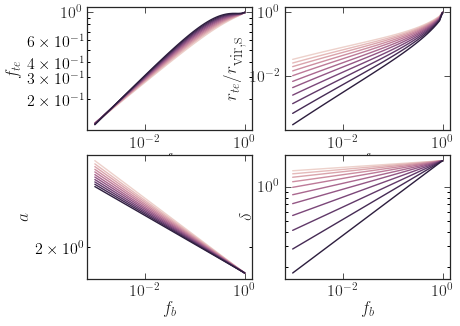

In [166]:
##FIGURE FOR PAPER ##

fig, ax = plt.subplots(nrows=2,ncols=2,figsize=(13./2., 5))
for i in range(0,2):
    for j in range(0,2):
        ax[i,j].yaxis.set_ticks_position('both')
        ax[i,j].xaxis.set_ticks_position('both')
        ax[i,j].tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)
        ax[i,j].loglog()

stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v43(fbcs, fp_v43_all_noweight)
    ax[0,0].plot(fbvals, pvs[:,0], label=cs, color=stacked_cols[i])
#plt.legend()
ax[0,0].set_xlabel(r'$f_b$')
ax[0,0].set_ylabel(r'$f_{te}$')

for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v43(fbcs, fp_v43_all_noweight)
    ax[0,1].plot(fbvals, pvs[:,2] / cs, label=cs, color=stacked_cols[i])
#plt.legend()
ax[0,1].set_xlabel(r'$f_b$')
ax[0,1].set_ylabel(r'$r_{te} / r_\textrm{vir,s}$')

for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v43(fbcs, fp_v43_all_noweight)
    ax[1,0].plot(fbvals, pvs[:,3], label=cs, color=stacked_cols[i])
#plt.legend()
ax[1,0].set_xlabel(r'$f_b$')
ax[1,0].set_ylabel(r'$a$')

for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v43(fbcs, fp_v43_all_noweight)
    ax[1,1].plot(fbvals, pvs[:,4], label=cs, color=stacked_cols[i])
#plt.legend()
ax[1,1].set_xlabel(r'$f_b$')
ax[1,1].set_ylabel(r'$\delta$')

#Generate the same plots for a, delta, only put a legend in one of them and make it a 2x2 plot

Text(0, 0.5, '$\\delta$')

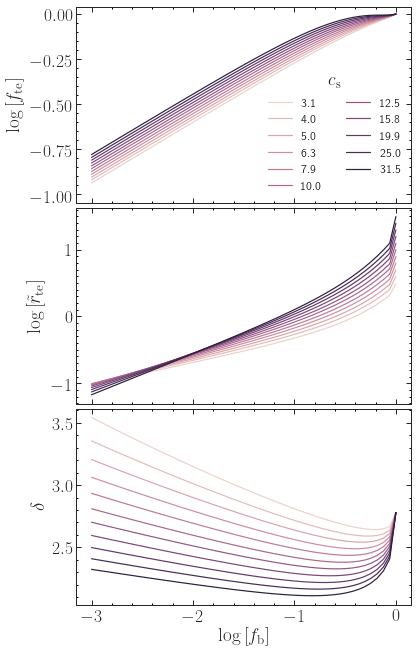

In [52]:


fig, ax = plt.subplots(nrows=3,ncols=1,figsize=(6,11), sharex=True, gridspec_kw={'hspace':0.025})#(7.5, 5.77))
for i in range(0,3):
    ax[i].yaxis.set_ticks_position('both')
    ax[i].xaxis.set_ticks_position('both')
    ax[i].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
    ax[i].xaxis.set_minor_locator(MultipleLocator(0.2))
    #if(i==2):
    #    ax[i].semilogx()
    #else:
    #    ax[i].loglog()
ax[0].yaxis.set_minor_locator(MultipleLocator(0.05))
ax[1].yaxis.set_minor_locator(MultipleLocator(0.1))
ax[2].yaxis.set_minor_locator(MultipleLocator(0.1))
            
pfunc = paramet_hayashi_deluxe_v52#paramet_plexp_v2#paramet_hayashi_deluxe_v43
parms = fp_v52_avgnfw_no1Rv_all#fp_plexp_v2_avgnfw_no1Rv_all#fp_v43_avgnfw_no1Rv_all

# this shows why we need to use the priors that I've set...
# so we will try v48 a bit more but with the priors to see if that looks better...

stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = pfunc(fbcs, parms)
    ax[0].plot(np.log10(fbvals), np.log10(pvs[:,0]), label=cs, color=stacked_cols[i])
l = ax[0].legend(title=r'$c_\mathrm{s}$', ncol=2, fontsize=12,frameon=False)
ax[0].get_legend().get_title().set_fontsize('18')
l.set_zorder(20)
#ax[0].set_xlabel(r'$f_\mathrm{b}$')
ax[0].set_ylabel(r'$\log\Big[f_\mathrm{te}\Big]$')
ax[0].set_ylim(np.log10(0.09),np.log10(1.1))

for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = pfunc(fbcs, parms)
    ax[1].plot(np.log10(fbvals), np.log10(pvs[:,2]), label=cs, color=stacked_cols[i])
#ax[1].set_xlabel(r'$f_\mathrm{b}$')
ax[1].set_ylabel(r'$\log\Big[\tilde{r}_\mathrm{te}\Big]$')

#ax[1,0].semilogx()
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = pfunc(fbcs, parms)
    ax[2].plot(np.log10(fbvals), pvs[:,3], label=cs, color=stacked_cols[i])
#plt.legend()
ax[2].set_xlabel(r'$\log\Big[f_\mathrm{b}\Big]$')
ax[2].set_ylabel(r'$\delta$')

#for i,cs in enumerate(cs_vals):
#    fbvals = np.logspace(-3,0.,50)
#    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
#    pvs = pfunc(fbcs, parms)
#    ax[1,1].plot(fbvals, pvs[:,4], label=cs, color=stacked_cols[i])
#plt.legend()
#ax[1,1].set_xlabel(r'$f_\mathrm{b}$')
#ax[1,1].set_ylabel(r'$\delta$')
#plt.savefig(fig_dir/'model_param_forms.pdf', bbox_inches='tight')

Text(0, 0.5, '$\\mu$')

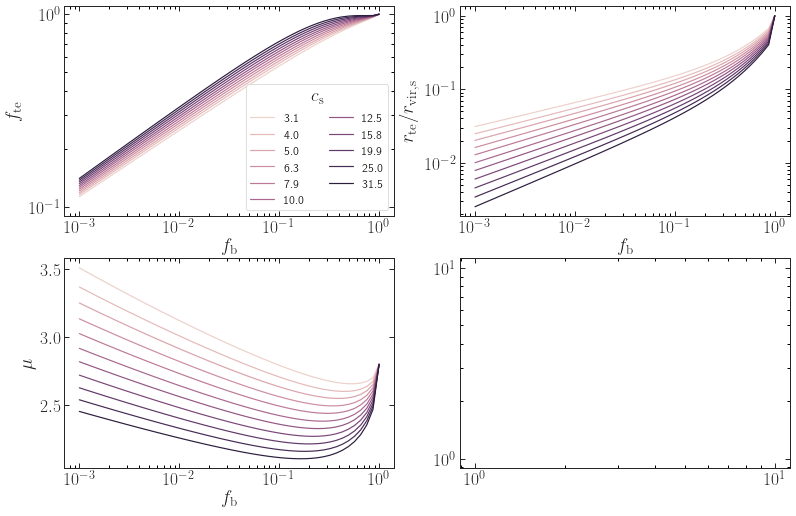

In [254]:
fig, ax = plt.subplots(nrows=2,ncols=2,figsize=(13,8.5))#(7.5, 5.77))
for i in range(0,2):
    for j in range(0,2):
        ax[i,j].yaxis.set_ticks_position('both')
        ax[i,j].xaxis.set_ticks_position('both')
        ax[i,j].tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)
        if(i==1 and j==0):
            ax[i,j].semilogx()
        else:
            ax[i,j].loglog()
            
            
pfunc = paramet_hayashi_deluxe_v52#paramet_plexp_v2#paramet_hayashi_deluxe_v43
parms = fp_v52_avgnfw_no1Rv_subset#fp_plexp_v2_avgnfw_no1Rv_all#fp_v43_avgnfw_no1Rv_all

# this shows why we need to use the priors that I've set...
# so we will try v48 a bit more but with the priors to see if that looks better...

stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = pfunc(fbcs, parms)
    ax[0,0].plot(fbvals, pvs[:,0], label=cs, color=stacked_cols[i])
l = ax[0,0].legend(title=r'$c_\mathrm{s}$', ncol=2, fontsize=12)
ax[0,0].get_legend().get_title().set_fontsize('18')
l.set_zorder(20)
ax[0,0].set_xlabel(r'$f_\mathrm{b}$')
ax[0,0].set_ylabel(r'$f_\mathrm{te}$')
ax[0,0].set_ylim(0.09,1.1)

for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = pfunc(fbcs, parms)
    ax[0,1].plot(fbvals, pvs[:,2] / cs, label=cs, color=stacked_cols[i])
ax[0,1].set_xlabel(r'$f_\mathrm{b}$')
ax[0,1].set_ylabel(r'$r_\mathrm{te} / r_\mathrm{vir,s}$')

#ax[1,0].semilogx()
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = pfunc(fbcs, parms)
    ax[1,0].plot(fbvals, pvs[:,3], label=cs, color=stacked_cols[i])
#plt.legend()
ax[1,0].set_xlabel(r'$f_\mathrm{b}$')
ax[1,0].set_ylabel(r'$\mu$')

#for i,cs in enumerate(cs_vals):
#    fbvals = np.logspace(-3,0.,50)
#    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
#    pvs = pfunc(fbcs, parms)
#    ax[1,1].plot(fbvals, pvs[:,4], label=cs, color=stacked_cols[i])
#plt.legend()
#ax[1,1].set_xlabel(r'$f_\mathrm{b}$')
#ax[1,1].set_ylabel(r'$\delta$')
#plt.savefig(fig_dir/'model_param_forms.eps', bbox_inches='tight')

# I think that I might actually stick with the original unless I can get some sort of overall powerlaw prediction?

#TODO: change the axes so that we get the right tick marks and waste less space, try some log and some semilogx

Text(0, 0.5, '$\\mu+\\delta$')

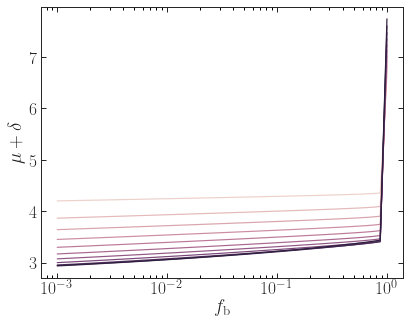

In [235]:
fig,ax = plot(semilogx=True,figsize=(13./2., 5))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = pfunc(fbcs, parms)
    plt.plot(fbvals, pvs[:,3]+pvs[:,4], label=cs, color=stacked_cols[i])
plt.xlabel(r'$f_\mathrm{b}$')
plt.ylabel(r'$\mu+\delta$')
#plt.savefig(fig_dir/'mu_plus_delta_form.eps', bbox_inches='tight')

/home/sbg/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_ylim(*args, **kwargs)


(1.2432309548381997e-08, 1.5)

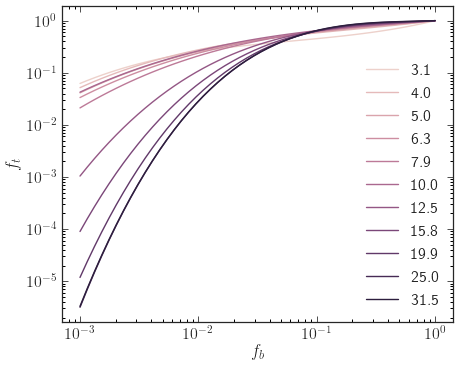

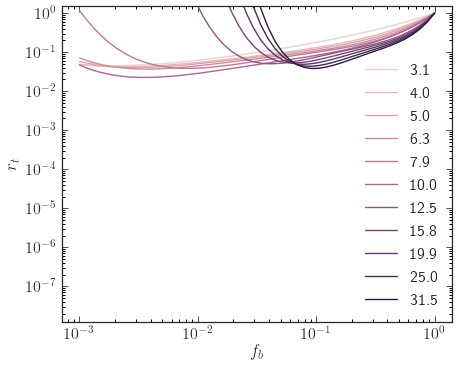

In [1456]:
fp_vals = []
for i in range(0,11):
    fp_vals.append(eval("fp_v27_cs"+str(i)))

fp_vals = np.array(fp_vals)

fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v27_cs(fbcs, fp_vals[i,:])
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,0]) / (0.11028*(cs/10)**-0.43754 * et -.10765*(cs/10)**0.574 *et**2 - .0019976*(cs/10)**-.9973 * (et)**3), label=cs, color=stacked_cols[i]) #this is vs. f_t
    plt.plot(fbvals, pvs[:,0], label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$f_t$')

fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v27_cs(fbcs, fp_vals[i,:])
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,2] / cs), label=cs, color=stacked_cols[i])
    plt.plot(fbvals, pvs[:,2] / cs, label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t$')
plt.ylim(-2,1.5)

#TODO: Figure out why some c_s values prefer basic power laws

#NEW PLOT IDEA: look at ft(c_s = x) / ft(c_s=3.1)
#same for rt
#see if we can fit a power law to the data...?

#should we also try this with a polynomial expansion, which would be less plagued by these strange double/single power law behaviors?

In [1443]:
fp_vals.shape

(11, 8)

/home/sbg/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_ylim(*args, **kwargs)


(0.0030610429686728905, 1.5)

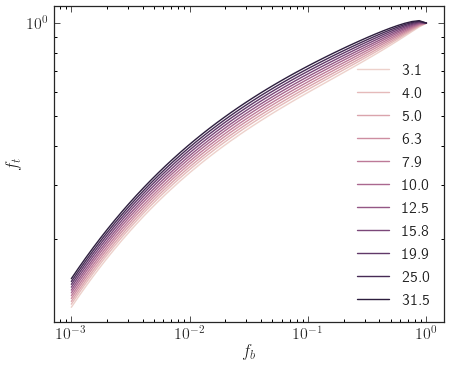

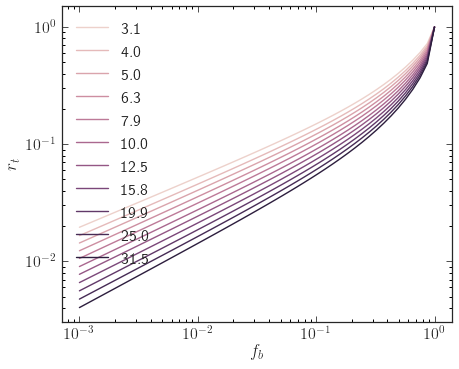

In [1663]:
fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v42(fbcs, fp_v42_subset_noweight)
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,0]) / (0.11028*(cs/10)**-0.43754 * et -.10765*(cs/10)**0.574 *et**2 - .0019976*(cs/10)**-.9973 * (et)**3), label=cs, color=stacked_cols[i]) #this is vs. f_t
    plt.plot(fbvals, pvs[:,0], label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$f_t$')

fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v42(fbcs, fp_v42_subset_noweight)
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,2] / cs), label=cs, color=stacked_cols[i])
    plt.plot(fbvals, pvs[:,2] / cs, label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t$')
plt.ylim(-2,1.5)

/home/sbg/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_ylim(*args, **kwargs)


(0.00019591558730753286, 1.5)

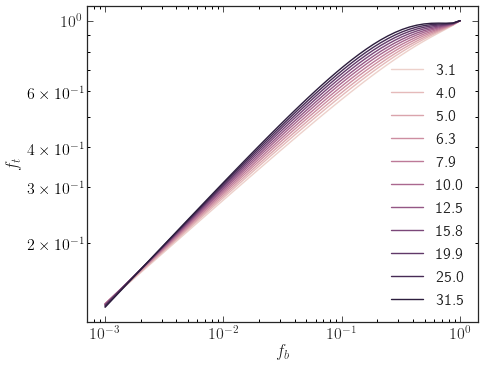

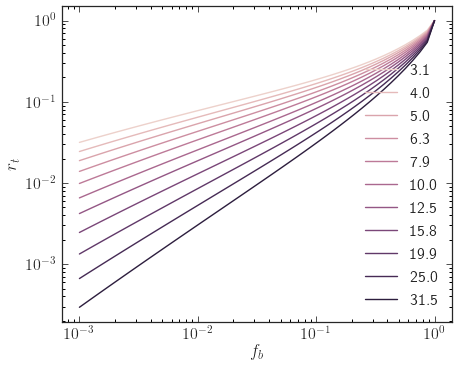

In [1658]:
fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v40(fbcs, fp_v40_subset_noweight)
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,0]) / (0.11028*(cs/10)**-0.43754 * et -.10765*(cs/10)**0.574 *et**2 - .0019976*(cs/10)**-.9973 * (et)**3), label=cs, color=stacked_cols[i]) #this is vs. f_t
    plt.plot(fbvals, pvs[:,0], label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$f_t$')

fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v40(fbcs, fp_v40_subset_noweight)
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,2] / cs), label=cs, color=stacked_cols[i])
    plt.plot(fbvals, pvs[:,2] / cs, label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t$')
plt.ylim(-2,1.5)

/home/sbg/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_ylim(*args, **kwargs)


(0.0009647465856139409, 1.5)

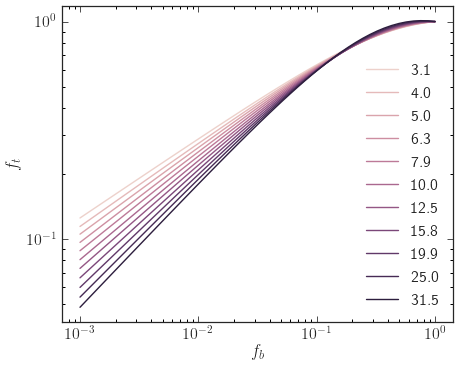

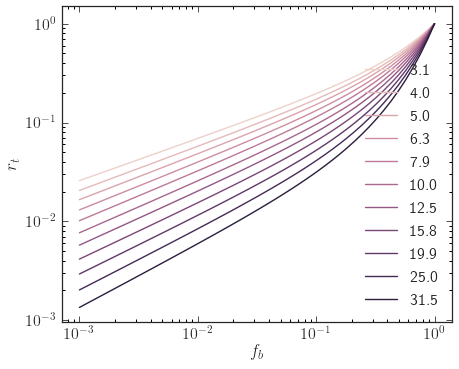

In [1643]:
fp_unweight_doublepowerlaw_v21, paramet_hayashi_deluxe_v21

fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v31(fbcs, fp_v31_subset_noweight)
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,0]) / (0.11028*(cs/10)**-0.43754 * et -.10765*(cs/10)**0.574 *et**2 - .0019976*(cs/10)**-.9973 * (et)**3), label=cs, color=stacked_cols[i]) #this is vs. f_t
    plt.plot(fbvals, pvs[:,0], label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$f_t$')

fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v31(fbcs, fp_v31_subset_noweight)
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,2] / cs), label=cs, color=stacked_cols[i])
    plt.plot(fbvals, pvs[:,2] / cs, label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t$')
plt.ylim(-2,1.5)

/home/sbg/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_ylim(*args, **kwargs)


(0.010272090489053889, 1.5)

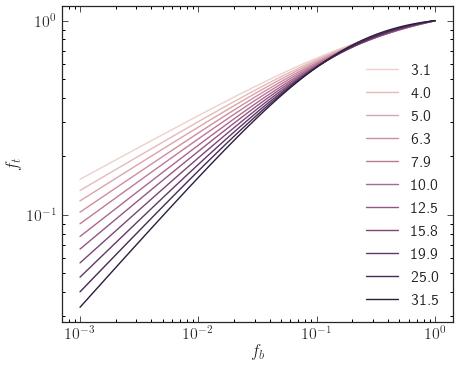

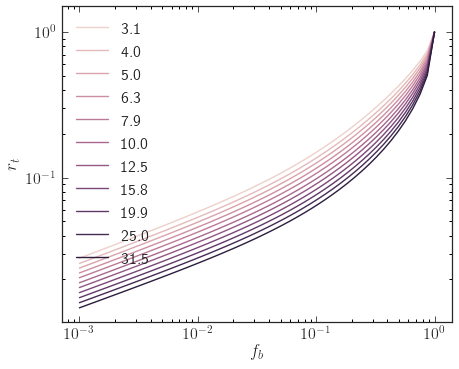

In [911]:
fp_unweight_doublepowerlaw_v21, paramet_hayashi_deluxe_v21

fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v25(fbcs, fp_unweight_v25)
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,0]) / (0.11028*(cs/10)**-0.43754 * et -.10765*(cs/10)**0.574 *et**2 - .0019976*(cs/10)**-.9973 * (et)**3), label=cs, color=stacked_cols[i]) #this is vs. f_t
    plt.plot(fbvals, pvs[:,0], label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$f_t$')

fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v25(fbcs, fp_unweight_v25)
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,2] / cs), label=cs, color=stacked_cols[i])
    plt.plot(fbvals, pvs[:,2] / cs, label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t$')
plt.ylim(-2,1.5)

/home/sbg/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ret = ax.set_ylim(*args, **kwargs)


(1.2248131624957627e-06, 1.5)

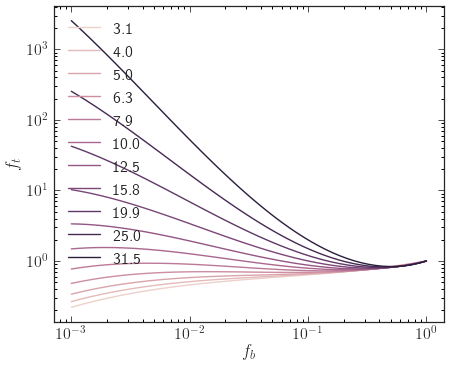

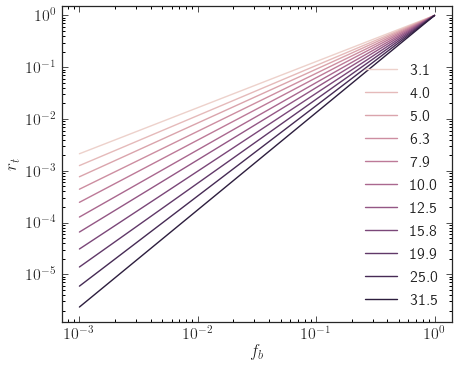

In [803]:
fp_unweight_rtpowerlaw_3ft, paramet_hayashi_deluxe_v19

fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v20(fbcs, fp_unweight_rtpowerlaw_3ft_v14)
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,0]) / (0.11028*(cs/10)**-0.43754 * et -.10765*(cs/10)**0.574 *et**2 - .0019976*(cs/10)**-.9973 * (et)**3), label=cs, color=stacked_cols[i]) #this is vs. f_t
    plt.plot(fbvals, pvs[:,0], label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$f_t$')

fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v20(fbcs, fp_unweight_rtpowerlaw_3ft_v14)
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,2] / cs), label=cs, color=stacked_cols[i])
    plt.plot(fbvals, pvs[:,2] / cs, label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t$')
plt.ylim(-2,1.5)

(-2, 1.5)

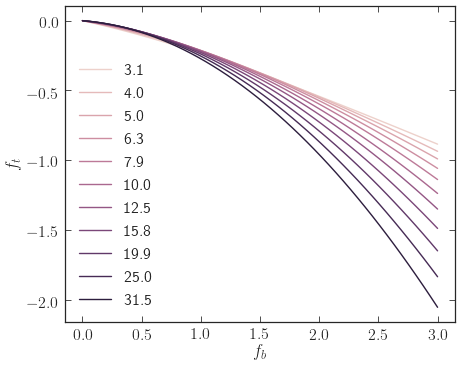

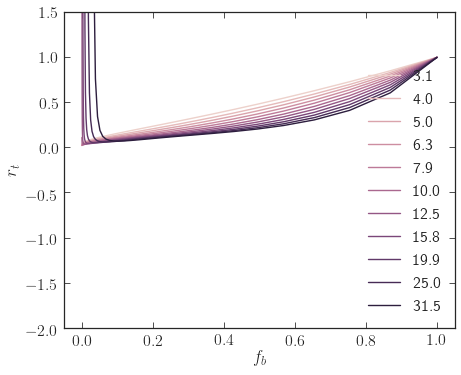

In [773]:
fig,ax = plot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v14(fbcs, fp_unweight_4rt_3ft_freedelta_log1_fixedrads)
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,0]) / (0.11028*(cs/10)**-0.43754 * et -.10765*(cs/10)**0.574 *et**2 - .0019976*(cs/10)**-.9973 * (et)**3), label=cs, color=stacked_cols[i]) #this is vs. f_t
    plt.plot(np.abs(et), np.log10(pvs[:,0]), label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$f_t$')

fig,ax = plot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v14(fbcs, fp_unweight_4rt_3ft_freedelta_log1_fixedrads)
    et = np.log10(fbvals)
    #plt.plot(np.abs(et), np.log10(pvs[:,2] / cs), label=cs, color=stacked_cols[i])
    plt.plot(fbvals, pvs[:,2] / cs, label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t$')
plt.ylim(-2,1.5)

(-2, 1.5)

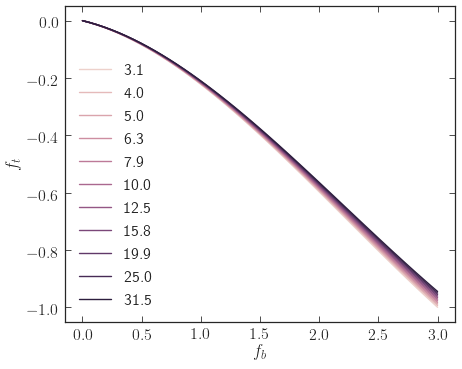

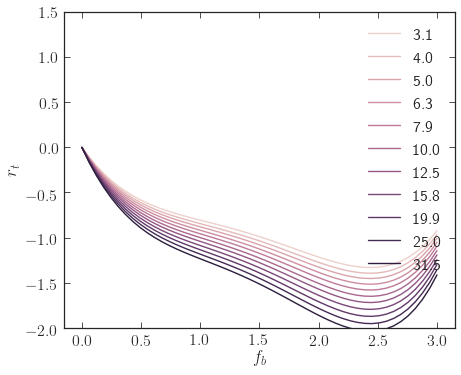

In [739]:
fig,ax = plot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v18(fbcs, fp_unweight_4rt_3ft_freedelta_log1_cspulledrtft_fixedrads)
    et = np.log10(fbvals)
    plt.plot(np.abs(et), np.log10(pvs[:,0]), label=cs, color=stacked_cols[i]) #this is vs. f_t
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$f_t$')

fig,ax = plot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v18(fbcs, fp_unweight_4rt_3ft_freedelta_log1_cspulledrtft_fixedrads)
    et = np.log10(fbvals)
    plt.plot(np.abs(et), np.log10(pvs[:,2] / cs), label=cs, color=stacked_cols[i])
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t$')
plt.ylim(-2,1.5)

[ 0.14591604 -0.88243868  0.13408199]
[ 0.14651278 -0.8931505   0.14754163]
[ 0.1390377  -0.88572885  0.15486308]
[ 0.13344266 -0.88716945  0.16760764]
[ 0.16427131 -0.97229554  0.2095469 ]
[ 0.33265514 -1.34762148  0.34516804]
[ 0.8358271  -2.38806073  0.68307509]
[ 2.23159856 -5.14105083  1.53001201]
[  5.55191467 -11.46133407   3.41042307]
[ 12.9179329  -25.09291569   7.37538271]
[ 28.98768877 -54.1416098   15.68543896]


Text(0, 0.5, '$r_t / r_{vir}$')

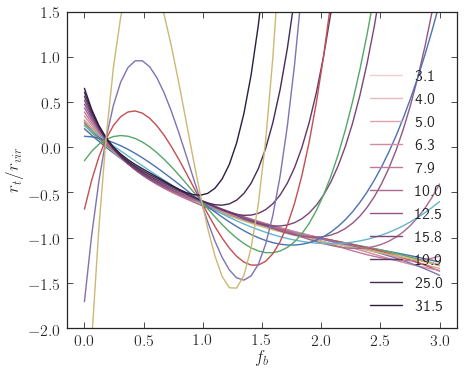

In [530]:
fig,ax = plot()#loglogplot()
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v14(fbcs, fp_unweight_4rt_3ft_freedelta_log1)
    #plt.plot(fbvals, pvs[:,2] / cs * (cs)**0.438, label=cs, color=stacked_cols[i]) #this is vs. r_t
    et = np.abs(np.log10(fbvals))
    print(np.polyfit(et, np.log10(pvs[:,2] / cs* cs**0.438), 2))
    #plt.plot(et, np.log10(pvs[:,2] / cs * cs**0.438 / (et / (1+et))), label=cs, color=stacked_cols[i])
    plt.plot(et, np.log10(pvs[:,2] / cs * cs**0.438), label=cs, color=stacked_cols[i])
    plt.plot(et, np.poly1d(np.polyfit(et, np.log10(pvs[:,2] / cs * cs**0.438), 3))(et))
plt.legend()
plt.ylim(-2, 1.5)
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t / r_{vir}$')

#need it to go to cs^-0.5 at large values of log(fb) i.e. low fb...
#1 / (1 + cs^0.5 * )

Text(0, 0.5, '$\\delta$')

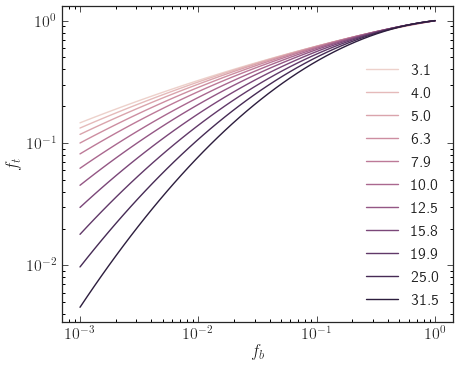

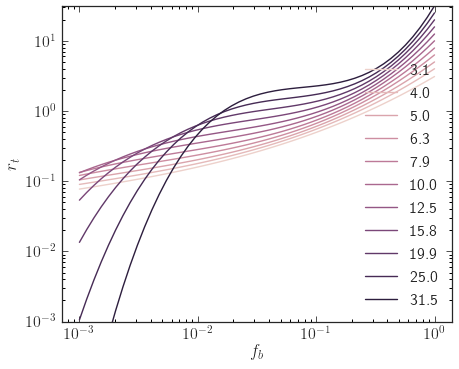

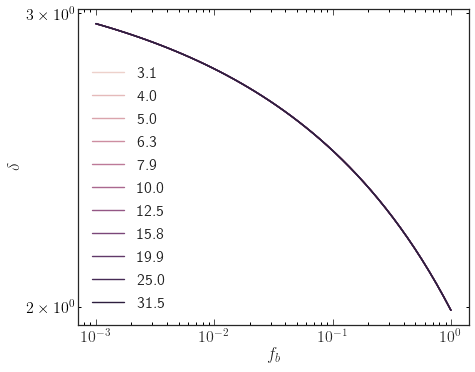

In [494]:
fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))

#SLOPE OF 2.3

for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v5(fbcs, fp_weights_3rt_freedelta_fbdep)
    plt.plot(fbvals, pvs[:,0], label=cs, color=stacked_cols[i]) #this is vs. f_t
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$f_t$')

fig,ax = loglogplot()
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v5(fbcs, fp_weights_3rt_freedelta_fbdep)
    plt.plot(fbvals, pvs[:,2], label=cs, color=stacked_cols[i]) #this is vs. r_t
plt.legend()
plt.ylim(10**-3,31)
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t$')

fig,ax = loglogplot()
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v5(fbcs, fp_weights_3rt_freedelta_fbdep)
    plt.plot(fbvals, pvs[:,3], label=cs, color=stacked_cols[i]) #this is vs. r_t
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$\delta$')

Text(0, 0.5, '$\\delta$')

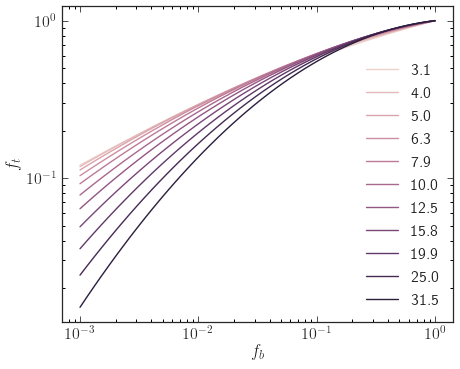

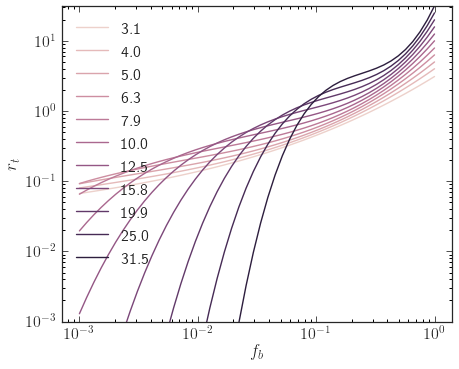

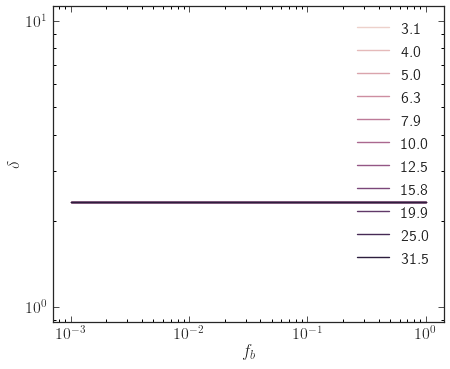

In [78]:
fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))

#SLOPE OF 2.3

for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v4(fbcs, fp_unweight_3rt_freedelta)
    plt.plot(fbvals, pvs[:,0], label=cs, color=stacked_cols[i]) #this is vs. f_t
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$f_t$')

fig,ax = loglogplot()
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v4(fbcs, fp_unweight_3rt_freedelta)
    plt.plot(fbvals, pvs[:,2], label=cs, color=stacked_cols[i]) #this is vs. r_t
plt.legend()
plt.ylim(10**-3,31)
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t$')

fig,ax = loglogplot()
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v4(fbcs, fp_unweight_3rt_freedelta)
    plt.plot(fbvals, pvs[:,3], label=cs, color=stacked_cols[i]) #this is vs. r_t
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$\delta$')

Text(0, 0.5, '$\\delta$')

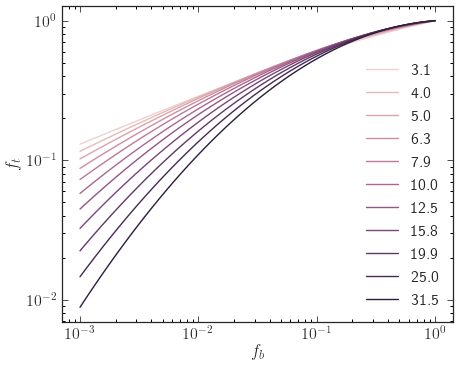

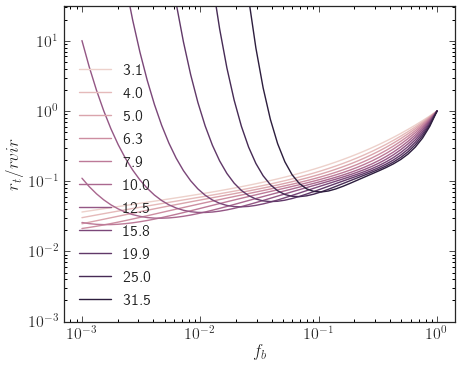

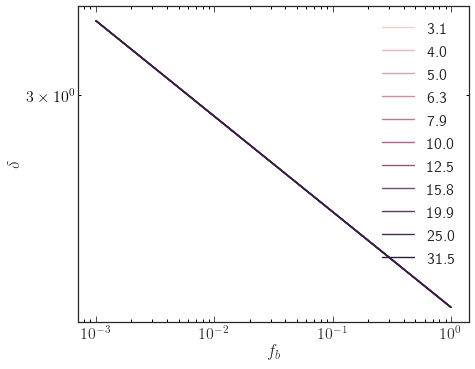

In [799]:
fig,ax = loglogplot()
stacked_cols = sns.cubehelix_palette(len(cs_vals))
fp_unweight_4rt_3ft_freedelta_log1, paramet_hayashi_deluxe_v14, hayashi_deluxe
#SLOPE OF 2.3

#use the best fitting model to try to figure out how the parametrization of ft, rt works...

for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v14(fbcs, fp_unweight_4rt_3ft_freedelta_log1_fixedrads)
    plt.plot(fbvals, pvs[:,0], label=cs, color=stacked_cols[i]) #this is vs. f_t
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$f_t$')

fig,ax = loglogplot()
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v14(fbcs, fp_unweight_4rt_3ft_freedelta_log1_fixedrads)
    plt.plot(fbvals, pvs[:,2] / fbcs[:,1], label=cs, color=stacked_cols[i]) #this is vs. r_t
plt.legend()
plt.ylim(10**-3,31)
plt.xlabel(r'$f_b$')
plt.ylabel(r'$r_t / r{vir}$')

fig,ax = loglogplot()
for i,cs in enumerate(cs_vals):
    fbvals = np.logspace(-3,0.,50)
    fbcs = np.column_stack((fbvals,np.repeat(cs,len(fbvals))))
    pvs = paramet_hayashi_deluxe_v14(fbcs, fp_unweight_4rt_3ft_freedelta_log1_fixedrads)
    plt.plot(fbvals, pvs[:,3], label=cs, color=stacked_cols[i]) #this is vs. r_t
plt.legend()
plt.xlabel(r'$f_b$')
plt.ylabel(r'$\delta$')

In [272]:
#these are trained only on the 10% dataset right now, full radii though

#perhaps some slight evolution in delta would be helpful...
#also can try some freedom in ft, rt but frank probably won't like that
print(cost(fp_weights_3rt_freedelta, paramet_hayashi_deluxe_v4, hayashi_deluxe, False, False)) #would like to write as a power law
####OUR TWO BEST MODELS #####
print(cost(fp_unweight_3rt_freedelta, paramet_hayashi_deluxe_v4, hayashi_deluxe, False, False))
print(cost(fp_weights_3rt_freedelta_fbdep, paramet_hayashi_deluxe_v5, hayashi_deluxe, False, False))
####OUR TWO BEST MODELS ####
print(cost(fp_unweight_3rt_freedelta_fbdep, paramet_hayashi_deluxe_v5, hayashi_deluxe, False, False)) #BAD
print(cost(fp_unweight_2rt_freedelta, paramet_hayashi_deluxe_v6, hayashi_deluxe, False, False))
print(cost(fp_weights_2rt_freedelta, paramet_hayashi_deluxe_v6, hayashi_deluxe, False, False)) #these two one DOF in delta..
print(cost(fp_weights_2rt_freedelta_fbdep, paramet_hayashi_deluxe_v7, hayashi_deluxe, False, False))
print(cost(fp_unweight_2rt_freedelta_fbdep, paramet_hayashi_deluxe_v7, hayashi_deluxe, False, False))
print(cost(fp_unweight_2rt_freedelta_freeftrt_hay, paramet_hayashi_deluxe_v8, rho_model_hayashi, False, False))
print(cost(fp_weight_2rt_freedelta_freeftrt_hay, paramet_hayashi_deluxe_v8, rho_model_hayashi, False, False))
print(cost(fp_unweight_3rt_freedelta_log, paramet_hayashi_deluxe_v9, hayashi_deluxe, False, False))
print(cost(fp_unweight_3rt_freedelta_log_FULL, paramet_hayashi_deluxe_v9, hayashi_deluxe, False, False))
print(cost(fp_weights_3rt_freedelta_log, paramet_hayashi_deluxe_v9, hayashi_deluxe, False, False))

#what needs to be done in order to accurately capture the fact that the low fb is still not captured properly?

#in the unweighted case, adding the extra params doesn't make much of a difference

#but in the weighted case, adding the extra fb params does make a difference...

314073.00814770063
256809.0856450596
284622.4852985258
251923.51906430034
306005.51397664857
459436.1806089247
435770.18065044266
296792.64290692715
305236.9843697055
394798.68830370106
251894.9647532269
251615.86543391907
287325.58973741625


In [1593]:
print(cost(fp_unweight_3rt_freedelta_log_cs, paramet_hayashi_deluxe_v10, hayashi_deluxe, False, False))
print(cost(fp_weight_3rt_freedelta_log_cs, paramet_hayashi_deluxe_v10, hayashi_deluxe, False, False))
print(cost(fp_unweight_3rt_freedelta_log2_FULL, paramet_hayashi_deluxe_v11, hayashi_deluxe, False, False))
print(cost(fp_unweight_3rt_3ft_freedelta_log, paramet_hayashi_deluxe_v12, hayashi_deluxe, False, False))
print(cost(fp_unweight_4rt_2ft_freedelta_log, paramet_hayashi_deluxe_v13, hayashi_deluxe, False, False))
print(cost(fp_unweight_4rt_3ft_freedelta_log1, paramet_hayashi_deluxe_v14, hayashi_deluxe, False, False))
print(cost(fp_unweight_4rt_3ft_freedelta_log1_fixedrads, paramet_hayashi_deluxe_v14, hayashi_deluxe, False, False))
print(cost(fp_unweight_4rt_3ft_freedelta_log2, paramet_hayashi_deluxe_v15, hayashi_deluxe, False, False))
print(cost(fp_unweight_5rt_3ft_freedelta_log1, paramet_hayashi_deluxe_v16, hayashi_deluxe, False, False))
print(cost(fp_unweight_4rt_3ft_freedelta_log1_cspulledrt, paramet_hayashi_deluxe_v17, hayashi_deluxe, False, False))
print(cost(fp_unweight_4rt_3ft_freedelta_log1_cspulledrtft, paramet_hayashi_deluxe_v18, hayashi_deluxe, False, False))
print(cost(fp_unweight_4rt_3ft_freedelta_log1_cspulledrtft_fixedrads, paramet_hayashi_deluxe_v18, hayashi_deluxe, False, False))

print(cost(fp_weights_4rt_3ft_freedelta_log1_cspulledrtft, paramet_hayashi_deluxe_v18, hayashi_deluxe, False, False))
print(cost(fp_weights_4rt_3ft_freedelta_log1, paramet_hayashi_deluxe_v14, hayashi_deluxe, False, False))


188078.4454642933
226253.73947755428
187787.73329838013
186915.5450502301
188112.74318739458
175689.34445686525
200035.7254794788
175534.38082005724
175614.26017795267
186089.61444811418
186089.73440984118
209816.52800654262
230071.86177170603
187033.74196391797


In [1589]:
print(cost(fp_unweight_rtpowerlaw_3ft, paramet_hayashi_deluxe_v19, hayashi_deluxe, False, False))
print(cost(fp_unweight_doublepowerlaw_v21, paramet_hayashi_deluxe_v21, hayashi_deluxe, False, False))
print(cost(fp_weights_doublepowerlaw_v21, paramet_hayashi_deluxe_v21, hayashi_deluxe, False, False))
print(cost(fp_unweight_v24, paramet_hayashi_deluxe_v24, hayashi_deluxe, False, False))
print(cost(fp_unweight_v25, paramet_hayashi_deluxe_v25, hayashi_deluxe, False, False))
print(cost(fp_unweight_v25_outer_rads, paramet_hayashi_deluxe_v25, hayashi_deluxe, False, False))
print(cost(fp_weights_v25, paramet_hayashi_deluxe_v25, hayashi_deluxe, False, False))
#how is this so high? clearly bad... what's going wrong!?

#TODO: figure out why the code was saying this had 25k, and now it's clearly much worse

361672.3981088276
183592.11171332438
234317.4274571402
194823.87147719244
169279.79996024768
168427.52476591934
201693.88460510512


In [1666]:
print(cost(fp_v29_subset_noweight, paramet_hayashi_deluxe_v29, hayashi_deluxe_deluxe, False, False))
print(cost(fp_v30_subset_noweight, paramet_hayashi_deluxe_v30, hayashi_deluxe_deluxe, False, False))
print(cost(fp_v31_subset_noweight, paramet_hayashi_deluxe_v31, hayashi_deluxe_deluxe, False, False))
print(cost(fp_v32_subset_noweight, paramet_hayashi_deluxe_v32, hayashi_deluxe_deluxe, False, False))

174048.45767969018
171656.6962064901
166409.18426070816
164539.0196149472


In [1672]:
print(cost(fp_v39_subset_noweight, paramet_hayashi_deluxe_v39, hayashi_deluxe_deluxe, False, False))
print(cost(fp_v40_subset_noweight, paramet_hayashi_deluxe_v40, hayashi_deluxe_deluxe, False, False))
#print(cost(fp_v41_subset_noweight, paramet_hayashi_deluxe_v41, hayashi_deluxe_deluxe, False, False))
print(cost(fp_v43_all_noweight, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, False, False))

inf
164620.2182977553
164596.9832331302


C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning: divide by zero encountered in true_divide
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


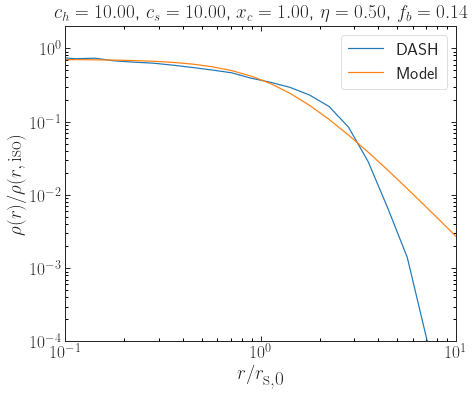

In [477]:
plot_rho_vs_model(5, 5, 5, 5, 150, fp_v43_avgnfw_no1Rv, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe,by_iso=True)

In [431]:
#make code that allows us to plot a specific simulation at a specific time point and generate the model
#for this same time point and plot them together

def plot_rho_vs_model(ch_num, cs_num, xc_num, eta_num, snapnum, fp, model_param_func, rho_model,by_iso=False):
    direct = dash_root / ch_dirs[ch_num] / cs_dirs[cs_num] / xc_dirs[xc_num] / eta_dirs[eta_num]
    pf_fn = direct / 'radprof_rho.txt'
    sh_evo_fn = direct / 'subhalo_evo.txt'
    if(Path(pf_fn).is_file()):
        sim_dat = load_sim(direct,cs_num,False,normalize=True, by_iso=by_iso) #keep all timesteps
        
        #generate model, takes as input r/rs0
        rho_m = rho_fit(radii * cs_vals[cs_num], np.array([sim_dat[snapnum,0]]), np.array([cs_vals[cs_num]]), fp, model_param_func, rho_model)
        fig, ax = loglogplot()
        plt.xlabel(r'$r/r_\textrm{s,0}$')
        plt.ylabel(r'$\rho(r) / \rho(r,\textrm{iso})$')
        plt.plot(radii * cs_vals[cs_num], sim_dat[snapnum,1:], label='DASH')
        plt.plot(radii * cs_vals[cs_num], rho_m, label='Model')
        plt.legend()
        plt.title('$c_h = %.2f$, $c_s = %.2f$, $x_c = %.2f$, $\eta = %.2f$, $f_b = %.2f$' % (ch_vals[ch_num], cs_vals[cs_num], xc_vals[xc_num], eta_vals[eta_num], sim_dat[snapnum,0]))
        plt.xlim(radii[0]* cs_vals[cs_num], 1.* cs_vals[cs_num])
        plt.ylim(10**-4, 2.)
        
    else:
        print("No simulation run here yet!")

In [68]:
def plot_resids(fp, param_func, model_func, chi=False):
    resids = cost_dist(fp, param_func, model_func, chi)#[np.logical_and(dat_for_fit[:,4] >=0.05, dat_for_fit[:,4]<=0.1)]
    dist_means = np.zeros(n_prof_pts)
    dist_low16 = np.zeros(n_prof_pts)
    dist_low2 = np.zeros(n_prof_pts)
    dist_high84 = np.zeros(n_prof_pts)
    dist_high97 = np.zeros(n_prof_pts)
    for i in range(0, n_prof_pts):
        dist_means[i] = np.mean(resids[resids[:,i] != 0,i])
        dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
        dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
        dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
        dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]

    print(dist_high84)
    print(dist_means)
    print(dist_low16)
    fig, ax = plot(semilogx=True)
    plt.errorbar(fit_rads, dist_means, yerr=[dist_low16, dist_high84], label = '16/84')
    plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    plt.xlabel(r'$r/r_\textrm{vir,s}$')
    if(chi):
        plt.ylabel(r'$[\log(\textrm{TF}_s) - \log(\textrm{TF}_m)]/ \delta \log(\textrm{TF}_s)$')
    else:
        plt.ylabel(r'$[\log(\textrm{TF}_s) - \log(\textrm{TF}_m)]$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    plt.legend()

Text(0, 0.5, 'mean $1/(\\delta \\log\\rho_s)^2 = \\rho_s \\Delta V$')

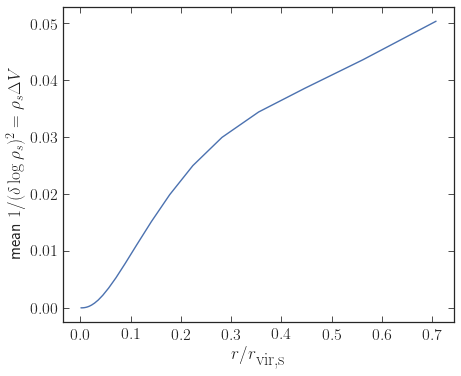

In [39]:
fig, ax = plot()#loglogplot()
plt.plot(radii[:n_prof_pts],np.mean(radii[:n_prof_pts]*unnormed_dat_for_fit * shell_vols[:n_prof_pts],axis=0))
plt.xlabel(r'$r/r_\textrm{vir,s}$')
plt.ylabel(r'mean $1/(\delta \log\rho_s)^2 = \rho_s \Delta V$')

Text(0, 0.5, 'mean $1/(\\delta \\log\\rho_s)^2 = \\rho_s \\Delta V$')

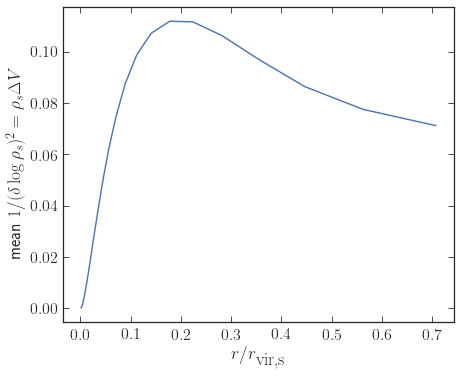

In [40]:
fig, ax = plot()#loglogplot()
plt.plot(radii[:n_prof_pts],np.mean(unnormed_dat_for_fit * shell_vols[:n_prof_pts],axis=0))
plt.xlabel(r'$r/r_\textrm{vir,s}$')
plt.ylabel(r'mean $1/(\delta \log\rho_s)^2 = \rho_s \Delta V$')

In [ ]:
#notes from meeting with Frank on Fri Jan 18

#look at the enclosed mass profile to see what is going on with the zeros and infinities (things are correct)


#know the radii always, know the volume always (DONE)
#assign an error to each data point based sqrt(density * volume) = sqrt(mass) propto sqrt() (DONE)
#squared instead of absoluate value (DONE)
#need delta(log rho_model)^2, see Frank's calculation sqrt(rho*V)**2 (DONE)

#run with the weights set to 1
#try normalizing by the 0th snapshot instead to make sure that it makes no difference...
#different functional forms (set up so that this is easy to do)
#different parametric dependences


#run an MCMC to get the posterior so we can get a posterior as well...
#try using emcee

#want to efficiently and quickly compute the best fit parameters using errors and weights
#then can use emcee


#if weighting matters, then there is a dependence on the orbital parameters (how to know if it ``matters''?)
#talk with Frank about how to verify if it matters: fit parameters will be quite different

#can i make it faster

#how can i assess the accuracy of the model? -- i.e. how to know which model is the best?
#obviously, with cost function variables like errors and weights held fixed, the best model/parametrization is the
#one with the lowest cost function
#but how do we compare the strength of the model with and without the errors/weights in the cost function?

#do we want to throw out radial bins where some clump has been reabsorbed? i.e. for large radii where the density
#begins to increase again? seems to bias and mess up the fitting...

#may want to throw out some of the outer and some of the inner bins...

## Density profile comparison plots

In [392]:
# let's generate the (static) comparisons (residuals) from Hayashi and Penarrubia
fp_hayashi = [-0.007, 0.35, 0.39, 0.23, 1.02, 1.38, 0.37, np.log10(3.), 0., 0.]
hay_resids = cost_dist(fp_hayashi, hayashi_params, rho_model_hayashi, chi=False)
#this throws out the places with infinite error

In [393]:
hay_resids.shape

(599920, 20)

### Calculating Penarrubia's transfer functions

In [77]:
from joblib import Parallel, delayed
from tqdm import tqdm_notebook

# will need to re-run this

def pen_model(a,b):
    return pen_new_prof(r_by_rs[a, b], fb_cs[a,0], fb_cs[a,1]) / \
        gen_form(r_by_rs[a, b], rho0(1., fb_cs[a,1]), 1., 1, 3, 1)

pms = Parallel(n_jobs=8)(delayed(pen_model)(a=i, b=j) for i in tqdm_notebook(range(0, Nsnaps)) for j in range(0, n_prof_pts))

# should we include the fb=1.0 in the error distribution? Should tighten up our error bars

# TODO: re-run making our dat_for_fit with the fb=1.0 added back in

#pen_resids = cost_dist_pen(chi=False)

#plot_resids(None, None, None, pen=True, chi=False)
    
#need to calculate this for every point in dash and get the cost...

In [78]:
pms = np.array(pms).reshape(Nsnaps, n_prof_pts)

In [79]:
np.save('penarrubia_transfer_functions',pms)

### Comparison of our model residuals to Hayashi, Penarrubia

In [389]:
pms = np.load('penarrubia_transfer_functions.npy')

In [390]:
pms.shape
#not sure where the different number of total snapshots came from
#should be able to slice out the relevant radii but need to diff 573295 from 579528...

(599920, 20)

In [391]:
pen_resids = (np.log10(dat_for_fit[:, 5:]) - np.log10(pms))
pen_resids[o_err == 0] = 0

/home/sbg/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.


In [49]:
######### FIGURE FOR PAPER #########
###### TODO: RERUN PENARRUBIA MODELS FOR CURRENT SET OF SNAPS x RADS #####

#now we've got our penarrubia model, let's look at the distribution
def model_compare_resids(fp, param_func, model_func):
    model_resids = cost_dist(fp, param_func, model_func, chi=False)
    labs = ['This work', 'Pe{\~ n}arrubia+2010', 'Hayashi+2003']
    ls = ['solid', 'dashed', 'dotted']
    cls = ['b', 'k', 'r']
    fig, ax = plot(semilogx=True)
    #cols = sns.cubehelix_palette(3)
    for num,resids in enumerate([model_resids, pen_resids, hay_resids]):
        resids = resids * -1.  #switching to model - data
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.mean(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]
    
        (_, caps, _) = ax.errorbar(fit_rads* 10**(0.05*num/3), dist_means, yerr=[dist_low16, dist_high84], fmt='.-', linestyle=ls[num], color=cls[num], label = labs[num], zorder=3-num, capsize=2, markersize=10)
        for cap in caps:
            #cap.set_color(cols[num])
            cap.set_markeredgewidth(1)
    ax.set_xlabel(r'$r/r_\mathrm{vir,s}$')
    ax.set_ylabel(r'$\log(H_\mathrm{m}) - \log(H_\mathrm{s})$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    l = ax.legend(title=r'Model', fontsize=12, frameon=False)
    ax.get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    plt.axhline(0.,color='k')
    plt.savefig(fig_dir/'res_plot_model_compare.eps', bbox_inches='tight')
    return fig,ax

# transfer functions are normalized by bin-avg'd NFW, causing H_s to be larger than if they were normalized by NFW instead
# if we used NFW instead

# Frank may ask us to do this out to Rvir... may as well go ahead and do it

(<Figure size 504x417.6 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f1421cdef98>)

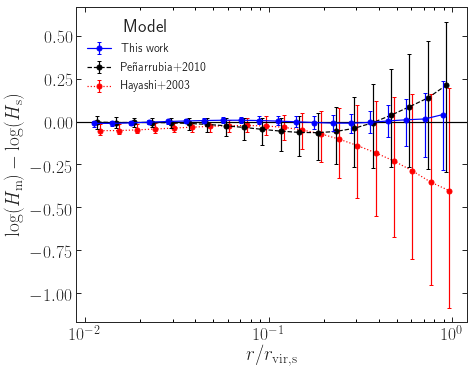

In [50]:
model_compare_resids(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe)

(<Figure size 504x417.6 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x183fbf179e8>)

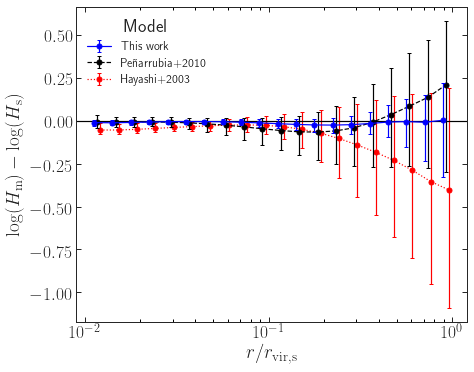

In [53]:
model_compare_resids(fp_v43_newdash_sub, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe)
#### PENDING ####

# so remember that the transfer function is in terms of rho / rho_original
# since both rho and rho_orig are normed by rho200, we're fine when comparing directly to hayashi
# up next, we need to try some of the more simple models...

# the transfer function is relative to either (t=0 or NFW), but Hayashi is relative to NFW
# I wonder which one wil make Hayashi agree with data better

# this hayashi model was originally overpredicting, but now should be in better agreement since
# our profiles are more dense now on order 10%

In [51]:
# let's write some code to plot the model residuals by fb or by cs bin
def plot_resids_by_fb(fp, param_func, model_func, fb_bins=5, logfb_min=-2, logfb_max=0.):
    #loop over and show several fb slices

    fb_bin_edges = np.logspace(logfb_min,logfb_max,fb_bins+1) #ten bins
    fb_bin_centers = 10**((np.log10(fb_bin_edges[1:]) + np.log10(fb_bin_edges[:-1]))*0.5)
    full_resids = cost_dist(fp, param_func, model_func, chi=False)
    fig, ax = plot(semilogx=True)
    for num in range(0,fb_bins):
        resids = full_resids[np.logical_and(dat_for_fit[:,4] > fb_bin_edges[num], dat_for_fit[:,4]<=fb_bin_edges[num+1])]
        print(len(resids))
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.mean(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]



        plt.errorbar(fit_rads, dist_means, yerr=[dist_low16, dist_high84], label = '%.3f to %.3f' %(fb_bin_edges[num], fb_bin_edges[num+1]))
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    plt.xlabel(r'$r/r_\textrm{vir,s}$')
    plt.ylabel(r'$[\log(\textrm{TF}_s) - \log(\textrm{TF}_m)]$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    plt.legend(title=r'$f_b$', loc=3)

In [52]:
def plot_resids_by_cs(fp, param_func, model_func):
    #loop over and show several cs slices
    full_resids = cost_dist(fp, param_func, model_func, chi=False)
    fig, ax = plot(semilogx=True)
    for num in range(0,len(cs_vals)):
        resids = full_resids[dat_for_fit[:,1] == cs_vals[num]]
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.mean(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]



        plt.errorbar(fit_rads, dist_means, yerr=[dist_low16, dist_high84], label = '%.2f' %(cs_vals[num]))
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    plt.xlabel(r'$r/r_\textrm{vir,s}$')
    plt.ylabel(r'$[\log(\textrm{TF}_s) - \log(\textrm{TF}_m)]$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    plt.legend(title=r'$c_s$', loc=2)

In [53]:
def plot_resids_cs(fp, param_func, model_func):
    fig, ax = plot()

    ax.yaxis.set_ticks_position('both')
    ax.xaxis.set_ticks_position('both')
    ax.tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)  
    #now we do cs
    cols = sns.cubehelix_palette(len(cs_vals))
    ax.semilogx()
    full_resids = cost_dist(fp, param_func, model_func, chi=False)
    for num in range(0,len(cs_vals)):
        resids = full_resids[dat_for_fit[:,1] == cs_vals[num]] * -1. #switching to model - data
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.mean(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]



        (_, caps, _) = ax.errorbar(fit_rads* 10**(0.05*num/len(cs_vals)), dist_means, yerr=[dist_low16, dist_high84], color=cols[num], label = '%.1f' %(cs_vals[num]), capsize=2)
        for cap in caps:
            cap.set_color(cols[num])
            cap.set_markeredgewidth(1)
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    ax.set_xlabel(r'$r/r_\mathrm{vir,s}$')
    #ax[1].set_ylabel(r'$\log(H_\textrm{s}) - \log(H_\textrm{m})$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    l = ax.legend(title=r'$c_\mathrm{s}$', loc=3,ncol=2, fontsize=12)
    ax.get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    #plt.savefig(fig_dir/'res_plot_fb_cs.eps', bbox_inches='tight')
    
def plot_resids_ch(fp, param_func, model_func):
    fig, ax = plot()

    ax.yaxis.set_ticks_position('both')
    ax.xaxis.set_ticks_position('both')
    ax.tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)  
    #now we do cs
    cols = sns.cubehelix_palette(len(ch_vals))
    ax.semilogx()
    full_resids = cost_dist(fp, param_func, model_func, chi=False)
    for num in range(0,len(cs_vals)):
        resids = full_resids[dat_for_fit[:,0] == ch_vals[num]] * -1. #switching to model - data
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.mean(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]



        (_, caps, _) = ax.errorbar(fit_rads* 10**(0.05*num/len(ch_vals)), dist_means, yerr=[dist_low16, dist_high84], color=cols[num], label = '%.1f' %(ch_vals[num]), capsize=2)
        for cap in caps:
            cap.set_color(cols[num])
            cap.set_markeredgewidth(1)
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    ax.set_xlabel(r'$r/r_\mathrm{vir,s}$')
    #ax[1].set_ylabel(r'$\log(H_\textrm{s}) - \log(H_\textrm{m})$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    l = ax.legend(title=r'$c_\mathrm{h}$', loc=3,ncol=2, fontsize=12)
    ax.get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    #plt.savefig(fig_dir/'res_plot_fb_cs.eps', bbox_inches='tight')

In [54]:
#TODO: Go out to Rvir instead... may also want to FIT out to Rvir

def plot_resids_fb_cs(fp, param_func, model_func, fb_bins=5, logfb_min=-2, logfb_max=0.):
    fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(13,5))
    ax[0].yaxis.set_ticks_position('both')
    ax[0].xaxis.set_ticks_position('both')
    ax[0].tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)
    ax[1].yaxis.set_ticks_position('both')
    ax[1].xaxis.set_ticks_position('both')
    ax[1].tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)
    ax[0].semilogx()
    #start with fb on the left...
    fb_bin_edges = np.logspace(logfb_min,logfb_max,fb_bins+1)
    fb_bin_centers = 10**((np.log10(fb_bin_edges[1:]) + np.log10(fb_bin_edges[:-1]))*0.5)
    full_resids = cost_dist(fp, param_func, model_func, chi=False)
    cols = sns.cubehelix_palette(fb_bins)
    for num in range(0,fb_bins):
        resids = full_resids[np.logical_and(dat_for_fit[:,4] > fb_bin_edges[num], dat_for_fit[:,4]<=fb_bin_edges[num+1])]
        resids = resids * -1. #switching to model - data
        print(len(resids))
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.mean(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]



        (_, caps, _) = ax[0].errorbar(fit_rads* 10**(0.05*num/fb_bins), dist_means, yerr=[dist_low16, dist_high84], color=cols[num], label = '%.3f to %.3f' %(fb_bin_edges[num], fb_bin_edges[num+1]),zorder=fb_bins-num, capsize=2)
        for cap in caps:
            cap.set_color(cols[num])
            cap.set_markeredgewidth(1)
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    ax[0].set_xlabel(r'$r/r_\mathrm{vir,s}$')
    ax[0].set_ylabel(r'$\log(H_\mathrm{m}) - \log(H_\mathrm{s})$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    ax[0].axhline(0.,color='k')
    l = ax[0].legend(title=r'$f_\mathrm{b}$', loc=2, fontsize=12, frameon=False)
    ax[0].get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    
    #now we do cs
    cols = sns.cubehelix_palette(len(cs_vals))
    ax[1].semilogx()
    for num in range(0,len(cs_vals)):
        resids = full_resids[dat_for_fit[:,1] == cs_vals[num]] * -1. #switching to model - data
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.mean(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]


        #TODO: FIX THE ZORDER
        (_, caps, _) = ax[1].errorbar(fit_rads* 10**(0.05*num/len(cs_vals)), dist_means, yerr=[dist_low16, dist_high84], color=cols[num], label = '%.1f' %(cs_vals[num]), capsize=2)
        for cap in caps:
            cap.set_color(cols[num])
            cap.set_markeredgewidth(1)
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    ax[1].axhline(0.,color='k')
    ax[1].set_xlabel(r'$r/r_\mathrm{vir,s}$')
    #ax[1].set_ylabel(r'$\log(H_\textrm{s}) - \log(H_\textrm{m})$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    l = ax[1].legend(title=r'$c_\mathrm{s}$', loc=2,ncol=2, fontsize=12, frameon=False)
    ax[1].get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    plt.savefig(fig_dir/'res_plot_fb_cs.eps', bbox_inches='tight')

In [55]:
def plot_resids_xc_eta_ch(fp, param_func, model_func):
    fig, ax = plt.subplots(nrows=3,ncols=1,figsize=(6,13))
    ax[0].yaxis.set_ticks_position('both')
    ax[0].xaxis.set_ticks_position('both')
    ax[0].tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)
    ax[1].yaxis.set_ticks_position('both')
    ax[1].xaxis.set_ticks_position('both')
    ax[1].tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)
    ax[2].yaxis.set_ticks_position('both')
    ax[2].xaxis.set_ticks_position('both')
    ax[2].tick_params(axis='both', which='minor', colors='black', width=1.0, length=3.0)
    ax[0].semilogx()
    full_resids = cost_dist(fp, param_func, model_func, chi=False)
    xc1 = 2
    xcf = len(xc_vals) - 1
    cols = sns.cubehelix_palette(xcf - xc1 + 1)
    ax[0].semilogx()
    for num in range(xc1,xcf+1):
        resids = full_resids[dat_for_fit[:,2] == xc_vals[num]] * -1. #switching to model - data
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.mean(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]


        #TODO: FIX THE ZORDER
        (_, caps, _) = ax[0].errorbar(fit_rads* 10**(0.05*num/len(xc_vals)), dist_means, yerr=[dist_low16, dist_high84], color=cols[num-xc1], label = '%.1f' %(xc_vals[num]), capsize=2)
        for cap in caps:
            cap.set_color(cols[num-xc1])
            cap.set_markeredgewidth(1)
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    #ax[0].set_xlabel(r'$r/r_\mathrm{vir,s}$')
    ax[0].set_ylabel(r'$\log(H_\mathrm{m}) - \log(H_\mathrm{s})$')
    ax[0].axhline(0.,color='k')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    l = ax[0].legend(title=r'$x_\mathrm{c}$', loc=2, fontsize=12, frameon=False, ncol=2)
    ax[0].get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    
    #now we do eta
    et1 = 1
    etf = len(eta_vals) - 1
    cols = sns.cubehelix_palette(etf - et1 + 1)
    ax[1].semilogx()
    for num in range(et1,etf+1):
        resids = full_resids[dat_for_fit[:,3] == eta_vals[num]] * -1. #switching to model - data
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.mean(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]


        #TODO: FIX THE ZORDER
        (_, caps, _) = ax[1].errorbar(fit_rads* 10**(0.05*num/len(eta_vals)), dist_means, yerr=[dist_low16, dist_high84], color=cols[num-et1], label = '%.1f' %(eta_vals[num]), capsize=2)
        for cap in caps:
            cap.set_color(cols[num-et1])
            cap.set_markeredgewidth(1)
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    #ax[1].set_xlabel(r'$r/r_\mathrm{vir,s}$')
    ax[1].set_ylabel(r'$\log(H_\mathrm{m}) - \log(H_\mathrm{s})$')
    ax[1].axhline(0.,color='k')
    #ax[1].set_ylabel(r'$\log(H_\textrm{s}) - \log(H_\textrm{m})$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    l = ax[1].legend(title=r'$\eta$', loc=3,ncol=2, fontsize=12, frameon=False)
    ax[1].get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    
    #now we do c_h
    #now we do eta
    ch1 = 0
    chf = len(eta_vals) - 1
    cols = sns.cubehelix_palette(chf - ch1 + 1)
    ax[2].semilogx()
    for num in range(ch1,chf+1):
        resids = full_resids[dat_for_fit[:,0] == ch_vals[num]] * -1. #switching to model - data
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.mean(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]


        #TODO: FIX THE ZORDER
        (_, caps, _) = ax[2].errorbar(fit_rads* 10**(0.05*num/len(ch_vals)), dist_means, yerr=[dist_low16, dist_high84], color=cols[num-ch1], label = '%.1f' %(ch_vals[num]), capsize=2)
        for cap in caps:
            cap.set_color(cols[num-ch1])
            cap.set_markeredgewidth(1)
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    ax[2].set_xlabel(r'$r/r_\mathrm{vir,s}$')
    ax[2].set_ylabel(r'$\log(H_\mathrm{m}) - \log(H_\mathrm{s})$')
    ax[2].axhline(0.,color='k')
    #ax[1].set_ylabel(r'$\log(H_\textrm{s}) - \log(H_\textrm{m})$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    l = ax[2].legend(title=r'$c_\mathrm{h}$', loc=3,ncol=3, fontsize=12, frameon=False)
    ax[2].get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    plt.savefig(fig_dir/'res_plot_xc_eta_ch.eps', bbox_inches='tight')

In [58]:
# plot all of the figures in a 3x2

def plot_resids_all(fp, param_func, model_func, fb_bins=5, logfb_min=-2, logfb_max=0.):
    fig, ax = plt.subplots(nrows=2,ncols=3,figsize=(13,9), sharex=True, sharey=True, gridspec_kw={'wspace':0.05,'hspace':0.075})
    for i in range(0,2):
        for j in range(0,3):
            ax[i,j].yaxis.set_ticks_position('both')
            ax[i,j].xaxis.set_ticks_position('both')
            ax[i,j].tick_params(axis='both', which='minor', colors='black', width=1.0, length=2.0)
            #ax[i,j].semilogx()
            ax[i,j].set_ylim(-0.77,0.77)
            ax[i,j].set_xlim(np.log10(0.8*1e-2),np.log10(1*1.2))
            ax[i,j].xaxis.set_minor_locator(MultipleLocator(0.2))
            ax[i,j].yaxis.set_minor_locator(MultipleLocator(0.05))
    #start with fb on the left...
    fb_bin_edges = np.logspace(logfb_min,logfb_max,fb_bins+1)
    fb_bin_centers = 10**((np.log10(fb_bin_edges[1:]) + np.log10(fb_bin_edges[:-1]))*0.5)
    full_resids = cost_dist(fp, param_func, model_func, chi=False)
    cols = sns.cubehelix_palette(fb_bins)
    for num in range(0,fb_bins):
        resids = full_resids[np.logical_and(dat_for_fit[:,4] > fb_bin_edges[num], dat_for_fit[:,4]<=fb_bin_edges[num+1])]
        resids = resids * -1. #switching to model - data
        print(len(resids))
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.median(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]



        (_, caps, _) = ax[0,0].errorbar(np.log10(fit_rads* 10**(0.05*num/fb_bins)), dist_means, yerr=[dist_low16, dist_high84], color=cols[num], label = '$[%.3f, %.3f]$' %(fb_bin_edges[num], fb_bin_edges[num+1]),zorder=fb_bins-num, capsize=2)
        for cap in caps:
            cap.set_color(cols[num])
            cap.set_markeredgewidth(1)
            
            
    handles, labels = ax[0,0].get_legend_handles_labels()
    for lj in range(0,3):
        handles.insert(3,mlines.Line2D([],[],linestyle=''))
        labels.insert(3,'')
    


    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    #ax[0,0].set_xlabel(r'$r/r_\mathrm{vir,s}$')
    ax[0,0].set_ylabel(r'$\log(H_\mathrm{m}) - \log(H_\mathrm{D})$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    ax[0,0].axhline(0.,color='k')
    l = ax[0,0].legend(handles, labels, title=r'$f_\mathrm{b}$', fontsize=12, frameon=False, loc=2, ncol=1)
    ax[0,0].get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    
    #now we do cs
    cols = sns.cubehelix_palette(len(cs_vals))
    #ax[1,0].semilogx()
    for num in range(0,len(cs_vals)):
        resids = full_resids[dat_for_fit[:,1] == cs_vals[num]] * -1. #switching to model - data
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.median(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]


        #TODO: FIX THE ZORDER
        (_, caps, _) = ax[1,0].errorbar(np.log10(fit_rads* 10**(0.05*num/len(cs_vals))), dist_means, yerr=[dist_low16, dist_high84], color=cols[num], label = '%.1f' %(cs_vals[num]), capsize=2)
        for cap in caps:
            cap.set_color(cols[num])
            cap.set_markeredgewidth(1)
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    ax[1,0].axhline(0.,color='k')
    ax[1,0].set_xlabel(r'$\log\Big[r/r_\mathrm{vir,s}\Big]$')
    ax[1,0].set_ylabel(r'$\log(H_\mathrm{m}) - \log(H_\mathrm{D})$')
    #ax[1].set_ylabel(r'$\log(H_\textrm{s}) - \log(H_\textrm{m})$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    l = ax[1,0].legend(title=r'$c_\mathrm{s}$', loc=3,ncol=3, fontsize=12, frameon=False)
    ax[1,0].get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    
        #now we do c_h
    #now we do eta
    ch1 = 0
    chf = len(eta_vals) - 1
    cols = sns.cubehelix_palette(chf - ch1 + 1)
    #ax[0,1].semilogx()
    for num in range(ch1,chf+1):
        resids = full_resids[dat_for_fit[:,0] == ch_vals[num]] * -1. #switching to model - data
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.median(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]


        #TODO: FIX THE ZORDER
        (_, caps, _) = ax[0,1].errorbar(np.log10(fit_rads* 10**(0.05*num/len(ch_vals))), dist_means, yerr=[dist_low16, dist_high84], color=cols[num-ch1], label = '%.1f' %(ch_vals[num]), capsize=2)
        for cap in caps:
            cap.set_color(cols[num-ch1])
            cap.set_markeredgewidth(1)
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    #ax[0,1].set_xlabel(r'$r/r_\mathrm{vir,s}$')
    #ax[0,1].set_ylabel(r'$\log(H_\mathrm{m}) - \log(H_\mathrm{s})$')
    ax[0,1].axhline(0.,color='k')
    #ax[1].set_ylabel(r'$\log(H_\textrm{s}) - \log(H_\textrm{m})$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    l = ax[0,1].legend(title=r'$c_\mathrm{h}$', loc=2,ncol=3, fontsize=12, frameon=False)
    ax[0,1].get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    
    
    xc1 = 2
    xcf = len(xc_vals) - 1
    cols = sns.cubehelix_palette(xcf - xc1 + 1)
    #ax[1,1].semilogx()
    for num in range(xc1,xcf+1):
        resids = full_resids[dat_for_fit[:,2] == xc_vals[num]] * -1. #switching to model - data
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.median(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]


        #TODO: FIX THE ZORDER
        (_, caps, _) = ax[1,1].errorbar(np.log10(fit_rads* 10**(0.05*num/len(xc_vals))), dist_means, yerr=[dist_low16, dist_high84], color=cols[num-xc1], label = '%.1f' %(xc_vals[num]), capsize=2)
        for cap in caps:
            cap.set_color(cols[num-xc1])
            cap.set_markeredgewidth(1)
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    ax[1,1].set_xlabel(r'$\log\Big[r/r_\mathrm{vir,s}\Big]$')
    #ax[0,1].set_ylabel(r'$\log(H_\mathrm{m}) - \log(H_\mathrm{s})$')
    ax[1,1].axhline(0.,color='k')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    l = ax[1,1].legend(title=r'$x_\mathrm{c}$', loc=3, fontsize=12, frameon=False, ncol=3)
    ax[1,1].get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    
    #now we do eta
    et1 = 1
    etf = len(eta_vals) - 1
    cols = sns.cubehelix_palette(etf - et1 + 1)
    #ax[0,2].semilogx()
    for num in range(et1,etf+1):
        resids = full_resids[dat_for_fit[:,3] == eta_vals[num]] * -1. #switching to model - data
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.median(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]


        #TODO: FIX THE ZORDER
        (_, caps, _) = ax[0,2].errorbar(np.log10(fit_rads* 10**(0.05*num/len(eta_vals))), dist_means, yerr=[dist_low16, dist_high84], color=cols[num-et1], label = '%.1f' %(eta_vals[num]), capsize=2)
        for cap in caps:
            cap.set_color(cols[num-et1])
            cap.set_markeredgewidth(1)
    #plt.errorbar(fit_rads, dist_means, yerr=[dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    #ax[1].set_xlabel(r'$r/r_\mathrm{vir,s}$')
    #ax[1,1].set_ylabel(r'$\log(H_\mathrm{m}) - \log(H_\mathrm{s})$')
    ax[0,2].axhline(0.,color='k')
    #ax[1].set_ylabel(r'$\log(H_\textrm{s}) - \log(H_\textrm{m})$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    l = ax[0,2].legend(title=r'$\eta$', loc=2,ncol=3, fontsize=12, frameon=False)
    ax[0,2].get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    
    model_resids = cost_dist(fp, param_func, model_func, chi=False)
    labs = ['This work', 'Pe{\~ n}arrubia+2010', 'Hayashi+2003']
    ls = ['solid', 'dashed', 'dotted']
    cls = ['b', 'k', 'r']
    #cols = sns.cubehelix_palette(3)
    for num,resids in enumerate([model_resids, pen_resids, hay_resids]):
        resids = resids * -1.  #switching to model - data
        dist_means = np.zeros(n_prof_pts)
        dist_low16 = np.zeros(n_prof_pts)
        dist_low2 = np.zeros(n_prof_pts)
        dist_high84 = np.zeros(n_prof_pts)
        dist_high97 = np.zeros(n_prof_pts)
        for i in range(0, n_prof_pts):
            dist_means[i] = np.median(resids[resids[:,i] != 0,i])
            dist_low16[i] = dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 16)
            dist_low2[i] =  dist_means[i] - np.percentile(resids[resids[:,i] != 0,i], 2.26)
            dist_high84[i] = np.percentile(resids[resids[:,i] != 0,i], 84) - dist_means[i]
            dist_high97[i] = np.percentile(resids[resids[:,i] != 0,i], 97.74) - dist_means[i]
    
        (_, caps, _) = ax[1,2].errorbar(np.log10(fit_rads* 10**(0.05*num/3)), dist_means, yerr=[dist_low16, dist_high84], fmt='.-', linestyle=ls[num], color=cls[num], label = labs[num], zorder=3-num, capsize=2, markersize=10)
        for cap in caps:
            #cap.set_color(cols[num])
            cap.set_markeredgewidth(1)
    ax[1,2].set_xlabel(r'$\log\Big[r/r_\mathrm{vir,s}\Big]$')
    #ax[2,1].set_ylabel(r'$\log(H_\mathrm{m}) - \log(H_\mathrm{s})$')
    #plt.ylim(np.min(dist_low2), np.max(dist_high97))
    l = ax[1,2].legend(title=r'Model', fontsize=12, frameon=False)
    ax[1,2].get_legend().get_title().set_fontsize('18')
    l.set_zorder(20)
    plt.axhline(0.,color='k')
    
    # set all of the y-axes to be the same
    
    
    #plt.savefig(fig_dir/'res_plot_all.pdf', bbox_inches='tight')

2315
5724
23192
137838
429881


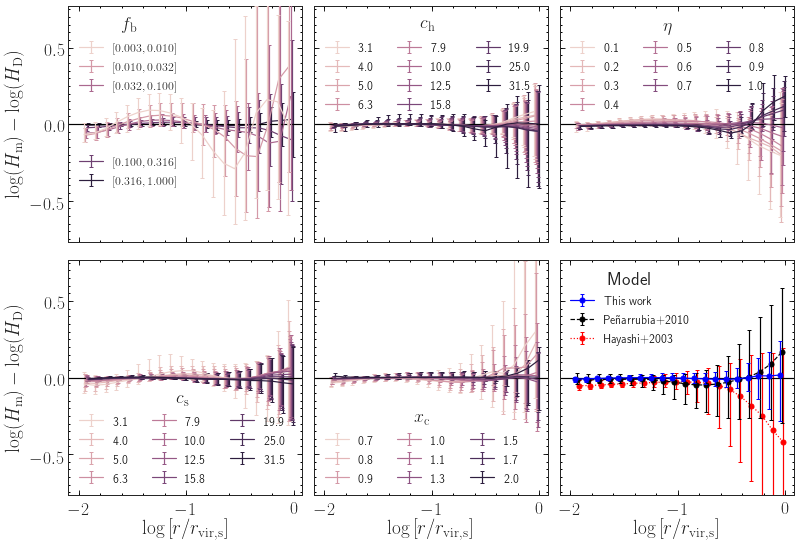

In [869]:
plot_resids_all(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe, fb_bins=5, logfb_min=-2.5, logfb_max=0.)

2635
6560
26256
155483
483403


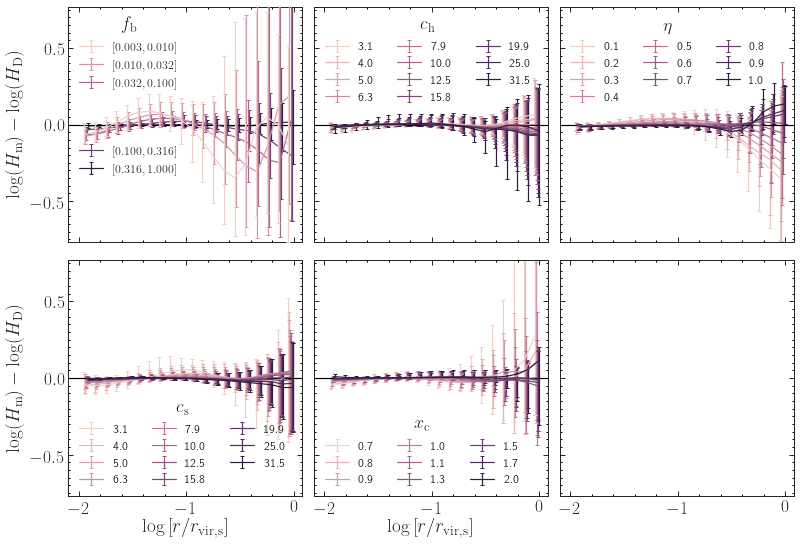

In [57]:
plot_resids_all(fp_v52_avgnfw_no1Rv_all_peris, paramet_hayashi_deluxe_v52, hayashi_deluxe, fb_bins=5, logfb_min=-2.5, logfb_max=0.)

1877
3509
9773
38305
171882
373604


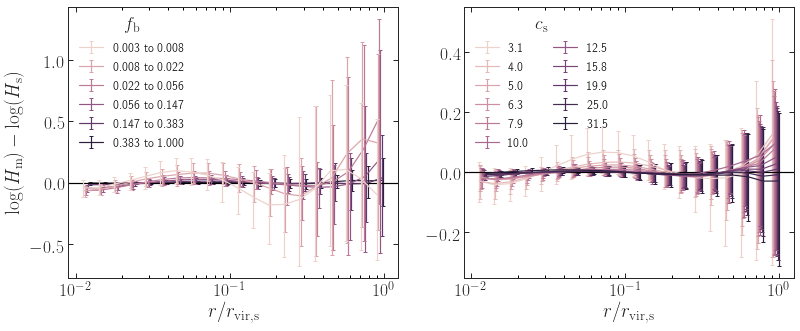

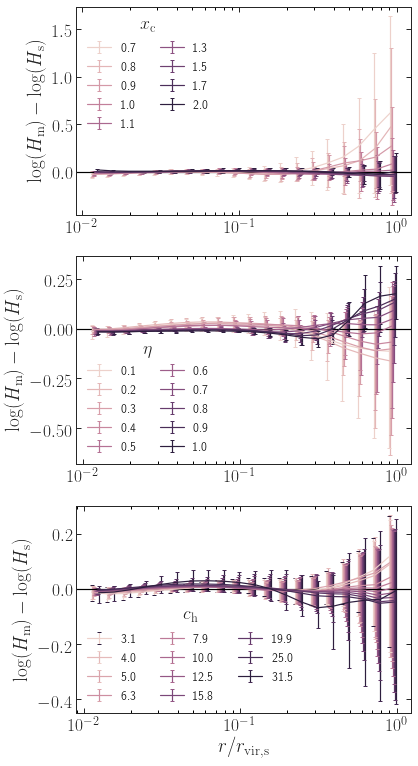

In [56]:
plot_resids_fb_cs(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe, fb_bins=6, logfb_min=-2.5, logfb_max=0.)
plot_resids_xc_eta_ch(fp_v52_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v52, hayashi_deluxe)
#plot_resids_xc_eta(fp_v52_avgnfw_no1Rv_subset, paramet_hayashi_deluxe_v52, hayashi_deluxe)

1877
3509
9773
38305
171882
343215


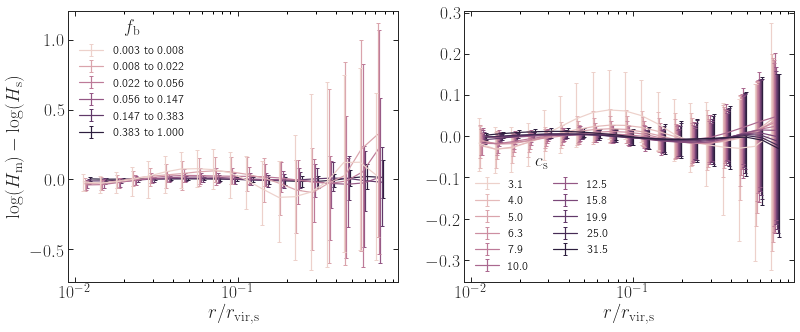

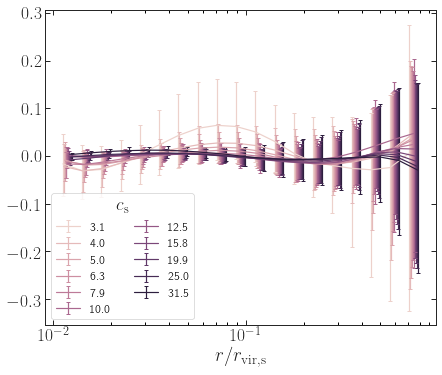

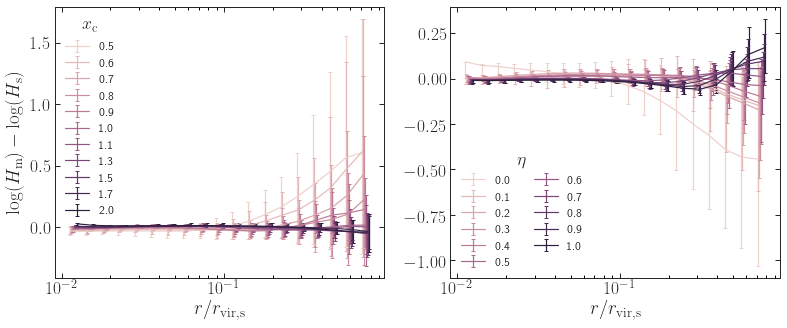

In [191]:
plot_resids_fb_cs(fp_v43_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe, fb_bins=6, logfb_min=-2.5, logfb_max=0.)
plot_resids_cs(fp_v43_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe)
plot_resids_xc_eta(fp_v43_avgnfw_no1Rv_all, paramet_hayashi_deluxe_v43, hayashi_deluxe_deluxe)
# this demonstrates that for low cs, our model on average overpredicts, so the slope doesn't drop off as fast as it should
# now, for high cs, it seems to do solid...
# this is likely an issue of ill-conditioning; why don't we try some of the simpler models once again?
# let's try doing the hayashi-type model (one power-law slope) before we keep working with this complex one

# if we threw out the lowest cs value, this would look pretty good. also it would look better if we didn't
# have such low fb values included in the mix
# it seems that overall, the shape suggests that the model underpredicts in the middle radii by a slight fraction
# and then it tends to correct

1877
3509
9773
38305
171882
343215


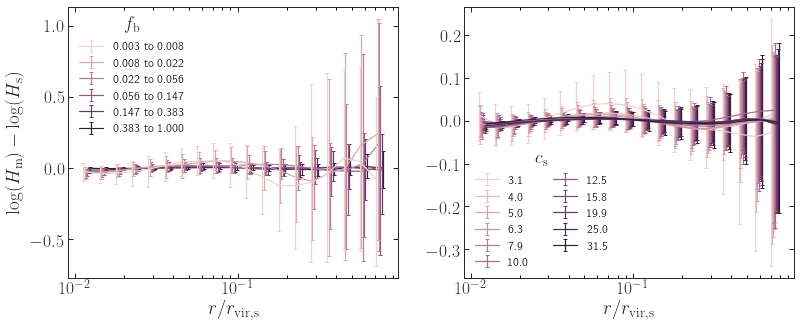

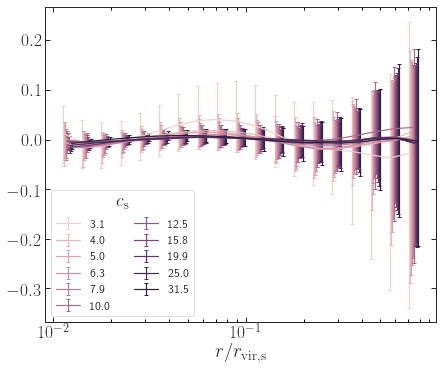

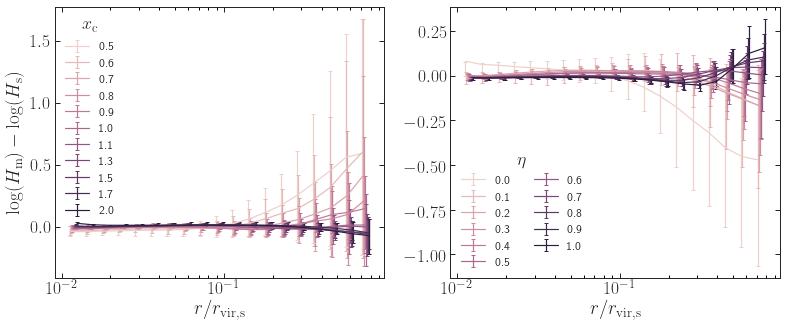

In [230]:
plot_resids_fb_cs(fp_v50_avgnfw_no1Rv_subset, paramet_hayashi_deluxe_v50, hayashi_deluxe_deluxe, fb_bins=6, logfb_min=-2.5, logfb_max=0.)
plot_resids_cs(fp_v50_avgnfw_no1Rv_subset, paramet_hayashi_deluxe_v50, hayashi_deluxe_deluxe)
plot_resids_xc_eta(fp_v50_avgnfw_no1Rv_subset, paramet_hayashi_deluxe_v50, hayashi_deluxe_deluxe)

1877
3509
9773
38305
171882
343215


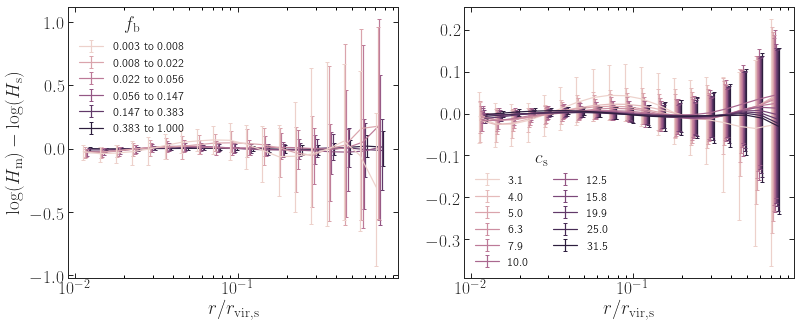

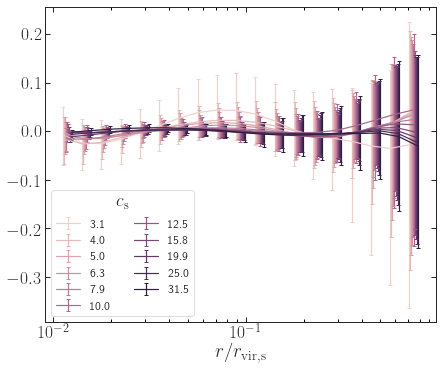

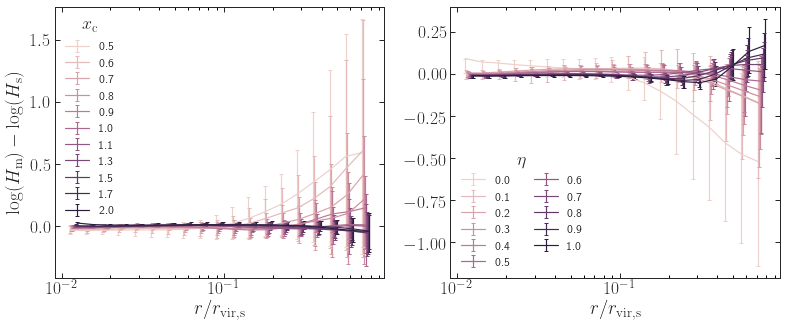

In [189]:
plot_resids_fb_cs(fp_plexp_v2_avgnfw_no1Rv_all, paramet_plexp_v2, powerlaw_exp, fb_bins=6, logfb_min=-2.5, logfb_max=0.)
plot_resids_cs(fp_plexp_v2_avgnfw_no1Rv_all, paramet_plexp_v2, powerlaw_exp)
plot_resids_xc_eta(fp_plexp_v2_avgnfw_no1Rv_all, paramet_plexp_v2, powerlaw_exp)
# the power-law-exp model looks SO MUCH BETTER HERE...
# let's try to add a bit more strength to parametrization and we might have the final product...
# we can try to see if we can get rid of 2% bias as well...

# the fact that neither of the different functional forms works makes me think that the issue 
# is related to the parametrization

# let's start out by looking at the TFs binned by various parameters and see if we can figure it out
# almost positive that it is weighting
# thus far, we are doing well with either powerlaw_exp v2 or paramet_hayashi_v43

# need to add in the fb=1 cases

184
327
1014
3894
17083
34349


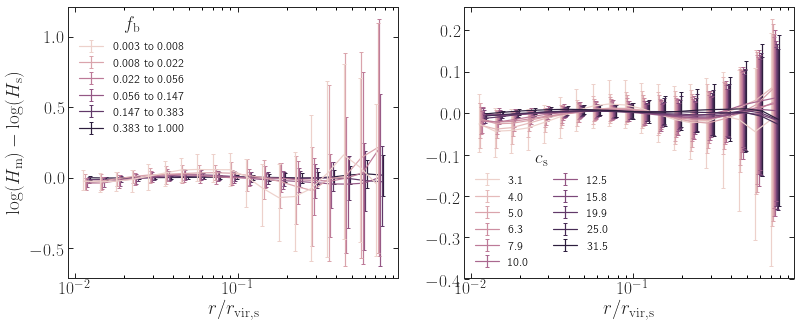

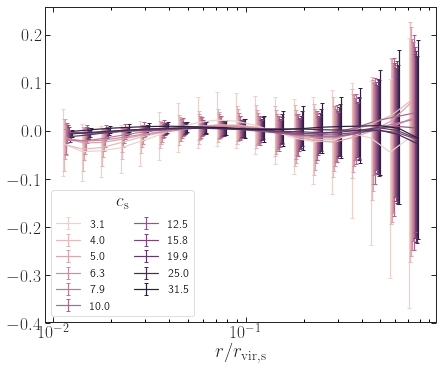

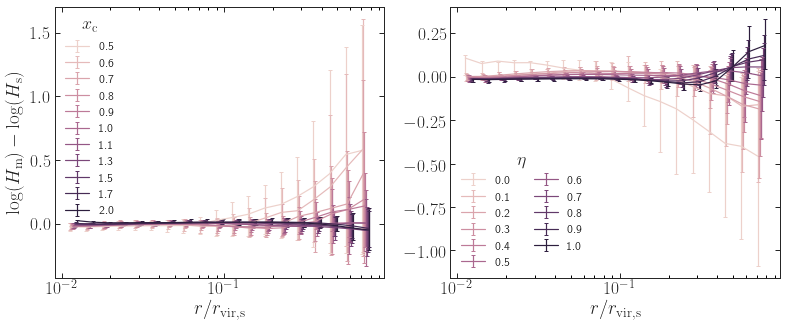

In [147]:
plot_resids_fb_cs(fp_plexp_v2_avgnfw_no1Rv_subset_pdfweighted, paramet_plexp_v2, powerlaw_exp, fb_bins=6, logfb_min=-2.5, logfb_max=0.)
plot_resids_cs(fp_plexp_v2_avgnfw_no1Rv_subset_pdfweighted, paramet_plexp_v2, powerlaw_exp)
plot_resids_xc_eta(fp_plexp_v2_avgnfw_no1Rv_subset_pdfweighted, paramet_plexp_v2, powerlaw_exp)

In [ ]:
#frank thinks that the final model should not depend on f_t or c_s since those quantities are built into our modle
#however, we need to weight appropriately for this to be the case...
#Clearly, for most values of c_s, we're good, but the lowest value is poorly constraints
#However, for low f_b, the model performs really badly, and this is what throws things off

## Monte Carlo profiling of the parameter space

In [ ]:
##### below is what ours will look like
#ndim is the dimensionality of the space
#this should all work properly... let's try it out with the test case and then apply it to this
ndim = len(fp_exp_subset)
nwalkers = 26
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnlik, args=[fp_exp_subset, exp_decay_v3, False, True], threads=3)
fp_ic = 0.1*np.random.rand(ndim * nwalkers).reshape((nwalkers, ndim)) + fp_exp_subset #gaussian distribute about these values with sigma=0.05 or so?

In [ ]:
sampler.run_mcmc(fp_ic, 2, storechain=False)
#sampling the distribution in 100 timesteps using 150 walkers

In [167]:
nsteps = 1000
for i, result in enumerate(sampler.sample(fp_ic, iterations=nsteps)):
    if (i+1) % 2 == 0:
        print("{0:5.1%}".format(float(i) / nsteps))

 0.1%
 0.3%
 0.5%
 0.7%
 0.9%
 1.1%
 1.3%
 1.5%
 1.7%
 1.9%
 2.1%
 2.3%
 2.5%
 2.7%
 2.9%
 3.1%
 3.3%
 3.5%
 3.7%
 3.9%
 4.1%
 4.3%
 4.5%
 4.7%
 4.9%
 5.1%
 5.3%
 5.5%
 5.7%
 5.9%
 6.1%
 6.3%
 6.5%
 6.7%
 6.9%
 7.1%
 7.3%
 7.5%
 7.7%
 7.9%
 8.1%
 8.3%
 8.5%
 8.7%
 8.9%
 9.1%
 9.3%
 9.5%
 9.7%
 9.9%
10.1%
10.3%
10.5%
10.7%
10.9%
11.1%
11.3%
11.5%
11.7%
11.9%
12.1%
12.3%
12.5%
12.7%
12.9%
13.1%
13.3%
13.5%
13.7%
13.9%
14.1%
14.3%
14.5%
14.7%
14.9%
15.1%
15.3%
15.5%
15.7%
15.9%
16.1%
16.3%
16.5%
16.7%
16.9%
17.1%
17.3%
17.5%
17.7%
17.9%
18.1%
18.3%
18.5%
18.7%
18.9%
19.1%
19.3%
19.5%
19.7%
19.9%
20.1%
20.3%
20.5%
20.7%
20.9%
21.1%
21.3%
21.5%
21.7%
21.9%
22.1%
22.3%
22.5%
22.7%
22.9%
23.1%
23.3%
23.5%
23.7%
23.9%
24.1%
24.3%
24.5%
24.7%
24.9%
25.1%
25.3%
25.5%
25.7%
25.9%
26.1%
26.3%
26.5%
26.7%
26.9%
27.1%
27.3%
27.5%
27.7%
27.9%
28.1%
28.3%
28.5%
28.7%
28.9%
29.1%
29.3%
29.5%
29.7%
29.9%
30.1%
30.3%
30.5%
30.7%
30.9%
31.1%
31.3%
31.5%
31.7%
31.9%
32.1%
32.3%
32.5%
32.7%
32.9%
33.1%
33.3

In [168]:
sampler.flatchain.shape

(100000, 10)

In [169]:
mcmc_parms = np.median(sampler.flatchain,axis=0)
print(mcmc_parms)

[ 0.22481537  0.80904269  1.2668949   0.4141474   1.8826509   1.36969871
 -0.1003234  -1.6201016   0.28336381 -0.51483918]


In [6]:
#flatchain = np.loadtxt('/home/sbg/chain.dat')[:,1:]
flatchain = np.load('/home/sbg/mcmc_chain_error0.003_datset_fit_dat_iso_fullR_apos.npz.npy')
ndim = flatchain.shape[1]
print(flatchain.shape[0])
#clearly the best fit values are very sensitive to the errors
#if the errors are purely based on the number of particles per band
#and my prefactors are correct
#then these best fits are extremely precise, with extremely small errors
#thus, if we want to make the model better
#we need to come up with a better prescription, or go to random forests

500000


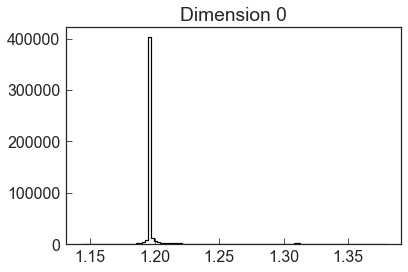

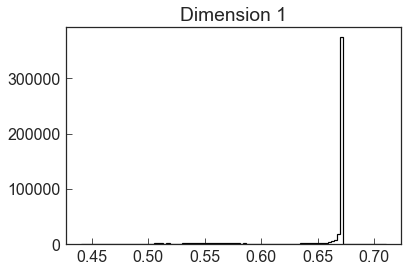

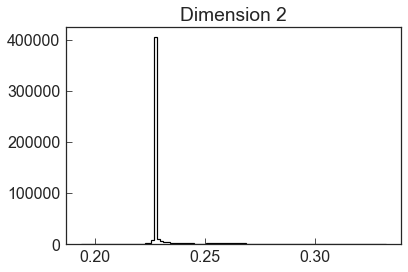

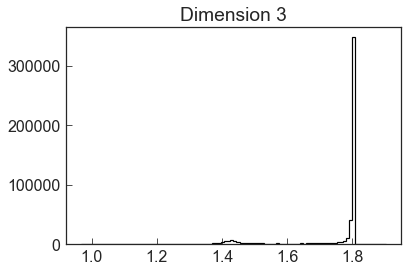

In [7]:
for i in range(ndim):
    plt.figure()
    plt.hist(flatchain[:,i], 100, color="k", histtype="step", linewidth=1.2)
    plt.title("Dimension {0:d}".format(i))

In [119]:
np.median(flatchain,axis=0)

array([1.19679672, 0.67083777, 0.22755477, 1.79954558])

In [46]:
0.317 / 0.722

0.4390581717451524

In [43]:
np.max(flatchain[:,1])

0.5083403563018233

In [44]:
fc = pd.DataFrame(data=flatchain,columns=range(0,ndim))

In [ ]:
sns.pairplot(fc)

In [134]:
fp_exp_v3_rmse
test = [1.3131102,0.5083403563018233,0.257,1.5]

In [124]:
print(cost(fp_exp_v3_rmse, paramet_exp_v3, exp_decay_v3, False, True))

5529705606.1922455


In [135]:
print(cost(test, paramet_exp_v3, exp_decay_v3, False, True))

5460464512.458582


/home/sbg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: pandas.scatter_matrix is deprecated. Use pandas.plotting.scatter_matrix instead
  """Entry point for launching an IPython kernel.


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff61427a550>,
      dtype=object)

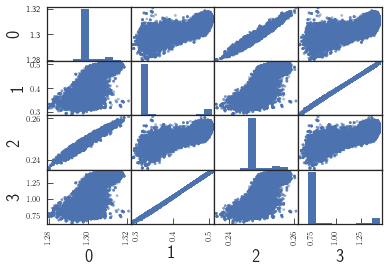

In [45]:
pd.scatter_matrix(fc)

## Looking into power law slope dependence on log(f_b)

In [469]:
# we're going to calculate dlog(rho)/dlog(r) at a large radius
# bin by log(fb) and see how things look
# how does dlog(rho)/dlog(r) depend on log(fb)
# does it depend on r?
rad_bin = 10
print(fit_rads[rad_bin])
dlogrho_dlogr = (np.log10(dat_for_fit[:, 5+rad_bin+1]) - np.log10(
    dat_for_fit[:, 5+rad_bin])) / (np.log10(fit_rads[rad_bin+1]) - np.log10(fit_rads[rad_bin]))
dlogrho_dlogr = np.column_stack((dat_for_fit[:, 4], dlogrho_dlogr))

dlogrho_dlogr = dlogrho_dlogr[~np.logical_or(
    np.isnan(dlogrho_dlogr[:, 1]), np.abs(dlogrho_dlogr[:, 1]) == np.inf)]

0.1122018


C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in log10
  import sys
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in subtract
  


-17.53585531413891


(array([1.0000e+00, 2.0000e+00, 4.0000e+00, 2.0000e+00, 3.0000e+00,
        7.0000e+00, 2.6000e+01, 2.0200e+02, 5.6580e+03, 5.1038e+04]),
 array([-17.53585531, -15.72710416, -13.91835301, -12.10960187,
        -10.30085072,  -8.49209957,  -6.68334842,  -4.87459727,
         -3.06584612,  -1.25709497,   0.55165618]),
 <a list of 10 Patch objects>)

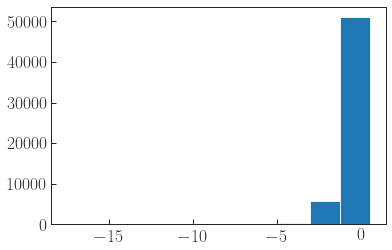

In [470]:
print(np.min(dlogrho_dlogr))
plt.hist(dlogrho_dlogr[:,1])

In [471]:
def plot_slope_dist(rad_bin):  # will modify this to take arguments of different radii
    print('fitting for r/rvir =  %.3f' % fit_rads[rad_bin])
    dlogrho_dlogr = (np.log10(dat_for_fit[:, 5+rad_bin+1]) - np.log10(
        dat_for_fit[:, 5+rad_bin])) / (np.log10(fit_rads[rad_bin+1]) - np.log10(fit_rads[rad_bin]))
    dlogrho_dlogr = np.column_stack((dat_for_fit[:, 4], dlogrho_dlogr))

    dlogrho_dlogr = dlogrho_dlogr[~np.logical_or(
        np.isnan(dlogrho_dlogr[:, 1]), np.abs(dlogrho_dlogr[:, 1]) == np.inf)]
    num_bins = 15  # in log(fb)
    fb_bin_edges = np.logspace(-3., 0., num_bins+1)
    fb_bin_centers = 10**((np.log10(fb_bin_edges[1:]) +
                           np.log10(fb_bin_edges[:-1]))*0.5)
    dist_means = np.zeros(num_bins)
    dist_low16 = np.zeros(num_bins)
    dist_low2 = np.zeros(num_bins)
    dist_high84 = np.zeros(num_bins)
    dist_high97 = np.zeros(num_bins)
    for i in range(0, num_bins):
        dist = dlogrho_dlogr[np.logical_and(
            dlogrho_dlogr[:, 0] >= fb_bin_edges[i], dlogrho_dlogr[:, 0] < fb_bin_edges[i+1])]
        dist_means[i] = np.mean(dist[:, 1])
        dist_low16[i] = dist_means[i] - np.percentile(dist[:, 1], 16)
        dist_low2[i] = dist_means[i] - np.percentile(dist[:, 1], 2.26)
        dist_high84[i] = np.percentile(dist[:, 1], 84) - dist_means[i]
        dist_high97[i] = np.percentile(dist[:, 1], 97.74) - dist_means[i]

    fig, ax = plot(semilogx=True)  # plotting dlogrho_dlogr vs. logfb
    plt.errorbar(fb_bin_centers, dist_means, yerr=[
                 dist_low16, dist_high84], label='16/84')
    plt.errorbar(fb_bin_centers, dist_means, yerr=[
                 dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    plt.xlabel(r'$f_b$')
    plt.ylabel(r'$d\log \rho / d \log r$')
    plt.legend()

fitting for r/rvir =  0.112


C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log10
  after removing the cwd from sys.path.
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in subtract
  after removing the cwd from sys.path.


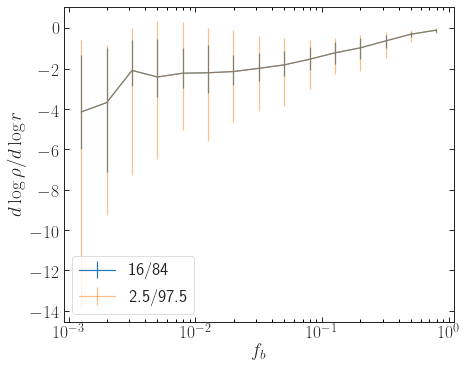

In [473]:
plot_slope_dist(10)

In [474]:
# plot dlog(rho)/dlog(r) vs. f_b
def plot_slopes_vs_r(): 
    fig, ax = plot(semilogx=True)  # plotting dlogrho_dlogr vs. logfb
    dlogrho_dlogr = (np.log10(dat_for_fit[:, 5+1:]) - np.log10(
        dat_for_fit[:, 5:-1])) / (np.log10(fit_rads[1:]) - np.log10(fit_rads[:-1]))
    dlogrho_dlogr = np.column_stack((dat_for_fit[:, 4], dlogrho_dlogr))

    dlogrho_dlogr = dlogrho_dlogr[~np.logical_or(
        np.isnan(dlogrho_dlogr[:, 1]), np.abs(dlogrho_dlogr[:, 1]) == np.inf)]
    num_fb_bins = 5  # in log(fb)
    num_rad_bins = len(fit_rads) - 1
    rad_bin_centers = 10**((np.log10(fit_rads[1:]) +
                           np.log10(fit_rads[:-1]))*0.5)
    fb_bin_edges = np.logspace(-3., 0., num_fb_bins+1)
    fb_bin_centers = 10**((np.log10(fb_bin_edges[1:]) +
                           np.log10(fb_bin_edges[:-1]))*0.5)
    for i in range(0, num_fb_bins): #loop over bound fraction bin
        
        dist_median = np.zeros(num_rad_bins)
        dist_low16 = np.zeros(num_rad_bins)
        dist_low2 = np.zeros(num_rad_bins)
        dist_high84 = np.zeros(num_rad_bins)
        dist_high97 = np.zeros(num_rad_bins)
        for j in range(0, num_rad_bins):
            dist = dlogrho_dlogr[np.logical_and(
                dlogrho_dlogr[:, 0] >= fb_bin_edges[i], dlogrho_dlogr[:, 0] < fb_bin_edges[i+1])][:,[0,j+1]]
            dist_median[j] = np.median(dist[:, 1])
            dist_low16[j] = dist_median[j] - np.percentile(dist[:, 1], 16)
            dist_low2[j] = dist_median[j] - np.percentile(dist[:, 1], 2.26)
            dist_high84[j] = np.percentile(dist[:, 1], 84) - dist_median[j]
            dist_high97[j] = np.percentile(dist[:, 1], 97.74) - dist_median[j]
        plt.errorbar(rad_bin_centers, dist_median, yerr=[
                 dist_low16, dist_high84], fmt='-*', label='%.3f to %.3f' % (fb_bin_edges[i],fb_bin_edges[i+1]))
        #plt.errorbar(rad_bin_centers, dist_median, yerr=[
        #         dist_low2, dist_high97], alpha=0.5, label='2.5/97.5')
    plt.xlabel(r'$r/r_{vir,s}$')
    plt.ylabel(r'$d\log (\textrm{TF})/ d \log r$')
    plt.legend(title=r'$f_b$')
    plt.ylim(-5,0)
    plt.xlim(radii[10],1.)

C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log10
  after removing the cwd from sys.path.
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log10
  """
C:\Users\leets\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in subtract
  """
C:\Users\leets\Anaconda3\lib\site-packages\numpy\lib\function_base.py:3405: RuntimeWarning: Invalid value encountered in median
  r = func(a, **kwargs)
C:\Users\leets\Anaconda3\lib\site-packages\numpy\lib\function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
C:\Users\leets\Anaconda3\lib\site-packages\numpy\lib\function_base.py:3942: RuntimeWarning: invalid value encountered in multiply
  x2 = take(ap, indices_above, axis=axis) * weights_above


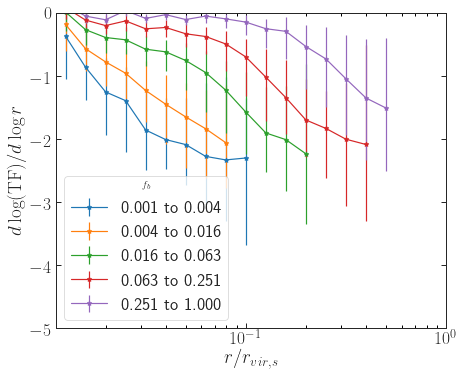

In [475]:
plot_slopes_vs_r()

#I BET THAT THIS LOOKS DIFFERENT IF YOU DO IT AS R/RS...
#obviously the closer you get to the outer radii, the deeper it is going to get, because you have
#high c_s values halos dropping off more at the outer virial radii... need to figure out how to plot this vs.
#r_s instead...

# this really suggests that an exponential model would fit in well...